In [1]:
import numpy as np
import xarray as xr
import pandas as pd
import os.path as op
import xrft
import dask.array as dsar
from dask.diagnostics import ProgressBar
from scipy.io import loadmat
from scipy.interpolate import PchipInterpolator as pchip
from scipy.interpolate import interp1d
from xmitgcm import open_mdsdataset
from xgcm.grid import Grid
from matplotlib.colors import LogNorm, SymLogNorm
from matplotlib import gridspec as gspec
import matplotlib.pyplot as plt
%matplotlib inline

In [2]:
ddir = '/swot/SUM02/channel_seasonality/'
bdir = '/swot/SUM02/takaya/channelMOC-Darwin/'

In [3]:
f0 = -1.1e-4
beta = 1.4e-11
g = 9.81
r0 = 1e3
alpha = 2e-4

In [4]:
ys, dy = (4,1)
dt = 4e1
# df = 288
ts = int(360*86400*(ys+.5)/dt)
te = int(ts+360*86400*dy/dt)
print(ts,te)

3499200 4276800


In [5]:
ds = open_mdsdataset(op.join(ddir,'Dalma_Dar02km/runs'), 
#                     grid_dir=op.join(ddir,'02km_grid'),
                    iters=range(ts+2160,te+2160,2160),
                    prefix=[
                           'PPtave',
                           'PTRtave','MOMtave'],
                    delta_t=dt
                    )
ds

<xarray.Dataset>
Dimensions:   (XC: 500, XG: 500, YC: 1000, YG: 1000, Z: 76, Zl: 76, Zp1: 77, Zu: 76, time: 360)
Coordinates:
    iter      (time) int64 dask.array<shape=(360,), chunksize=(1,)>
  * time      (time) float64 1.401e+08 1.401e+08 ... 1.71e+08 1.711e+08
  * XC        (XC) >f4 1000.0 3000.0 5000.0 ... 995000.0 997000.0 999000.0
  * YC        (YC) >f4 1000.0 3000.0 5000.0 ... 1995000.0 1997000.0 1999000.0
  * XG        (XG) >f4 0.0 2000.0 4000.0 6000.0 ... 994000.0 996000.0 998000.0
  * YG        (YG) >f4 0.0 2000.0 4000.0 ... 1994000.0 1996000.0 1998000.0
  * Z         (Z) >f4 -0.5 -1.57 -2.79 -4.185 ... -2625.955 -2757.325 -2912.665
  * Zp1       (Zp1) >f4 0.0 -1.0 -2.14 -3.44 ... -2689.32 -2825.33 -3000.0
  * Zu        (Zu) >f4 -1.0 -2.14 -3.44 -4.93 ... -2689.32 -2825.33 -3000.0
  * Zl        (Zl) >f4 0.0 -1.0 -2.14 -3.44 ... -2562.59 -2689.32 -2825.33
    rA        (YC, XC) >f4 dask.array<shape=(1000, 500), chunksize=(1000, 500)>
    dxG       (YG, XC) >f4 dask.array<sha

/home/takaya/xmitgcm/xmitgcm/utils.py:314: UserWarning: Not sure what to do with rlev = L
  warnings.warn("Not sure what to do with rlev = " + rlev)


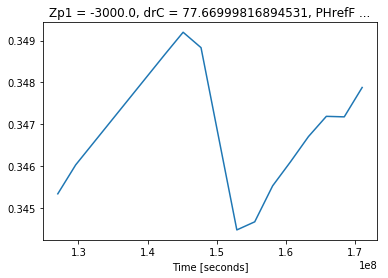

In [186]:
dstest = open_mdsdataset(op.join(ddir,'Dalma_Dar02km/runs'), 
#                        grid_dir=op.join(ddir,'02km_grid'),
#                        iters=range(ts+64800,te+64800,64800),
                       prefix=[
                              'PTRtave03',
#                               'PTRtave26'
                              ],
                       delta_t=dt
                       )
(dstest.PTRtave03*dstest.drF/np.abs(dstest.Zp1[-1])*1e3).sel(YC=slice(6e5,14e5)).sum('Z').mean(['YC','XC']).plot()

In [7]:
dsphy = open_mdsdataset(op.join(ddir,'Dalma_Dar02km/runs'), 
#                        grid_dir=op.join(ddir,'02km_grid'),
                       iters=range(ts+64800,te+64800,64800),
                       prefix=['Ttave',
                              'wVeltave',
                              'uVeltave','vVeltave'],
                       delta_t=dt
                       )
dsptr = open_mdsdataset(op.join(ddir,'Dalma_Dar02km/runs'), 
#                        grid_dir=op.join(ddir,'02km_grid'),
                       iters=range(ts+64800,te+64800,64800),
                       prefix=[
                              'PTRtave01','PTRtave02','PTRtave03','PTRtave04',
                              'PTRtave08','PTRtave12','PTRtave22','PTRtave23'
#                               'PTRtave26'
                              ],
                       delta_t=dt
                       )
dsphy.coords['seas'] = ('time',np.tile(np.repeat(np.roll(range(4),-2),3),dy))
dsptr.coords['seas'] = ('time',np.tile(np.repeat(np.roll(range(4),-2),3),dy))
dsphy.coords['month'] = ('time',np.tile(np.roll(range(12),-6),dy))
dsptr.coords['month'] = ('time',np.tile(np.roll(range(12),-6),dy))
dsphy

<xarray.Dataset>
Dimensions:   (XC: 500, XG: 500, YC: 1000, YG: 1000, Z: 76, Zl: 76, Zp1: 77, Zu: 76, time: 12)
Coordinates:
  * XC        (XC) >f4 1000.0 3000.0 5000.0 ... 995000.0 997000.0 999000.0
  * YC        (YC) >f4 1000.0 3000.0 5000.0 ... 1995000.0 1997000.0 1999000.0
  * XG        (XG) >f4 0.0 2000.0 4000.0 6000.0 ... 994000.0 996000.0 998000.0
  * YG        (YG) >f4 0.0 2000.0 4000.0 ... 1994000.0 1996000.0 1998000.0
  * Z         (Z) >f4 -0.5 -1.57 -2.79 -4.185 ... -2625.955 -2757.325 -2912.665
  * Zp1       (Zp1) >f4 0.0 -1.0 -2.14 -3.44 ... -2689.32 -2825.33 -3000.0
  * Zu        (Zu) >f4 -1.0 -2.14 -3.44 -4.93 ... -2689.32 -2825.33 -3000.0
  * Zl        (Zl) >f4 0.0 -1.0 -2.14 -3.44 ... -2562.59 -2689.32 -2825.33
    rA        (YC, XC) >f4 dask.array<shape=(1000, 500), chunksize=(1000, 500)>
    dxG       (YG, XC) >f4 dask.array<shape=(1000, 500), chunksize=(1000, 500)>
    dyG       (YC, XG) >f4 dask.array<shape=(1000, 500), chunksize=(1000, 500)>
    Depth     (YC, XC)

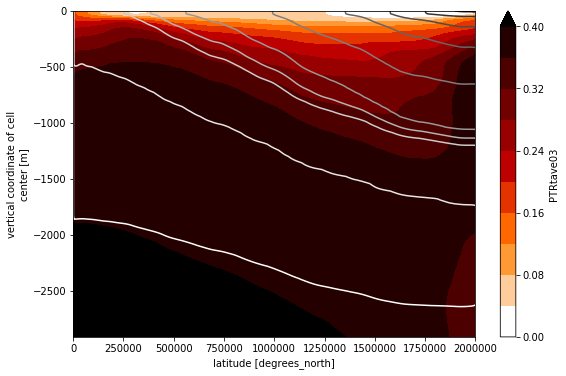

In [187]:
fig,ax = plt.subplots(figsize=(9,6))
(dsptr.PTRtave03.mean(['time','XC'])*1e3).plot.contourf(ax=ax, levels=np.linspace(0,.4,11),
                                                        cmap='gist_heat_r')
dsphy.Ttave[-120:].mean(['time','XC']).plot.contour(ax=ax, levels=np.linspace(0,8,11),
                                                    cmap='binary')

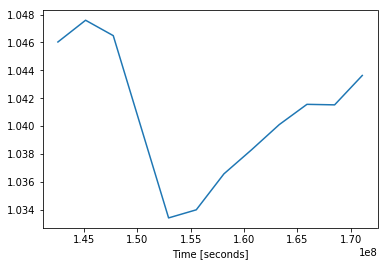

In [184]:
(dsptr.PTRtave03*dsptr.drF).sel(YC=slice(6e5,14e5)).sum('Z').mean(['YC','XC']).plot()

In [20]:
dsnap = dsphy = open_mdsdataset(op.join(ddir,'Dalma_Dar02km/runs'), 
        #                        grid_dir=op.join(ddir,'02km_grid'),
                               iters=range(ts,te+32400,32400),
                               prefix=['U','V'],
                               delta_t=dt
                               )
dsnap

<xarray.Dataset>
Dimensions:  (XC: 500, XG: 500, YC: 1000, YG: 1000, Z: 76, Zl: 76, Zp1: 77, Zu: 76, time: 25)
Coordinates:
  * XC       (XC) >f4 1000.0 3000.0 5000.0 7000.0 ... 995000.0 997000.0 999000.0
  * YC       (YC) >f4 1000.0 3000.0 5000.0 ... 1995000.0 1997000.0 1999000.0
  * XG       (XG) >f4 0.0 2000.0 4000.0 6000.0 ... 994000.0 996000.0 998000.0
  * YG       (YG) >f4 0.0 2000.0 4000.0 6000.0 ... 1994000.0 1996000.0 1998000.0
  * Z        (Z) >f4 -0.5 -1.57 -2.79 -4.185 ... -2625.955 -2757.325 -2912.665
  * Zp1      (Zp1) >f4 0.0 -1.0 -2.14 -3.44 ... -2689.32 -2825.33 -3000.0
  * Zu       (Zu) >f4 -1.0 -2.14 -3.44 -4.93 ... -2689.32 -2825.33 -3000.0
  * Zl       (Zl) >f4 0.0 -1.0 -2.14 -3.44 ... -2562.59 -2689.32 -2825.33
    rA       (YC, XC) >f4 dask.array<shape=(1000, 500), chunksize=(1000, 500)>
    dxG      (YG, XC) >f4 dask.array<shape=(1000, 500), chunksize=(1000, 500)>
    dyG      (YC, XG) >f4 dask.array<shape=(1000, 500), chunksize=(1000, 500)>
    Depth    (YC, XC

In [31]:
u = dsnap.U
u.coords['month'] = ('time',np.append(np.repeat(np.roll(np.arange(12),6),2),6))
v = dsnap.V
v.coords['month'] = ('time',np.append(np.repeat(np.roll(np.arange(12),6),2),6))
ub = dsphy.uVeltave
ub.coords['month'] = ('time',np.tile(np.roll(range(12),-6),dy))
vb = dsphy.vVeltave
vb.coords['month'] = ('time',np.tile(np.roll(range(12),-6),dy))
up = u.groupby('month') - ub.groupby('month').mean(['time','XG'])
vp = v.groupby('month') - vb.groupby('month').mean(['time','XC'])
with ProgressBar():
    EKE = .5*(grid.interp(up[:,0],'X')**2+grid.interp(vp[:,0],'Y',boundary='fill')**2).mean(['time','XC']).compute()
EKE

[########################################] | 100% Completed |  1min 27.1s


<xarray.DataArray (YC: 1000)>
array([0.      , 0.000529, 0.001671, ..., 0.001958, 0.00152 , 0.000366],
      dtype=float32)
Coordinates:
  * YC       (YC) >f4 1000.0 3000.0 5000.0 ... 1995000.0 1997000.0 1999000.0

In [ ]:
dslyr = open_mdsdataset('/swot/SUM02/takaya/channelMOC-Darwin/02km_layers/', 
#                        grid_dir=op.join(ddir,'Dalma_Dar02km/runs'),
                       iters=range(ts+64800,te+64800,64800),
                       prefix=['LAYERS-transport'],
                       delta_t=dt
                       )
dslyr

In [144]:
gridlyr = Grid(dslyr, periodic=['X'])
with ProgressBar():
    psi_clim = -gridlyr.cumsum((dslyr.LaVH1TH.mean('time')*dslyr.dxG).sum('XC'),
                               '1TH', boundary='fill'
                               ).rename('psi').compute()
    
def get_layer_depths(ds, dim, grid, layers_name='1TH', point='s'):
    lprefix = 'layer_' + layers_name
    vname = 'LaH' + point + layers_name
    mn_thkns = ds[vname].mean(['time','XC'])
    
    # this represents the depth of the layers1TH_bounds points
    # (used as the boundaries of the center values)
    zb = xr.DataArray(grid.cumsum(mn_thkns[::-1], '1TH', boundary='fill')[::-1].data,
                     dims=['layer_1TH_bounds','YG'],
                     coords={'layer_1TH_bounds':ds.layer_1TH_bounds,'YG':ds.YG}
                     )
    
    # and this is the depth of the layers1TH_center points
    # (used as the boundaries of the interface values)
    zc = grid.interp(zb,'1TH',boundary='fill')
    
    # the interface depths
    zi = zb[1:-1].rename({lprefix+'_bounds': lprefix+'_interface'})
    
    z= {lprefix + '_bounds': zb,
        lprefix + '_center': zc,
        lprefix + '_interface': zi}
    return z[dim]

z = -get_layer_depths(dslyr, psi_clim.dims[0], gridlyr, layers_name='1TH')
y = np.tile(dslyr.YC.values[np.newaxis,:], (z.shape[0],1))
psi_clim.coords['z'] = (('layer_1TH_bounds','YG'),z)
psi_clim.coords['y'] = (('layer_1TH_bounds','YG'),y)
psi_clim

[########################################] | 100% Completed |  0.1s
[########################################] | 100% Completed |  0.1s
[########################################] | 100% Completed |  0.1s
[########################################] | 100% Completed |  6.8s


<xarray.DataArray 'psi' (layer_1TH_bounds: 43, YG: 1000)>
array([[-0.000000e+00, -0.000000e+00, -0.000000e+00, ..., -0.000000e+00,
        -0.000000e+00, -0.000000e+00],
       [-0.000000e+00, -0.000000e+00, -3.657207e+02, ..., -1.627863e+03,
        -1.902126e+03, -8.907479e+02],
       [-0.000000e+00, -0.000000e+00, -1.316785e+02, ...,  8.610776e+02,
         8.657795e+02,  1.212172e+02],
       ...,
       [-0.000000e+00, -0.000000e+00,  3.076996e+00, ..., -1.405455e+03,
        -7.984675e+02, -3.223753e+02],
       [-0.000000e+00, -0.000000e+00,  3.076996e+00, ...,  4.726318e+00,
         3.141663e+00,  1.566650e+00],
       [-0.000000e+00, -0.000000e+00,  3.076996e+00, ...,  4.726318e+00,
         3.141663e+00,  1.566650e+00]], dtype=float32)
Coordinates:
  * layer_1TH_bounds  (layer_1TH_bounds) >f4 -0.2 0.0 0.2 0.4 0.6 0.8 1.0 ...
  * YG                (YG) >f4 0.0 2000.0 4000.0 6000.0 8000.0 10000.0 ...
    z                 (layer_1TH_bounds, YG) float32 -0.0 -0.0 -2985.0 ...
 

/home/takaya/miniconda3/envs/uptodate/lib/python3.6/site-packages/matplotlib/figure.py:2299: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  warnings.warn("This figure includes Axes that are not compatible "


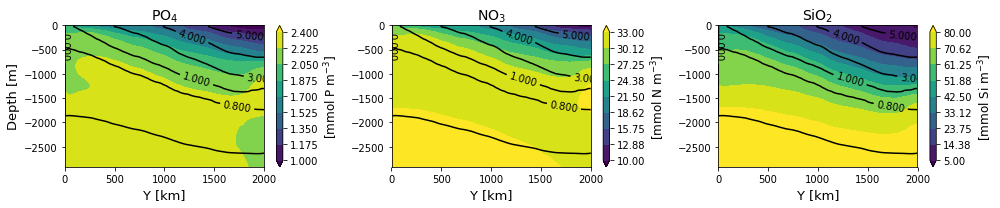

In [472]:
# psilevs = np.linspace(-1,0,5)
tlevs = np.array([0,.8,1,3,4,5])

fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(14,3))
fig.set_tight_layout(True)
im1 = axes[0].contourf(dsptr.YC*1e-3, dsptr.Z, dsptr.PTRtave01.mean(['time','XC']),
                        levels=np.linspace(1.,2.4,9), extend='both')
im2 = axes[1].contourf(dsptr.YC*1e-3, dsptr.Z, dsptr.PTRtave02.mean(['time','XC']),
                        levels=np.linspace(10,33,9), extend='both')
im3 = axes[2].contourf(dsptr.YC*1e-3, dsptr.Z, dsptr.PTRtave04.mean(['time','XC']),
                        levels=np.linspace(5.,80.,9), extend='both')
# im4 = axes[1,1].contourf(dsptr.YC*1e-3, dsptr.Z, dsptr.PTRtave03.mean(['time','XC'])*1e3,
#                         levels=np.linspace(0,.4,9), extend='both')
cs1 = axes[0].contour(dsphy.YC*1e-3, dsphy.Z, dsphy.Ttave.mean(['time','XC']), 
                       levels=tlevs, colors='k')
cs2 = axes[1].contour(dsphy.YC*1e-3, dsphy.Z, dsphy.Ttave.mean(['time','XC']), 
                       levels=tlevs, colors='k')
cs3 = axes[2].contour(dsphy.YC*1e-3, dsphy.Z, dsphy.Ttave.mean(['time','XC']), 
                       levels=tlevs, colors='k')
# cs4 = axes[1,1].contour(dsphy.YC*1e-3, dsphy.Z, dsphy.Ttave.mean(['time','XC']), 
#                        levels=tlevs, colors='k')
axes[0].set_title(r"PO$_4$", fontsize=14)
axes[1].set_title(r"NO$_3$", fontsize=14)
axes[2].set_title(r"SiO$_2$", fontsize=14)
# axes[1,1].set_title(r"Fe", fontsize=15)
axes[0].set_ylabel(r"Depth [m]", fontsize=13)
# axes[1,0].set_ylabel(r"Depth [m]", fontsize=13)
axes[0].set_xlabel(r"Y [km]", fontsize=13)
axes[1].set_xlabel(r"Y [km]", fontsize=13)
axes[2].set_xlabel(r"Y [km]", fontsize=13)
axes[0].set_ylim([dsptr.Z[-1],0])
axes[1].set_ylim([dsptr.Z[-1],0])
axes[2].set_ylim([dsptr.Z[-1],0])
# axes[1,1].set_ylim([dsptr.Z[-1],0])
plt.clabel(cs1, inline=1, fontsize=10)
plt.clabel(cs2, inline=1, fontsize=10)
plt.clabel(cs3, inline=1, fontsize=10)
plt.clabel(cs4, inline=1, fontsize=10)
cb1 = fig.colorbar(im1, ax=axes[0])
cb2 = fig.colorbar(im2, ax=axes[1])
cb3 = fig.colorbar(im3, ax=axes[2])
# cb4 = fig.colorbar(im4, ax=axes[1,1])
cb1.set_label(r"[mmol P m$^{-3}$]",fontsize=12)
cb2.set_label(r"[mmol N m$^{-3}$]",fontsize=12)
cb3.set_label(r"[mmol Si m$^{-3}$]",fontsize=12)
# cb4.set_label(r"[$\mu$mol Fe m$^{-3}$]",fontsize=12)
plt.savefig(op.join(ddir,'Dalma_Dar02km/Figures/PNSi-transect_02km.pdf'))

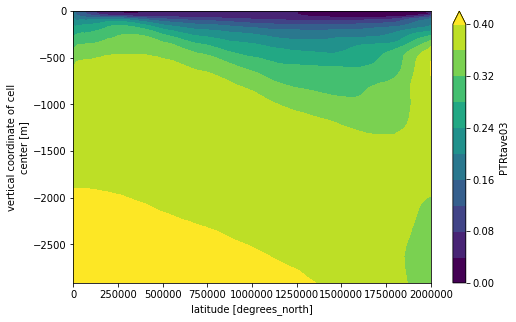

In [615]:
(dsptr.PTRtave03.mean(['time','XC'])*1e3).plot.contourf(figsize=(8,5), levels=np.linspace(0,.4,11))

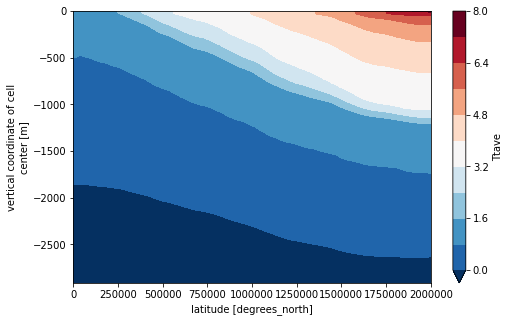

In [619]:
(dsphy.Ttave.mean(['time','XC'])).plot.contourf(figsize=(8,5), levels=np.linspace(0,8,11))

/home/takaya/miniconda3/envs/uptodate/lib/python3.6/site-packages/matplotlib/figure.py:2369: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  warnings.warn("This figure includes Axes that are not compatible "


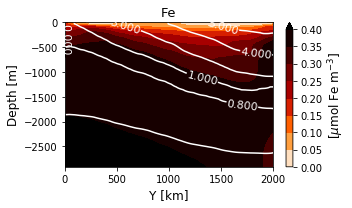

In [243]:
tlevs = np.array([0,.8,1,3,4,5])

fig, ax = plt.subplots(figsize=(5,3))
fig.set_tight_layout(True)
im = ax.contourf(dsptr.YC*1e-3, dsptr.Z, dsptr.PTRtave03.mean(['time','XC'])*1e3,
               levels=np.linspace(0,.4,9), extend='max', cmap = 'gist_heat_r')
cs = ax.contour(dsphy.YC*1e-3, dsphy.Z, dsphy.Ttave.mean(['time','XC']), 
              levels=tlevs, colors='w')
for c in im.collections:
    c.set_rasterized(True)
for c in cs.collections:
    c.set_rasterized(True)
ax.set_title(r"Fe", fontsize=13)
ax.set_ylabel(r"Depth [m]", fontsize=12)
ax.set_xlabel(r"Y [km]", fontsize=12)
ax.set_ylim([dsptr.Z[-1],0])
plt.clabel(cs, inline=1, fontsize=11)
cb = fig.colorbar(im, ax=ax)
cb.set_label(r"[$\mu$mol Fe m$^{-3}$]",fontsize=12)
plt.savefig(op.join(ddir,'Dalma_Dar02km/Figures/Fe-transect_02km.pdf'))

In [6]:
grid = Grid(ds, periodic=['X'])

In [8]:
P1 = ds.TRAC22
P2 = ds.TRAC23
# Z1 = ds.TRAC08
# Z2 = ds.TRAC12
PP = ds.PP
POmn = dsptr.PTRtave01
NOmn = dsptr.PTRtave02
Fe1D = ds.TRAC03
Femn = dsptr.PTRtave03
Simn = dsptr.PTRtave04
# POC = ds.TRAC26
w1D = ds.WVEL
t1D = ds.THETA

In [9]:
PPC_intgH = grid.cumsum(PP*12*106 * ds.drF, 'Z', boundary='fill')[:,-1]
PPC_intgH

<xarray.DataArray 'concatenate-273eb366324aa5650d7fa7ebc76f134e' (time: 360, YC: 1000, XC: 500)>
dask.array<shape=(360, 1000, 500), dtype=float32, chunksize=(1, 1000, 500)>
Coordinates:
  * time     (time) float64 1.401e+08 1.401e+08 1.402e+08 ... 1.71e+08 1.711e+08
    Zl       >f4 -2825.33
  * YC       (YC) >f4 1000.0 3000.0 5000.0 ... 1995000.0 1997000.0 1999000.0
  * XC       (XC) >f4 1000.0 3000.0 5000.0 7000.0 ... 995000.0 997000.0 999000.0

In [10]:
mu = PP/(P1+P2)

In [11]:
Feconsump = -PP * 1e-3
Feremin = ds.FeTbgc - Feconsump

In [9]:
P1.attrs

OrderedDict([('standard_name', 'TRAC22'),
             ('long_name', 'Phy1 concentration'),
             ('units', 'mM/m^3')])

In [12]:
P = P1+P2
P.sel(Z=slice(0,-100))

<xarray.DataArray (time: 360, Z: 22, YC: 400, XC: 500)>
dask.array<shape=(360, 22, 400, 500), dtype=float32, chunksize=(1, 22, 400, 500)>
Coordinates:
    iter     (time) int64 dask.array<shape=(360,), chunksize=(1,)>
  * time     (time) float64 1.401e+08 1.401e+08 1.402e+08 ... 1.71e+08 1.711e+08
  * XC       (XC) >f4 1000.0 3000.0 5000.0 7000.0 ... 995000.0 997000.0 999000.0
  * YC       (YC) >f4 601000.0 603000.0 605000.0 ... 1397000.0 1399000.0
  * Z        (Z) >f4 -0.5 -1.57 -2.79 -4.185 ... -68.685 -77.965 -88.175 -99.37
    rA       (YC, XC) >f4 dask.array<shape=(400, 500), chunksize=(400, 500)>
    Depth    (YC, XC) >f4 dask.array<shape=(400, 500), chunksize=(400, 500)>
    drF      (Z) >f4 dask.array<shape=(22,), chunksize=(22,)>
    PHrefC   (Z) >f4 dask.array<shape=(22,), chunksize=(22,)>
    hFacC    (Z, YC, XC) >f4 dask.array<shape=(22, 400, 500), chunksize=(22, 400, 500)>

(0, 0.08)

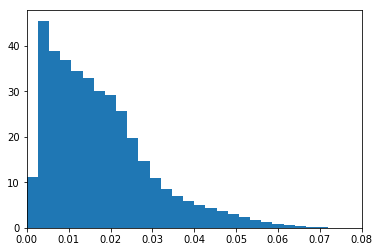

In [83]:
fig, ax = plt.subplots()
ax.hist(P.sel(Z=slice(0,-100)).data.ravel(), density=True, bins=30, range=(0,0.08))
ax.set_xlim([0,0.08])

In [13]:
# P1yr = xr.DataArray(P[-360:,:34].data, dims=P.dims,
#                    coords={'time':(P.time[-360:].data-P.time[-360].data)/86400,
#                           'Z':np.flipud(np.abs(P.Z.data)[:34]),
#                           'YC':P.YC.data,'XC':P.XC.data},
#                    attrs=P1.attrs)
P1yr = P[-360:,:34]
P1yr = P1yr.drop('Z')
P1yr.coords['Z'] = ('Z', -P.Z.data[33]+P.Z.data[:34])
P1yr
# Fe1yr = xr.DataArray(Fe[-360:,:34].data, dims=Fe.dims,
#                     coords={'time':(Fe.time[-360:].data-Fe.time[-360].data)/86400,
#                              'Z':np.flipud(np.abs(Fe.Z.data)[:34]),
#                              'YC':Fe.YC.data,'XC':Fe.XC.data},
#                     attrs=Fe.attrs)
# print(P1yr.time, Fe1yr.time)

<xarray.DataArray (time: 360, Z: 34, YC: 400, XC: 500)>
dask.array<shape=(360, 34, 400, 500), dtype=float32, chunksize=(1, 34, 400, 500)>
Coordinates:
    iter     (time) int64 dask.array<shape=(360,), chunksize=(1,)>
  * time     (time) float64 1.401e+08 1.401e+08 1.402e+08 ... 1.71e+08 1.711e+08
  * XC       (XC) >f4 1000.0 3000.0 5000.0 7000.0 ... 995000.0 997000.0 999000.0
  * YC       (YC) >f4 601000.0 603000.0 605000.0 ... 1397000.0 1399000.0
    rA       (YC, XC) >f4 dask.array<shape=(400, 500), chunksize=(400, 500)>
    Depth    (YC, XC) >f4 dask.array<shape=(400, 500), chunksize=(400, 500)>
    drF      (Z) >f4 dask.array<shape=(34,), chunksize=(34,)>
    PHrefC   (Z) >f4 dask.array<shape=(34,), chunksize=(34,)>
    hFacC    (Z, YC, XC) >f4 dask.array<shape=(34, 400, 500), chunksize=(34, 400, 500)>
  * Z        (Z) float32 324.82 323.75 322.53 ... 50.335022 25.815002 0.0

In [44]:
dsave = P1yr.to_dataset(name='Ptot')
# dsave['FeT'] = Fe1yr
dsave.to_netcdf(op.join(ddir,'P_02km_flipped.nc'))

In [88]:
P1.coords['days'] = ('time',np.tile(np.roll(range(360),-180),dy))
P2.coords['days'] = ('time',np.tile(np.roll(range(360),-180),dy))
# Z1.coords['days'] = ('time',np.tile(range(360),dy))
# Z2.coords['days'] = ('time',np.tile(range(360),dy))
PP.coords['days'] = ('time',np.tile(np.roll(range(360),-180),dy))

In [89]:
with ProgressBar():
    P1day = P1.sel(YC=slice(6e5,14e5)).load().groupby('days').median(['time','YC','XC'])
    P2day = P2.sel(YC=slice(6e5,14e5)).load().groupby('days').median(['time','YC','XC'])
#     Z1day = Z1.groupby('days').mean(['time']).compute()
#     Z2day = Z2.groupby('days').mean(['time']).compute()
    PPday = PP.sel(YC=slice(6e5,14e5)).load().groupby('days').median(['time','YC','XC'])

[########################################] | 100% Completed | 13.8s
[########################################] | 100% Completed |  6min 27.8s
[########################################] | 100% Completed |  5min 32.1s


In [24]:
with ProgressBar():
    P1day_Y = P1.load().groupby('days').median(['time','XC'])
    P2day_Y = P2.load().groupby('days').median(['time','XC'])
PtotC_Y = ((P1day_Y+P2day_Y)*ds.drF*106*12).sum('Z')
PtotC_Y

[########################################] | 100% Completed | 12min 10.8s
[########################################] | 100% Completed | 14min 20.8s


<xarray.DataArray (days: 360, YC: 1000)>
dask.array<shape=(360, 1000), dtype=float32, chunksize=(360, 1000)>
Coordinates:
  * YC       (YC) >f4 1000.0 3000.0 5000.0 ... 1995000.0 1997000.0 1999000.0
  * days     (days) int64 0 1 2 3 4 5 6 7 8 ... 352 353 354 355 356 357 358 359

In [16]:
# hack to include a periodic axis for months
def lowess_simple2d_periodic(x, y, z, xeval, yeval, tau1 = .005, tau2 = .005):

    [xgeval, ygeval] = np.meshgrid(xeval,yeval, indexing='xy')
    
    zeval   = np.zeros_like(xgeval)
    datanum = np.zeros_like(xgeval)
    
    xp = np.concatenate((x,x,x))
    yp = np.concatenate((y-12, y, y+12)) # expect y to be the periodic axis
    zp = np.concatenate((z,z,z))
    
    beta1 = 1/(2*tau1)
    beta2 = 1/(2*tau2)
    
    # size of the comparable tophat kernel
    l1 = (tau1*2*np.pi)**0.5
    l2 = (tau2*2*np.pi)**0.5
    
    print(l1, l2, len(xp), len(yp))
    
    for i in range(0,len(xgeval[0,:])):
        for j in range(0,len(ygeval[:,0])):
            
            xs = xgeval[j,i]
            ys = ygeval[j,i]
            
            w = np.exp(-beta1* (xs - xp)**2) * np.exp(-beta2 * (ys - yp)**2)
            
            #print (xs, ys, xs+l1/2, xs-l1/2, ys+l2/2, ys-l2/2)
            
            datanum[j,i] = np.size(np.where((xp<=xs+l1/2) & (xp>xs-l1/2) & (yp<=ys+l2/2) & (yp>ys-l2/2)))
            
    
            zeval[j,i] = np.sum(w*zp)/ np.sum(w)
    
    return zeval, datanum


def lowess_simple(x, y, xeval, tau = .005):
    
    yeval = np.zeros_like(xeval)
    datanum = np.zeros_like(xeval)
    beta = 1/(2*tau) 
    l1 = (tau*2*np.pi)**0.5
    
    for i, xs in enumerate(xeval):
        w = np.exp(-beta* (xs - x)**2)
    
        yeval[i] = np.sum(w*y)/ np.sum(w)
        datanum[i] = np.size(np.where((x<=xs+l1/2) & (x>xs-l1/2)))
    
    return yeval, datanum

In [12]:
lat_ax = np.linspace(-80,-28,100) # the latitude grid
time_ax = np.linspace(0,12,25)    # the time grid
time_nonclim = np.linspace(0,60,24*5+1)
lonb = -70 # where to divide the domain
dlat = (1.6**2) # Sigma^2 for the gaussian.
dtime = (0.43**2)

In [25]:
comdir = '/swot/SUM02/takaya/SOCCOM/SIO'
limdir = '/swot/SUM03/Argo_BGC_backscatter_SO_merged'
comC = pd.read_csv(op.join(comdir,'SOCCOM_Cs.csv'),
                  infer_datetime_format=True, keep_date_col=True, parse_dates=['time']).drop(columns=['Unnamed: 0'])
# limC = pd.read_csv(op.join(limdir,'../Argo_Analysis/SOCLIM_Cs.csv'),
#                    infer_datetime_format=True, keep_date_col=True, parse_dates=['time']).drop(columns=['Unnamed: 0'])
limC = pd.read_csv(op.join(comdir,'../../SOCLIM/SOCLIM-sanspEu_Cs.csv'),
                   infer_datetime_format=True, keep_date_col=True, parse_dates=['time']).drop(columns=['Unnamed: 0'])
dC_COMCLIM = comC
dC_COMCLIM = pd.concat([dC_COMCLIM,limC],
                      ignore_index=True, sort=False)

l = 0
for i in range(len(dC_COMCLIM.time)):
    if np.isnan(dC_COMCLIM.Lon[i]):
        pass
    else:
        d = {'time':[dC_COMCLIM.time[i]],
            'Lat':[dC_COMCLIM.Lat[i]], 'Lon':[dC_COMCLIM.Lon[i]], 
            'CH':[dC_COMCLIM.CH_rolled[i]]}
#         print(j,k)
        if l == 0:
            Ctot = pd.DataFrame(data=d, index=[0])
        else:
            Ctot = pd.concat([Ctot,pd.DataFrame(data=d)], ignore_index=True)
        l += 1
        
C_tot = Ctot.loc[Ctot.Lat<0.].where(Ctot.CH.notna()).dropna(thresh=3)
# C = C.dropna(thresh=3)
Ctot = C_tot.sort_values('time').set_index('time')


Creset = Ctot.reset_index()
CCOM = xr.DataArray(np.ones((len(time_ax),len(lat_ax)))*np.nan, dims=['month','Lat'],
                        coords={'month':time_ax, 'Lat':lat_ax})
datanumCOM = CCOM.copy()
# select data that is in the Southern Hemisphere
temp = Creset.loc[Creset.Lat<0.]
date = pd.DatetimeIndex(temp.time.values)
date_frac = pd.Series(date.month-1 + (date.day-1)/date.daysinmonth) # and convert to date fraction 
                    

CCOM[:,:], datanumCOM[:,:] = lowess_simple2d_periodic(temp.Lat.values, date_frac.values, np.log(temp.CH.values),  
                                                     lat_ax, time_ax, dlat, dtime)
CCOM = np.exp(CCOM[:,:])

4.010605239409601 1.0778501580913302 66210 66210


In [33]:
KE = xr.open_dataset(op.join('/swot/SUM05/takaya/AVISO/AVISO-KE_30-70S.nc')).KE
aviso_lon = KE.longitude.data
aviso_lon[aviso_lon>180.] -= 360.
KE_mn = xr.DataArray(np.nanmean(KE, axis=0, keepdims=True)[0],
                     dims=['lat','lon'], coords={'lat':KE.latitude.data,'lon':aviso_lon})
KE_mn

/home/takaya/miniconda3/envs/uptodate/lib/python3.6/site-packages/ipykernel_launcher.py:4: RuntimeWarning: Mean of empty slice
  after removing the cwd from sys.path.


<xarray.DataArray (lat: 160, lon: 1440)>
array([[     nan,      nan,      nan, ...,      nan,      nan,      nan],
       [     nan, 0.00016 , 0.000176, ...,      nan,      nan,      nan],
       [     nan, 0.000151, 0.000185, ...,      nan,      nan,      nan],
       ...,
       [0.017272, 0.016962, 0.016475, ..., 0.017844, 0.01786 , 0.017628],
       [0.015479, 0.015296, 0.015124, ..., 0.015985, 0.015913, 0.015738],
       [0.014721, 0.014638, 0.014503, ..., 0.01478 , 0.014903, 0.01487 ]])
Coordinates:
  * lat      (lat) float32 -69.875 -69.625 -69.375 ... -30.625 -30.375 -30.125
  * lon      (lon) float32 0.125 0.375 0.625 0.875 ... -0.625 -0.375 -0.125

In [28]:
maskCOM = CCOM.where(datanumCOM<10)

In [11]:
plt.contourf(np.linspace(0,24,360), PtotC_Y.YC*1e-3, 
            PtotC_Y.roll(days=-180).T*1e-3,
            cmap='BuGn', levels=np.linspace(.5,7.5,11), extend='both')

NameError: name 'PtotC_Y' is not defined

/home/takaya/miniconda3/envs/uptodate/lib/python3.6/site-packages/xarray/core/dataarray.py:2170: FutureWarning: roll_coords will be set to False in the future. Explicitly set roll_coords to silence warning.
  shifts=shifts, roll_coords=roll_coords, **shifts_kwargs)


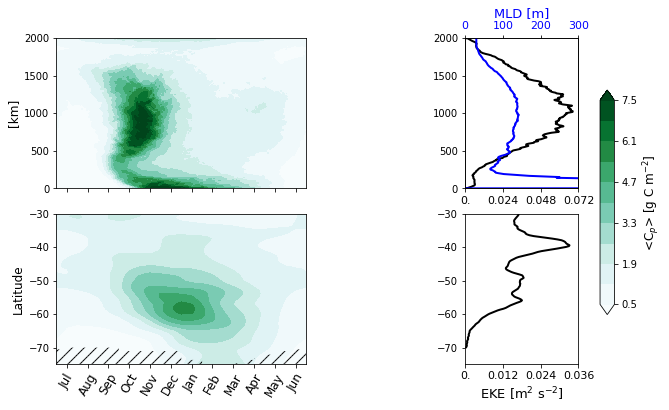

In [36]:
xx, yy = np.meshgrid(np.arange(0,24), lat_ax)
xx1, yy1 = np.meshgrid(np.arange(1,25), lat_ax)

fig = plt.figure(figsize=(10,6))
gs = gspec.GridSpec(2,4)
ax1 = fig.add_subplot(gs[0,:2])
ax2 = fig.add_subplot(gs[1,:2])
ax3 = fig.add_subplot(gs[0,3])
ax4 = fig.add_subplot(gs[1,3])
ax5 = ax3.twiny()
# fig.set_tight_layout(True)
im1 = ax1.contourf(np.linspace(0,24,360), PtotC_Y.YC*1e-3, 
                  PtotC_Y.roll(days=-180).T*1e-3,
                  cmap='BuGn', levels=np.linspace(.5,7.5,11), extend='both')

ax2.pcolor(np.arange(0,26), maskCOM.Lat, maskCOM.T.roll(month=-12).data*1e-3, hatch='//', alpha=0,
           vmin=0, vmax=4.5, cmap='BuGn', zorder=5, rasterized=True)
im2 = ax2.contourf(xx, yy, CCOM[:-1].roll(month=-12).T.data*1e-3, 
                  levels=np.linspace(.5,7.5,11), cmap='BuGn', extend='both', zorder=0)
im3 = ax2.contourf(xx1, yy1, CCOM[:-1].roll(month=-13).T.data*1e-3, 
                  levels=np.linspace(.5,7.5,11), cmap='BuGn', extend='both', zorder=0)

for c in im1.collections:
    c.set_rasterized(True)
for c in im2.collections:
    c.set_rasterized(True)
for c in im3.collections:
    c.set_rasterized(True)
    
ax3.plot(EKE, EKE.YC*1e-3, 'k', lw=2)
ax4.plot(KE_mn.mean('lon'), KE_mn.lat, 'k', lw=2)
ax5.plot(MXLD.mean('day'), MXLD.YC*1e-3, 'b', lw=2)

ax3.set_xlim([0,0.07])
ax3.set_xticks([0.,0.024,0.048,0.072])
ax3.set_xticklabels(['0.','0.024','0.048','0.072'], color='k', fontsize=11)
ax4.set_xlim([0,0.036])
ax4.set_xticks([0,0.012,0.024,0.036])
ax4.set_xticklabels(['0.','0.012','0.024','0.036'], color='k', fontsize=11)
ax5.set_xlim([0,300])
ax5.set_xticks([0,100,200,300])
ax5.set_xticklabels([0,100,200,300], color='b', fontsize=11)
ax4.set_xlabel(r"EKE [m$^2$ s$^{-2}$]", fontsize=13, color='k')
ax5.set_xlabel(r"MLD [m]", fontsize=13, color='b')
ax3.set_ylim([0,2000])
ax4.set_ylim([-75,-30])

ax1.set_xlim([0,24])
ax2.set_xlim([0,24])
ax2.set_ylim([-75,-30])
ax1.set_xticks(np.arange(1,25,2))
ax1.set_xticklabels([],
                   rotation=50, fontsize=11)
ax2.set_xticks(np.arange(1,25,2))
ax2.set_xticklabels(['Jul','Aug','Sep','Oct','Nov','Dec','Jan','Feb','Mar','Apr','May','Jun'],
                   rotation=60, fontsize=12)
ax1.set_ylabel(r"[km]", fontsize=12)
ax2.set_ylabel(r"Latitude", fontsize=12)

fig.subplots_adjust(right=0.85, hspace=0.17)
cbar_ax = fig.add_axes([0.88, 0.24, 0.02, 0.52])
cbar = fig.colorbar(im1, cax=cbar_ax)
cbar.set_label(r"<C$_p$> [g C m$^{-2}$]", fontsize=12)
plt.savefig(op.join(ddir,'Dalma_Dar02km/Figures/2km-Argo_comp.pdf'))

In [15]:
Feconsump.coords['days'] = ('time',np.tile(np.roll(range(360),-180),dy))
Feremin.coords['days'] = ('time',np.tile(np.roll(range(360),-180),dy))

with ProgressBar():
    Consumpday = Feconsump.groupby('days').mean(['time','YC','XC']).compute()
    Reminday = Feremin.groupby('days').mean(['time','YC','XC']).compute()

[########################################] | 100% Completed | 47.7s
[########################################] | 100% Completed |  5min 29.6s


In [ ]:
P1day

In [90]:
PtotCday = ((P1day+P2day)*ds.drF*106*12).sum('Z')
PPCday = PPday*106.*12.
PtotCday

<xarray.DataArray (days: 360)>
dask.array<shape=(360,), dtype=float32, chunksize=(360,)>
Coordinates:
  * days     (days) int64 0 1 2 3 4 5 6 7 8 ... 352 353 354 355 356 357 358 359

In [247]:
# PintgC = ((P1+P2)*106*12*ds.drF).sum(dim='Z')
# # r = np.log(PintgC[1:]/PintgC[:-1].data) * PintgC.time.diff('time',1)**-1
# with ProgressBar():
#     Pmedian = PintgC.load().median(['YC','XC'])
r = ((PtotCday[1:]-PtotCday[:-1].data) * 86400**-1
    * (.5*(PtotCday[1:]+PtotCday[:-1].data))**-1
    )
tnew = .5*(PtotCday.days.data[1:]+PtotCday.days.data[:-1])
func = pchip(tnew, r, axis=0, extrapolate=True)
rday = xr.DataArray(func(PtotCday.days.data), dims=['days'], coords={'days':PtotCday.days.data})
# r.coords['days'] = ('time',np.tile(np.roll(range(360),-180),dy))
# with ProgressBar():
#     rday = r.groupby('days').median(['time']).compute()
rday*86400

<xarray.DataArray (days: 360)>
array([-0.014457, -0.017374, -0.017103, ..., -0.018826, -0.018258, -0.017296])
Coordinates:
  * days     (days) int64 0 1 2 3 4 5 6 7 8 ... 352 353 354 355 356 357 358 359

In [40]:
nz = 22
with ProgressBar():
    P1Cday = (grid.cumsum(P1day*ds.drF,'Z',boundary='fill')[:,nz]
              * np.abs(ds.Zl[nz])**-1*106.*12.).compute()
    P2Cday = (grid.cumsum(P2day*ds.drF,'Z',boundary='fill')[:,nz]
              * np.abs(ds.Zl[nz])**-1*106.*12.).compute()
#     Z1Cday = (grid.cumsum(Z1day*ds.drF,'Z',boundary='fill')[:,nz]
#               * np.abs(ds.Zl[nz])**-1*106.*12.).compute()
#     Z2Cday = (grid.cumsum(Z2day*ds.drF,'Z',boundary='fill')[:,nz]
#               * np.abs(ds.Zl[nz])**-1*106.*12.).compute()
#     P1Cintg = (P1day*ds.drF).sum('Z').compute()
#     P2Cintg = (P2day*ds.drF).sum('Z').compute()
#     Z1Cintg = (Z1day*ds.drF).sum('Z').compute()
#     Z2Cintg = (Z2day*ds.drF).sum('Z').compute()
# PtotCday = P1Cday+P2Cday

NameError: name 'P1day' is not defined

In [60]:
# dsave = (P1day+P2day).to_dataset(name='Ptot_d')
# dsave.to_netcdf(op.join(ddir,'Ptot_600-1400km_02kmDailyClim.nc'))
# dsave
Ptot_d = xr.open_dataset(op.join(ddir,'Ptot_600-1400km_02kmDailyClim.nc')).Ptot_d

In [ ]:
# with ProgressBar():
#     Ptot = (P1Cday+P2Cday).sel(YC=slice(6e5,14e5)).compute()
# Ptot

In [31]:
# colors = Ptot.days.data[:,np.newaxis,np.newaxis]*np.ones((160,200))+1.

# fig, ax = plt.subplots(figsize=(6,5))
# fig.set_tight_layout(True)
# for i in range(360):
#     if i == 0:
#         im = ax.scatter((Ptot)[i]*2e-2, (P1Cday.sel(YC=slice(6e5,14e5))/Ptot)[i],
#                        c=colors[i], alpha=360./(360.+3*i),
#                        s=1., vmin=1., vmax=360., rasterized=True
#                        )
#     else:
#         ax.scatter((Ptot)[i]*2e-2, (P1Cday.sel(YC=slice(6e5,14e5))/Ptot)[i],
#                   c=colors[i], alpha=360./(360.+3*i),
#                   s=1., vmin=1., vmax=360., rasterized=True
#                   )
# ax.set_xscale('log')
# ax.set_xlim([2e-3,2e0])
# ax.set_ylim([0.,1.])
# cbar = fig.colorbar(im, ax=ax)
# cbar.set_label(r"Days", fontsize=12)
# ax.set_xlabel(r"P$_{1+2}$ [mg Chl m$^{-3}$]", fontsize=14)
# ax.set_ylabel(r"Percentage of P$_1$ (P$_1$/P$_{1+2}$)", fontsize=14)
# plt.xticks(fontsize=12)
# plt.yticks(fontsize=12)
# plt.savefig(op.join(ddir,'Figures/P1vsP_05km.pdf'))

In [22]:
# modisdir = '/swot/SUM05/takaya/MODIS/CbPM/'
# cbpm = xr.open_dataset(op.join(modisdir,'CbPM_40-70S.nc')).carbon
# c_ker = cbpm.sel(lon=slice(100,150))

# years = range(2003,2017)
# months = np.tile(range(12), len(years))
# c_ker.coords['iMONTH'] = ('iTIME', months)

# with ProgressBar():
#     c_ker_mon = c_ker.groupby('iMONTH').mean('iTIME').compute()
    
# c_ker_mon

viirsdir = '/swot/SUM05/takaya/VIIRS/monthly/'
cbpm = xr.open_dataset(op.join(viirsdir,'CbPM-VIIRS-monthly_40-70S.nc')).cbpm
cbpm_ker = cbpm.sel(lon=slice(100,150))
c = xr.open_dataset(op.join(viirsdir,'Carbon-VIIRS-monthly_40-70S.nc')).carbon
c_ker = c.sel(lon=slice(100,150))
print(c_ker.attrs)

# c_ker.coords['iMONTH'] = ('iTIME', months)

with ProgressBar():
    cbpm_ker_mon = cbpm_ker.groupby('months').mean('iTIME').compute()
    c_ker_mon = c_ker.groupby('months').mean('iTIME').compute()
    cbpm_ker_std = cbpm_ker.groupby('months').std(['iTIME','lat','lon']).compute()
    c_ker_std = c_ker.groupby('months').std(['iTIME','lat','lon']).compute()
del c, cbpm, c_ker, cbpm_ker
    
c_ker_mon

OrderedDict([('units', 'mg C m-3')])


<xarray.DataArray 'carbon' (months: 12, lat: 180, lon: 300)>
array([[[15.112427, 14.852038, ..., 12.71562 , 12.428508],
        [15.321337, 15.516882, ..., 12.616169, 12.885255],
        ...,
        [      nan,       nan, ...,       nan,       nan],
        [      nan,       nan, ...,       nan,       nan]],

       [[16.136292, 15.66229 , ..., 11.292799, 11.285312],
        [15.517662, 15.276718, ..., 11.046855, 10.657256],
        ...,
        [      nan,       nan, ...,       nan,       nan],
        [      nan,       nan, ...,       nan,       nan]],

       ...,

       [[13.21138 , 12.787419, ..., 17.215484, 17.393421],
        [12.773817, 13.044801, ..., 17.452012, 16.252701],
        ...,
        [      nan,       nan, ...,       nan,       nan],
        [      nan,       nan, ...,       nan,       nan]],

       [[16.93975 , 16.80695 , ..., 16.324605, 16.893064],
        [16.262466, 16.190208, ..., 16.751794, 16.669233],
        ...,
        [      nan,       nan, ...,       

In [10]:
cafedir = '/swot/SUM05/takaya/CAFE/'
decaf = loadmat(op.join(cafedir,'CAFE'), appendmat=True)
cafe = decaf['CAFE']
lat = decaf['Lat1']
lon = decaf['Lon1']
ppcb = np.zeros((12,180,360))
for i in range(12):
    ppcb[i] = cafe[:,:,i]
    
decaf = xr.DataArray(ppcb, dims=['month','lat','lon'],
                 coords={'month':range(1,13),'lat':lat[:,0],'lon':lon[0,:]}
                 ).to_dataset(name='carbon')
decaf_SO = decaf.sel(lat=slice(-45,-65),lon=slice(50,180))
del decaf, ppcb
decaf_SO

<xarray.Dataset>
Dimensions:  (lat: 20, lon: 130, month: 12)
Coordinates:
  * month    (month) int64 1 2 3 4 5 6 7 8 9 10 11 12
  * lat      (lat) float64 -45.5 -46.5 -47.5 -48.5 -49.5 -50.5 -51.5 -52.5 ...
  * lon      (lon) float64 50.5 51.5 52.5 53.5 54.5 55.5 56.5 57.5 58.5 59.5 ...
Data variables:
    carbon   (month, lat, lon) float64 635.4 618.2 587.5 501.0 514.8 526.0 ...

In [ ]:
# P1_intg = (P1*106.*12.*ds.hFacC*ds.drF).sum(dim='Z')
# P2_intg = (P2*106.*12.*ds.hFacC*ds.drF).sum(dim='Z')
# P1_intg

In [43]:
# sosedir = '/swot/SUM05/takaya/SOSE'
# sose = xr.open_dataset(op.join(sosedir,'3day_ave/bsose_i105_2008to2012_3day_Phyto.nc'))
# P_sose = sose.phyto
# P_sose.attrs = sose.phyto.attrs

# gridSOSE = xr.open_dataset(op.join(sosedir,'3day_ave/grid.nc'))

# P_sose.coords['iTIME'] = ('iTIME',range(609))
# P_sose.coords['iDEPTH'] = ('iDEPTH',gridSOSE.DRF.data)
# P_sose.coords['iLAT'] = ('iLAT',gridSOSE.YC.data[:,0])
# P_sose.coords['iLON'] = ('iLON',gridSOSE.XC.data[0,:])

# P_kersurf = (P_sose*P_sose.iDEPTH)[:,:12].sum('iDEPTH').sel(iLON=slice(100,140)) * 1e-2
# del P_sose
# DinY = np.tile(range(121),5)
# P_kersurf = P_kersurf[:-4]
# P_kersurf.coords['DinY'] = ('iTIME',DinY)
# P_kersurf = P_kersurf.groupby('DinY').mean('iTIME')

# P_kersurf

In [42]:
# sose = xr.open_dataset(op.join(sosedir,'3day_ave/bsose_i105_2008to2012_3day_NPP.nc'))
# PP_sose = sose.NPP
# print(sose.NPP.attrs)
# PP_sose.attrs = sose.NPP.attrs

# PP_sose.coords['iTIME'] = ('iTIME',range(609))
# PP_sose.coords['iDEPTH'] = ('iDEPTH',gridSOSE.DRF.data)
# PP_sose.coords['iLAT'] = ('iLAT',gridSOSE.YC.data[:,0])
# PP_sose.coords['iLON'] = ('iLON',gridSOSE.XC.data[0,:])

# PP_kersurf = (PP_sose*PP_sose.iDEPTH).sel(iLON=slice(100,140)).sum('iDEPTH')
# del PP_sose, gridSOSE
# DinY = np.tile(range(121),5)
# PP_kersurf = PP_kersurf[:-4]
# PP_kersurf.coords['DinY'] = ('iTIME',DinY)
# PP_kersurf = PP_kersurf.groupby('DinY').mean('iTIME')

In [18]:
# dssave = P_kersurf.to_dataset(name='Phyto_100m')
# dssave['Prod_intg'] = PP_kersurf
# dssave.to_netcdf(op.join(sosedir,'3day_ave/Biomass-Productivity_3D_Kerguelen.nc'))

In [11]:
sosedir = '/swot/SUM05/takaya/SOSE'
dsSOSE = xr.open_dataset(op.join(sosedir,'3day_ave/Biomass-Productivity_3D_Kerguelen.nc'))
P_kersurf = dsSOSE.Phyto_100m
PP_kersurf = dsSOSE.Prod_intg

In [239]:
with ProgressBar():
    PPintg = (PPCday*ds.hFacC*ds.drF).sum(dim='Z').load().median(['YC','XC'])
PPintg

[########################################] | 100% Completed |  0.1s
[########################################] | 100% Completed |  0.1s
[########################################] | 100% Completed |  0.1s
[########################################] | 100% Completed |  0.1s
[########################################] | 100% Completed |  3min  5.4s


<xarray.DataArray (days: 360)>
array([0.001165, 0.00116 , 0.001156, ..., 0.001181, 0.001174, 0.001169],
      dtype=float32)
Coordinates:
  * days     (days) int64 0 1 2 3 4 5 6 7 8 ... 352 353 354 355 356 357 358 359

In [82]:
PPintg.sel(YC=slice(6e5,14e5)).mean(['XC','YC']).sum('days').values

array(0.5430186, dtype=float32)

In [385]:
XLD

<xarray.DataArray 'hbl99' (time: 360, YC: 1000)>
[360000 values with dtype=float64]
Coordinates:
  * time     (time) float64 1.401e+08 1.401e+08 1.402e+08 1.403e+08 ...
  * YC       (YC) float32 1000.0 3000.0 5000.0 7000.0 9000.0 11000.0 13000.0 ...
    day      (time) int64 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 ...
    seas     (time) int64 ...
    month    (time) int64 ...

In [14]:
# bl = xr.open_dataset(op.join(ddir,'KPPbl_99percen_5km.nc')).KPPbl
# bl.coords['days'] = ('time',np.tile(range(360),10))
# bl_day = bl.groupby('days').mean(['time'])
# bl_day
XLD = xr.open_dataset(op.join(ddir,'Dalma_Dar02km/runs/KPPhbl_99percentile_02km.nc'), decode_times=False).hbl99
# MXLD.coords['DinY'] = ('time',np.tile(range(360),5))
MXLD = XLD.groupby('day').mean(['time'])
MXLD

<xarray.DataArray 'hbl99' (day: 360, YC: 1000)>
array([[   0.      ,  856.019467,  804.671083, ...,   30.      ,   30.      ,
          30.      ],
       [   0.      ,  873.392276,  806.288749, ...,   30.      ,   30.      ,
          30.      ],
       [   0.      ,  904.832932,  813.162896, ...,   30.      ,   30.      ,
          30.      ],
       ...,
       [   0.      , 1162.911127, 1046.628356, ...,   30.      ,   30.      ,
          30.      ],
       [   0.      , 1169.172312, 1042.79228 , ...,   30.      ,   30.      ,
          30.      ],
       [   0.      , 1156.04707 ,  997.990954, ...,   30.      ,   30.      ,
          30.      ]])
Coordinates:
  * YC       (YC) float32 1000.0 3000.0 5000.0 ... 1995000.0 1997000.0 1999000.0
  * day      (day) int64 0 1 2 3 4 5 6 7 8 ... 352 353 354 355 356 357 358 359

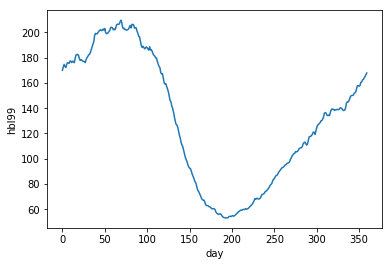

In [56]:
MXLD.sel(YC=slice(6e5,14e5)).mean('YC').plot()

In [301]:
# l = mu - r

# mu.coords['days'] = ('time',np.tile(range(360),dy))
# l.coords['days'] = ('time',np.tile(range(360),dy))
# FadvW_d = ds.ADVrTr03
# dfib_d = ds.DFrITr03
# FadvW_d.coords['days'] = ('time',np.tile(range(360),dy))
# dfib_d.coords['days'] = ('time',np.tile(range(360),dy))

#     FadvW_d = (grid.diff(FadvW_d,'Zl',boundary='fill'))[:,22].sel(YC=slice(6e5,14e5)).groupby('days').mean(['time','YC',
#                                                                                                         'XC']).compute()
#     dfib_d = dfib_d[:,22].sel(YC=slice(6e5,14e5)).groupby('days').mean(['time','YC','XC']).compute()
#     muday = mu.groupby('days').mean('time')
#     lday = l.groupby('days').mean('time')

In [40]:
# diff = ds.DFrITr03
# diff_z = grid.diff(diff, 'Z', boundary='fill')/(ds.rA*ds.drF)
# advW = ds.ADVrTr03
# # advV = ds.ADVyTr03
# adv_z = grid.diff(advW,'Z',boundary='fill')/(ds.rA*ds.drF)
# # advy = grid.diff(advV, 'Y', boundary='fill')/(ds.rA*ds.drF).mean('XC')

# diff_z.coords['days'] = ('time',np.tile(range(360),dy))
# adv_z.coords['days'] = ('time',np.tile(range(360),dy))


# with ProgressBar():
#     dff_z_100 = diff_z[:,21].sel(YC=slice(6e5,14e5)).groupby('days').mean(['time','YC','XC']).compute()
#     adv_z_100 = adv_z[:,21].sel(YC=slice(6e5,14e5)).groupby('days').mean(['time','YC','XC']).compute()
    
# adv_z_100

In [41]:
# fig, ax = plt.subplots()
# # ax2 = ax.twinx()
# adv_z_100.plot(ax=ax, color='r')
# dff_z_100.plot(ax=ax, color='b')
# ax.set_ylim([-2.e-11,2.e-11])

In [15]:
zz = xr.DataArray(np.abs(ds.Zl).data[np.newaxis,:,np.newaxis]*np.ones((360,1000))[:,np.newaxis,:],
                 dims=['day','Zl','YC'])
nMXLD = np.argmin(np.abs(zz-MXLD), axis=1)
nXLD100 = nMXLD.data.copy()
nXLD100[nXLD100<22] = 22
nXLD100 = xr.DataArray(nXLD100, dims=nMXLD.dims, coords=nMXLD.coords)
nXLD100

zz = xr.DataArray(np.abs(ds.Zl).data[np.newaxis,:,np.newaxis]*np.ones((24,1000))[:,np.newaxis,:],
                 dims=['day','Zl','YC'])
nMXLD = np.argmin(np.abs(zz-MXLD[::15]), axis=1)
nXLD100_15 = nMXLD.data.copy()
nXLD100_15[nXLD100_15<22] = 22
nXLD100_15 = xr.DataArray(nXLD100_15, dims=nMXLD.dims, coords={'day':range(24),'YC':MXLD.YC.data})
nXLD100_15

<xarray.DataArray (day: 24, YC: 1000)>
array([[22, 49, 47, ..., 22, 22, 22],
       [22, 42, 41, ..., 22, 22, 22],
       [22, 43, 42, ..., 22, 22, 22],
       ...,
       [22, 46, 44, ..., 22, 22, 22],
       [22, 49, 47, ..., 22, 22, 22],
       [22, 52, 51, ..., 22, 22, 22]])
Coordinates:
  * day      (day) int64 0 1 2 3 4 5 6 7 8 9 ... 14 15 16 17 18 19 20 21 22 23
  * YC       (YC) float32 1000.0 3000.0 5000.0 ... 1995000.0 1997000.0 1999000.0

In [10]:
wsp = open_mdsdataset(op.join(ddir,'Dalma_Dar02km/runs'), 
#                      grid_dir=op.join(ddir,'02km_grid'),
                     iters=range(ts,te+int(2160*15),int(2160*15)),
                     prefix=['W'],
                     delta_t=dt
                     ).sel(YC=slice(6e5,14e5),YG=slice(6e5,14e5)).W
wm = dsphy.sel(YC=slice(6e5,14e5),YG=slice(6e5,14e5)).wVeltave
dssnp = open_mdsdataset(op.join(ddir,'Dalma_Dar02km/runs'), 
#                       grid_dir=op.join(ddir,'02km_grid'),
                      iters=range(ts,te+int(2160*15),int(2160*15)),
                      prefix=['PTRACER03','PTRACER22','PTRACER23'],
                      delta_t=dt
                      )
Fesp = dssnp.PTRACER03
Psp = dssnp.PTRACER22 + dssnp.PTRACER23
# POCsp = open_mdsdataset(op.join(ddir,'Dalma_Dar02km/runs'), 
# #                        grid_dir=op.join(ddir,'02km_grid'),
#                        iters=range(ts,te,int(2160*15)),
#                        prefix=['PTRACER26'],
#                        delta_t=dt
#                        ).sel(YC=slice(6e5,14e5),YG=slice(6e5,14e5)).PTRACER26
# dptrm = open_mdsdataset(op.join(ddir,'Dalma_Dar02km/runs'), 
# #                        grid_dir=op.join(ddir,'02km_grid'),
#                        iters=range(ts+int(2160*30),te+int(2160*30),int(2160*30)),
#                        prefix=['PTRtave03','PTRtave26'],
#                        delta_t=dt
#                        ).sel(YC=slice(6e5,14e5),YG=slice(6e5,14e5))
# dptrm

/home/takaya/miniconda3/envs/uptodate/lib/python3.6/site-packages/matplotlib/figure.py:2369: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  warnings.warn("This figure includes Axes that are not compatible "


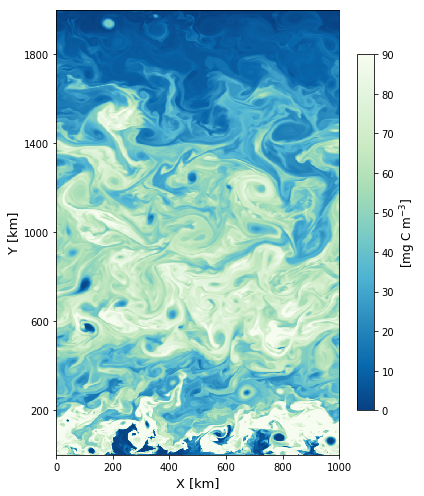

In [290]:
fig, ax = plt.subplots(figsize=(6,7))
fig.set_tight_layout(True)
im = ax.pcolormesh(Psp.XC*1e-3, Psp.YC*1e-3, Psp[-16,0]*106*12,
                   vmax=90, vmin=0, cmap='GnBu_r', rasterized=True)
cbar = fig.colorbar(im, ax=ax, shrink=.8)
cbar.set_label(r"[mg C m$^{-3}$]", fontsize=12)
ax.set_yticks([200,600,1000,1400,1800])
ax.set_xlabel(r"X [km]", fontsize=13)
ax.set_ylabel(r"Y [km]", fontsize=13)
plt.savefig(op.join(ddir,'Dalma_Dar02km/Figures/Psnap_Nov-1_02km.pdf'))

In [307]:
bdir = '/swot/SUM02/takaya/channelMOC-Darwin/'

dt = 4.8e3
ys,dy = (1315,5) 
ts = int(ys*360*86400/dt)
te = int(ts+dy*360*86400/dt)
print(ts,te)
ds100 = open_mdsdataset(op.join(bdir,'100kmMLI_fm07Vis'), 
                       grid_dir=op.join(bdir,'100km_grid'), iters=range(ts,te,270),
                       prefix=['PTRACER03',
                               'W',
                               'PTRACER22',
                               'PTRACER23'
#                               'PTRACER26'
                              ], delta_t=dt
                       )

/home/takaya/miniconda3/envs/uptodate/lib/python3.6/site-packages/matplotlib/figure.py:2369: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  warnings.warn("This figure includes Axes that are not compatible "


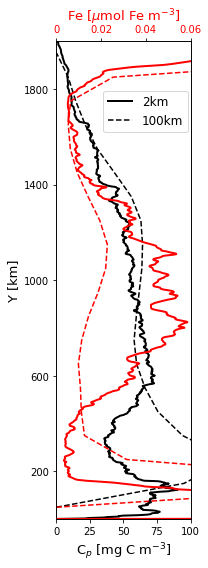

In [330]:
fig, ax = plt.subplots(figsize=(3,8))
ax2 = ax.twiny()
fig.set_tight_layout(True)
ax.plot(Psp[-16,0].load().median('XC')*106*12, Psp.YC*1e-3, 'k', lw=2, label=r'2km')
ax2.plot(Fesp[-16,0].mean('XC')*1e3, Fesp.YC*1e-3, 'r', lw=2)
ax.plot((ds100.PTRACER22+ds100.PTRACER23)[-4,0].load().median('XC')*106*12, ds100.YC*1e-3, 'k--', label=r"100km")
ax2.plot((ds100.PTRACER03)[-4,0].mean('XC')*1e3, ds100.YC*1e-3, 'r--')
ax.set_xlim([0,100])
ax.set_ylim([0,2e3])
ax2.set_xlim([0,0.06])
ax.set_yticks([200,600,1000,1400,1800])
ax.set_xlabel(r"C$_p$ [mg C m$^{-3}$]", fontsize=13)
ax2.set_xlabel(r"Fe [$\mu$mol Fe m$^{-3}$]", fontsize=13, color='r')
ax2.set_xticks([0,.02,.04,.06])
ax2.set_xticklabels(['0','0.02','0.04','0.06'], color='r')
ax.set_ylabel(r"Y [km]", fontsize=13)
ax.legend(loc=(.35,.81), fontsize=12)
plt.savefig(op.join(ddir,'Dalma_Dar02km/Figures/Psnap_Nov-1_02km_zonmean.pdf'))

In [280]:
Psp[-16,:34]*106*12

<xarray.DataArray (Z: 34, YC: 1000, XC: 500)>
dask.array<shape=(34, 1000, 500), dtype=float32, chunksize=(34, 1000, 500)>
Coordinates:
  * XC       (XC) >f4 1000.0 3000.0 5000.0 7000.0 ... 995000.0 997000.0 999000.0
  * YC       (YC) >f4 1000.0 3000.0 5000.0 ... 1995000.0 1997000.0 1999000.0
  * Z        (Z) >f4 -0.5 -1.57 -2.79 -4.185 ... -274.985 -299.505 -325.32
    rA       (YC, XC) >f4 dask.array<shape=(1000, 500), chunksize=(1000, 500)>
    Depth    (YC, XC) >f4 dask.array<shape=(1000, 500), chunksize=(1000, 500)>
    drF      (Z) >f4 dask.array<shape=(34,), chunksize=(34,)>
    PHrefC   (Z) >f4 dask.array<shape=(34,), chunksize=(34,)>
    hFacC    (Z, YC, XC) >f4 dask.array<shape=(34, 1000, 500), chunksize=(34, 1000, 500)>
    iter     int64 dask.array<shape=(), chunksize=()>
    time     float64 1.503e+08

In [281]:
Psp300 = Psp[-16,:34]*106*12
Psp300 = Psp300.drop('Z')
Psp300.coords['Z'] = ('Z', -Psp.Z.data[33]+Psp.Z.data[:34])
Psp300 = Psp300.drop('YC')
Psp300.coords['YC'] = ('YC', Psp.YC.data*1e-3)
Psp300 = Psp300.drop('XC')
Psp300.coords['XC'] = ('XC', Psp.XC.data*1e-3)
Fesp300 = Fesp[-16,:34]*1e3
Fesp300 = Fesp300.drop('Z')
Fesp300.coords['Z'] = ('Z', -Fesp.Z.data[33]+Fesp.Z.data[:34])
Fesp300 = Fesp300.drop('YC')
Fesp300.coords['YC'] = ('YC', Fesp.YC.data*1e-3)
Fesp300 = Fesp300.drop('XC')
Fesp300.coords['XC'] = ('XC', Fesp.XC.data*1e-3)
dsave = Psp300.to_dataset(name='Cphyto')
dsave['Fe'] = Fesp300
# dsave['FeT'] = Fe1yr
dsave.to_netcdf(op.join(ddir,'P-Fe_02km_Nov-01_flippedsnaps.nc'))
dsave

<xarray.Dataset>
Dimensions:  (XC: 500, YC: 1000, Z: 34)
Coordinates:
    rA       (YC, XC) >f4 dask.array<shape=(1000, 500), chunksize=(1000, 500)>
    Depth    (YC, XC) >f4 dask.array<shape=(1000, 500), chunksize=(1000, 500)>
    drF      (Z) >f4 dask.array<shape=(34,), chunksize=(34,)>
    PHrefC   (Z) >f4 dask.array<shape=(34,), chunksize=(34,)>
    hFacC    (Z, YC, XC) >f4 dask.array<shape=(34, 1000, 500), chunksize=(34, 1000, 500)>
    iter     int64 dask.array<shape=(), chunksize=()>
    time     float64 1.503e+08
  * Z        (Z) float32 324.82 323.75 322.53 ... 50.335022 25.815002 0.0
  * YC       (YC) float32 1.0 3.0000002 5.0 ... 1995.0001 1997.0001 1999.0001
  * XC       (XC) float32 1.0 3.0000002 5.0 ... 995.00006 997.00006 999.00006
    seas     int64 3
Data variables:
    Cphyto   (Z, YC, XC) float32 dask.array<shape=(34, 1000, 500), chunksize=(34, 1000, 500)>
    Fe       (Z, YC, XC) float32 dask.array<shape=(34, 1000, 500), chunksize=(34, 1000, 500)>

In [276]:
dsave.YC

<xarray.DataArray 'YC' (YC: 1000)>
array([0.   , 0.001, 0.002, ..., 0.997, 0.998, 0.999])
Coordinates:
    iter     int64 dask.array<shape=(), chunksize=()>
    time     float64 1.503e+08
  * YC       (YC) float64 0.0 0.001 0.002 0.003 ... 0.996 0.997 0.998 0.999
    seas     int64 3

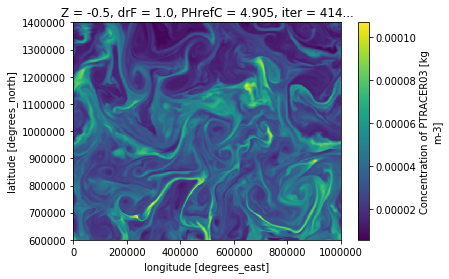

In [276]:
Fesp[-4,0].plot()

In [344]:
from scipy.signal import medfilt

comdir = '/swot/SUM02/takaya/SOCCOM/SIO'
pf = pd.read_csv(op.join(comdir,'../Fronts/pf.txt'), delim_whitespace=True, 
                 nrows=968, header=None, dtype=float, names=['lon','lat'])
saf = pd.read_csv(op.join(comdir,'../Fronts/saf.txt'), delim_whitespace=True, 
                 nrows=1079, header=None, dtype=float, names=['lon','lat'])

gdir = '/swot/SUM05/takaya/Geotraces/'
df = pd.read_excel(op.join(gdir,'TAGLIABUE_FE_DATABASE_JUN2015_PUBLIC.xlsx'), skiprows=3)
dfSO = df.loc[df['Lat (degN)'] < -40.]
l = 0
ddeg = 1.
for i in dfSO.index:
    if np.isnan(dfSO.loc[dfSO.index==i]['long (degE)'].values[0]):
        pass
    else:
        j = np.argmin(np.abs(pf.lon-dfSO.loc[dfSO.index==i]['long (degE)'].values[0]))
        k = np.argmin(np.abs(saf.lon-dfSO.loc[dfSO.index==i]['long (degE)'].values[0]))

        if dfSO.loc[dfSO.index==i]['Lat (degN)'].values[0]>=pf.lat[j]-ddeg and dfSO.loc[dfSO.index==i]['Lat (degN)'].values[0]<=saf.lat[k]+ddeg:        
            if l == 0:
                acc = dfSO.loc[dfSO.index==i]
            else:
                acc = pd.concat([acc,dfSO.loc[dfSO.index==i]], 
                                ignore_index=True)
            l += 1
znew = np.append(np.arange(-10,-110,-10), np.arange(-150,-1050,-50))
acc_sorted = acc.sort_values(['Lat (degN)','depth'])

/home/takaya/miniconda3/envs/uptodate/lib/python3.6/site-packages/numpy/core/fromnumeric.py:52: FutureWarning: 
The current behaviour of 'Series.argmin' is deprecated, use 'idxmin'
instead.
The behavior of 'argmin' will be corrected to return the positional
minimum in the future. For now, use 'series.values.argmin' or
'np.argmin(np.array(values))' to get the position of the minimum
row.
  return getattr(obj, method)(*args, **kwds)
/home/takaya/miniconda3/envs/uptodate/lib/python3.6/site-packages/numpy/core/fromnumeric.py:52: FutureWarning: 
The current behaviour of 'Series.argmin' is deprecated, use 'idxmin'
instead.
The behavior of 'argmin' will be corrected to return the positional
minimum in the future. For now, use 'series.values.argmin' or
'np.argmin(np.array(values))' to get the position of the minimum
row.
  return getattr(obj, method)(*args, **kwds)
/home/takaya/miniconda3/envs/uptodate/lib/python3.6/site-packages/numpy/core/fromnumeric.py:52: FutureWarning: 
The current behavi

IndexError: index 0 is out of bounds for axis 0 with size 0

In [351]:
lats = acc_sorted['Lat (degN)'].unique()
months = acc_sorted['month'].unique()
anewI = np.empty((len(znew),len(lats)))
anewI[:] = np.nan
k = 0
for i in lats:
    zs = acc_sorted.loc[acc_sorted['Lat (degN)'] == i]['depth'].values
    if len(zs) == len(np.unique(zs)):
        Fe = medfilt(acc_sorted.loc[acc_sorted['Lat (degN)'] == i]['dFe (nM)'].values,3)
        if len(Fe) > 1:
            func = pchip(zs, Fe, extrapolate=False)
            anewI[:,k] = func(np.abs(znew))
        else:
            pass
    else:
        pass
    k += 1
anewI = xr.DataArray(anewI, dims=['Z','Lat'], coords={'Z':znew,'Lat':lats})
anew = anewI.where(anewI<=acc['dFe (nM)'].max())
anew

<xarray.DataArray (Z: 28, Lat: 76)>
array([[     nan,      nan,      nan, ...,      nan,      nan, 0.4     ],
       [     nan, 0.24    , 0.03072 , ...,      nan,      nan, 0.386431],
       [     nan, 0.24    , 0.26634 , ...,      nan,      nan, 0.325542],
       ...,
       [     nan,      nan, 0.24576 , ...,      nan,      nan,      nan],
       [     nan,      nan, 0.24576 , ...,      nan,      nan,      nan],
       [     nan,      nan,      nan, ...,      nan,      nan,      nan]])
Coordinates:
  * Z        (Z) int64 -10 -20 -30 -40 -50 -60 -70 -80 -90 -100 -150 -200 ...
  * Lat      (Lat) float64 -61.0 -60.9 -60.8 -60.7 -60.5 -60.2 -60.0 -59.9 ...

/home/takaya/miniconda3/envs/uptodate/lib/python3.6/site-packages/matplotlib/figure.py:2299: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  warnings.warn("This figure includes Axes that are not compatible "


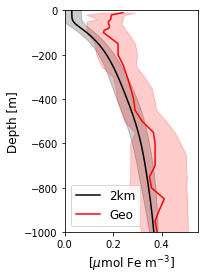

In [354]:
acc25 = np.nanpercentile(anew.data, 25, axis=1)
acc75 = np.nanpercentile(anew.data, 75, axis=1)

fig, ax = plt.subplots(figsize=(3,4))
fig.set_tight_layout(True)
ax.plot(Fesp.roll(time=2)[8:17].sel(YC=slice(6e5,14e5)).mean(['time','YC','XC'])*1e3, Fesp.Z, 'k', label=r"2km")
ax.fill_betweenx(Fesp.Z, 
                (Fesp.roll(time=2)[8:17].sel(YC=slice(6e5,14e5)).mean(['time','YC','XC'])
                - Fesp.roll(time=2)[8:17].sel(YC=slice(6e5,14e5)).std(['time','YC','XC']))*1e3,
                (Fesp.roll(time=2)[8:17].sel(YC=slice(6e5,14e5)).mean(['time','YC','XC'])
                + Fesp.roll(time=2)[8:17].sel(YC=slice(6e5,14e5)).std(['time','YC','XC']))*1e3,
                color='k', alpha=0.2)
ax.plot(np.nanmedian(anew,axis=-1), anew.Z, 'r', label='Geo')
ax.fill_betweenx(anew.Z, acc25, acc75,
                color='r', alpha=0.2)
ax.set_ylim([-1e3,0.])
ax.set_xlim([0.,0.55])
ax.set_xlabel(r"[$\mu$mol Fe m$^{-3}$]", fontsize=12)
ax.set_ylabel(r"Depth [m]", fontsize=12)
ax.legend(loc='lower left', fontsize=12)
# ax.set_title(r"2 km", fontsize=13)
plt.savefig(op.join(ddir,'Dalma_Dar02km/Figures/Fe_profile_02km.pdf'))

/home/takaya/miniconda3/envs/uptodate/lib/python3.6/site-packages/matplotlib/figure.py:2299: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  warnings.warn("This figure includes Axes that are not compatible "


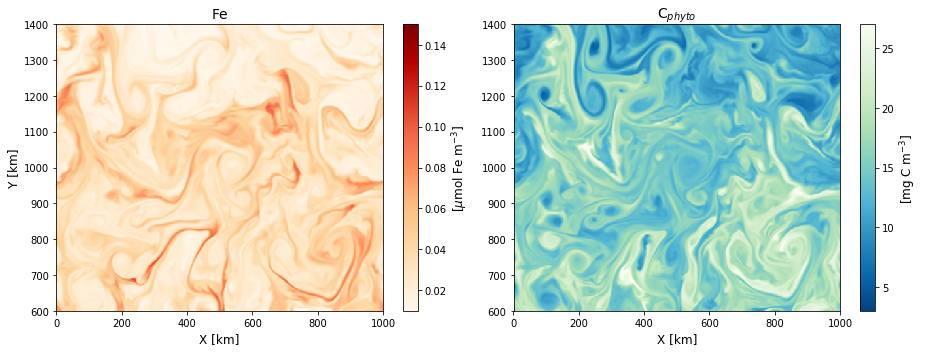

In [488]:
fig, (ax1,ax2) = plt.subplots(nrows=1, ncols=2, figsize=(13,5))
fig.set_tight_layout(True)
im1 = ax1.pcolormesh(Fesp.XC.data*1e-3, Fesp.YC.data*1e-3, Fesp[-4,0].data*1e3,
                    vmax=.15, vmin=0.01, cmap='OrRd', rasterized=True)
im2 = ax2.pcolormesh(Psp.XC.data*1e-3, Psp.YC.data*1e-3, Psp[-4,0].data*106*12,
                    vmax=27, vmin=3, cmap='GnBu_r', rasterized=True)
ax1.set_ylabel(r'Y [km]', fontsize=12)
ax1.set_xlabel(r'X [km]', fontsize=12)
# ax2.set_ylabel(r'Y [km]', fontsize=12)
ax2.set_xlabel(r'X [km]', fontsize=12)
ax1.set_title(r"Fe",fontsize=14)
ax2.set_title(r"C$_{phyto}$",fontsize=14)
# fig.subplots_adjust(right=0.87)
# cbar_ax = fig.add_axes([0.9, 0.15, 0.015, 0.7])
# cbar = fig.colorbar(im, cax=cbar_ax)
# cbar.set_label(r"$\alpha/f$", fontsize=12)
cb1 = fig.colorbar(im1, ax=ax1)
cb2 = fig.colorbar(im2, ax=ax2)
cb1.set_label(r"[$\mu$mol Fe m$^{-3}$]", fontsize=12)
cb2.set_label(r"[mg C m$^{-3}$]", fontsize=12)
plt.savefig(op.join(ddir,'Dalma_Dar02km/Figures/Fe-P_snap_Nov1.pdf'))

In [11]:
Fem = dsptr.PTRtave03
Pm = dsptr.PTRtave22 + dsptr.PTRtave23
# POCm = dsptr.PTRtave26

In [12]:
diff = ds.DFrITr03
advW = ds.ADVrTr03
dfz_cons = diff/(ds.rA)
adz_cons = advW/(ds.rA)
dfz_cons.coords['day'] = ('time',np.tile(np.roll(range(360),-180),dy))
adz_cons.coords['day'] = ('time',np.tile(np.roll(range(360),-180),dy))
wsp.coords['seas'] = ('time',np.append(np.tile(np.repeat(np.roll(range(4),-2),6),dy),2))
Psp.coords['seas'] = ('time',np.append(np.tile(np.repeat(np.roll(range(4),-2),6),dy),2))
# wm.coords['seas'] = ('time',np.tile(np.repeat(np.roll(range(4),-2),3),dy))
# theta.coords['seas'] = ('time',np.tile(np.repeat(np.roll(range(4),-2),90),dy))
# Fem.coords['seas'] = ('time',np.tile(np.repeat(np.roll(range(4),-2),3),dy))
Fesp.coords['seas'] = ('time',np.append(np.tile(np.repeat(np.roll(range(4),-2),6),dy),2))
# POCm.coords['seas'] = ('time',np.tile(np.repeat(np.roll(range(4),-2),3),dy))
# POCsp.coords['seas'] = ('time',np.tile(np.repeat(np.roll(range(4),-2),6),dy))
wp = wsp.groupby('seas') - wm.groupby('seas').mean(['time','XC'])
# Tp = theta.groupby('seas') - theta.groupby('seas').mean(['time','XC'])
Fep = Fesp.groupby('seas') - Fem.groupby('seas').mean(['time','XC'])
Pp = Psp.groupby('seas') - Pm.groupby('seas').mean(['time','XC'])
# POCp = POCsp.groupby('seas') - POCm.groupby('seas').mean(['time','XC'])
# TpFep = Tp*Fep
wpFep = wp*grid.interp(Fep,'Z',boundary='fill')
wpPp = wp*grid.interp(Pp,'Z',boundary='fill')
# wpPOCp = wp*grid.interp(POCsp,'Z',boundary='fill')
wp.coords['day'] = ('time',np.tile(np.roll(range(25),-12),dy))
wpFep.coords['day'] = ('time',np.tile(np.roll(range(25),-12),dy))
wpPp.coords['day'] = ('time',np.tile(np.roll(range(25),-12),dy))
# wpPOCp.coords['day'] = ('time',np.tile(np.roll(range(24),-12),dy))
# TpFep.coords['day'] = ('time',np.tile(range(360),dy))

In [18]:
wpPp

<xarray.DataArray (time: 25, Zl: 76, YC: 400, XC: 500)>
dask.array<shape=(25, 76, 400, 500), dtype=float32, chunksize=(1, 1, 400, 500)>
Coordinates:
  * YC       (YC) float64 6.01e+05 6.03e+05 6.05e+05 ... 1.397e+06 1.399e+06
  * XC       (XC) >f4 1000.0 3000.0 5000.0 7000.0 ... 995000.0 997000.0 999000.0
  * Zl       (Zl) >f4 0.0 -1.0 -2.14 -3.44 ... -2562.59 -2689.32 -2825.33
    rA       (YC, XC) >f4 4000000.0 4000000.0 4000000.0 ... 4000000.0 4000000.0
    Depth    (YC, XC) >f4 2985.0 2985.0 2985.0 2985.0 ... 2985.0 2985.0 2985.0
    iter     (time) int64 dask.array<shape=(25,), chunksize=(1,)>
  * time     (time) float64 1.4e+08 1.413e+08 1.426e+08 ... 1.698e+08 1.711e+08
    seas     (time) int64 2 2 2 2 2 2 3 3 3 3 3 3 0 0 0 0 0 0 1 1 1 1 1 1 2
    day      (time) int64 12 13 14 15 16 17 18 19 20 21 ... 3 4 5 6 7 8 9 10 11

In [72]:
dsave = wpFep.to_dataset(name='wpFep')
dsave['wpPOCp'] = wpPOCp
dsave.to_netcdf(op.join(ddir,'Dalma_Dar02km/runs/EddyVertFlux_Fe-POC_02km.nc'))
# wpPp = xr.open_dataset(op.join(ddir,'Dalma_Dar02km/runs/EddyVertFlux_Fe-POC_02km.nc'), decode_time=False)
# wpFep = wpPp.wpFep
# wpPOCp = wpPp.wpPOCp

(array([1.10285000e+05, 1.38273000e+05, 1.73917000e+05, 2.22729000e+05,
        2.86466000e+05, 3.79618000e+05, 5.14292000e+05, 7.06849000e+05,
        1.00860500e+06, 1.49992700e+06, 2.37474300e+06, 4.07748000e+06,
        7.87087100e+06, 1.88891110e+07, 1.41430442e+08, 1.46246223e+08,
        1.89812530e+07, 7.76379200e+06, 3.95251800e+06, 2.28968400e+06,
        1.44326100e+06, 9.65519000e+05, 6.77095000e+05, 4.89868000e+05,
        3.63820000e+05, 2.76975000e+05, 2.13137000e+05, 1.65553000e+05,
        1.30901000e+05, 1.04434000e+05]),
 array([-0.003 , -0.0028, -0.0026, -0.0024, -0.0022, -0.002 , -0.0018,
        -0.0016, -0.0014, -0.0012, -0.001 , -0.0008, -0.0006, -0.0004,
        -0.0002,  0.    ,  0.0002,  0.0004,  0.0006,  0.0008,  0.001 ,
         0.0012,  0.0014,  0.0016,  0.0018,  0.002 ,  0.0022,  0.0024,
         0.0026,  0.0028,  0.003 ]),
 <a list of 30 Patch objects>)

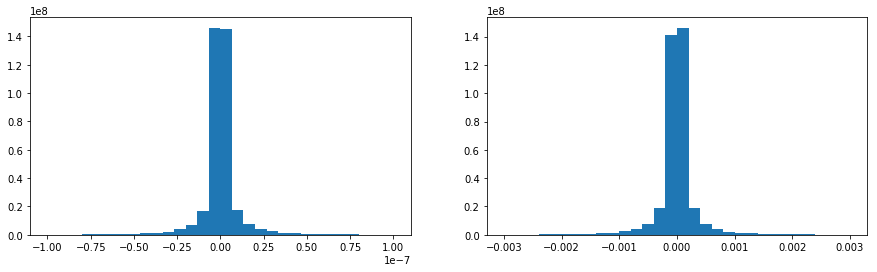

In [17]:
fig, (ax1,ax2) = plt.subplots(nrows=1, ncols=2, figsize=(15,4))
ax1.hist(wpFep.data.ravel(), bins=30, range=(-1e-7,1e-7))
ax2.hist(wpPOCp.data.ravel(), bins=30, range=(-3e-3,3e-3))

In [16]:
with ProgressBar():
#     dfz_c = dfz_cons.sel(YC=slice(6e5,14e5)).groupby('day').mean(['time','YC','XC']).compute()
#     adz_c = adz_cons.sel(YC=slice(6e5,14e5)).groupby('day').mean(['time','YC','XC']).compute()
    wpFep_d = wpFep.sel(YC=slice(6e5,14e5)).groupby('day').mean(['time','YC','XC']).compute()
    wpPp_d = wpPp.sel(YC=slice(6e5,14e5)).groupby('day').mean(['time','XC']).compute()
#     wpPp_d = wpPp.sel(YC=slice(6e5,14e5)).groupby('day').mean(['time','YC','XC']).compute()
#     wpPOCp_d = wpPOCp.sel(YC=slice(6e5,14e5)).groupby('day').mean(['time','YC','XC']).compute()
#     w2_sqrt = np.sqrt((wp.sel(YC=slice(6e5,14e5))**2).groupby('day').mean(['time','YC','XC'])).compute()
#     TpFep_d = TpFep.sel(YC=slice(6e5,14e5)).groupby('day').mean(['time','YC','XC']).compute()

# dfz_c_100 = dfz_c[:,22]
# adz_c_100 = adz_c[:,22]
wpFep_d_100 = wpFep_d[:,22]

[########################################] | 100% Completed | 15.8s
[########################################] | 100% Completed |  1min 14.3s


In [20]:
print(wpPp_d, nXLD100_15)

<xarray.DataArray (day: 25, Zl: 76, YC: 400)>
array([[[-1.343516e-11, -1.131310e-11, ...,  4.780072e-11,  3.746214e-11],
        [-4.219383e-10, -6.305494e-10, ..., -3.427510e-10,  2.715124e-10],
        ...,
        [ 1.355110e-17,  7.809070e-18, ...,  1.519920e-17,  1.655576e-17],
        [ 1.439085e-17,  1.703058e-17, ...,  2.082091e-17,  2.125698e-17]],

       [[ 4.227046e-11,  3.574879e-11, ...,  1.067280e-10,  1.064843e-10],
        [-1.204527e-10, -1.082006e-10, ..., -6.385618e-10, -1.314824e-10],
        ...,
        [ 2.080623e-17,  1.659443e-17, ...,  1.670774e-17,  1.463353e-17],
        [ 2.380106e-17,  1.712836e-17, ...,  2.349156e-17,  2.603793e-17]],

       ...,

       [[-5.261796e-11, -1.151556e-10, ...,  4.172487e-10,  2.661059e-10],
        [ 2.006747e-09, -1.831337e-09, ...,  1.544504e-09, -1.844121e-09],
        ...,
        [ 9.219763e-18,  8.147387e-18, ...,  6.042637e-18,  2.299287e-18],
        [ 9.382667e-18,  1.390240e-17, ...,  1.678822e-17,  1.416344e-17]

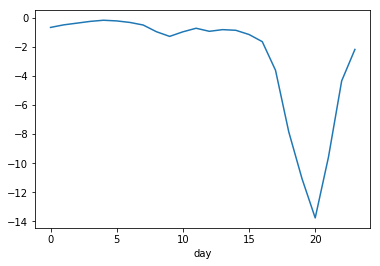

In [25]:
wpPp_c_XLD = wpPp_d[:-1].isel(Zl=nXLD100_15.sel(YC=slice(6e5,14e5))).mean('YC')
(wpPp_c_XLD*86400*360).plot()

In [43]:
with ProgressBar():
    PPH20 = xr.open_dataset(op.join(bdir,'PPCH_20km.nc')).PPC_intgH.mean(['YC','XC']).compute()
    PPH05 = xr.open_dataset(op.join(bdir,'PPCH_05km.nc')).PPC_intgH.mean(['YC','XC']).compute()
    PPH02 = PPC_intgH.mean(['YC','XC']).compute()
wpPp20 = xr.open_dataset(op.join(bdir,'wpPp_XLD_20km.nc')).wpPp_XLD
wpPp05 = xr.open_dataset(op.join(bdir,'wpPp_XLD_05km.nc')).wpPp_XLD

[########################################] | 100% Completed |  1min 46.4s


/home/takaya/miniconda3/envs/uptodate/lib/python3.6/site-packages/xarray/core/dataarray.py:2170: FutureWarning: roll_coords will be set to False in the future. Explicitly set roll_coords to silence warning.
  shifts=shifts, roll_coords=roll_coords, **shifts_kwargs)
/home/takaya/miniconda3/envs/uptodate/lib/python3.6/site-packages/matplotlib/figure.py:2369: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  warnings.warn("This figure includes Axes that are not compatible "


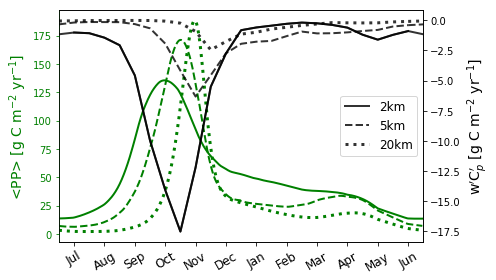

In [59]:
fig, ax = plt.subplots(figsize=(7,4))
fig.set_tight_layout(True)
ax2 = ax.twinx()
im, = ax.plot(range(360), PPH02*86400*360*1e-3, 'g', lw=2)
ax.plot(range(360), PPH05.roll(time=-180)*86400*360*1e-3, 'g--', lw=2)
ax.plot(range(360), PPH20.roll(days=-180)*86400*360*1e-3, 'g:', lw=3)
ax2.plot(range(0,360,15), wpPp_c_XLD.roll(day=-12)*86400*360*1e-3*106*12, 'k', lw=2, label=r'2km', alpha=.8)
ax2.plot(range(0,360,15), wpPp05.roll(day=-12)*86400*360*1e-3*106*12, 'k--', lw=2, label=r'5km', alpha=.8)
ax2.plot(range(0,360,15), wpPp20.roll(day=-12)*86400*360*1e-3*106*12, 'k:', lw=3, label=r'20km', alpha=.8)
ax2.plot(range(15,375,15), wpPp_c_XLD.roll(day=-13)*86400*360*1e-3*106*12, 'k', lw=2, label=r'', alpha=.8)
ax2.plot(range(345,375,15), wpPp05.roll(day=-13)[-2:]*86400*360*1e-3*106*12, 'k--', lw=2, label=r'', alpha=.8)
ax2.plot(range(345,375,15), wpPp20.roll(day=-13)[-2:]*86400*360*1e-3*106*12, 'k:', lw=3, label=r'', alpha=.8)
ax.spines["left"].set_edgecolor(im.get_color())
ax.tick_params(axis='y', colors=im.get_color())
ax.set_ylabel(r"<PP> [g C m$^{-2}$ yr$^{-1}$]", fontsize=14, color='g')
ax2.set_ylabel(r"w$'$C$_p'$ [g C m$^{-2}$ yr$^{-1}$]", fontsize=14)
ax.set_xlim([0,360])
ax.set_xticks(range(15,375,30))
ax.set_xticklabels(['Jul','Aug','Sep','Oct','Nov','Dec','Jan','Feb','Mar','Apr','May','Jun'], fontsize=12, rotation=30)
ax2.legend(loc='center right', fontsize=12)
plt.savefig(op.join(ddir,'Dalma_Dar02km/Figures/PP-and-wpPp_rescomp.pdf'))

In [41]:
# dsave = wpFep_d.to_dataset(name='wpFep')
# dsave['Fdiff'] = xr.DataArray(dfz_c[::15].data, dims=wpFep_d.dims, coords=wpFep_d.coords)
# # dsave['wMLIPOCp'] = wMLIPOCp
# dsave.to_netcdf(op.join(ddir,'Dalma_Dar02km/VertFeFlux_02km.nc'))
# dsave
# dsFe = xr.open_dataset(op.join(ddir,'Dalma_Dar02km/VertFeFlux_02km.nc'), decode_times=False)
# wpFep_d = dsFe.wpFep
# dfz_c = dsFe.Fdiff
# wpFep_d
# dfz_c

<xarray.DataArray 'wpFep' (day: 24, Zl: 76)>
array([[ 1.210528e-13, -1.867550e-13, -6.467315e-13, ..., -5.060819e-11,
        -4.898642e-11, -4.986739e-11],
       [ 4.813088e-14, -3.906131e-13, -9.306833e-13, ..., -7.734847e-11,
        -7.812059e-11, -7.798986e-11],
       [ 1.242756e-13, -3.202194e-13, -9.436632e-13, ..., -7.264537e-11,
        -6.735607e-11, -6.391473e-11],
       ...,
       [ 4.960771e-13, -1.319169e-12, -3.834887e-12, ..., -6.075131e-11,
        -5.492701e-11, -5.310832e-11],
       [ 5.965097e-13,  6.986973e-13,  2.260807e-13, ..., -5.842616e-11,
        -5.221093e-11, -4.804361e-11],
       [ 1.249711e-13, -4.668827e-13, -1.249645e-12, ..., -7.489964e-11,
        -6.712263e-11, -5.997772e-11]], dtype=float32)
Coordinates:
  * Zl       (Zl) float32 0.0 -1.0 -2.14 -3.44 ... -2562.59 -2689.32 -2825.33
  * day      (day) int64 0 1 2 3 4 5 6 7 8 9 ... 14 15 16 17 18 19 20 21 22 23

In [21]:
print(wpFep.sel(YC=slice(6e5,14e5)).groupby('day').mean(['time','XC']),nXLD100.sel(YC=slice(6e5,14e5)))

<xarray.DataArray (day: 25, Zl: 76, YC: 400)>
dask.array<shape=(25, 76, 400), dtype=float32, chunksize=(1, 1, 400)>
Coordinates:
  * YC       (YC) float64 6.01e+05 6.03e+05 6.05e+05 ... 1.397e+06 1.399e+06
  * Zl       (Zl) >f4 0.0 -1.0 -2.14 -3.44 ... -2562.59 -2689.32 -2825.33
  * day      (day) int64 0 1 2 3 4 5 6 7 8 9 ... 15 16 17 18 19 20 21 22 23 24 <xarray.DataArray (day: 360, YC: 400)>
array([[27, 27, 27, ..., 25, 25, 24],
       [27, 27, 27, ..., 23, 23, 25],
       [27, 27, 27, ..., 23, 24, 24],
       ...,
       [24, 25, 25, ..., 25, 25, 25],
       [25, 25, 25, ..., 25, 25, 25],
       [25, 25, 25, ..., 25, 25, 25]])
Coordinates:
  * day      (day) int64 0 1 2 3 4 5 6 7 8 ... 352 353 354 355 356 357 358 359
  * YC       (YC) float64 6.01e+05 6.03e+05 6.05e+05 ... 1.397e+06 1.399e+06


In [24]:
with ProgressBar():
    F_XLD = (wpFep+dfz_cons.sel(YC=slice(6e5,14e5)).data[::15]).groupby('day').mean(['time','XC']).isel(Zl=nXLD100_15.sel(YC=slice(6e5,14e5))
                                                                                                       ).mean('YC').compute()
    # adz_c_XLD = adz_c.isel(Zl=nXLD100.sel(YC=slice(6e5,14e5))).mean('YC')
#     wpFep_c_XLD = wpFep.sel(YC=slice(6e5,14e5)).groupby('day').mean(['time','XC']).isel(Zl=nXLD100_15.sel(YC=slice(6e5,14e5))
#                                                                                        ).mean('YC').compute()
# w2_sqrt
F_XLD

[########################################] | 100% Completed | 16.3s


<xarray.DataArray (day: 24)>
array([6.169382e-10, 4.595681e-10, 4.283323e-10, 3.702706e-10, 3.909283e-10,
       2.824304e-10, 3.010442e-10, 3.701377e-10, 6.001917e-10, 7.403332e-10,
       9.059538e-10, 9.531801e-10, 1.007041e-09, 9.606596e-10, 1.040497e-09,
       1.007437e-09, 9.492819e-10, 1.134438e-09, 1.607560e-09, 1.796328e-09,
       1.751166e-09, 1.396757e-09, 8.820469e-10, 6.767828e-10], dtype=float32)
Coordinates:
  * day      (day) int64 0 1 2 3 4 5 6 7 8 9 ... 14 15 16 17 18 19 20 21 22 23

In [26]:
F_XLD.mean()*1e3*360*86400

<xarray.DataArray ()>
array(26.735574)

In [25]:
ds100 = xr.open_dataset(op.join(bdir,'Ptot_600-1400km_100kmDailyClim_fm07VisR1000.nc'))
PtotC100 = (ds100.Ptot_d*ds100.drF).sum('Z')*106.*12.
F_MLD100 = xr.open_dataset(op.join(bdir,'Feddy_MLD100_100kmDailyClim_fm07VisR1000.nc')).Ftot
F_XLD20 = xr.open_dataset(op.join(bdir,'Ftot_XLD100_20km.nc')).Ftot
F_XLDmliR = xr.open_dataset(op.join(bdir,'Ftot_XLD100_20kmMLI-fm0R200.nc')).Ftot
ds20mliR = xr.open_dataset(op.join(bdir,'Ptot_600-1400km_20kmMLI02Tau2e-6_Ce007-fm0R200DailyClim.nc'))
PtotC20mliR = (ds20mliR.Ptot_d*ds20mliR.drF).sum('Z')*106.*12.
F_XLDmli = xr.open_dataset(op.join(bdir,'Ftot_XLD100_20kmMLI.nc')).Ftot
ds20mli = xr.open_dataset(op.join(bdir,'Ptot_600-1400km_20kmMLI02Tau2e-6_Ce007-DailyClim.nc'))
PtotC20mli = (ds20mli.Ptot_d*ds20mli.drF).sum('Z')*106.*12.
ds20 = xr.open_dataset(op.join(bdir,'Ptot_600-1400km_20kmDailyClim.nc'))
PtotC20 = (ds20.Ptot_d*ds20.drF).sum('Z')*106.*12.
F_XLD05 = xr.open_dataset(op.join(bdir,'Ftot_XLD100_05km.nc')).Ftot
ds05 = xr.open_dataset(op.join(bdir,'Ptot-wpFep_600-1400km_05kmDailyClim.nc'))
PtotC05 = (ds05.Ptot_d*ds05.drF).sum('Z')*106.*12.

In [17]:
print(PtotCday.load().median()*1e-3, F_XLD20.mean()*1e3*(360*86400), PtotC20.load().median()*1e-3)

<xarray.DataArray ()>
array(1.453147) <xarray.DataArray 'Ftot' ()>
array(7.452868) <xarray.DataArray ()>
array(0.672683)


/home/takaya/miniconda3/envs/uptodate/lib/python3.6/site-packages/matplotlib/figure.py:2369: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  warnings.warn("This figure includes Axes that are not compatible "


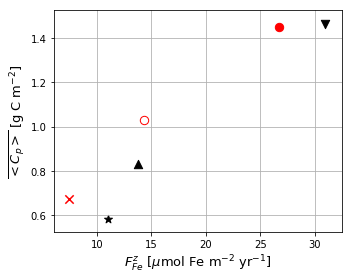

In [29]:
fig, ax = plt.subplots(figsize=(5,4))
fig.set_tight_layout(True)
ax.scatter(F_XLD.mean()*1e3*(360*86400), PtotCday.load().median()*1e-3, c='r', s=70, label=r'2km')
ax.scatter(F_XLD05.mean()*1e3*(360*86400), PtotC05.load().median()*1e-3, c='w', s=70, marker='o', edgecolor='r', label=r'5km')
ax.scatter(F_XLD20.mean()*1e3*(360*86400), PtotC20.load().median()*1e-3, c='r', s=70, marker='x', label=r"20km")
ax.scatter(F_XLDmli.mean()*1e3*(360*86400), PtotC20mli.load().median()*1e-3, c='k', s=70, marker='*', label=r"20km MLI")
ax.scatter(F_XLDmliR.mean()*1e3*(360*86400), PtotC20mliR.load().median()*1e-3, c='k', s=70, marker='^', label=r"20km MLI+R")
ax.scatter(F_MLD100.mean()*1e3*(360*86400), PtotC100.load().median()*1e-3, c='k', s=70, marker='v', label=r"100km GM+R")
# ax.set_xlim([1e-8,1e-6])
# ax.legend(loc='lower right', fontsize=13)
ax.set_xlabel(r"$F_{Fe}^z$ [$\mu$mol Fe m$^{-2}$ yr$^{-1}$]", fontsize=13)
ax.set_ylabel(r"$\overline{<C_p>}$ [g C m$^{-2}$]", fontsize=13)
ax.grid(True)
plt.savefig(op.join(ddir,'Dalma_Dar02km/Figures/Rescomp-scatter_reds_nolegend.pdf'))

In [14]:
# dsave = dfz_c_XLD.to_dataset(name='Fdiff_z')
# dsave['Fadv_z'] = adz_c_XLD
# dsave['wpFep'] = wpFep_c_XLD
# dsave.to_netcdf(op.join(bdir,'VerticalIronFluxes_XLD_05km.nc'))
dsFz = xr.open_dataset(op.join(bdir,'VerticalIronFluxes_XLD_05km.nc'))
dfz_c_XLD = dsFz.Fdiff_z
wpFep_c_XLD = dsFz.wpFep
wpFep_c_XLD

<xarray.DataArray 'wpFep' (day: 360)>
array([2.453861e-10, 2.405752e-10, 2.318069e-10, ..., 2.423379e-10,
       2.437832e-10, 2.463809e-10], dtype=float32)
Coordinates:
  * day      (day) int64 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 ...

In [25]:
dsFz = xr.open_dataset(op.join(bdir,'VerticalIronFluxes_XLD_20km.nc'))
dfz_20 = dsFz.Fdiff_z
wpFep_20 = dsFz.wpFep
dsFz = xr.open_dataset(op.join(bdir,'VerticalIronFluxes_XLD_20kmMLI.nc'))
dfz_20mli = dsFz.Fdiff_z
wpFep_20mli = dsFz.wpFep

/home/takaya/miniconda3/envs/uptodate/lib/python3.6/site-packages/matplotlib/figure.py:2299: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  warnings.warn("This figure includes Axes that are not compatible "


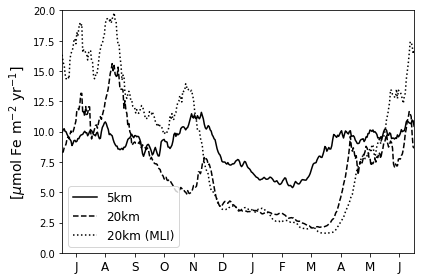

In [33]:
month = ['J','F','M','A','M','J','J','A','S','O','N','D']

fig, ax = plt.subplots(figsize=(6,4))
fig.set_tight_layout(True)
ax.plot(range(360), (dfz_c_XLD+wpFep_c_XLD).roll(day=-180)*1e3*360*86400, 'k', label=r"5km")
ax.plot(range(360), (dfz_20+wpFep_20).roll(day=-180)*1e3*360*86400, 'k--', label=r"20km")
ax.plot(range(360), (dfz_20mli+wpFep_20mli).roll(day=-180)*1e3*360*86400, 'k:', label=r"20km (MLI)")
ax.set_ylim([0.,20])
ax.set_xlim([0,359])
ax.set_xticks(np.linspace(14,344,12))
ax.set_xticklabels(np.roll(np.array(month),-6), fontsize=12)
ax.legend(fontsize=12, loc='lower left')
ax.set_ylabel(r"[$\mu$mol Fe m$^{-2}$ yr$^{-1}$]", fontsize=14)
# plt.savefig(op.join(pdir,'Figures/TotVertIronFlux_resolution-comp.pdf'))

In [30]:
Fe1D.coords['day'] = ('time',np.tile(np.roll(range(360),-180),dy))
with ProgressBar():
    Fe_c = Fe1D.sel(YC=slice(6e5,14e5)).groupby('day').mean(['time','YC','XC']).compute()
Fe_c

[########################################] | 100% Completed | 14min 47.4s


<xarray.DataArray 'TRAC03' (day: 360, Z: 76)>
array([[5.266611e-06, 5.267323e-06, 5.268236e-06, ..., 4.020534e-04,
        4.057550e-04, 4.078270e-04],
       [5.259501e-06, 5.260177e-06, 5.261042e-06, ..., 4.020732e-04,
        4.057781e-04, 4.078505e-04],
       [5.231701e-06, 5.232299e-06, 5.233068e-06, ..., 4.020946e-04,
        4.058040e-04, 4.078771e-04],
       ...,
       [5.275236e-06, 5.276043e-06, 5.277068e-06, ..., 4.020061e-04,
        4.057020e-04, 4.077754e-04],
       [5.264864e-06, 5.265660e-06, 5.266674e-06, ..., 4.020193e-04,
        4.057170e-04, 4.077910e-04],
       [5.261662e-06, 5.262441e-06, 5.263434e-06, ..., 4.020351e-04,
        4.057345e-04, 4.078075e-04]], dtype=float32)
Coordinates:
  * Z        (Z) >f4 -0.5 -1.57 -2.79 -4.185 ... -2625.955 -2757.325 -2912.665
    drF      (Z) >f4 1.0 1.14 1.3 1.49 1.7 ... 118.35 126.73 136.01 174.67
    PHrefC   (Z) >f4 4.905 15.4017 27.3699 ... 25760.62 27049.357 28573.244
  * day      (day) int64 0 1 2 3 4 5 6 7 8 ... 

# Entrainment flux

## $$F_{ent} = \Delta c|_{ML} \Big(\frac{dh}{dt} + v\frac{dh}{dy}\Big)$$

/home/takaya/miniconda3/envs/uptodate/lib/python3.6/site-packages/matplotlib/figure.py:2299: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  warnings.warn("This figure includes Axes that are not compatible "


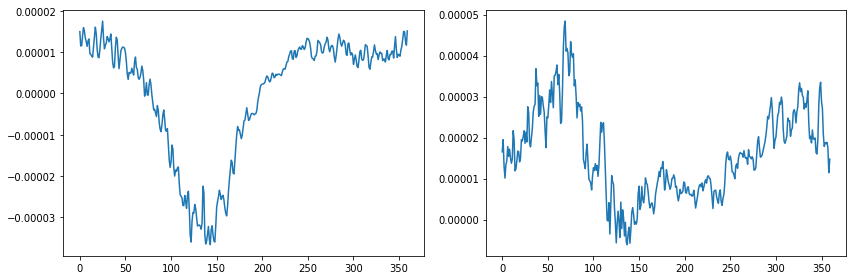

In [22]:
XLD_t = (-MXLD + MXLD.roll(day=-1).data) / 86400
XLD_t = .5*(XLD_t.roll(day=1).data + XLD_t)
XLD_y = (-MXLD + MXLD.roll(YC=-1).data)/(-MXLD.YC + MXLD.YC.roll(YC=-1).data)
XLD_y = .5*(XLD_y.roll(YC=1).data + XLD_y)

In [203]:
zm = xr.DataArray(np.abs(ds.Z).data[np.newaxis,:,np.newaxis]*np.ones((360,400))[:,np.newaxis,:],
                 dims=['day','Z','YC'])
nZMXLD = np.argmin(np.abs(zm-MXLD.sel(YC=slice(6e5,14e5))), axis=1)
nZXLD100 = nZMXLD.data.copy()
nZXLD100[nZXLD100<22] = 22
nZXLD100 = xr.DataArray(nZXLD100, dims=nZMXLD.dims, coords=nZMXLD.coords)

# v = ds.VVEL
# v_xb = grid.interp(v.mean('XC'),'Y',boundary='fill')
# v_xb.coords['day'] = ('time',np.tile(range(360),dy))
# v_xb = v_xb.groupby('day').mean('time')
# vMLD = v_xb.isel(Z=(nZXLD100))
# with ProgressBar():
#     vXLD_y = (vMLD*XLD_y).compute()
# vXLD_y

/home/takaya/miniconda3/envs/uptodate/lib/python3.6/site-packages/matplotlib/figure.py:2299: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  warnings.warn("This figure includes Axes that are not compatible "


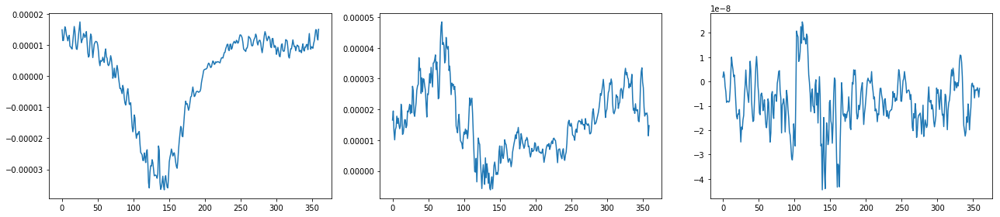

In [26]:
fig, (ax1,ax2,ax3) = plt.subplots(nrows=1, ncols=3, figsize=(18,4))
fig.set_tight_layout(True)
ax1.plot(range(360), XLD_t.sel(YC=slice(6e5,14e5)).mean('YC').roll(day=-180))
ax2.plot(range(360), XLD_y.sel(YC=slice(6e5,14e5)).mean('YC').roll(day=-180))
ax3.plot(range(360), vXLD_y.sel(YC=slice(6e5,14e5)).mean('YC').roll(day=-180))

In [18]:
with ProgressBar():
    Feday = Fe.groupby('day').mean(['time','XC']).compute()
Fe_t = Feday.isel(Z=(nZXLD100))
Fe_b = Feday.isel(Z=(nZXLD100+1))
dFetb = -Fe_t+Fe_b
dFetb

[########################################] | 100% Completed |  1min  9.6s


<xarray.DataArray 'TRAC03' (day: 360, YC: 400)>
array([[0.000000e+00, 3.646623e-06, 3.559893e-06, ..., 4.605827e-06,
        4.396832e-06, 4.412621e-06],
       [0.000000e+00, 3.650697e-06, 3.562949e-06, ..., 4.708359e-06,
        4.496047e-06, 4.463378e-06],
       [0.000000e+00, 3.654830e-06, 3.565365e-06, ..., 4.810179e-06,
        4.594272e-06, 4.520247e-06],
       ...,
       [0.000000e+00, 3.910798e-06, 3.804424e-06, ..., 4.364658e-06,
        4.217247e-06, 4.282265e-06],
       [0.000000e+00, 3.914785e-06, 3.809138e-06, ..., 4.435555e-06,
        4.270027e-06, 4.324989e-06],
       [0.000000e+00, 3.918598e-06, 3.813650e-06, ..., 4.518268e-06,
        4.341986e-06, 4.368732e-06]], dtype=float32)
Coordinates:
  * YC       (YC) >f4 2500.0 7500.0 12500.0 17500.0 22500.0 27500.0 32500.0 ...
  * day      (day) int64 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 ...

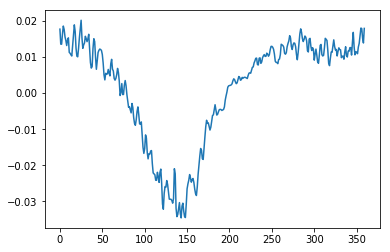

In [86]:
plt.plot(range(360), (dFetb*dXLDdt * 360*86400).roll(day=-180))

In [23]:
n500 = 40
diff_M = dfz_c[:,:n500].max()
diff_M

<xarray.DataArray ()>
array(5.079728e-09)

In [26]:
wpbp = xr.open_dataset(op.join(pdir,'APEconversion_05km.nc')).wpbp
wpbp.coords['days'] = ('time', np.tile(range(24),23))
with ProgressBar():
    wpbp_d = wpbp.sel(YC=slice(6e5,14e5)).groupby('days').mean(['time','YC','XC']).compute()
wpbp_d

<xarray.DataArray 'wpbp' (days: 24, Zl: 76)>
array([[-7.187066e-09,  1.332598e-10,  3.231533e-10, ...,  1.130260e-09,
         3.394472e-10,  7.082715e-11],
       [-1.544291e-08,  1.299605e-10,  3.189735e-10, ...,  1.188880e-09,
         3.307010e-10,  6.157563e-11],
       [-1.069393e-08,  1.325497e-10,  3.251550e-10, ...,  1.065574e-09,
         3.010058e-10,  6.190637e-11],
       ...,
       [ 7.180843e-09,  2.704006e-10,  6.088511e-10, ...,  9.565284e-10,
         2.700874e-10,  5.531997e-11],
       [ 1.512411e-09,  2.137826e-10,  4.909713e-10, ...,  1.150734e-09,
         3.369943e-10,  6.554798e-11],
       [-7.243536e-09,  1.746427e-10,  4.073412e-10, ...,  1.023142e-09,
         2.853009e-10,  5.833577e-11]], dtype=float32)
Coordinates:
  * Zl       (Zl) float32 0.0 -1.0 -2.14 -3.44 -4.93 -6.63 -8.56 -10.76 ...
  * days     (days) int64 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 ...

In [35]:
wpbp.Zl[:n500]

<xarray.DataArray 'Zl' (Zl: 40)>
array([   0.  ,   -1.  ,   -2.14,   -3.44,   -4.93,   -6.63,   -8.56,  -10.76,
        -13.26,  -16.1 ,  -19.31,  -22.94,  -27.04,  -31.65,  -36.83,  -42.62,
        -49.09,  -56.29,  -64.27,  -73.1 ,  -82.83,  -93.52, -105.22, -117.98,
       -131.85, -146.88, -163.1 , -180.55, -199.25, -219.22, -240.49, -263.05,
       -286.92, -312.09, -338.55, -366.29, -395.29, -425.53, -456.98, -489.63],
      dtype=float32)
Coordinates:
  * Zl       (Zl) float32 0.0 -1.0 -2.14 -3.44 -4.93 -6.63 -8.56 -10.76 ...
Attributes:
    standard_name:      depth_at_upper_w_location
    long_name:          vertical coordinate of upper cell interface
    units:              m
    positive:           down
    axis:               Z
    c_grid_axis_shift:  -0.5

/home/takaya/miniconda3/envs/uptodate/lib/python3.6/site-packages/xarray/core/dataarray.py:2170: FutureWarning: roll_coords will be set to False in the future. Explicitly set roll_coords to silence warning.
  shifts=shifts, roll_coords=roll_coords, **shifts_kwargs)


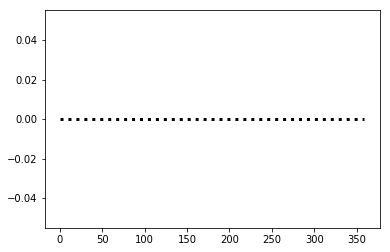

In [55]:
plt.plot(range(360), -MXLD.sel(YC=slice(nys,nyn)).mean(['YC']).roll(day=-0), 
        ls=':', lw=3, color='k')

In [55]:
len(np.arange(0,375,15))

25

/home/takaya/miniconda3/envs/uptodate/lib/python3.6/site-packages/xarray/core/dataarray.py:2170: FutureWarning: roll_coords will be set to False in the future. Explicitly set roll_coords to silence warning.
  shifts=shifts, roll_coords=roll_coords, **shifts_kwargs)


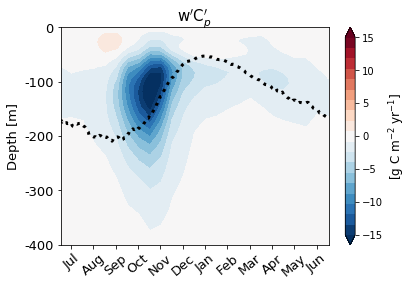

In [58]:
month = ['Jan','Feb','Mar','Apr','May','Jun','Jul','Aug','Sep','Oct','Nov','Dec']

fig, ax = plt.subplots()
im = ax.contourf(range(0,375,15), wpPp_d.Zl, wpPp_d.mean('YC').T.roll(day=-12)*106*12*1e-3*(360*86400), 
               levels=np.linspace(-1.5e1,1.5e1,20), 
               cmap='RdBu_r', extend='both')
# im = ax.contourf(range(14,360,15), wpPp_d.Zl, wpPp_d.mean('YC').T.roll(day=-13)*106*12*1e-3*(360*86400), 
#                 levels=np.linspace(-1.5e1,1.5e1,20), 
#                 cmap='RdBu_r', extend='both')
ax.plot(range(360), -MXLD.sel(YC=slice(6e5,14e5)).mean(['YC']).roll(day=-0), 
        ls=':', lw=3, color='k')

for c in im.collections:
    c.set_
ax.set_ylim([-4e2,0])
ax.set_yticks(np.arange(-400,100,100))
ax.set_yticklabels(np.arange(-400,100,100), fontsize=13)
ax.set_xticks(np.linspace(14,344,12))
ax.set_xticklabels(np.roll(np.array(month),-6), fontsize=13, rotation=40)
cbar = fig.colorbar(im, ax=ax, ticks=[-1.5e1,-1e1,-.5e1,0,.5e1,1e1,1.5e1], orientation='vertical')
cbar.set_label(r"[g C m$^{-2}$ yr$^{-1}$]", fontsize=12)
ax.set_title(r"w$'$C$_p'$", fontsize=15)
ax.set_ylabel(r"Depth [m]", fontsize=13)
plt.savefig(op.join(ddir,'Dalma_Dar02km/Figures/wP_dailyclimatology_02km.pdf'))

/home/takaya/miniconda3/envs/uptodate/lib/python3.6/site-packages/xarray/core/dataarray.py:2170: FutureWarning: roll_coords will be set to False in the future. Explicitly set roll_coords to silence warning.
  shifts=shifts, roll_coords=roll_coords, **shifts_kwargs)
/home/takaya/miniconda3/envs/uptodate/lib/python3.6/site-packages/matplotlib/figure.py:2369: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  warnings.warn("This figure includes Axes that are not compatible "


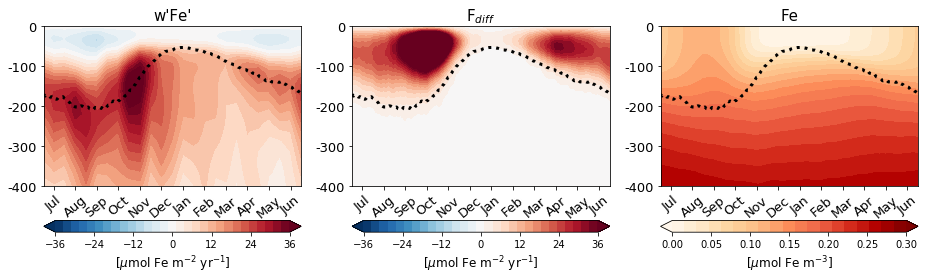

In [43]:
nys, nyn = (6e5,14e5)
month = ['Jan','Feb','Mar','Apr','May','Jun','Jul','Aug','Sep','Oct','Nov','Dec']

fig, (ax2,ax3,ax4) = plt.subplots(nrows=1, ncols=3, figsize=(13,4))
fig.set_tight_layout(True)
# im1 = ax1.contourf(np.linspace(0,345,24), wpbp_d.Zl, wpbp_d.T.roll(days=-12)/wpbp_d[:,:n500].max(), 
#                   levels=np.linspace(0.,1.,11), extend='both', cmap='magma')
im1 = ax2.contourf(range(0,346,15), wpFep_d.Zl, wpFep_d.T.roll(day=-12)*1e3*(360*86400), 
                  levels=np.linspace(-36,36,30), 
                   cmap='RdBu_r', extend='both')
im2 = ax2.contourf(range(14,360,15), wpFep_d.Zl, wpFep_d.T.roll(day=-13)*1e3*(360*86400), 
            levels=np.linspace(-36,36,30), 
            cmap='RdBu_r', extend='both')
im3 = ax3.contourf(range(360), dfz_c.Zl, dfz_c.T.roll(day=-180)*1e3*(360*86400), 
                  levels=np.linspace(-36,36,30), 
                   cmap='RdBu_r', extend='both')
# ax1.contour(range(0,360,15), wpbp_d.Zl, wpbp_d.T.roll(days=-12), colors='k', levels=np.linspace(2e-9,2e-8,8))
# ax2.contour(range(0,360,15), wpbp_d.Zl, wpbp_d.T.roll(days=-12), colors='k', levels=np.linspace(2e-9,2e-8,8))
# ax3.pcolormesh(range(360), dfz_c.Zl, ((dfz_c-adz_c)/diff_M).T.roll(days=-180), 
#                vmax=1, vmin=-1., cmap='RdBu_r', norm=SymLogNorm(0.01), rasterized=True)
im4 = ax4.contourf(range(360), Fe_c.Z, Fe_c.T.roll(day=-180)*1e3,
                  levels=np.linspace(0,0.3,20), 
                  extend='both', cmap='OrRd')
for c in im1.collections:
    c.set_rasterized(True)
for c in im2.collections:
    c.set_rasterized(True)
for c in im3.collections:
    c.set_rasterized(True)
for c in im4.collections:
    c.set_rasterized(True)
# ax1.plot(range(360), -MXLD.sel(YC=slice(nys,nyn)).mean(['YC']).roll(day=-180), 
#         ls=':', lw=3, color='k')
ax2.plot(range(360), -MXLD.sel(YC=slice(nys,nyn)).mean(['YC']).roll(day=-0), 
        ls=':', lw=3, color='k')
ax3.plot(range(360), -MXLD.sel(YC=slice(nys,nyn)).mean(['YC']).roll(day=-0), 
        ls=':', lw=3, color='k')
ax4.plot(range(360), -MXLD.sel(YC=slice(nys,nyn)).mean(['YC']).roll(day=-0), 
        ls=':', lw=3, color='k')
# ax1.set_ylim([-5e2,0])
# ax1.set_xlim([0.,359.])
ax2.set_ylim([-4e2,0])
ax3.set_ylim([-4e2,0])
ax4.set_ylim([-4e2,0])
# ax1.set_title(r"w'b'", fontsize=14)
ax2.set_title(r"w'Fe'", fontsize=15)
ax3.set_title(r"F$_{diff}$", fontsize=15)
ax4.set_title(r"Fe", fontsize=15)
# ax1.set_xticks(np.linspace(14,344,12))
# ax1.set_xticklabels(np.roll(np.array(month),-6), fontsize=12)
ax2.set_yticks(np.arange(-400,100,100))
ax3.set_yticks(np.arange(-400,100,100))
ax4.set_yticks(np.arange(-400,100,100))
ax2.set_yticklabels(np.arange(-400,100,100), fontsize=13)
ax3.set_yticklabels(np.arange(-400,100,100), fontsize=13)
ax4.set_yticklabels(np.arange(-400,100,100), fontsize=13)
ax2.set_xticks(np.linspace(14,344,12))
ax2.set_xticklabels(np.roll(np.array(month),-6), fontsize=13, rotation=40)
ax3.set_xticks(np.linspace(14,344,12))
ax3.set_xticklabels(np.roll(np.array(month),-6), fontsize=13, rotation=40)
ax4.set_xticks(np.linspace(14,344,12))
ax4.set_xticklabels(np.roll(np.array(month),-6), fontsize=13, rotation=40)
# ax2.set_ylabel(r"Depth [m]", fontsize=14)
# ax3.set_xlabel(r"Month", fontsize=14)
# fig.subplots_adjust(right=0.88)
# cbar_ax = fig.add_axes([0.9, 0.15, 0.015, 0.7])
# cbar = fig.colorbar(im, cax=cbar_ax)
# fig.colorbar(im1, ax=ax1)
cbar2 = fig.colorbar(im2, ax=ax2, ticks=[-36,-24,-12,0,12,24,36], orientation='horizontal')
cbar3 = fig.colorbar(im3, ax=ax3, ticks=[-36,-24,-12,0,12,24,36], orientation='horizontal')
cbar4 = fig.colorbar(im4, ax=ax4, ticks=[0,0.05,0.1,0.15,0.2,0.25,0.3], orientation='horizontal')
cbar2.set_label(r"[$\mu$mol Fe m$^{-2}$ yr$^{-1}$]", fontsize=12)
cbar3.set_label(r"[$\mu$mol Fe m$^{-2}$ yr$^{-1}$]", fontsize=12)
cbar4.set_label(r"[$\mu$mol Fe m$^{-3}$]", fontsize=12)
plt.savefig(op.join(ddir,'Dalma_Dar02km/Figures/IronFlux-P_dailyclimatology_02km.pdf'))

In [560]:
with ProgressBar():
    wpFep_normed = (wpFep.mean(['XC','YC'])/np.sqrt((wp**2).mean(['YC','XC'])
                                                    *grid.interp(Fep**2,'Z',boundary='fill').mean(['YC','XC']))).compute()
wpFep_normed

[########################################] | 100% Completed | 11.1s


<xarray.DataArray (time: 24, Zl: 76)>
array([[ 0.065752, -0.01827 , -0.023054, ..., -0.14783 , -0.103685, -0.080483],
       [ 0.072002, -0.03981 , -0.04436 , ..., -0.136059, -0.100703, -0.075896],
       [ 0.098353, -0.038497, -0.045449, ..., -0.19518 , -0.142505, -0.101754],
       ...,
       [ 0.09796 , -0.082535, -0.0913  , ..., -0.164489, -0.111234, -0.069788],
       [ 0.059563, -0.067086, -0.071378, ..., -0.181069, -0.129832, -0.088617],
       [ 0.032294, -0.034787, -0.037298, ..., -0.157977, -0.115486, -0.078684]],
      dtype=float32)
Coordinates:
  * Zl       (Zl) >f4 0.0 -1.0 -2.14 -3.44 -4.93 -6.63 -8.56 -10.76 -13.26 ...
    iter     (time) int64 3499200 3531600 3564000 3596400 3628800 3661200 ...
  * time     (time) float64 1.4e+08 1.413e+08 1.426e+08 1.439e+08 1.452e+08 ...
    seas     (time) int64 2 2 2 2 2 2 3 3 3 3 3 3 0 0 0 0 0 0 1 1 1 1 1 1
    day      (time) int64 12 13 14 15 16 17 18 19 20 21 22 23 0 1 2 3 4 5 6 ...

/home/takaya/miniconda3/envs/uptodate/lib/python3.6/site-packages/matplotlib/figure.py:2299: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  warnings.warn("This figure includes Axes that are not compatible "


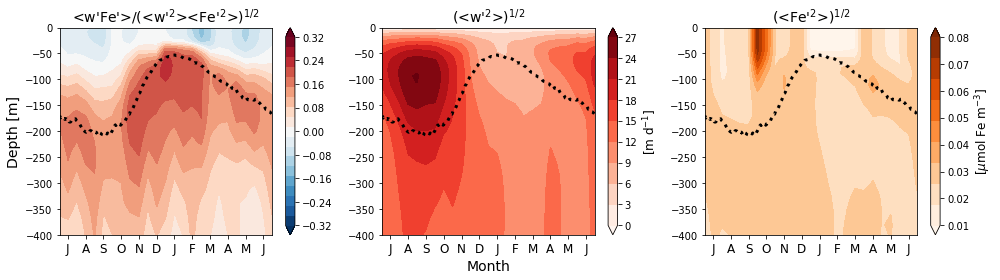

In [580]:
month = ['J','F','M','A','M','J','J','A','S','O','N','D']
fig, (ax1,ax2,ax3) = plt.subplots(nrows=1, ncols=3, figsize=(14,4))
fig.set_tight_layout(True)
im1 = ax1.contourf(range(0,346,15), wpFep_normed.Zl, wpFep_normed.T.roll(time=-0), 
                 levels=np.linspace(-.32,.32,20), 
                 cmap='RdBu_r', extend='both')
ax1.contourf(range(14,360,15), wpFep_normed.Zl, wpFep_normed.T.roll(time=-1), 
            levels=np.linspace(-.32,.32,20), 
            cmap='RdBu_r', extend='both')
im2 = ax2.contourf(range(0,346,15), wp.Zl, np.sqrt((wp**2).mean(['YC','XC'])).T*86400, 
                 levels=np.linspace(0,27,10), 
                 cmap='Reds', extend='both')
ax2.contourf(range(14,360,15), wp.Zl, np.sqrt((wp**2).mean(['YC','XC'])).T.roll(time=-1)*86400, 
            levels=np.linspace(0,27,10), 
            cmap='Reds', extend='both')
im3 = ax3.contourf(range(0,346,15), Fep.Z, np.sqrt((Fep**2).mean(['YC','XC'])).T*1e3, 
                 levels=np.linspace(0.01,0.08,10), 
                 cmap='Oranges', extend='both')
ax3.contourf(range(14,360,15), Fep.Z, np.sqrt((Fep**2).mean(['YC','XC'])).T.roll(time=-1)*1e3, 
            levels=np.linspace(0.01,0.08,10), 
            cmap='Oranges', extend='both')
ax1.plot(range(360), -MXLD.sel(YC=slice(nys,nyn)).mean(['YC']).roll(day=-0), 
       ls=':', lw=3, color='k')
ax2.plot(range(360), -MXLD.sel(YC=slice(nys,nyn)).mean(['YC']).roll(day=-0), 
       ls=':', lw=3, color='k')
ax3.plot(range(360), -MXLD.sel(YC=slice(nys,nyn)).mean(['YC']).roll(day=-0), 
       ls=':', lw=3, color='k')
ax1.set_ylim([-4e2,0])
ax2.set_ylim([-4e2,0])
ax3.set_ylim([-4e2,0])

ax1.set_ylabel(r"Depth [m]", fontsize=14)
ax2.set_xlabel(r"Month", fontsize=14)
ax1.set_xticks(np.linspace(14,344,12))
ax1.set_xticklabels(np.roll(np.array(month),-6), fontsize=12)
ax1.set_title(r"<w'Fe'>/(<w'$^2$><Fe'$^2$>)$^{1/2}$", fontsize=14)
ax2.set_xticks(np.linspace(14,344,12))
ax2.set_xticklabels(np.roll(np.array(month),-6), fontsize=12)
ax2.set_title(r"(<w'$^2$>)$^{1/2}$", fontsize=14)
ax3.set_xticks(np.linspace(14,344,12))
ax3.set_xticklabels(np.roll(np.array(month),-6), fontsize=12)
ax3.set_title(r"(<Fe'$^2$>)$^{1/2}$", fontsize=14)
cbar1 = fig.colorbar(im1, ax=ax1, ticks=[-0.32,-.24,-.16,-.08,0.,.08,.16,.24,.32])
cbar2 = fig.colorbar(im2, ax=ax2)
cbar3 = fig.colorbar(im3, ax=ax3, ticks=[0.01,0.02,0.03,0.04,0.05,0.06,0.07,.08])
cbar2.set_label(r"[m d$^{-1}$]", fontsize=12)
cbar3.set_label(r"[$\mu$mol Fe m$^{-3}$]", fontsize=12)

/home/takaya/miniconda3/envs/uptodate/lib/python3.6/site-packages/xarray/core/dataarray.py:2170: FutureWarning: roll_coords will be set to False in the future. Explicitly set roll_coords to silence warning.
  shifts=shifts, roll_coords=roll_coords, **shifts_kwargs)
/home/takaya/miniconda3/envs/uptodate/lib/python3.6/site-packages/matplotlib/figure.py:2369: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  warnings.warn("This figure includes Axes that are not compatible "


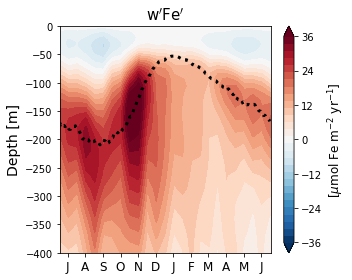

In [129]:
fig, ax = plt.subplots(figsize=(5,4))
fig.set_tight_layout(True)
im = ax.contourf(range(0,375,15), wpFep_d.Zl, wpFep_d.T.roll(day=-12)*360*86400e3, 
                levels=np.linspace(-36,36,30), 
                cmap='RdBu_r', extend='both')
# ax.contourf(range(14,360,15), wpFep_d.Zl, wpFep_d.T.roll(day=-13)*86400e3, 
#            levels=np.linspace(-.15,.15,20), 
#            cmap='RdBu_r', extend='both')
ax.plot(range(360), -MXLD.sel(YC=slice(nys,nyn)).mean(['YC']).roll(day=-0), 
        ls=':', lw=3, color='k')

for c in im.collections:
    c.set_rasterized(True)

ax.set_ylim([-4e2,0])
ax.set_title(r"w$'$Fe$'$", fontsize=15)

ax.set_xticks(np.linspace(14,344,12))
ax.set_xticklabels(np.roll(np.array(['J','F','M','A','M','J','J','A','S','O','N','D']),-6), fontsize=12)
ax.set_ylabel(r"Depth [m]", fontsize=14)
cbar = fig.colorbar(im, ax=ax, ticks=[-36,-24,-12,0,12,24,36])
cbar.set_label(r"[$\mu$mol Fe m$^{-2}$ yr$^{-1}$]", fontsize=12)
plt.savefig(op.join(ddir,'Dalma_Dar02km/Figures/VerticalFeflux_02km.pdf'))

In [172]:
# b = grid.diff(ds.PHIHYD,'Z',boundary='fill')/grid.diff(ds.Z,'Z',boundary='fill')
# bk = xrft.dft(b.chunk(chunks={'XC':200}), dim=['XC'], shift=False)
# bx = xr.DataArray(dsar.fft.ifft2(2j*np.pi*(bk*bk.freq_XC).data, axes=(-2,-1)).real,
#                  dims=b.dims, coords=b.coords)
# M2 = np.sqrt(bx**2 + grid.interp(grid.diff(b,'Y',boundary='fill')
#                                 / grid.diff(b.YC,'Y',boundary='fill'),
#                                 'Y',boundary='fill')**2,
#             )
# dbdz = grid.diff(b,'Z',boundary='fill')/grid.diff(ds.Zl,'Z',boundary='fill')
dFedz = -grid.diff(Fe1D,'Z',boundary='fill')/grid.diff(ds.Z,'Z',boundary='fill')

# dbdz.coords['days'] = ('time',np.tile(range(360),dy))
dFedz.coords['days'] = ('time',np.tile(np.roll(range(360),-180),dy))
# M2.coords['days'] = ('time',np.tile(range(360),dy))
with ProgressBar():
#     dbdz_d = dbdz.sel(YC=slice(6e5,14e5)).groupby('days').mean(['time','YC','XC']).compute()
    dFedz_d = dFedz.sel(YC=slice(6e5,14e5)).groupby('days').mean(['time','YC','XC']).compute()
#     M2_d = M2.sel(YC=slice(6e5,14e5)).groupby('days').mean(['time','YC','XC']).compute()

[########################################] | 100% Completed | 54.9s
[########################################] | 100% Completed | 42.0s


<xarray.DataArray (days: 360)>
array([1.053322e-05, 1.051900e-05, 1.046340e-05, ..., 1.055047e-05,
       1.052973e-05, 1.052332e-05], dtype=float32)
Coordinates:
  * days     (days) int64 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 ...

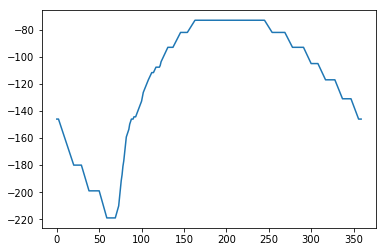

In [195]:
nZFe = dFedz_d[:,n10:].argmax(dim='Zl')
# nZFe
ZFe_d = nZFe.copy()
for tt in range(len(nZFe.days)):
    ZFe_d[tt] = dFedz_d.Zl[n10+nZFe[tt].data].data
# ZFe.coords['days'] = ('time',np.tile(np.roll(range(360),-180),dy))
# with ProgressBar():
#     ZFe_d = ZFe.groupby('days').mean(['time','YC','XC']).compute()
plt.plot(ZFe_d.rolling(days=9,min_periods=1,center=True).mean().roll(days=-180))

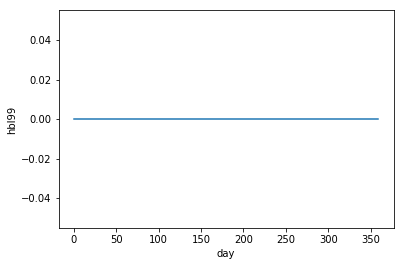

In [230]:
MXLD.sel(YC=slice(nys,nyn)).mean(['YC']).roll(day=-0).plot()

In [93]:
# Ptot_midd = (P1day + P2day)*106.*12.

# with ProgressBar():
#     Ptot_midd = (P1day + P2day).sel(YC=slice(6e5,14e5)).median(['YC','XC']).compute()
#     PPC_midd = PPCday.sel(YC=slice(6e5,14e5)).median(['YC','XC']).compute()

/home/takaya/miniconda3/envs/uptodate/lib/python3.6/site-packages/xarray/core/dataarray.py:2170: FutureWarning: roll_coords will be set to False in the future. Explicitly set roll_coords to silence warning.
  shifts=shifts, roll_coords=roll_coords, **shifts_kwargs)
/home/takaya/miniconda3/envs/uptodate/lib/python3.6/site-packages/matplotlib/figure.py:2369: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  warnings.warn("This figure includes Axes that are not compatible "


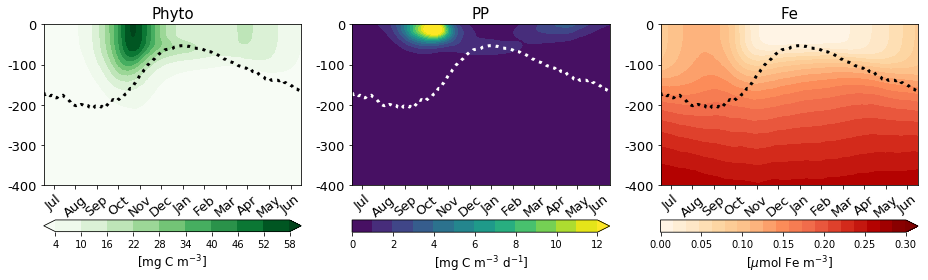

In [44]:
month = ['Jan','Feb','Mar','Apr','May','Jun','Jul','Aug','Sep','Oct','Nov','Dec']
fig, (ax1,ax3,ax5) = plt.subplots(nrows=1, ncols=3, figsize=(13,4))
fig.set_tight_layout(True)
# im1 = ax1.contourf(range(360), w2_sqrt.Zl, w2_sqrt.T.roll(day=-180)*86400, 
#                   levels=np.linspace(1,20.,11), cmap='Reds', extend='both')
# im2 = ax2.contourf(range(360), dbdz_d.Z, dbdz_d.T.roll(days=-180), 
#                   levels=np.linspace(-4e-5,4e-5,21), cmap='RdBu_r', extend='both')
# im1 = ax1.contourf(range(360), dFedz_d.Zl, dFedz_d.T.roll(days=-180)*1e3, 
#                   levels=np.linspace(0,.002,21), cmap='Oranges', extend='both')
# ax1.plot(range(360), ZFe_d.roll(days=-180), 'k:')
im1 = ax1.contourf(range(360), (P1day + P2day).Z, (P1day + P2day).T.roll(days=-180)*106.*12., 
                  levels=np.linspace(4,58,10), cmap='Greens', extend='both')
im3 = ax3.contourf(range(360), PPCday.Z, PPCday.T.roll(days=-180)*86400., 
                  levels=np.arange(0,13,1), extend='max')
im5 = ax5.contourf(range(360), Fe_c.Z, Fe_c.T.roll(day=-180)*1e3,
                  levels=np.linspace(0,0.3,20), 
                   extend='max', cmap='OrRd')
# ax1.contour(range(0,360,15), wpbp_d.Zl, wpbp_d.T.roll(days=-12), colors='k', levels=np.linspace(2e-9,2e-8,8))
# ax2.contour(range(0,360,15), wpbp_d.Zl, wpbp_d.T.roll(days=-12), colors='k', levels=np.linspace(2e-9,2e-8,8))
# ax3.pcolormesh(range(360), dfz_c.Zl, ((dfz_c-adz_c)/diff_M).T.roll(days=-180), 
#                vmax=1, vmin=-1., cmap='RdBu_r', norm=SymLogNorm(0.01), rasterized=True)
# ax1.plot(range(360), -MXLD.sel(YC=slice(nys,nyn)).mean(['YC']).roll(day=-0), 
#         ls=':', lw=3, color='k')
# ax2.plot(range(360), -MXLD.sel(YC=slice(nys,nyn)).mean(['YC']).roll(day=-180), 
#         ls=':', lw=3, color='k')
ax1.plot(range(360), -MXLD.sel(YC=slice(6e5,14e5)).mean(['YC']).roll(day=-0), 
        ls=':', lw=3, color='k')
ax3.plot(range(360), -MXLD.sel(YC=slice(6e5,14e5)).mean(['YC']).roll(day=-0), 
        ls=':', lw=3, color='w')
ax5.plot(range(360), -MXLD.sel(YC=slice(6e5,14e5)).mean(['YC']).roll(day=-0), 
        ls=':', lw=3, color='k')
for c in im1.collections:
    c.set_rasterized(True)
for c in im3.collections:
    c.set_rasterized(True)
for c in im5.collections:
    c.set_rasterized(True)
# ax1.set_ylim([-4e2,0])
# ax2.set_ylim([-5e2,0])
ax1.set_ylim([-4e2,0])
ax3.set_ylim([-4e2,0])
ax5.set_ylim([-4e2,0])
# ax2.set_xlim([0,359])
# ax2.set_title(r"db$/$dz", fontsize=14)
ax1.set_title(r"Phyto", fontsize=15)
# ax1.set_title(r"dFe$/$dz", fontsize=15)
ax3.set_title(r"PP", fontsize=15)
ax5.set_title(r"Fe", fontsize=15)
# ax1.set_xticks(np.linspace(14,344,12))
# ax1.set_xticklabels(np.roll(np.array(month),-6), fontsize=12)
# ax2.set_xticks(np.linspace(14,344,12))
# ax2.set_xticklabels(np.roll(np.array(month),-6), fontsize=12)
ax1.set_yticks(np.arange(-400,100,100))
ax3.set_yticks(np.arange(-400,100,100))
ax5.set_yticks(np.arange(-400,100,100))
ax1.set_yticklabels(np.arange(-400,100,100), fontsize=13)
ax3.set_yticklabels(np.arange(-400,100,100), fontsize=13)
ax5.set_yticklabels(np.arange(-400,100,100), fontsize=13)
ax1.set_xticks(np.linspace(14,344,12))
ax1.set_xticklabels(np.roll(np.array(month),-6), fontsize=13, rotation=40)
ax3.set_xticks(np.linspace(14,344,12))
ax3.set_xticklabels(np.roll(np.array(month),-6), fontsize=13, rotation=40)
ax5.set_xticks(np.linspace(14,344,12))
ax5.set_xticklabels(np.roll(np.array(month),-6), fontsize=13, rotation=40)
# ax1.set_ylabel(r"Depth [m]", fontsize=14)
# ax2.set_xlabel(r"Month", fontsize=13)
# fig.subplots_adjust(right=0.88)
# cbar_ax = fig.add_axes([0.9, 0.15, 0.015, 0.7])
# cbar = fig.colorbar(im, cax=cbar_ax)
# cbar1 = fig.colorbar(im1, ax=ax1, ticks=1e-4*np.array([0,4,8,12,16,20]))
# fig.colorbar(im2, ax=ax2)
cbar1 = fig.colorbar(im1, ax=ax1, orientation='horizontal')
cbar3 = fig.colorbar(im3, ax=ax3, orientation='horizontal')
cbar5 = fig.colorbar(im5, ax=ax5, ticks=[0,0.05,0.1,0.15,0.2,0.25,0.3], orientation='horizontal')
cbar5.set_label(r"[$\mu$mol Fe m$^{-3}$]", fontsize=12)
cbar3.set_label(r"[mg C m$^{-3}$ d$^{-1}$]", fontsize=12)
# cbar1.set_label(r"[$\mu$mol Fe m$^{-4}$]", fontsize=12)
cbar1.set_label(r"[mg C m$^{-3}$]", fontsize=12)
plt.savefig(op.join(ddir,'Dalma_Dar02km/Figures/P-PP-Fe_dailyclimatology_02km.pdf'))

NameError: name 'Consumpday' is not defined

/home/takaya/miniconda3/envs/uptodate/lib/python3.6/site-packages/matplotlib/figure.py:2369: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  warnings.warn("This figure includes Axes that are not compatible "


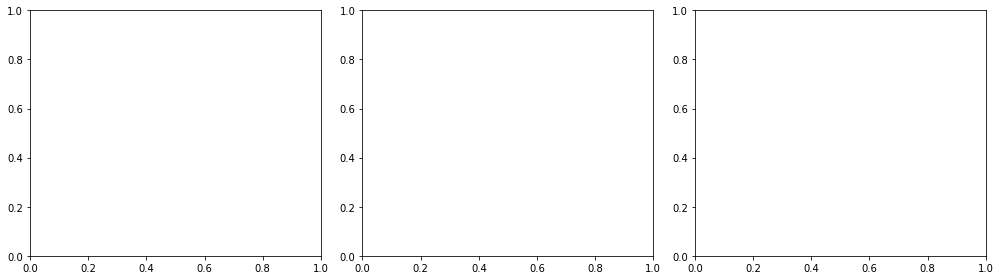

In [42]:
month = ['J','F','M','A','M','J','J','A','S','O','N','D']
fig, (ax1,ax3,ax5) = plt.subplots(nrows=1, ncols=3, figsize=(14,4))
fig.set_tight_layout(True)
# im1 = ax1.contourf(range(360), w2_sqrt.Zl, w2_sqrt.T.roll(day=-180)*86400, 
#                   levels=np.linspace(1,20.,11), cmap='Reds', extend='both')
# im2 = ax2.contourf(range(360), dbdz_d.Z, dbdz_d.T.roll(days=-180), 
#                   levels=np.linspace(-4e-5,4e-5,21), cmap='RdBu_r', extend='both')
# im1 = ax1.contourf(range(360), dFedz_d.Zl, dFedz_d.T.roll(days=-180)*1e3, 
#                   levels=np.linspace(0,.002,21), cmap='Oranges', extend='both')
# ax1.plot(range(360), ZFe_d.roll(days=-180), 'k:')
im1 = ax1.contourf(range(360), Consumpday.Z, Consumpday.T.roll(days=-180)*1e3*(360*86400), 
                  levels=np.linspace(-0.6,0.6,20), cmap='RdBu_r', extend='both')
im3 = ax3.contourf(range(360), Reminday.Z, Reminday.T.roll(days=-180)*1e3*(360*86400), 
                  levels=np.linspace(-0.6,0.6,20), cmap='RdBu_r', extend='both')
im5 = ax5.contourf(range(360), dfz_c.Zl, dfz_c.T.roll(day=-180)*1e3*(360*86400), 
                  levels=np.linspace(-36,36,20), 
                  cmap='RdBu_r', extend='both')
# ax1.contour(range(0,360,15), wpbp_d.Zl, wpbp_d.T.roll(days=-12), colors='k', levels=np.linspace(2e-9,2e-8,8))
# ax2.contour(range(0,360,15), wpbp_d.Zl, wpbp_d.T.roll(days=-12), colors='k', levels=np.linspace(2e-9,2e-8,8))
# ax3.pcolormesh(range(360), dfz_c.Zl, ((dfz_c-adz_c)/diff_M).T.roll(days=-180), 
#                vmax=1, vmin=-1., cmap='RdBu_r', norm=SymLogNorm(0.01), rasterized=True)
# ax1.plot(range(360), -MXLD.sel(YC=slice(nys,nyn)).mean(['YC']).roll(day=-0), 
#         ls=':', lw=3, color='k')
# ax2.plot(range(360), -MXLD.sel(YC=slice(nys,nyn)).mean(['YC']).roll(day=-180), 
#         ls=':', lw=3, color='k')
ax1.plot(range(360), -MXLD.sel(YC=slice(6e5,14e5)).mean(['YC']).roll(day=-0), 
        ls=':', lw=3, color='k')
ax3.plot(range(360), -MXLD.sel(YC=slice(6e5,14e5)).mean(['YC']).roll(day=-0), 
        ls=':', lw=3, color='k')
ax5.plot(range(360), -MXLD.sel(YC=slice(6e5,14e5)).mean(['YC']).roll(day=-0), 
        ls=':', lw=3, color='k')
# ax1.set_ylim([-4e2,0])
# ax2.set_ylim([-5e2,0])
ax1.set_ylim([-4e2,0])
ax3.set_ylim([-4e2,0])
ax5.set_ylim([-4e2,0])
# ax2.set_xlim([0,359])
# ax2.set_title(r"db$/$dz", fontsize=14)
ax1.set_title(r"$\dot{\tt Fe}_p$", fontsize=15)
# ax1.set_title(r"dFe$/$dz", fontsize=15)
ax3.set_title(r"$\dot{\tt Fe}_r$", fontsize=15)
ax5.set_title(r"F$_{diff}$", fontsize=15)
# ax1.set_xticks(np.linspace(14,344,12))
# ax1.set_xticklabels(np.roll(np.array(month),-6), fontsize=12)
# ax2.set_xticks(np.linspace(14,344,12))
# ax2.set_xticklabels(np.roll(np.array(month),-6), fontsize=12)
ax1.set_xticks(np.linspace(14,344,12))
ax1.set_xticklabels(np.roll(np.array(month),-6), fontsize=12)
ax3.set_xticks(np.linspace(14,344,12))
ax3.set_xticklabels(np.roll(np.array(month),-6), fontsize=12)
ax5.set_xticks(np.linspace(14,344,12))
ax5.set_xticklabels(np.roll(np.array(month),-6), fontsize=12)
ax1.set_ylabel(r"Depth [m]", fontsize=14)
# ax2.set_xlabel(r"Month", fontsize=13)
# fig.subplots_adjust(right=0.88)
# cbar_ax = fig.add_axes([0.9, 0.15, 0.015, 0.7])
# cbar = fig.colorbar(im3, cax=cbar_ax, ticks=np.array([-.8,-.4,0,.4,.8]))
cbar1 = fig.colorbar(im1, ax=ax1, ticks=np.array([-.6,-.4,-.2,0,.2,.4,.6]))
cbar3 = fig.colorbar(im3, ax=ax3, ticks=np.array([-.6,-.4,-.2,0,.2,.4,.6]))
# fig.colorbar(im2, ax=ax2)
# cbar3 = fig.colorbar(im3, ax=ax3)
cbar5 = fig.colorbar(im5, ax=ax5, ticks=[-36,-24,-12,0,12,24,36])
cbar1.set_label(r"[$\mu$mol Fe m$^{-3}$ yr$^{-1}$]", fontsize=12)
cbar3.set_label(r"[$\mu$mol Fe m$^{-3}$ yr$^{-1}$]", fontsize=12)
cbar5.set_label(r"[$\mu$mol Fe m$^{-2}$ yr$^{-1}$]", fontsize=12)
# plt.tight_layout(pad=2.4)
# cbar1.set_label(r"[$\mu$mol Fe m$^{-4}$]", fontsize=12)
# cbar3.set_label(r"[mgC m$^{-3}$]", fontsize=12)
plt.savefig(op.join(ddir,'Dalma_Dar02km/Figures/Iron_consump-remin_dailyclim_02km.pdf'))

/home/takaya/miniconda3/envs/uptodate/lib/python3.6/site-packages/xarray/core/dataarray.py:2170: FutureWarning: roll_coords will be set to False in the future. Explicitly set roll_coords to silence warning.
  shifts=shifts, roll_coords=roll_coords, **shifts_kwargs)
/home/takaya/miniconda3/envs/uptodate/lib/python3.6/site-packages/matplotlib/figure.py:2369: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  warnings.warn("This figure includes Axes that are not compatible "


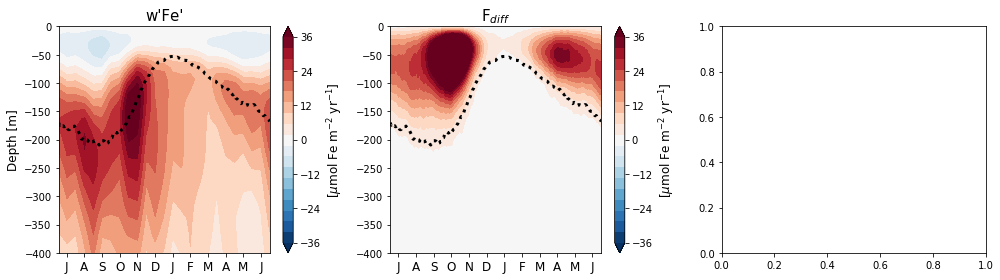

In [214]:
month = ['J','F','M','A','M','J','J','A','S','O','N','D']

fig, (ax1,ax2,ax3) = plt.subplots(nrows=1, ncols=3, figsize=(14,4))
fig.set_tight_layout(True)
im1 = ax1.contourf(range(0,346,15), wpFep_d.Zl, wpFep_d.roll(day=-12).T*1e3*360*86400, 
                  levels=np.linspace(-36,36,20), cmap='RdBu_r', extend='both')
ax1.contourf(range(14,360,15), wpFep_d.Zl, wpFep_d.roll(day=-13).T*1e3*360*86400, 
            levels=np.linspace(-36,36,20), cmap='RdBu_r', extend='both')
# im2 = ax2.contourf(range(0,346,15), wMLIFe_d.Zl, wMLIFe_d.roll(day=-12).T*1e3*360*86400,
#                   levels=np.linspace(-.6,.6,20), extend='both', cmap='RdBu_r')
# ax2.contourf(range(14,360,15), wMLIFe_d.Zl, wMLIFe_d.roll(day=-13).T*1e3*360*86400,
#             levels=np.linspace(-.6,.6,20), extend='both', cmap='RdBu_r')
# im3 = ax3.contourf(range(360), Fe_c.Z, Fe_c.roll(day=-180).T*1e3, 
#                   levels=np.linspace(0,.3,20), cmap='OrRd', extend='max')
im2 = ax2.contourf(range(360), dfz_c.Zl, dfz_c.T.roll(day=-180)*1e3*(360*86400), 
                  levels=np.linspace(-36,36,20), 
                  cmap='RdBu_r', extend='both')
ax1.plot(range(360), -MXLD.sel(YC=slice(6e5,14e5)).mean(['YC']).roll(day=-0), 
        ls=':', lw=3, color='k')
ax2.plot(range(360), -MXLD.sel(YC=slice(6e5,14e5)).mean(['YC']).roll(day=-0), 
        ls=':', lw=3, color='k')
# ax3.plot(range(360), -hbl99_day.sel(YC=slice(6e5,14e5)).mean(['YC']).roll(day=-180), 
#        ls=':', lw=3, color='k')
ax1.set_title(r"w'Fe'", fontsize=15)
# ax2.set_title(r"w$_{MLI}$Fe", fontsize=15)
ax2.set_title(r"F$_{diff}$", fontsize=15)
ax1.set_ylabel(r"Depth [m]", fontsize=12)
# ax2.set_xlabel(r"Month", fontsize=12)
ax1.set_xticks(np.linspace(14,344,12))
ax1.set_xticklabels(np.roll(np.array(month),-6), fontsize=12)
ax1.set_ylim([-400,0])
ax2.set_xticks(np.linspace(14,344,12))
ax2.set_xticklabels(np.roll(np.array(month),-6), fontsize=12)
ax2.set_ylim([-400,0])
# ax3.set_xticks(np.linspace(14,344,12))
# ax3.set_xticklabels(np.roll(np.array(month),-6), fontsize=12)
# ax3.set_ylim([-400,0])
# fig.colorbar(im1, ax=ax1, ticks=[-10,-7.5,-5.,-2.5,0,2.5,5.,7.5,10])
# fig.colorbar(im2, ax=ax2, ticks=[-.8,-.6,-.4,-.2,0,.2,.4,.6,.8])
# cbar = fig.colorbar(im3, ax=ax3, ticks=[0,6,12,18,24,30])
# fig.subplots_adjust(right=0.85)
# cbar_ax = fig.add_axes([0.88, 0.16, 0.014, 0.68])
# cbar = fig.colorbar(im3, cax=cbar_ax, ticks=[-10,-8,-6,-4,-2,0,2,4,6,8,10])
# cbar.set_label(r'[$\mu$mol Fe m$^{-2}$ yr$^{-1}$]', fontsize=12)
cbar1 = fig.colorbar(im1, ax=ax1, ticks=[-36,-24,-12,0,12,24,36])
# cbar2 = fig.colorbar(im2, ax=ax2, ticks=[-.6,-.4,-.2,0,.2,.4,.6])
cbar2 = fig.colorbar(im2, ax=ax2, ticks=[-36,-24,-12,0,12,24,36])
cbar1.set_label(r"[$\mu$mol Fe m$^{-2}$ yr$^{-1}$]", fontsize=12)
cbar2.set_label(r"[$\mu$mol Fe m$^{-2}$ yr$^{-1}$]", fontsize=12)
# cbar3.set_label(r"[$\mu$mol Fe m$^{-2}$ yr$^{-1}$]", fontsize=12)
plt.savefig(op.join(ddir,'Dalma_Dar02km/Figures/VerticalFeflux-02km.pdf'))

NameError: name 'wpFep_d' is not defined

/home/takaya/miniconda3/envs/uptodate/lib/python3.6/site-packages/matplotlib/figure.py:2369: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  warnings.warn("This figure includes Axes that are not compatible "


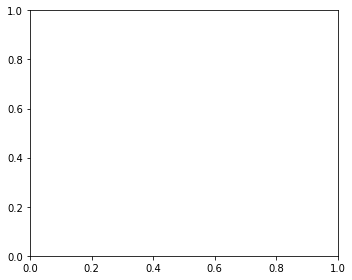

In [71]:
fig, ax = plt.subplots(figsize=(5,4))
fig.set_tight_layout(True)
im = ax.contourf(range(0,346,15), wpFep_d.Zl, (wpFep_d+dfz_c[::15].data).roll(day=-12).T*1e3*360*86400, 
                levels=np.linspace(-36,36,20), cmap='RdBu_r', extend='both')
ax.contourf(range(14,360,15), wpFep_d.Zl, (wpFep_d+dfz_c[::15].data).roll(day=-13).T*1e3*360*86400, 
           levels=np.linspace(-36,36,20), cmap='RdBu_r', extend='both')
cbar = fig.colorbar(im, ax=ax, ticks=[-36,-24,-12,0,12,24,36])
cbar.set_label(r"[$\mu$mol Fe m$^{-2}$ yr$^{-1}$]", fontsize=12)
ax.set_xticks(np.linspace(14,344,12))
ax.set_xticklabels(np.roll(np.array(month),-6), fontsize=12)
ax.set_ylim([-400,0])
ax.plot(range(360), -MXLD.sel(YC=slice(6e5,14e5)).mean(['YC']).roll(day=-0), 
       ls=':', lw=3, color='k')

In [53]:
with ProgressBar():
    TpFep_clim = TpFep.mean(['time','XC']).compute()

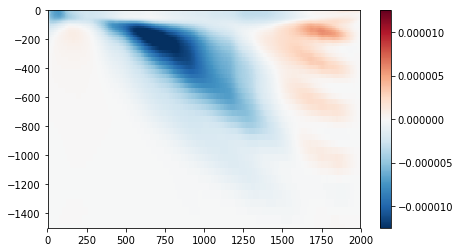

In [55]:
fig, ax = plt.subplots(figsize=(7,4))
im = ax.pcolormesh(TpFep.YC*1e-3, TpFep.Z, TpFep_clim,
                  cmap='RdBu_r', vmin=-1.25e-5, vmax=1.25e-5)
ax.set_ylim([-1500,0.])
fig.colorbar(im, ax=ax)

In [24]:
with ProgressBar():
    Fent = (dFetb*(XLD_t + vXLD_y)).sel(YC=slice(6e5,14e5)).mean('YC').compute()
Fent

<xarray.DataArray (day: 360)>
array([-9.959122e-11, -9.372963e-11, -6.908899e-11, ..., -1.602841e-10,
       -1.434317e-10, -1.205979e-10])
Coordinates:
  * day      (day) int64 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 ...

/home/takaya/miniconda3/envs/uptodate/lib/python3.6/site-packages/matplotlib/figure.py:2299: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  warnings.warn("This figure includes Axes that are not compatible "


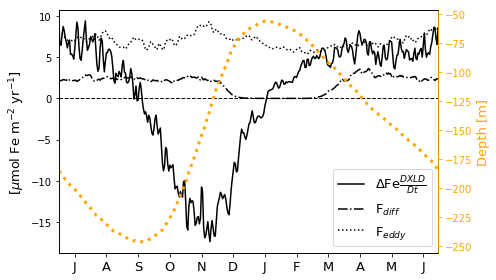

In [25]:
month = ['J','F','M','A','M','J','J','A','S','O','N','D']

fig, ax = plt.subplots(figsize=(7,4))
fig.set_tight_layout(True)
ax2 = ax.twinx()
ax.plot(range(360), Fent.roll(day=-180) * 1e3*360*86400, 'k', label=r"$\Delta$Fe$\frac{DXLD}{Dt}$")
ax.plot(range(360), dfz_c_XLD.roll(day=-180) * 1e3*360*86400, 'k-.', label=r"F$_{diff}$")
ax.plot(range(360), wpFep_c_XLD.roll(day=-180) * 1e3*360*86400, 'k:', label=r"F$_{eddy}$")
ax.plot(range(360), np.zeros(360), 'k--', lw=1)
ax.set_ylabel(r"[$\mu$mol Fe m$^{-2}$ yr$^{-1}$]", fontsize=13)
ax.set_xlim([0,359])
ax.legend(loc='lower right', fontsize=13)
ax.set_xticks(np.linspace(15,345,12))
ax.set_xticklabels(np.roll(np.array(month),-6), fontsize=13)
im, = ax2.plot(range(360), -MXLD.sel(YC=slice(6e5,14e5)).mean(['YC']).roll(day=-180), 
              ls=':', lw=3, color='orange')
ax2.spines["right"].set_edgecolor(im.get_color())
ax2.tick_params(axis='y', colors=im.get_color())
ax2.set_ylabel(r"Depth [m]", fontsize=13, color='orange')
plt.savefig(op.join(pdir,'Figures/VertFlux_wEntrainment.pdf'))

In [84]:
bdir = '/swot/SUM02/takaya/channelMOC-Darwin/'
# ds20mli = xr.open_dataset(op.join(bdir,'Ptot_600-1400km_20kmMLI-02kmDailyClim.nc'))
ds20mli = xr.open_dataset(op.join(bdir,'Ptot_600-1400km_20kmMLI02Tau2e-6_Ce007-fm0R200DailyClim.nc'))
PtotC20mliR = (ds20mli.Ptot_d*ds20mli.drF).sum('Z')*106.*12.
# nz = 8
# with ProgressBar():
#     PtotC20mli = ((ds20mli.Ptot_d*ds20mli.drF)[:,:nz].sum('Z')
#                   * np.abs(ds20mli.Zl[nz])**-1*106.*12.).compute()
hbl9920mli = xr.open_dataset(op.join(bdir,'KPPhbl_99percentile_20kmMLI02kmTau2e-6_Ce007-fm0R200.nc'), 
                            decode_times=False).hbl99
with ProgressBar():
    MXLDmli = hbl9920mli.groupby('day').mean('time').compute()

In [260]:
(PtotCday.sum()/PtotC20mli.sum()).values

array(1.5729002, dtype=float32)

In [74]:
u1max = 1/1.24 # [1/d]
u2max = 1/1.8 # [1/d]
Kp1 = 0.018
Kp2 = 0.010
Ki1 = 1.05e-3
Ki2 = 5.9e-3
Fo1 = Kp1/(Kp1+Ki1)*np.exp(Ki1/Kp1*np.log(Ki1/(Kp1+Ki1)))
Fo2 = Kp2/(Kp2+Ki2)*np.exp(Ki2/Kp2*np.log(Ki2/(Kp2+Ki2)))

In [75]:
def nan_helper(y):
    """Helper to handle indices and logical indices of NaNs.

    Input:
        - y, 1d numpy array with possible NaNs
    Output:
        - nans, logical indices of NaNs
        - index, a function, with signature indices= index(logical_indices),
          to convert logical indices of NaNs to 'equivalent' indices
    Example:
        >>> # linear interpolation of NaNs
        >>> nans, x= nan_helper(y)
        >>> y[nans]= np.interp(x(nans), x(~nans), y[~nans])
    """

    return np.isnan(y), lambda z: z.nonzero()[0]

In [76]:
PARvar = xr.open_dataarray(op.join('/swot/SUM05/takaya/SeaWiFS/','PAR_45-65_SeaWiFS.nc'))
PAR_mon = np.zeros((12,300))
mon_days = {'Jan':range(31),'Feb':range(31,59),'Mar':range(59,90),'Apr':range(90,120),'May':range(120,151),
           'Jun':range(151,181),'Jul':range(181,212),'Aug':range(212,243),'Sep':range(243,273),'Oct':range(273,304),
           'Nov':range(304,334),'Dec':range(334,365)}
months = ['Jan','Feb','Mar','Apr','May','Jun','Jul','Aug','Sep','Oct','Nov','Dec']
i = 0
for month in months:
    PAR_mon[i] = np.nanmean(PARvar[mon_days[month][0]:mon_days[month][-1]], axis=0)
    i += 1

PAR_mon = xr.DataArray(PAR_mon, dims=['month','lat'],
                       coords={'month':range(1,13), 'lat':PARvar.lat.data}
                      )
ny = 1000
for i in range(12):
    nans, x = nan_helper(PAR_mon[i].data)
    PAR_mon[i,nans] = np.interp(x(nans), x(~nans), PAR_mon.data[i,~nans])
par_mid = PAR_mon.sel(lat=slice(-45.,-60.)).mean('lat')
func = pchip(np.arange(0,14), np.append(par_mid[-1].values, np.append(par_mid.values, par_mid[0].values)))
par_north = func(np.arange(1,13))+4.5
# par_north = 3e1+2e1*np.cos(np.pi/12*np.arange(1,25))
par_ideal = par_north[:,np.newaxis] + np.linspace(-9.,0,num=ny)[np.newaxis,:]
par_ideal[par_ideal<0.] = 0.

/home/takaya/miniconda3/envs/uptodate/lib/python3.6/site-packages/ipykernel_launcher.py:9: RuntimeWarning: Mean of empty slice
  if __name__ == '__main__':


In [77]:
par_appended = np.append(np.append(par_ideal[-1][np.newaxis,:],par_ideal,axis=0),par_ideal[0][np.newaxis,:],axis=0)
par_appended.shape

(14, 1000)

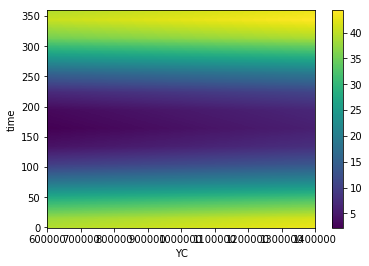

In [78]:
func = interp1d(range(-15,390,30), par_appended[:,300:700], axis=0)
par_day = xr.DataArray(func(range(0,360)), dims=['time','YC'],
                      coords={'time':range(360),'YC':ds.YC.sel(YC=slice(6e5,14e5)).data})
par_day.plot()

In [79]:
gammaI1 = (Fo1**-1 * (1.-np.exp(-Kp1*par_day)) * np.exp(-Ki1*par_day)).median(['YC'])
gammaI2 = (Fo2**-1 * (1.-np.exp(-Kp2*par_day)) * np.exp(-Ki2*par_day)).median(['YC'])

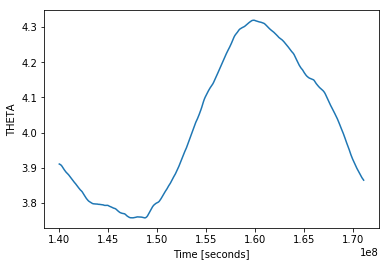

In [534]:
ds.THETA.sel(YC=slice(6e5,14e5))[:,:n100].mean(['Z','YC','XC']).plot()

In [231]:
with ProgressBar():
    Ztot = ((dsptr.PTRtave08+dsptr.PTRtave12).sel(YC=slice(6e5,14e5))*106*12).load().median(['YC','XC'])
Ztot

[########################################] | 100% Completed |  0.1s
[########################################] | 100% Completed |  0.1s
[########################################] | 100% Completed |  0.3s
[########################################] | 100% Completed | 42.6s


<xarray.DataArray (time: 12, Z: 76)>
array([[ 1.029786e-02,  1.029666e-02,  1.029543e-02, ..., -3.469262e-11,
        -3.691735e-11, -3.771789e-11],
       [ 5.916705e-03,  5.915665e-03,  5.914384e-03, ..., -3.444688e-11,
        -3.653430e-11, -3.729749e-11],
       [ 4.527838e-03,  4.527112e-03,  4.526302e-03, ..., -3.429485e-11,
        -3.623001e-11, -3.714299e-11],
       ...,
       [ 3.757945e-02,  3.757653e-02,  3.757327e-02, ..., -3.217271e-11,
        -3.451959e-11, -3.515161e-11],
       [ 3.360695e-02,  3.360391e-02,  3.360078e-02, ..., -3.192925e-11,
        -3.419727e-11, -3.487322e-11],
       [ 1.824172e-02,  1.824116e-02,  1.823961e-02, ..., -3.154237e-11,
        -3.393723e-11, -3.472929e-11]], dtype=float32)
Coordinates:
  * Z        (Z) >f4 -0.5 -1.57 -2.79 -4.185 ... -2625.955 -2757.325 -2912.665
    drF      (Z) >f4 1.0 1.14 1.3 1.49 1.7 ... 118.35 126.73 136.01 174.67
    PHrefC   (Z) >f4 4.905 15.4017 27.3699 ... 25760.62 27049.357 28573.244
    iter     (time) 

/home/takaya/miniconda3/envs/uptodate/lib/python3.6/site-packages/matplotlib/figure.py:2299: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  warnings.warn("This figure includes Axes that are not compatible "


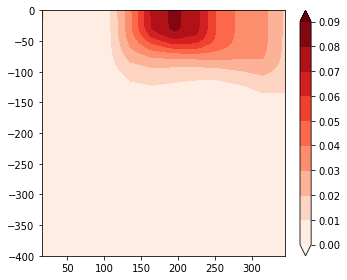

In [549]:
fig,ax = plt.subplots(figsize=(5,4))
fig.set_tight_layout(True)
im = ax.contourf(range(15,360,30),Ztot.Z, Ztot.T,cmap='Reds',levels=np.linspace(0,0.09,10),extend='both')
ax.set_ylim([-400,0])
fig.colorbar(im, ax=ax)

[########################################] | 100% Completed | 12min 17.2s


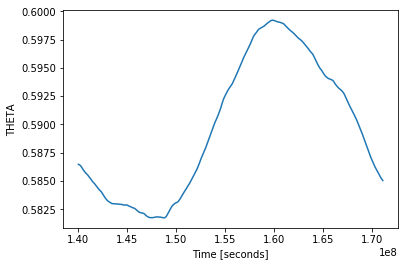

In [55]:
TAe = -4040.
Tkel = 273.15
Tref = 4 + Tkel
# Tnorm = 0.
To = .589
n100 = 22

with ProgressBar():
    gammaT = ((np.exp(TAe*((ds.THETA.sel(YC=slice(6e5,14e5))+Tkel)**-1 - Tref**-1))) 
             * To)[:,:n100].mean(['Z','YC','XC']).compute()
gammaT.plot()

In [81]:
kP1 = 0.035
kP2 = 0.015
r_FeP = 1.e-3
r_NP = 16
r_iP = 16
kFe1 = kP1 * r_FeP
kFe2 = kP2 * r_FeP
kN1 = kP1 * r_NP
kN2 = kP2 * r_NP
ki1 = kP1 * r_iP
n100 = 22

with ProgressBar():
    gammaFe1 = (Fe1D/(Fe1D+kFe1))[:,:n100].load().median(['Z','YC','XC'])
    gammaFe2 = (Fe1D/(Fe1D+kFe2))[:,:n100].load().median(['Z','YC','XC'])
gammaFe1

[########################################] | 100% Completed |  0.1s
[########################################] | 100% Completed |  0.1s
[########################################] | 100% Completed |  0.4s
[########################################] | 100% Completed |  0.7s
[########################################] | 100% Completed |  7min 49.1s
[########################################] | 100% Completed |  0.1s
[########################################] | 100% Completed |  0.1s
[########################################] | 100% Completed |  0.4s
[########################################] | 100% Completed |  0.7s
[########################################] | 100% Completed | 39.7s


<xarray.DataArray 'TRAC03' (time: 360)>
array([0.71391 , 0.716013, 0.718016, ..., 0.697534, 0.700076, 0.702547],
      dtype=float32)
Coordinates:
    iter     (time) int64 3501360 3503520 3505680 ... 4272480 4274640 4276800
  * time     (time) float64 1.401e+08 1.401e+08 1.402e+08 ... 1.71e+08 1.711e+08

In [236]:
with ProgressBar():
    gammaFe1m = (Femn/(Femn+kFe1))[:,:n100].load().median(['Z','YC','XC'])
    gammaFe2m = (Femn/(Femn+kFe2))[:,:n100].load().median(['Z','YC','XC'])
    gammaP1m = (POmn/(POmn+kP1))[:,:n100].load().median(['Z','YC','XC'])
    gammaP2m = (POmn/(POmn+kP2))[:,:n100].load().median(['Z','YC','XC'])
    gammaN1m = (NOmn/(NOmn+kN1))[:,:n100].load().median(['Z','YC','XC'])
    gammaN2m = (NOmn/(NOmn+kN2))[:,:n100].load().median(['Z','YC','XC'])
    gammaSi1m = (Simn/(Simn+ki1))[:,:n100].load().median(['Z','YC','XC'])

[########################################] | 100% Completed |  0.1s
[########################################] | 100% Completed |  0.1s
[########################################] | 100% Completed |  0.4s
[########################################] | 100% Completed |  1.9s
[########################################] | 100% Completed |  0.1s
[########################################] | 100% Completed |  0.1s
[########################################] | 100% Completed |  0.3s
[########################################] | 100% Completed |  1.8s
[########################################] | 100% Completed |  0.1s
[########################################] | 100% Completed |  0.1s
[########################################] | 100% Completed |  0.3s
[########################################] | 100% Completed |  8.4s
[########################################] | 100% Completed |  0.1s
[########################################] | 100% Completed |  0.1s
[########################################] | 100

/home/takaya/miniconda3/envs/uptodate/lib/python3.6/site-packages/matplotlib/figure.py:2369: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  warnings.warn("This figure includes Axes that are not compatible "


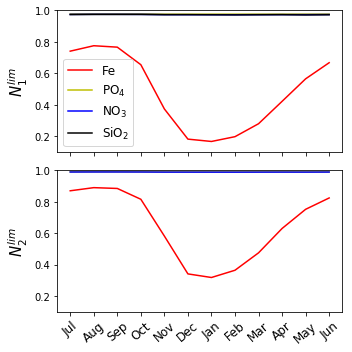

In [180]:
fig, (ax1,ax2) = plt.subplots(nrows=2, ncols=1, figsize=(5,5))
fig.set_tight_layout(True)
# ax3 = ax1.twinx()
# ax4 = ax2.twinx()
ax1.plot(range(12), gammaFe1m, 'r', label=r'Fe')
ax2.plot(range(12), gammaFe2m, 'r')
ax1.plot(range(12), gammaP1m, 'y', label=r'PO$_4$')
ax2.plot(range(12), gammaP2m, 'y')
ax1.plot(range(12), gammaN1m, 'b', label=r'NO$_3$')
ax2.plot(range(12), gammaN2m, 'b')
ax1.plot(range(12), gammaSi1m, 'k', label=r"SiO$_2$")
ax1.set_ylim([0.1,1])
ax2.set_ylim([0.1,1])
# ax3.set_ylim([0.96,1])
# ax4.set_ylim([0.96,1])
ax1.set_xticks(range(12))
ax1.set_xticklabels([])
ax2.set_xticks(range(12))
ax2.set_xticklabels(['Jul','Aug','Sep','Oct','Nov','Dec','Jan','Feb','Mar','Apr','May','Jun'],
                   rotation=40, fontsize=12)
ax1.set_ylabel(r"$N^{lim}_1$", fontsize=15)
ax2.set_ylabel(r"$N^{lim}_2$", fontsize=15)
# fig.suptitle(r"Nutrient limitation", fontsize=14)
# ax3.set_ylabel(r"$\gamma^{P,N,Si}_1$", fontsize=15)
# ax4.set_ylabel(r"$\gamma^{P,N,Si}_2$", fontsize=15)
ax1.legend(loc='lower left', fontsize=12)
# ax3.legend(loc='upper right')
plt.savefig(op.join(ddir,'Dalma_Dar02km/Figures/Nut-limitation.pdf'))

In [82]:
with ProgressBar():
    Fe100 = grid.cumsum((Fe1D*ds.hFacC*ds.drF).load().median(['YC','XC']),'Z',
                        boundary='fill')[:,n100] * np.abs(ds.Zl[n100])**-1
Fe100

[########################################] | 100% Completed |  0.1s
[########################################] | 100% Completed |  0.1s
[########################################] | 100% Completed |  0.3s
[########################################] | 100% Completed |  0.7s
[########################################] | 100% Completed | 33.0s


<xarray.DataArray (time: 360)>
array([9.257880e-05, 9.347629e-05, 9.435238e-05, ..., 8.655632e-05,
       8.747010e-05, 8.836775e-05], dtype=float32)
Coordinates:
  * time     (time) float64 1.401e+08 1.401e+08 1.402e+08 ... 1.71e+08 1.711e+08
    Zl       >f4 -105.22

In [83]:
with ProgressBar():
    wRMS = (np.sqrt((open_mdsdataset(op.join(ddir,'Dalma_Dar02km/runs'), 
#                      grid_dir=op.join(ddir,'02km_grid'),
                                    iters=range(ts,te+int(2160*15),int(2160*15)),
                                    prefix=['W'],
                                    delta_t=dt
                                    ).W.sel(YC=slice(6e5,14e5))**2).mean(['YC','XC'])[:,:n100])
            * ds.drC.data[:n100]).sum(dim='Zl').compute() * np.abs(ds.Z[n100])**-1
wRMS

[########################################] | 100% Completed |  0.1s
[########################################] | 100% Completed |  0.1s
[########################################] | 100% Completed |  0.1s
[########################################] | 100% Completed |  0.1s
[########################################] | 100% Completed |  0.1s
[########################################] | 100% Completed |  0.1s
[########################################] | 100% Completed |  0.1s
[########################################] | 100% Completed |  0.1s
[########################################] | 100% Completed |  0.1s
[########################################] | 100% Completed |  0.1s
[########################################] | 100% Completed |  0.1s
[########################################] | 100% Completed |  0.1s
[########################################] | 100% Completed |  0.1s
[########################################] | 100% Completed |  0.1s
[########################################] | 100

<xarray.DataArray (time: 25)>
array([1.527694e-04, 1.698006e-04, 1.833072e-04, 1.986673e-04, 2.020890e-04,
       1.974664e-04, 1.931343e-04, 1.704674e-04, 1.509519e-04, 1.292055e-04,
       9.773476e-05, 7.583171e-05, 6.558895e-05, 5.814178e-05, 5.693272e-05,
       6.071662e-05, 6.224081e-05, 7.162035e-05, 8.320548e-05, 9.990265e-05,
       1.068047e-04, 1.139643e-04, 1.274956e-04, 1.298109e-04, 1.446436e-04])
Coordinates:
    iter     (time) int64 3499200 3531600 3564000 ... 4212000 4244400 4276800
  * time     (time) float64 1.4e+08 1.413e+08 1.426e+08 ... 1.698e+08 1.711e+08
    Z        >f4 -111.6
    drF      >f4 dask.array<shape=(), chunksize=()>
    PHrefC   >f4 dask.array<shape=(), chunksize=()>

In [119]:
mu = PPintg/PtotCday
mu

NameError: name 'PPintg' is not defined

In [29]:
daSOSE = xr.open_dataset('/swot/SUM05/takaya/SOSE/3day_ave/bsose_i105_2008to2012_3day_Phyto.nc').phyto*12
daSOSE

<xarray.DataArray 'phyto' (iTIME: 609, iDEPTH: 52, iLAT: 294, iLON: 1080)>
array([[[[     nan, ...,      nan],
         ...,
         [0.009811, ..., 0.009396]],

        ...,

        [[     nan, ...,      nan],
         ...,
         [     nan, ...,      nan]]],


       ...,


       [[[     nan, ...,      nan],
         ...,
         [0.008946, ..., 0.009029]],

        ...,

        [[     nan, ...,      nan],
         ...,
         [     nan, ...,      nan]]]])
Dimensions without coordinates: iTIME, iDEPTH, iLAT, iLON

In [50]:
CpSOSE = xr.DataArray(daSOSE.data, dims=['iTIME','Z','YC','XC'],
                     coords={'iTIME':daSOSE.iTIME.data, 
                            'Z':np.cumsum(xr.open_dataset('/swot/SUM05/takaya/SOSE/mon_ave/bgc/grid.nc').DRC.data[:-1]),
                            'YC':xr.open_dataset('/swot/SUM05/takaya/SOSE/mon_ave/bgc/grid.nc').YC[:,0].data,
                            'XC':xr.open_dataset('/swot/SUM05/takaya/SOSE/mon_ave/bgc/grid.nc').XC[0,:].data}
                     ).sel(YC=slice(-60,-45))
CpSOSE

<xarray.DataArray (iTIME: 609, Z: 52, YC: 75, XC: 1080)>
array([[[[0.067493, ..., 0.066343],
         ...,
         [0.032338, ..., 0.0323  ]],

        ...,

        [[     nan, ...,      nan],
         ...,
         [     nan, ...,      nan]]],


       ...,


       [[[0.053139, ..., 0.053024],
         ...,
         [0.029537, ..., 0.02956 ]],

        ...,

        [[     nan, ...,      nan],
         ...,
         [     nan, ...,      nan]]]])
Coordinates:
  * iTIME    (iTIME) int64 0 1 2 3 4 5 6 7 8 ... 601 602 603 604 605 606 607 608
  * Z        (Z) float64 2.1 6.7 12.15 18.55 ... 4.6e+03 5e+03 5.4e+03 5.8e+03
  * YC       (YC) float64 -59.89 -59.73 -59.56 -59.39 ... -45.52 -45.29 -45.05
  * XC       (XC) float64 0.1667 0.5 0.8333 1.167 ... 358.8 359.2 359.5 359.8

In [53]:
days = np.append(np.tile(np.arange(0,366,3),4),np.arange(0,363,3))
CpSOSE.coords['day'] = ('iTIME',days)
with ProgressBar():
    CpSOSE_d = CpSOSE.groupby('day').median(['iTIME','YC','XC']).compute()
CpSOSE_d
# CpSOSE_d = np.zeros((5,121,52,75,1080))
# js = [0,1,2,3,4]
# for i in range(5):
#     CpSOSE_d[i] = CpSOSE.data[121*i+js[i]:121*i+js[i]+121]

<xarray.DataArray (day: 122, Z: 52)>
array([[3.501619e-02, 3.423127e-02, 3.319600e-02, ..., 9.158133e-05,
        9.320089e-05, 9.335288e-05],
       [3.393280e-02, 3.318012e-02, 3.217638e-02, ..., 9.147359e-05,
        9.309128e-05, 9.324298e-05],
       [3.315781e-02, 3.241038e-02, 3.142483e-02, ..., 9.136609e-05,
        9.298193e-05, 9.313334e-05],
       ...,
       [3.531804e-02, 3.455761e-02, 3.354350e-02, ..., 8.031888e-05,
        8.174396e-05, 8.187693e-05],
       [3.460304e-02, 3.385340e-02, 3.285371e-02, ..., 8.023596e-05,
        8.165964e-05, 8.179245e-05],
       [3.458308e-02, 3.383835e-02, 3.284897e-02, ..., 8.612212e-05,
        8.630539e-05, 8.662474e-05]])
Coordinates:
  * Z        (Z) float64 2.1 6.7 12.15 18.55 ... 4.6e+03 5e+03 5.4e+03 5.8e+03
  * day      (day) int64 0 3 6 9 12 15 18 21 ... 342 345 348 351 354 357 360 363

In [54]:
drF = xr.DataArray(xr.open_dataset('/swot/SUM05/takaya/SOSE/mon_ave/bgc/grid.nc').DRF.data,
                  dims=['Z'], 
                  coords={'Z':np.cumsum(xr.open_dataset('/swot/SUM05/takaya/SOSE/mon_ave/bgc/grid.nc').DRC.data[:-1])})
drF

<xarray.DataArray (Z: 52)>
array([  4.2,   5. ,   5.9,   6.9,   8.5,   9.5,  10. ,  10. ,  10. ,  10. ,
        10. ,  10. ,  10. ,  10. ,  10. ,  10. ,  13. ,  17. ,  20. ,  20. ,
        20. ,  20. ,  20. ,  20. ,  22. ,  30. ,  38. ,  45. ,  50. ,  50. ,
        53. ,  72. , 100. , 100. , 100. , 100. , 100. , 150. , 200. , 200. ,
       200. , 220. , 300. , 380. , 400. , 400. , 400. , 400. , 400. , 400. ,
       400. , 400. ])
Coordinates:
  * Z        (Z) float64 2.1 6.7 12.15 18.55 ... 4.6e+03 5e+03 5.4e+03 5.8e+03

In [55]:
CpSOSE_intg = (CpSOSE_d*drF).sum('Z')
CpSOSE_intg

<xarray.DataArray (day: 122)>
array([2.898496, 2.847942, 2.810565, 2.765583, 2.723138, 2.688547, 2.657114,
       2.635622, 2.611844, 2.584791, 2.55343 , 2.51312 , 2.47735 , 2.4423  ,
       2.40712 , 2.366347, 2.314717, 2.279211, 2.254129, 2.212361, 2.166991,
       2.122457, 2.085405, 2.051003, 2.009531, 1.970184, 1.939129, 1.905167,
       1.87113 , 1.841075, 1.807468, 1.771056, 1.730738, 1.695316, 1.660092,
       1.626916, 1.590836, 1.559486, 1.529581, 1.492187, 1.458867, 1.425839,
       1.394221, 1.366881, 1.339889, 1.310977, 1.284025, 1.259098, 1.23077 ,
       1.203163, 1.183329, 1.163104, 1.141803, 1.120126, 1.104395, 1.091219,
       1.081815, 1.073604, 1.066792, 1.064469, 1.061637, 1.05882 , 1.060873,
       1.064391, 1.071623, 1.082945, 1.102177, 1.116942, 1.132657, 1.155707,
       1.184298, 1.211596, 1.248572, 1.2876  , 1.324872, 1.362243, 1.406563,
       1.460222, 1.514913, 1.579331, 1.639133, 1.693497, 1.752138, 1.815376,
       1.875141, 1.951734, 2.021662, 2.093258,

In [ ]:
CpSOSE_intg = (CpSOSE * drF).sel(YC=slice(-60,-45)).sum('Z').median(['YC','XC'])

In [37]:
CbPM = xr.open_dataset('/swot/SUM05/takaya/MODIS/CbPM/8day/CbPM-8day_30-80S.nc').carbon.sel(lat=slice(-45,-60))
CbPM8 = CbPM.groupby('day').median()
CbPM8

/home/takaya/miniconda3/envs/uptodate/lib/python3.6/site-packages/xarray/core/groupby.py:631: FutureWarning: Default reduction dimension will be changed to the grouped dimension after xarray 0.12. To silence this warning, pass dim=xarray.ALL_DIMS explicitly.
  skipna=skipna, allow_lazy=True, **kwargs)


<xarray.DataArray 'carbon' (day: 46)>
array([25.523384, 24.732552, 24.066305, 23.302553, 22.603806, 21.628803,
       20.767551, 19.890053, 19.191303, 18.476303, 18.047304, 17.663803,
       17.333385, 17.095053, 16.621482, 16.282553, 16.442345, 16.575054,
       16.341053, 16.130886,       nan,       nan, 13.690679, 12.165886,
       11.808386, 11.740678, 11.651303, 11.440054, 11.115054, 11.050054,
       11.063054, 10.739498, 10.952553, 11.429221, 12.176719, 13.032554,
       14.348803, 15.486303, 16.943386, 18.736303, 20.345053, 21.807554,
       23.09672 , 24.537554, 25.398802, 26.000053])
Coordinates:
  * day      (day) int64 1 9 17 25 33 41 49 57 ... 313 321 329 337 345 353 361

/home/takaya/miniconda3/envs/uptodate/lib/python3.6/site-packages/xarray/core/nanops.py:161: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis=axis, dtype=dtype)


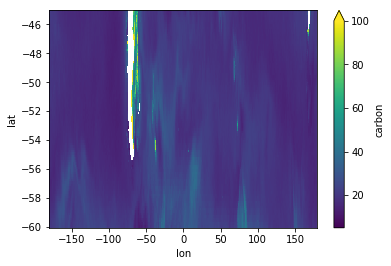

In [101]:
CbPM.mean('iTIME').plot(vmax=1e2, vmin=5.)

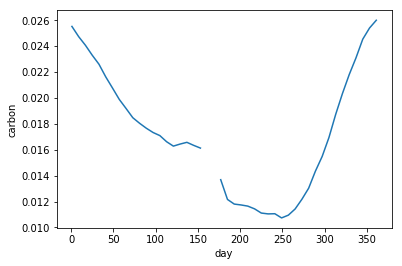

In [99]:
(CbPM8*1e-3).plot()

In [105]:
list(CbPM.groupby('day'))[0][1]
# CbPM

<xarray.DataArray 'carbon' (iTIME: 16, lat: 90, lon: 2160)>
array([[[11.797553, 11.293803, ..., 12.935053, 13.292554],
        [20.068804, 24.651304, ..., 12.382553, 15.031303],
        ...,
        [29.006304, 28.096302, ..., 27.267553, 28.795053],
        [24.033804, 25.983803, ..., 24.976303, 23.790052]],

       [[12.301304, 11.212553, ..., 15.648803, 14.202554],
        [12.236303, 11.115052, ..., 16.770054, 15.681305],
        ...,
        [47.12505 , 41.567554, ..., 40.446304, 46.881298],
        [46.377552, 43.582554, ..., 40.998802, 45.061302]],

       ...,

       [[26.910051, 26.910051, ..., 28.080051, 27.690052],
        [26.910051, 26.910051, ..., 26.910051, 26.910051],
        ...,
        [15.941304, 20.686304, ..., 19.077553, 16.867552],
        [19.825054, 19.548803, ..., 21.547554, 22.945055]],

       [[27.592552, 18.378803, ..., 26.926306, 36.806301],
        [38.090054, 34.060055, ..., 27.560053, 26.763803],
        ...,
        [29.233801, 24.277552, ..., 23.0263

In [38]:
CbPM25 = CbPM8.copy()
CbPM75 = CbPM8.copy()
i = 0
for group in list(CbPM.groupby('day')):
    CbPM25[i] = group[1].quantile(.25)
    CbPM75[i] = group[1].quantile(.75)
    i += 1

/home/takaya/miniconda3/envs/uptodate/lib/python3.6/site-packages/numpy/lib/function_base.py:4033: RuntimeWarning: All-NaN slice encountered
  r = func(a, **kwargs)


In [124]:
np.arange(5,365,10)

array([  5,  15,  25,  35,  45,  55,  65,  75,  85,  95, 105, 115, 125,
       135, 145, 155, 165, 175, 185, 195, 205, 215, 225, 235, 245, 255,
       265, 275, 285, 295, 305, 315, 325, 335, 345, 355])

/home/takaya/miniconda3/envs/uptodate/lib/python3.6/site-packages/xarray/core/dataarray.py:2170: FutureWarning: roll_coords will be set to False in the future. Explicitly set roll_coords to silence warning.
  shifts=shifts, roll_coords=roll_coords, **shifts_kwargs)
/home/takaya/miniconda3/envs/uptodate/lib/python3.6/site-packages/matplotlib/figure.py:2369: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  warnings.warn("This figure includes Axes that are not compatible "


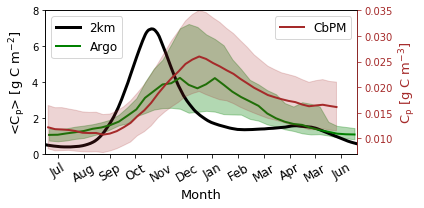

In [45]:
nys,nyn = 1e3*np.array([600,1400])
months = ['Jan','Feb','Mar','Apr','Mar','Jun','Jul','Aug','Sep','Oct','Nov','Dec']
Cphyto_m = xr.open_dataset('../Cp_45-60_10D.nc').med.roll(day=-18)
Cphyto_m25 = xr.open_dataset('../Cp_45-60_10D.nc').low.roll(day=-18)
Cphyto_m75 = xr.open_dataset('../Cp_45-60_10D.nc').hi.roll(day=-18)
# test1 = np.append(np.append(np.append(np.append(np.append(np.append(Cphyto_m[:30],Cphyto_m[31:61]),
#                                                           Cphyto_m[62:92]),Cphyto_m[92:122]),
#                                       Cphyto_m[123:153]),Cphyto_m[153:183]),Cphyto_m[184:])
# test2 = np.append(np.append(np.append(np.append(np.append(np.append(Cphyto_m25[:30],Cphyto_m25[31:61]),
#                                                           Cphyto_m25[62:92]),Cphyto_m25[92:122]),
#                                       Cphyto_m25[123:153]),Cphyto_m25[153:183]),Cphyto_m25[184:])
# test3 = np.append(np.append(np.append(np.append(np.append(np.append(Cphyto_m75[:30],Cphyto_m75[31:61]),
#                                                           Cphyto_m75[62:92]),Cphyto_m75[92:122]),
#                                       Cphyto_m75[123:153]),Cphyto_m75[153:183]),Cphyto_m75[184:])

fig, ax = plt.subplots(figsize=(6,3))
fig.set_tight_layout(True)
ax2 = ax.twinx()
ax.plot(np.linspace(0,364,360), PtotCday.roll(days=-180)*1e-3, 
        'k', lw=3, label=r"2km")
# ax.plot(np.arange(0,366,3), CpSOSE_intg.roll(day=-181),
#         'k--', lw=2, label=r"BSOSE")

ax.plot(np.linspace(4.5,360.5,36), Cphyto_m*1e-3, c='g', lw=2, label=r"Argo")
ax.fill_between(np.linspace(4.5,360.5,36), Cphyto_m25*1e-3,
               Cphyto_m75*1e-3, color='g', alpha=0.3)

ax2.plot(np.arange(3.5,365,8), CbPM8.roll(day=-23)*1e-3, 'brown', lw=2, label='CbPM')
ax2.fill_between(np.arange(3.5,365,8), CbPM25.roll(day=-23)*1e-3, CbPM75.roll(day=-23)*1e-3,
                color='brown', alpha=.2)
# for i in range(5):
#     ax.plot(np.arange(14,360,30), np.roll(Cphyto_m[i],6)*1e-3, c='g', lw=1, alpha=.4)
    
# ax1.plot(range(360), PtotC20mliR.roll(days=-180), 
#         'g:', lw=3)
# ax1.plot(np.zeros(0), 'k:', lw=2, label=r'20km XLI+R')
ax.set_ylabel(r'<C$_{\tt p}$> [g C m$^{-2}$]', color='k', fontsize=13)
ax2.set_ylabel(r'C$_{\tt p}$ [g C m$^{-3}$]', color='brown', fontsize=13)
ax2.spines["right"].set_edgecolor('brown')
ax2.tick_params(axis='y', colors='brown')
ax.set_xlim([0.,364])
ax.set_ylim([0.,8.])
ax2.set_ylim([.007,.035])
ax.set_xticks(np.linspace(15,345,12))
ax.set_xticklabels(np.roll(np.array(months),-6), fontsize=12, rotation=30)
ax.set_xlabel(r"Month", fontsize=13)
ax.legend(loc='upper left', fontsize=12)
ax2.legend(loc='upper right', fontsize=12)

plt.savefig(op.join(ddir,'Dalma_Dar02km/Figures/Cp_02km-SOCCOM.pdf'))

/home/takaya/miniconda3/envs/uptodate/lib/python3.6/site-packages/xarray/core/dataarray.py:2170: FutureWarning: roll_coords will be set to False in the future. Explicitly set roll_coords to silence warning.
  shifts=shifts, roll_coords=roll_coords, **shifts_kwargs)
/home/takaya/miniconda3/envs/uptodate/lib/python3.6/site-packages/xarray/core/dataarray.py:2170: FutureWarning: roll_coords will be set to False in the future. Explicitly set roll_coords to silence warning.
  shifts=shifts, roll_coords=roll_coords, **shifts_kwargs)


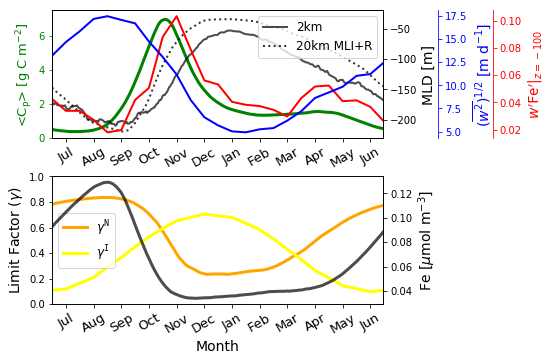

In [121]:
nys,nyn = 1e3*np.array([600,1400])
months = ['Jan','Feb','Mar','Apr','May','Jun','Jul','Aug','Sep','Oct','Nov','Dec']

fig, (ax1,ax5) = plt.subplots(nrows=2, ncols=1, figsize=(8,6))
# fig.set_tight_layout(True)
ax2 = ax1.twinx()
# ax4 = ax3.twinx()
ax6 = ax5.twinx()
ax8 = ax1.twinx()
ax9 = ax1.twinx()
ax8.spines["right"].set_position(("axes", 1.33))
ax9.spines["right"].set_position(("axes", 1.165))
ax1.plot(range(360), PtotCday.roll(days=-180)*1e-3, 
        'g', lw=3)
ax1.plot(np.zeros(0), 'k', lw=2, label=r'2km')
ax9.plot(range(0,375,15), wRMS*86400, 
        'b', lw=2)
ax8.plot(range(0,375,15), wpFep_d_100.roll(day=-12)*86400*1e3, 
        'r', lw=2)
# ax8.plot(range(15,360,30), (Ztot*ds.drF).sum('Z').roll(time=0)*1e-3, 
#         'r', lw=3, label=r'C$_{\tt z}$')
# ax1.plot(range(360), PtotC20mliR.roll(days=-180), 
#         'g:', lw=3)
# ax1.plot(np.zeros(0), 'k:', lw=2, label=r'20km MLI+R')
ax2.plot(range(360), -MXLD.sel(YC=slice(nys,nyn)).mean(['YC']).roll(day=-0), 
        ls='-', lw=2, alpha=.7, color='k', label=r'2km')
ax2.plot(range(360), -MXLDmli.sel(YC=slice(nys,nyn)).mean(['YC']).roll(day=-180), 
        ls=':', lw=2, alpha=.8, color='k', label=r'20km MLI+R')
# ax3.plot(range(360), (PPintg*86400).roll(days=-180)*1e-3, 
#         lw=2, color='g', label=r'NPP')
# ax4.plot(range(1,359), (rday*86400).roll(days=-180)[1:-1], 
#         lw=2, color='k', alpha=.7, label='r')
# ax4.plot(range(1,359), (mu*86400).roll(days=-180)[1:-1], 
#         lw=2, color='k', ls='--', alpha=.8, label='$\mu$')
# ax4.plot(range(1,359), ((rday-mu)*86400).roll(days=-180)[1:-1], 
#         lw=2, color='k', ls=':', alpha=.8, label='$l$')

# ax4.plot(range(360), np.zeros(360), 'k--', lw=1)
ax5.plot(range(360), .5*(gammaFe1+gammaFe2).roll(time=-0), color='orange', lw=3, label=r"$\gamma^{\tt N}$")
ax5.plot(range(360), .5*(gammaI1+gammaI2).roll(time=-180), color='yellow', lw=3, label=r"$\gamma^{\tt I}$")
# ax5.plot(range(360), gammaT.roll(time=-0), color='r', lw=3, label=r"$\gamma^{\tt T}$")
# ax5.plot(range(360), gammaFe2.roll(time=-0), color='k', ls='--', lw=3, label=r"P$_2$")
ax6.plot(range(360), Fe100.roll(time=-0)*1e3, color='k', lw=3, alpha=.7)

ax1.set_ylabel(r'<C$_{\tt p}$> [g C m$^{-2}$]', color='g', fontsize=13)
ax1.spines["left"].set_edgecolor('g')
ax1.tick_params(axis='y', colors='g')
ax2.spines["right"].set_edgecolor('k')
ax2.tick_params(axis='y', colors='k')
# ax3.spines["left"].set_edgecolor('g')
# ax3.tick_params(axis='y', colors='g')
ax6.spines["right"].set_edgecolor('k')
ax6.tick_params(axis='y', colors='k')
ax9.set_ylabel(r"$(\overline{w^2})^{1/2}$ [m d$^{-1}$]", color='b', fontsize=14)
ax9.spines["right"].set_edgecolor('b')
ax9.tick_params(axis='y', colors='b')
ax8.set_ylabel(r"$w'{\tt Fe}'|_{z=-100}$", color='r', fontsize=14)
ax8.spines["right"].set_edgecolor('r')
ax8.tick_params(axis='y', colors='r')
ax1.set_xlim([0.,359])
ax1.set_ylim([0.,7.5])
ax2.set_ylim([-230,-20])
# ax3.set_xlim([0.,359])
ax5.set_xlim([0.,359])
ax5.set_ylim([0.,1.])
# ax8.set_ylim([0.,.007])
# ax4.set_ylim([-.1,.16])
ax1.set_xticks(np.linspace(15,345,12))
ax1.set_xticklabels(np.roll(np.array(months),-6), fontsize=13, rotation=30)
# ax3.set_xticks(np.linspace(15,345,12))
# ax3.set_xticklabels(np.roll(np.array(months),-6), fontsize=12)
ax5.set_xticks(np.linspace(15,345,12))
ax5.set_xticklabels(np.roll(np.array(months),-6), fontsize=13, rotation=30)
ax5.set_xlabel(r"Month", fontsize=14)
ax2.set_ylabel(r"MLD [m]", fontsize=14, color='k')
# ax4.set_ylabel(r"[d$^{-1}$]", color='k', fontsize=13)
# ax3.set_ylabel(r"PP [g C m$^{-2}$ d$^{-1}$]", color='g', fontsize=13)
ax5.set_ylabel(r"Limit Factor ($\gamma$)", color='k', fontsize=14)
ax6.set_ylabel(r"Fe [$\mu$mol m$^{-3}$]", color='k', fontsize=14)
ax2.legend(loc='upper right', fontsize=12)
ax5.legend(loc='center left', fontsize=12)
# ax4.legend(loc='upper right', fontsize=11)
fig.subplots_adjust(hspace=.3, right=.7, bottom=.2)
plt.savefig(op.join(ddir,'Dalma_Dar02km/Figures/Biomass_02km_MLD.pdf'))

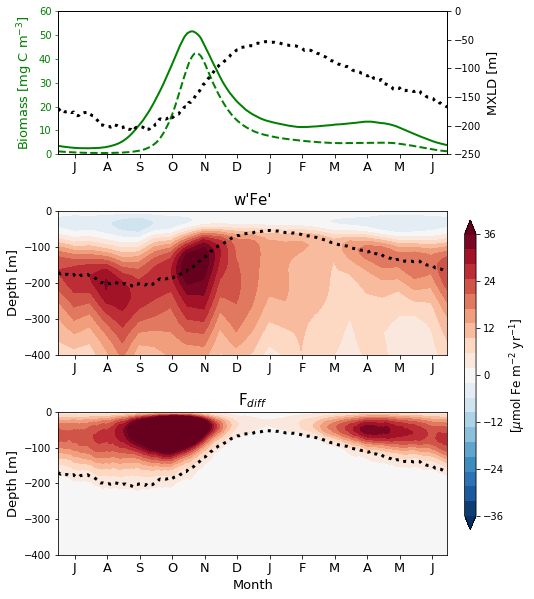

In [242]:
month = ['J','F','M','A','M','J','J','A','S','O','N','D']
colors = ['r','orange','g','b']
nys,nyn = 1e3*np.array([600,1400])
nz = 8

fig, (ax1,ax3,ax9) = plt.subplots(nrows=3, ncols=1, figsize=(8,10))
# fig.set_tight_layout(True)
ax2 = ax1.twinx()
ax5 = ax1.twinx()
# ax7 = ax3.twinx()
# ax4 = ax3.twinx()
# ax6 = ax3.twinx()
# ax7 = ax3.twinx()
# ax5.spines["right"].set_position(("axes", 1.1))
# ax6.spines["right"].set_position(("axes", 1.17))
# make_patch_spines_invisible(ax7)
# ax7.spines["right"].set_visible(True)

im1, = ax1.plot(range(360), PtotCday.roll(days=-180), 
               'g', lw=2, label=r'2 km')
ax1.plot(range(360), PtotC20mli.roll(days=-180), 
        'g--', lw=2, label=r'20km XLI')
# ax2.plot(range(360), wpFep_c_XLD.roll(day=-180)*(360*86400)*1e3, 
#         ls='--', lw=2, color='r', label=r"F$_{eddy}$")
# ax2.plot(range(360), dfz_c_XLD.roll(day=-180)*(360*86400)*1e3, 
#         ls='--', lw=2, color='b', label=r"$F_{diff}$")
im3 = ax3.contourf(range(0,346,15), wpFep_d.Zl, wpFep_d.T.roll(day=-12)*1e3*(360*86400), 
                  levels=np.linspace(-36,36,20), 
                   cmap='RdBu_r', extend='both')
ax3.contourf(range(14,360,15), wpFep_d.Zl, wpFep_d.T.roll(day=-13)*1e3*(360*86400), 
            levels=np.linspace(-36,36,20), 
            cmap='RdBu_r', extend='both')
im9 = ax9.contourf(range(360), dfz_c.Zl, dfz_c.T.roll(day=-180)*(360*86400)*1e3, 
                  levels=np.linspace(-36,36,20), cmap='RdBu_r', extend='both')
ax3.plot(range(360), -MXLD.sel(YC=slice(nys,nyn)).mean(['YC']).roll(day=-0), 
        ls=':', lw=3, color='k')
ax9.plot(range(360), -MXLD.sel(YC=slice(nys,nyn)).mean(['YC']).roll(day=-0), 
        ls=':', lw=3, color='k')
# ax2.plot(np.linspace(15,350,12), c_ker_mon.sel(lat=slice(-52,-56)).mean(['lat','lon']).roll(iMONTH=-6), 
#         label=r'52-56S (CbPM)', ls='--', lw=2, color=colors[1])
# ax2.plot(np.linspace(15,350,12), c_ker_mon.sel(lat=slice(-56,-60)).mean(['lat','lon']).roll(iMONTH=-6), 
#         label=r'56-60S (CbPM)', ls='--', lw=2, color=colors[2])
# ax2.plot(np.linspace(15,350,12), c_ker_mon.sel(lat=slice(-60,-64)).mean(['lat','lon']).roll(iMONTH=-6), 
#         label=r'60-64S (CbPM)', ls='--', lw=2, color=colors[3])
ax5.plot(range(360), -MXLD.sel(YC=slice(nys,nyn)).mean(['YC']).roll(day=-0), 
        ls=':', lw=3, color='k')


ax1.set_xticks(np.linspace(15,345,12))
ax1.set_xticklabels(np.roll(np.array(month),-6), fontsize=13)
# ax.set_xlim([0,Ndays-1])
ax1.set_ylim([0.,60.])
ax1.set_xlim([0.,359])
ax2.set_ylim([0,1.5e1])
ax2.set_yticks([])
# ax1.set_xlabel(r'Month', fontsize=13)
ax5.set_ylabel('MXLD [m]', color='k', fontsize=13)
ax5.tick_params('y', colors='k')
ax3.set_ylim([-400,0])
ax5.set_ylim([-250,0])
ax9.set_ylim([-400,0])
# ax1.set_title(r"Biomass", fontsize=15)
ax1.set_ylabel(r'Biomass [mg C m$^{-3}$]', color='g', fontsize=13)
# ax1.legend(loc='upper left', fontsize=12)
# ax2.legend(loc='upper right', fontsize=12)
# ax2.set_ylabel('$F$ [$\mu$mol Fe m$^{-2}$ yr$^{-1}$]', fontsize=13)



# i = 0
# for y in range(150,50,-25):
#     ax3.plot(range(360), (PPintg*86400).sel(YC=slice(nys,nyn)).mean(['YC','XC']).roll(days=-180), 
#             lw=2, color=colors[i])
#     i += 1

ax1.spines["left"].set_edgecolor(im1.get_color())
ax1.tick_params(axis='y', colors=im1.get_color())

# ax.set_xlim([0,Ndays-1])
ax3.set_xlim([0.,359])
ax9.set_xlim([0.,359])
ax3.set_xticks(np.linspace(15,345,12))
ax3.set_xticklabels(np.roll(np.array(month),-6), fontsize=13)
ax9.set_xticks(np.linspace(15,345,12))
ax9.set_xticklabels(np.roll(np.array(month),-6), fontsize=13)
ax3.set_ylabel(r"Depth [m]", fontsize=13)
ax9.set_ylabel(r"Depth [m]", fontsize=13)
ax9.set_xlabel(r'Month', fontsize=13)
# ax3.legend(loc='upper right', fontsize=12)
# ax3.set_title(r"Productivity", fontsize=15)
# cbar3 = fig.colorbar(im3, ax=ax3, ticks=[-20,-15,-10,-5,0,5,10,15,20])
fig.subplots_adjust(right=0.80)
cbar_ax = fig.add_axes([0.83, 0.16, 0.02, 0.43])
cbar = fig.colorbar(im3, cax=cbar_ax, ticks=[-36,-24,-12,0,12,24,36])
cbar.set_label(r'[$\mu$mol Fe m$^{-2}$ yr$^{-1}$]', fontsize=12)
ax9.set_title(r'F$_{diff}$', fontsize=15)
# ax3.legend(loc='upper left', fontsize=12)
ax3.set_title(r"w'Fe'", fontsize=15)
fig.subplots_adjust(hspace=.4)
# ax9.legend(loc='upper left', fontsize=12)
# ax4.legend(loc='upper right', fontsize=12)
plt.savefig(op.join(ddir,'Dalma_Dar02km/Figures/Biomass_woutflux_wHopfMellor_02km.pdf'))

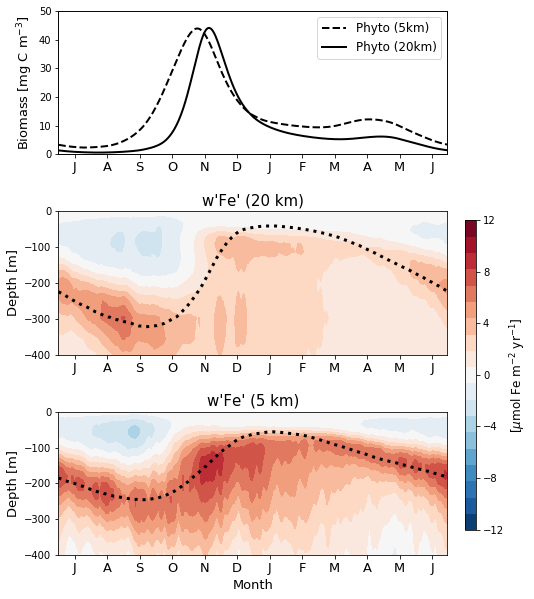

In [51]:
month = ['J','F','M','A','M','J','J','A','S','O','N','D']
colors = ['r','orange','g','b']
nys,nyn = 1e3*np.array([600,1400])
PtotC20 = xr.open_dataset(op.join(bdir,'Ptot_600-1400km_20km.nc')).P_biomass
wpFep_20 = xr.open_dataset(op.join(bdir,'wpFep_600-1400km_20km.nc')).wpFep
hbl99 = xr.open_dataset(op.join(pdir,'KPPhbl_99percentile_20km.nc')).hbl99
# MXLD.coords['DinY'] = ('time',np.tile(range(360),5))
MXLD20 = hbl99.groupby('day').mean(['time'])

fig, (ax1,ax3,ax9) = plt.subplots(nrows=3, ncols=1, figsize=(8,10))
# fig.set_tight_layout(True)
ax2 = ax1.twinx()
# ax5 = ax1.twinx()
# ax7 = ax3.twinx()
# ax4 = ax3.twinx()
# ax6 = ax3.twinx()
# ax7 = ax3.twinx()
# ax5.spines["right"].set_position(("axes", 1.14))
# ax6.spines["right"].set_position(("axes", 1.17))
# make_patch_spines_invisible(ax7)
# ax7.spines["right"].set_visible(True)

ax1.plot(range(360), PtotCday.sel(YC=slice(nys,nyn)).mean(['YC','XC']).roll(days=-180), 
        'k--', lw=2, label=r'Phyto (5km)')
ax1.plot(range(360), PtotC20.sel(YC=slice(nys,nyn)).mean(['YC','XC']).roll(days=-180), 
        'k', lw=2, label=r'Phyto (20km)')
# ax2.plot(range(360), wpFep_c_XLD.roll(day=-180)*(360*86400)*1e3, 
#         ls='--', lw=2, color='r', label=r"F$_{eddy}$")
# ax2.plot(range(360), dfz_c_XLD.roll(day=-180)*(360*86400)*1e3, 
#         ls='--', lw=2, color='b', label=r"$F_{diff}$")
im3 = ax3.contourf(range(360), wpFep_20.Zl, wpFep_20.mean('YC').T.roll(day=-180)*(360*86400)*1e3, 
                  levels=np.linspace(-12,12,20), cmap='RdBu_r')
im9 = ax9.contourf(range(360), wpFep_d.Zl, wpFep_d.mean('YC').T.roll(day=-180)*(360*86400)*1e3, 
                  levels=np.linspace(-12,12,20), cmap='RdBu_r')
ax3.plot(range(360), -MXLD20.sel(YC=slice(nys,nyn)).mean(['YC']).roll(day=-180), 
        ls=':', lw=3, color='k')
ax9.plot(range(360), -MXLD.sel(YC=slice(nys,nyn)).mean(['YC']).roll(day=-180), 
        ls=':', lw=3, color='k')
# ax2.plot(np.linspace(15,350,12), c_ker_mon.sel(lat=slice(-52,-56)).mean(['lat','lon']).roll(iMONTH=-6), 
#         label=r'52-56S (CbPM)', ls='--', lw=2, color=colors[1])
# ax2.plot(np.linspace(15,350,12), c_ker_mon.sel(lat=slice(-56,-60)).mean(['lat','lon']).roll(iMONTH=-6), 
#         label=r'56-60S (CbPM)', ls='--', lw=2, color=colors[2])
# ax2.plot(np.linspace(15,350,12), c_ker_mon.sel(lat=slice(-60,-64)).mean(['lat','lon']).roll(iMONTH=-6), 
#         label=r'60-64S (CbPM)', ls='--', lw=2, color=colors[3])

# im5, = ax5.plot(range(360), -MXLD.sel(YC=slice(nys,nyn)).mean(['YC']).roll(day=-180), 
#                ls=':', lw=3, color='orange')


ax1.set_xticks(np.linspace(15,345,12))
ax1.set_xticklabels(np.roll(np.array(month),-6), fontsize=13)
# ax.set_xlim([0,Ndays-1])
ax1.set_ylim([0.,50.])
ax1.set_xlim([0.,359])
ax2.set_ylim([0,1.5e1])
ax2.set_yticks([])
# ax1.set_xlabel(r'Month', fontsize=13)
# ax5.set_ylabel('MXLD [m]', color='orange', fontsize=13)
# ax5.tick_params('y', colors='orange')
ax3.set_ylim([-400,0])
# ax5.set_ylim([-400,0])
ax9.set_ylim([-400,0])
# ax1.set_title(r"Biomass", fontsize=15)
ax1.set_ylabel(r'Biomass [mg C m$^{-3}$]', fontsize=13)
ax1.legend(loc='upper right', fontsize=12)
# ax2.legend(loc='upper right', fontsize=12)
# ax2.set_ylabel('$F$ [$\mu$mol Fe m$^{-2}$ yr$^{-1}$]', fontsize=13)



# i = 0
# for y in range(150,50,-25):
#     ax3.plot(range(360), (PPintg*86400).sel(YC=slice(nys,nyn)).mean(['YC','XC']).roll(days=-180), 
#             lw=2, color=colors[i])
#     i += 1

ax5.spines["right"].set_edgecolor(im5.get_color())
ax5.tick_params(axis='y', colors=im5.get_color())

# ax.set_xlim([0,Ndays-1])
ax3.set_xlim([0.,359])
ax9.set_xlim([0.,359])
ax3.set_xticks(np.linspace(15,345,12))
ax3.set_xticklabels(np.roll(np.array(month),-6), fontsize=13)
ax9.set_xticks(np.linspace(15,345,12))
ax9.set_xticklabels(np.roll(np.array(month),-6), fontsize=13)
ax3.set_ylabel(r"Depth [m]", fontsize=13)
ax9.set_ylabel(r"Depth [m]", fontsize=13)
ax9.set_xlabel(r'Month', fontsize=13)
# ax3.legend(loc='upper right', fontsize=12)
# ax3.set_title(r"Productivity", fontsize=15)
# cbar3 = fig.colorbar(im3, ax=ax3, ticks=[-20,-15,-10,-5,0,5,10,15,20])
fig.subplots_adjust(right=0.80)
cbar_ax = fig.add_axes([0.83, 0.16, 0.02, 0.43])
cbar = fig.colorbar(im3, cax=cbar_ax, ticks=[-12,-8,-4,0,4,8,12])
cbar.set_label(r"[$\mu$mol Fe m$^{-2}$ yr$^{-1}$]", fontsize=12)
ax9.set_title(r"w'Fe' (5 km)", fontsize=15)
# ax3.legend(loc='upper left', fontsize=12)
ax3.set_title(r"w'Fe' (20 km)", fontsize=15)
fig.subplots_adjust(hspace=.4)
# ax9.legend(loc='upper left', fontsize=12)
# ax4.legend(loc='upper right', fontsize=12)
plt.savefig(op.join(ddir,'Figures/Biomass_wHopfMellor_20-05-02km.pdf'))

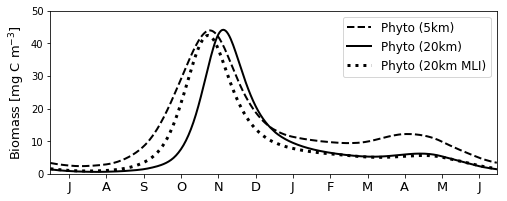

In [59]:
month = ['J','F','M','A','M','J','J','A','S','O','N','D']
colors = ['r','orange','g','b']
nys,nyn = 1e3*np.array([600,1400])
PtotC20 = xr.open_dataset(op.join(bdir,'Ptot_600-1400km_20km.nc')).P_biomass
PtotC20mli = xr.open_dataset(op.join(bdir,'Ptot_600-1400km_20kmMLI.nc')).P_biomass
wpFep_20mli = xr.open_dataset(op.join(bdir,'wpFep_600-1400km_20kmMLI.nc')).wMLIFep
hbl99 = xr.open_dataset(op.join(pdir,'KPPhbl_99percentile_20km.nc')).hbl99
# MXLD.coords['DinY'] = ('time',np.tile(range(360),5))
MXLD20 = hbl99.groupby('day').mean(['time'])
hbl99 = xr.open_dataset(op.join(pdir,'KPPhbl_99percentile_20kmMLI.nc')).hbl99
# MXLD.coords['DinY'] = ('time',np.tile(range(360),5))
MXLD20mli = hbl99.groupby('day').mean(['time'])

fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(8,3))
# fig.set_tight_layout(True)
# ax2 = ax1.twinx()
# ax5 = ax1.twinx()
# ax7 = ax3.twinx()
# ax4 = ax3.twinx()
# ax6 = ax3.twinx()
# ax7 = ax3.twinx()
# ax5.spines["right"].set_position(("axes", 1.14))
# ax6.spines["right"].set_position(("axes", 1.17))
# make_patch_spines_invisible(ax7)
# ax7.spines["right"].set_visible(True)

ax.plot(range(360), PtotCday.sel(YC=slice(nys,nyn)).mean(['YC','XC']).roll(days=-180), 
       'k--', lw=2, label=r'5km')
ax.plot(range(360), PtotC20.sel(YC=slice(nys,nyn)).mean(['YC','XC']).roll(days=-180), 
       'k', lw=2, label=r'20km')
ax.plot(range(360), PtotC20mli.sel(YC=slice(nys,nyn)).mean(['YC','XC']).roll(days=-180), 
       'k:', lw=3, label=r'20km MLI')
# ax2.plot(range(360), wpFep_c_XLD.roll(day=-180)*(360*86400)*1e3, 
#         ls='--', lw=2, color='r', label=r"F$_{eddy}$")
# ax2.plot(range(360), dfz_c_XLD.roll(day=-180)*(360*86400)*1e3, 
#         ls='--', lw=2, color='b', label=r"$F_{diff}$")
ax.set_xticks(np.linspace(15,345,12))
ax.set_xticklabels(np.roll(np.array(month),-6), fontsize=13)
# ax.set_xlim([0,Ndays-1])
ax.set_ylim([0.,50.])
ax.set_xlim([0.,359])
ax.set_ylabel(r'Biomass [mg C m$^{-3}$]', fontsize=13)
ax.legend(loc='upper right', fontsize=12)
plt.savefig(op.join(ddir,'Figures/Biomass_2-5-20-20MLIkm.pdf'))

/home/takaya/miniconda3/envs/uptodate/lib/python3.6/site-packages/matplotlib/figure.py:2299: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  warnings.warn("This figure includes Axes that are not compatible "


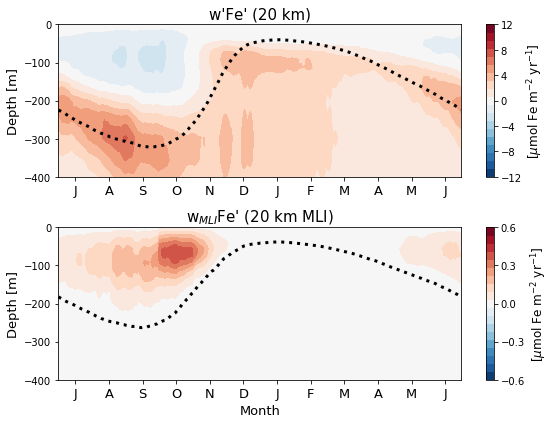

In [57]:
fig, (ax3,ax9) = plt.subplots(nrows=2, ncols=1, figsize=(8,6))
fig.set_tight_layout(True)
im3 = ax3.contourf(range(360), wpFep_20.Zl, wpFep_20.mean('YC').T.roll(day=-180)*(360*86400)*1e3, 
                  levels=np.linspace(-12,12,20), cmap='RdBu_r')
im9 = ax9.contourf(range(360), wpFep_20mli.Zl, wpFep_20mli.mean('YC').T.roll(day=-180)*(360*86400)*1e3, 
                  levels=np.linspace(-.6,.6,20), cmap='RdBu_r')
ax3.plot(range(360), -MXLD20.sel(YC=slice(nys,nyn)).mean(['YC']).roll(day=-180), 
        ls=':', lw=3, color='k')
ax9.plot(range(360), -MXLD20mli.sel(YC=slice(nys,nyn)).mean(['YC']).roll(day=-180), 
        ls=':', lw=3, color='k')
# ax2.plot(np.linspace(15,350,12), c_ker_mon.sel(lat=slice(-52,-56)).mean(['lat','lon']).roll(iMONTH=-6), 
#         label=r'52-56S (CbPM)', ls='--', lw=2, color=colors[1])
# ax2.plot(np.linspace(15,350,12), c_ker_mon.sel(lat=slice(-56,-60)).mean(['lat','lon']).roll(iMONTH=-6), 
#         label=r'56-60S (CbPM)', ls='--', lw=2, color=colors[2])
# ax2.plot(np.linspace(15,350,12), c_ker_mon.sel(lat=slice(-60,-64)).mean(['lat','lon']).roll(iMONTH=-6), 
#         label=r'60-64S (CbPM)', ls='--', lw=2, color=colors[3])

# im5, = ax5.plot(range(360), -MXLD.sel(YC=slice(nys,nyn)).mean(['YC']).roll(day=-180), 
#                ls=':', lw=3, color='orange')


ax2.set_ylim([0,1.5e1])
ax2.set_yticks([])
# ax1.set_xlabel(r'Month', fontsize=13)
# ax5.set_ylabel('MXLD [m]', color='orange', fontsize=13)
# ax5.tick_params('y', colors='orange')
ax3.set_ylim([-400,0])
# ax5.set_ylim([-400,0])
ax9.set_ylim([-400,0])
# ax1.set_title(r"Biomass", fontsize=15)
# ax2.legend(loc='upper right', fontsize=12)
# ax2.set_ylabel('$F$ [$\mu$mol Fe m$^{-2}$ yr$^{-1}$]', fontsize=13)



# i = 0
# for y in range(150,50,-25):
#     ax3.plot(range(360), (PPintg*86400).sel(YC=slice(nys,nyn)).mean(['YC','XC']).roll(days=-180), 
#             lw=2, color=colors[i])
#     i += 1

# ax5.spines["right"].set_edgecolor(im5.get_color())
# ax5.tick_params(axis='y', colors=im5.get_color())

# ax.set_xlim([0,Ndays-1])
ax3.set_xlim([0.,359])
ax9.set_xlim([0.,359])
ax3.set_xticks(np.linspace(15,345,12))
ax3.set_xticklabels(np.roll(np.array(month),-6), fontsize=13)
ax9.set_xticks(np.linspace(15,345,12))
ax9.set_xticklabels(np.roll(np.array(month),-6), fontsize=13)
ax3.set_ylabel(r"Depth [m]", fontsize=13)
ax9.set_ylabel(r"Depth [m]", fontsize=13)
ax9.set_xlabel(r'Month', fontsize=13)
# ax3.legend(loc='upper right', fontsize=12)
# ax3.set_title(r"Productivity", fontsize=15)
# cbar3 = fig.colorbar(im3, ax=ax3, ticks=[-20,-15,-10,-5,0,5,10,15,20])
fig.subplots_adjust(right=0.80)
# cbar_ax = fig.add_axes([0.83, 0.16, 0.02, 0.43])
cbar3 = fig.colorbar(im3, ax=ax3, ticks=[-12,-8,-4,0,4,8,12])
cbar3.set_label(r"[$\mu$mol Fe m$^{-2}$ yr$^{-1}$]", fontsize=12)
cbar9 = fig.colorbar(im9, ax=ax9, ticks=[-.6,-.3,0,.3,.6])
cbar9.set_label(r"[$\mu$mol Fe m$^{-2}$ yr$^{-1}$]", fontsize=12)
ax9.set_title(r"w$_{MLI}$Fe' (20 km MLI)", fontsize=15)
# ax3.legend(loc='upper left', fontsize=12)
ax3.set_title(r"w'Fe' (20 km)", fontsize=15)
fig.subplots_adjust(hspace=.4)
# ax9.legend(loc='upper left', fontsize=12)
# ax4.legend(loc='upper right', fontsize=12)
plt.savefig(op.join(pdir,'Figures/wFe_HopfMellor_20-20MLIkm.pdf'))

/home/takaya/miniconda3/envs/uptodate/lib/python3.6/site-packages/matplotlib/figure.py:2299: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  warnings.warn("This figure includes Axes that are not compatible "


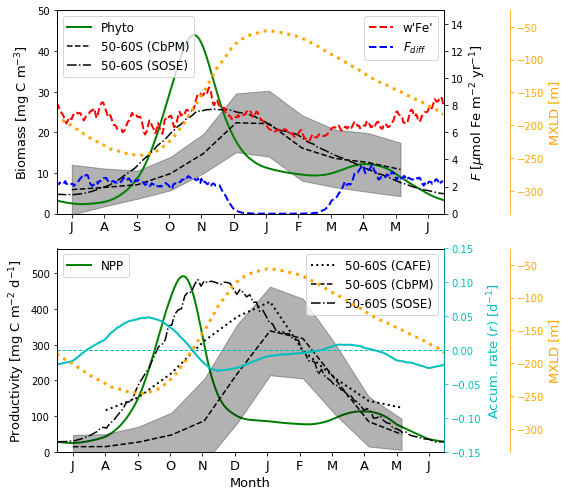

In [35]:
month = ['J','F','M','A','M','J','J','A','S','O','N','D']
colors = ['r','orange','g','b']
nys,nyn = 1e3*np.array([600,1400])

fig, (ax1,ax3) = plt.subplots(nrows=2, ncols=1, figsize=(8,7))
fig.set_tight_layout(True)
ax2 = ax1.twinx()
ax5 = ax1.twinx()
ax7 = ax3.twinx()
ax4 = ax3.twinx()
ax6 = ax3.twinx()
# ax7 = ax3.twinx()
ax5.spines["right"].set_position(("axes", 1.17))
ax6.spines["right"].set_position(("axes", 1.17))
# make_patch_spines_invisible(ax7)
# ax7.spines["right"].set_visible(True)

ax2.plot(range(360), wpFep_c_XLD.roll(day=-180)*(360*86400)*1e3, 
        ls='--', lw=2, color='r', label=r"w'Fe'")
ax2.plot(range(360), dfz_c_XLD.roll(day=-180)*(360*86400)*1e3, 
        ls='--', lw=2, color='b', label=r"$F_{diff}$")
# ax2.plot(np.linspace(15,350,12), c_ker_mon.sel(lat=slice(-52,-56)).mean(['lat','lon']).roll(iMONTH=-6), 
#         label=r'52-56S (CbPM)', ls='--', lw=2, color=colors[1])
# ax2.plot(np.linspace(15,350,12), c_ker_mon.sel(lat=slice(-56,-60)).mean(['lat','lon']).roll(iMONTH=-6), 
#         label=r'56-60S (CbPM)', ls='--', lw=2, color=colors[2])
# ax2.plot(np.linspace(15,350,12), c_ker_mon.sel(lat=slice(-60,-64)).mean(['lat','lon']).roll(iMONTH=-6), 
#         label=r'60-64S (CbPM)', ls='--', lw=2, color=colors[3])

# i = 0
# for y in range(150,50,-25):
#     ax1.plot(range(360), (P1Cday+P2Cday).isel(YC=slice(y-25,y)).mean(['YC','XC']).roll(days=-180), 
#             lw=2, color=colors[i],
#             label=r'%03d-%03dkm' % ((y-25)*1e1,y*1e1))
#     ax1.plot(range(360), ((P1day+P2day)[:,0]*106.*12.).isel(YC=slice(y-25,y)).mean(['YC','XC']).roll(days=-180), 
#             lw=1, ls=':', color=colors[i])
#     i += 1
# ax1.plot(range(360), P1Cday.sel(YC=slice(nys,nyn)).mean(['YC','XC']).roll(days=-180), 
#         'g', lw=2, label=r'P$_1$')
# ax1.plot(range(360), P2Cday.sel(YC=slice(nys,nyn)).mean(['YC','XC']).roll(days=-180), 
#         'y', lw=2, label=r'P$_2$')
ax1.plot(range(360), PtotCday.sel(YC=slice(nys,nyn)).mean(['YC','XC']).roll(days=-180), 
        'g', lw=2, label=r'Phyto')
ax1.plot(np.linspace(15,350,12), c_ker_mon.sel(lat=slice(-50,-60)).mean(['lat','lon']).roll(months=-6), 
        label=r'50-60S (CbPM)', ls='--', color='k')
ax1.fill_between(np.linspace(15,350,12), 
                ((c_ker_mon-c_ker_std).sel(lat=slice(-50,-60)).mean(['lat','lon'])).roll(months=-6), 
                ((c_ker_mon+c_ker_std).sel(lat=slice(-50,-60)).mean(['lat','lon'])).roll(months=-6), 
                color='k', alpha=0.3)
# ax1.plot(range(360), 
#          (P1day+P2day).sel(YC=slice(nys,nyn)).mean(['YC','XC']).roll(days=-180)[:,0]*106.*12., 
#         'g', lw=1.2, ls=':', label=r'P$_{1+2}$ (surf)')
# ax1.plot(range(360), Z1Cday.sel(YC=slice(nys,nyn)).mean(['YC','XC']).roll(days=-180), 
#         'r', lw=2, label=r'Z$_1$')
# ax1.plot(range(360), Z2Cday.sel(YC=slice(nys,nyn)).mean(['YC','XC']).roll(days=-180), 
#         'm', lw=2, label=r'Z$_2$')
    
# ax1.plot(range(360), (P1Cday+P2Cday+Z1Cday+Z2Cday).isel(YC=slice(50,150)).mean(['YC','XC']).roll(days=-180), 
#         lw=2, color='k', label='mean')
im5, = ax5.plot(range(360), -MXLD.sel(YC=slice(nys,nyn)).mean(['YC']).roll(day=-180), 
              ls=':', lw=3, color='orange')

ax1.plot(np.linspace(1,363,len(P_kersurf.DinY)), 
        (P_kersurf.roll(DinY=-60)*1e3*12.).sel(iLAT=slice(-60,-50)).mean(['iLAT','iLON']), 
        'k-.', label='50-60S (SOSE)')

ax1.set_xticks(np.linspace(15,345,12))
ax1.set_xticklabels(np.roll(np.array(month),-6), fontsize=13)
# ax.set_xlim([0,Ndays-1])
ax1.set_ylim([0.,50.])
ax1.set_xlim([1.,360])
ax2.set_ylim([0,1.5e1])
# ax1.set_xlabel(r'Month', fontsize=13)
ax5.set_ylabel('MXLD [m]', color='orange', fontsize=13)
ax5.tick_params('y', colors='orange')
ax5.set_ylim([-335,-25])
# ax1.set_title(r"Biomass", fontsize=15)
ax1.set_ylabel(r'Biomass [mg C m$^{-3}$]', fontsize=13)
ax1.legend(loc='upper left', fontsize=12)
ax2.legend(loc='upper right', fontsize=12)
ax2.set_ylabel('$F$ [$\mu$mol Fe m$^{-2}$ yr$^{-1}$]', fontsize=13)
ax2.legend(loc='upper right', fontsize=12)


ax7.plot(np.linspace(15,350,12), decaf_SO.sel(lat=slice(-50,-60)).carbon.mean(['lat','lon']).roll(month=-6), 
        label=r'50-60S (CAFE)', ls=':', lw=2, color='k')
ax7.plot(np.linspace(15,350,12), cbpm_ker_mon.sel(lat=slice(-50,-60)).mean(['lat','lon']).roll(months=-6), 
        label=r'50-60S (CbPM)', ls='--', color='k')
ax7.fill_between(np.linspace(15,350,12), 
                ((cbpm_ker_mon-cbpm_ker_std).sel(lat=slice(-50,-60)).mean(['lat','lon'])).roll(months=-6), 
                ((cbpm_ker_mon+cbpm_ker_std).sel(lat=slice(-50,-60)).mean(['lat','lon'])).roll(months=-6), 
                color='k', alpha=0.3)
ax7.plot(np.linspace(1,363,len(PP_kersurf.DinY)), 
        (PP_kersurf.roll(DinY=-60)*1e3*12.*86400).sel(iLAT=slice(-60,-50)).mean(['iLAT','iLON']), 
        'k-.', label='50-60S (SOSE)')
# ax7.plot(range(360), (adz_c_100.roll(days=-180) * dFe_at_zFe.sel(YC=slice(6e5,14e5)).mean('YC')**-1)*(360*86400), 
#         ls='--', lw=2, color='r', label=r"$F_{adv}$")
# ax7.plot(range(360), (dfz_c_100.roll(days=-180) * dFe_at_zFe.sel(YC=slice(6e5,14e5)).mean('YC')**-1)*(360*86400), 
#         ls='--', lw=2, color='b', label=r"$F_{diff}$")
# ax4.plot(np.linspace(15,350,12), decaf_SO.sel(lat=slice(-52,-56)).carbon.mean(['lat','lon']).roll(month=-6), 
#         label=r'52-56S (CAFE)', ls='--', lw=2, color=colors[1])
# ax4.plot(np.linspace(15,350,12), decaf_SO.sel(lat=slice(-56,-60)).carbon.mean(['lat','lon']).roll(month=-6), 
#         label=r'56-60S (CAFE)', ls='--', lw=2, color=colors[2])
# ax4.plot(np.linspace(15,350,12), decaf_SO.sel(lat=slice(-60,-64)).carbon.mean(['lat','lon']).roll(month=-6), 
#         label=r'60-64S (CAFE)', ls='--', lw=2, color=colors[3])

# i = 0
# for y in range(150,50,-25):
#     ax3.plot(range(360), (PPintg*86400).sel(YC=slice(nys,nyn)).mean(['YC','XC']).roll(days=-180), 
#             lw=2, color=colors[i])
#     i += 1
ax3.plot(range(360), (PPintg*86400).sel(YC=slice(nys,nyn)).mean(['YC','XC']).roll(days=-180), 
        lw=2, color='g', label=r'NPP')
im4, = ax4.plot(range(360), (rday*86400).sel(YC=slice(nys,nyn)).mean(['YC','XC']).roll(days=-180), 
              lw=2, color='c')
ax4.plot(range(360), np.zeros(360), ls='--',
        lw=1, color='c')
im6, = ax6.plot(range(360), -MXLD.sel(YC=slice(nys,nyn)).mean(['YC']).roll(day=-180), 
              ls=':', lw=3, color='orange')

ax5.spines["right"].set_edgecolor(im5.get_color())
ax4.spines["right"].set_edgecolor(im4.get_color())
ax6.spines["right"].set_edgecolor(im6.get_color())
# ax3.plot(range(360), -(lday*86400).sel(YC=slice(nys,nyn)).mean(['YC','XC']).roll(days=-180), 
#         lw=2, color='r', label=r'$l$')
ax5.tick_params(axis='y', colors=im5.get_color())
ax4.tick_params(axis='y', colors=im4.get_color())
ax6.tick_params(axis='y', colors=im6.get_color())

ax3.set_xticks(np.linspace(15,345,12))
ax3.set_xticklabels(np.roll(np.array(month),-6), fontsize=13)
# ax.set_xlim([0,Ndays-1])
ax3.set_ylim([0.,570])
ax7.set_ylim([0.,570])
ax3.set_xlim([0.,359])
# ax4.set_ylim([-5e2,5e2])
# ax4.set_yticks([])
ax3.set_xlabel(r'Month', fontsize=13)
# ax3.legend(loc='upper right', fontsize=12)
ax7.legend(loc='upper right', fontsize=12)
ax7.set_yticks([])
ax4.set_ylabel('Accum. rate ($r$) [d$^{-1}$]', color='c', fontsize=13)
ax4.tick_params('y', colors='c')
ax4.set_ylim([-0.15,0.15])
ax6.set_ylabel('MXLD [m]', color='orange', fontsize=13)
ax6.tick_params('y', colors='orange')
ax6.set_ylim([-335,-25])
# ax3.set_title(r"Productivity", fontsize=15)
ax3.set_ylabel(r'Productivity [mg C m$^{-2}$ d$^{-1}$]', fontsize=13)
ax3.legend(loc='upper left', fontsize=12)
# ax4.legend(loc='upper right', fontsize=12)
plt.savefig(op.join(pdir,'Figures/Biomass_CompareWithObs_05km.pdf'))

/home/takaya/miniconda3/envs/uptodate/lib/python3.6/site-packages/matplotlib/figure.py:2299: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  warnings.warn("This figure includes Axes that are not compatible "


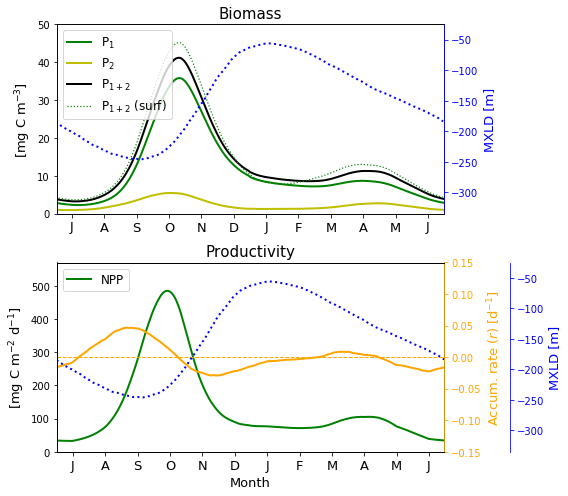

In [139]:
month = ['J','F','M','A','M','J','J','A','S','O','N','D']
colors = ['r','orange','g','b']
nys,nyn = 1e3*np.array([600,1400])

fig, (ax1,ax3) = plt.subplots(nrows=2, ncols=1, figsize=(8,7))
fig.set_tight_layout(True)
# ax2 = ax1.twinx()
ax5 = ax1.twinx()
# ax7 = ax3.twinx()
ax4 = ax3.twinx()
ax6 = ax3.twinx()
# ax7 = ax3.twinx()
ax6.spines["right"].set_position(("axes", 1.17))
# make_patch_spines_invisible(ax7)
# ax7.spines["right"].set_visible(True)

ax2.plot(np.linspace(15,350,12), c_ker_mon.sel(lat=slice(-50,-60)).mean(['lat','lon']).roll(months=-6), 
        label=r'50-60S (CbPM)', ls='--', color='k')
# ax2.plot(np.linspace(15,350,12), c_ker_mon.sel(lat=slice(-52,-56)).mean(['lat','lon']).roll(iMONTH=-6), 
#         label=r'52-56S (CbPM)', ls='--', lw=2, color=colors[1])
# ax2.plot(np.linspace(15,350,12), c_ker_mon.sel(lat=slice(-56,-60)).mean(['lat','lon']).roll(iMONTH=-6), 
#         label=r'56-60S (CbPM)', ls='--', lw=2, color=colors[2])
# ax2.plot(np.linspace(15,350,12), c_ker_mon.sel(lat=slice(-60,-64)).mean(['lat','lon']).roll(iMONTH=-6), 
#         label=r'60-64S (CbPM)', ls='--', lw=2, color=colors[3])

# i = 0
# for y in range(150,50,-25):
#     ax1.plot(range(360), (P1Cday+P2Cday).isel(YC=slice(y-25,y)).mean(['YC','XC']).roll(days=-180), 
#             lw=2, color=colors[i],
#             label=r'%03d-%03dkm' % ((y-25)*1e1,y*1e1))
#     ax1.plot(range(360), ((P1day+P2day)[:,0]*106.*12.).isel(YC=slice(y-25,y)).mean(['YC','XC']).roll(days=-180), 
#             lw=1, ls=':', color=colors[i])
#     i += 1
ax1.plot(range(360), P1Cday.sel(YC=slice(nys,nyn)).mean(['YC','XC']).roll(days=-180), 
        'g', lw=2, label=r'P$_1$')
ax1.plot(range(360), P2Cday.sel(YC=slice(nys,nyn)).mean(['YC','XC']).roll(days=-180), 
        'y', lw=2, label=r'P$_2$')
ax1.plot(range(360), Ptot.sel(YC=slice(nys,nyn)).mean(['YC','XC']).roll(days=-180), 
        'k', lw=2, label=r'P$_{1+2}$')
ax1.plot(range(360), 
         (P1day+P2day).sel(YC=slice(nys,nyn)).mean(['YC','XC']).roll(days=-180)[:,0]*106.*12., 
        'g', lw=1.2, ls=':', label=r'P$_{1+2}$ (surf)')
# ax1.plot(range(360), Z1Cday.sel(YC=slice(nys,nyn)).mean(['YC','XC']).roll(days=-180), 
#         'r', lw=2, label=r'Z$_1$')
# ax1.plot(range(360), Z2Cday.sel(YC=slice(nys,nyn)).mean(['YC','XC']).roll(days=-180), 
#         'm', lw=2, label=r'Z$_2$')
    
# ax1.plot(range(360), (P1Cday+P2Cday+Z1Cday+Z2Cday).isel(YC=slice(50,150)).mean(['YC','XC']).roll(days=-180), 
#         lw=2, color='k', label='mean')
im5, = ax5.plot(range(360), -MXLD.sel(YC=slice(nys,nyn)).mean(['YC']).roll(day=-180), 
              ls=':', lw=2, color='b')

# ax2.plot(np.linspace(1,363,len(P_kersurf.DinY)), 
#         (P_kersurf.roll(DinY=-60)*1e3*12.).sel(iLAT=slice(-60,-50)).mean(['iLAT','iLON']), 
#         'k-.', label='50-60S (SOSE)')

ax1.set_xticks(np.linspace(15,345,12))
ax1.set_xticklabels(np.roll(np.array(month),-6), fontsize=13)
# ax.set_xlim([0,Ndays-1])
ax1.set_ylim([0.,50.])
ax1.set_xlim([1.,360])
ax2.set_ylim([0.,50.])
ax2.set_yticks([])
# ax1.set_xlabel(r'Month', fontsize=13)
ax5.set_ylabel('MXLD [m]', color='b', fontsize=13)
ax5.tick_params('y', colors='b')
ax5.set_ylim([-335,-25])
ax1.set_title(r"Biomass", fontsize=15)
ax1.set_ylabel(r'[mg C m$^{-3}$]', fontsize=13)
ax1.legend(loc='upper left', fontsize=12)
# ax2.legend(loc='upper right', fontsize=12)


# ax7.plot(np.linspace(15,350,12), decaf_SO.sel(lat=slice(-50,-60)).carbon.mean(['lat','lon']).roll(month=-6), 
#         label=r'50-60S (CAFE)', ls=':', lw=2, color='k')
# ax7.plot(np.linspace(15,350,12), cbpm_ker_mon.sel(lat=slice(-50,-60)).mean(['lat','lon']).roll(months=-6), 
#         label=r'50-60S (CbPM)', ls='--', color='k')
# ax7.plot(np.linspace(1,363,len(PP_kersurf.DinY)), 
#         (PP_kersurf.roll(DinY=-60)*1e3*12.*86400).sel(iLAT=slice(-60,-50)).mean(['iLAT','iLON']), 
#         'k-.', label='50-60S (SOSE)')
# ax4.plot(np.linspace(15,350,12), decaf_SO.sel(lat=slice(-52,-56)).carbon.mean(['lat','lon']).roll(month=-6), 
#         label=r'52-56S (CAFE)', ls='--', lw=2, color=colors[1])
# ax4.plot(np.linspace(15,350,12), decaf_SO.sel(lat=slice(-56,-60)).carbon.mean(['lat','lon']).roll(month=-6), 
#         label=r'56-60S (CAFE)', ls='--', lw=2, color=colors[2])
# ax4.plot(np.linspace(15,350,12), decaf_SO.sel(lat=slice(-60,-64)).carbon.mean(['lat','lon']).roll(month=-6), 
#         label=r'60-64S (CAFE)', ls='--', lw=2, color=colors[3])

# i = 0
# for y in range(150,50,-25):
#     ax3.plot(range(360), (PPintg*86400).sel(YC=slice(nys,nyn)).mean(['YC','XC']).roll(days=-180), 
#             lw=2, color=colors[i])
#     i += 1
ax3.plot(range(360), (PPintg*86400).sel(YC=slice(nys,nyn)).mean(['YC','XC']).roll(days=-180), 
        lw=2, color='g', label=r'NPP')
im4, = ax4.plot(range(360), (rday*86400).sel(YC=slice(nys,nyn)).mean(['YC','XC']).roll(days=-180), 
              lw=2, color='orange')
ax4.plot(range(360), np.zeros(360), ls='--',
        lw=1, color='orange')
im6, = ax6.plot(range(360), -MXLD.sel(YC=slice(nys,nyn)).mean(['YC']).roll(day=-180), 
              ls=':', lw=2, color='b')

ax5.spines["right"].set_edgecolor(im5.get_color())
ax4.spines["right"].set_edgecolor(im4.get_color())
ax6.spines["right"].set_edgecolor(im6.get_color())
# ax3.plot(range(360), -(lday*86400).sel(YC=slice(nys,nyn)).mean(['YC','XC']).roll(days=-180), 
#         lw=2, color='r', label=r'$l$')
ax5.tick_params(axis='y', colors=im5.get_color())
ax4.tick_params(axis='y', colors=im4.get_color())
ax6.tick_params(axis='y', colors=im6.get_color())

ax3.set_xticks(np.linspace(15,345,12))
ax3.set_xticklabels(np.roll(np.array(month),-6), fontsize=13)
# ax.set_xlim([0,Ndays-1])
ax3.set_ylim([0.,570])
# ax7.set_ylim([0.,570])
ax3.set_xlim([0.,359])
# ax4.set_ylim([-5e2,5e2])
# ax4.set_yticks([])
ax3.set_xlabel(r'Month', fontsize=13)
# ax3.legend(loc='upper right', fontsize=12)
# ax7.legend(loc='upper right', fontsize=12)
# ax7.set_yticks([])
ax4.set_ylabel('Accum. rate ($r$) [d$^{-1}$]', color='orange', fontsize=13)
ax4.tick_params('y', colors='orange')
ax4.set_ylim([-0.15,0.15])
ax6.set_ylabel('MXLD [m]', color='b', fontsize=13)
ax6.tick_params('y', colors='b')
ax6.set_ylim([-335,-25])
ax3.set_title(r"Productivity", fontsize=15)
ax3.set_ylabel(r'[mg C m$^{-2}$ d$^{-1}$]', fontsize=13)
ax3.legend(loc='upper left', fontsize=12)
# ax4.legend(loc='upper right', fontsize=12)
plt.savefig(op.join(pdir,'Figures/Biomass_CompareWoutObs_05km.pdf'))

In [140]:
Ptot.mean(['YC','XC']).sum('days').values

array(4880.81201172)

In [164]:
with ProgressBar():
    Pk = xrft.power_spectrum((P1+P2)[:,0], dim=['XC'], detrend='constant').compute()
Pk

[########################################] | 100% Completed |  0.1s
[########################################] | 100% Completed |  0.1s
[########################################] | 100% Completed |  0.1s


/home/takaya/xrft/xrft/xrft.py:272: FutureWarning: xarray.DataArray.__contains__ currently checks membership in DataArray.coords, but in xarray v0.11 will change to check membership in array values.
  elif d in da:


[########################################] | 100% Completed | 18min 45.6s


<xarray.DataArray 'rechunk-merge-bf19041fe8f0dffc238dbb7f72313aa1' (time: 2880, YC: 400, freq_XC: 200)>
array([[[0.000000e+00, 0.000000e+00, ..., 0.000000e+00, 0.000000e+00],
        [1.064087e-03, 1.127113e-02, ..., 1.436970e-02, 1.127113e-02],
        ...,
        [7.175154e-08, 5.072869e-08, ..., 8.083806e-08, 5.072869e-08],
        [1.260117e-11, 3.204792e-10, ..., 1.653858e-10, 3.204792e-10]],

       [[0.000000e+00, 0.000000e+00, ..., 0.000000e+00, 0.000000e+00],
        [1.208002e-03, 2.437720e-02, ..., 2.057309e-02, 2.437720e-02],
        ...,
        [1.777752e-08, 1.538573e-08, ..., 1.026699e-07, 1.538573e-08],
        [7.163399e-09, 1.322208e-08, ..., 6.666881e-09, 1.322208e-08]],

       ...,

       [[0.000000e+00, 0.000000e+00, ..., 0.000000e+00, 0.000000e+00],
        [2.324692e-02, 3.387001e-02, ..., 6.957381e-02, 3.387001e-02],
        ...,
        [1.479316e-07, 7.573741e-08, ..., 9.987572e-09, 7.573741e-08],
        [3.099984e-10, 1.502451e-09, ..., 2.305467e-10, 1.5

In [165]:
Pk.coords['seas'] = ('time',np.tile(np.repeat(range(4),90),dy))
with ProgressBar():
    Pk_seas = Pk.sel(YC=slice(6e5,14e5)).groupby('seas').mean(['time','YC']).compute()
Pk_seas

<xarray.DataArray 'rechunk-merge-bf19041fe8f0dffc238dbb7f72313aa1' (seas: 4, freq_XC: 200)>
array([[2.939913e-07, 2.894309e-07, 2.931618e-07, ..., 2.969983e-07,
        2.931618e-07, 2.894309e-07],
       [3.295178e-07, 3.320025e-07, 3.282937e-07, ..., 3.371609e-07,
        3.282937e-07, 3.320025e-07],
       [5.221196e-06, 5.219976e-06, 5.285022e-06, ..., 5.361496e-06,
        5.285022e-06, 5.219976e-06],
       [3.839027e-06, 3.829936e-06, 3.885358e-06, ..., 3.930679e-06,
        3.885358e-06, 3.829936e-06]])
Coordinates:
  * freq_XC          (freq_XC) float64 -0.0001 -9.9e-05 -9.8e-05 -9.7e-05 ...
    freq_XC_spacing  float64 1e-06
  * seas             (seas) int64 0 1 2 3

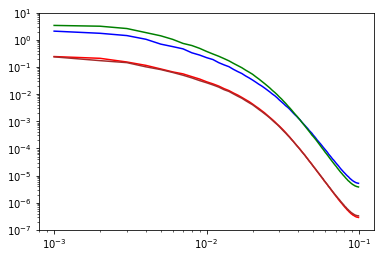

In [169]:
fig, ax = plt.subplots()
ax.plot(Pk_seas.freq_XC[101:]*1e3, Pk_seas[0,101:], 'r')
ax.plot(Pk_seas.freq_XC[101:]*1e3, Pk_seas[1,101:], 'brown')
ax.plot(Pk_seas.freq_XC[101:]*1e3, Pk_seas[2,101:], 'b')
ax.plot(Pk_seas.freq_XC[101:]*1e3, Pk_seas[3,101:], 'g')
ax.set_ylim([1e-7,1e1])
ax.set_xscale('log')
ax.set_yscale('log')

# Eddy iron fluxes

In [70]:
diff = ds.DFrITr03
with ProgressBar():
    diff_mn = (diff*ds.rA**-1*(360*86400)*1e3).mean(['time','XC']).compute()
diff_mn

[########################################] | 100% Completed |  0.1s
[########################################] | 100% Completed |  0.1s
[##                                      ] | 5% Completed | 48.1s


KeyboardInterrupt: 

In [40]:
# with ProgressBar():
#     ds_clim = ds.mean(['time','XC','XG']).load()
#     ds1_clim = ds1.mean(['time','XC','XG']).load()

In [ ]:
with ProgressBar():
    T_clim = ds.THETA.mean(['time','XC']).load()
    vb = ds.VVEL.mean(['time','XC']).load()
    wb = ds.WVEL.mean(['time','XC']).load()
    Feb = ds.TRAC03[:].mean(['time','XC']).load()
    vFeb = ds.VTRAC03[:].mean(['time','XC']).load()
    wFeb = ds.WTRAC03[:].mean(['time','XC']).load()
    FadvV = ds.ADVyTr03[:].mean(['time','XC']).load()
    FadvW = ds.ADVrTr03[:].mean(['time','XC']).load()
    kppb = ds.KPPgTr03[:].mean(['time','XC']).load()
    dfib = ds.DFrITr03[:].mean(['time','XC']).load()
    bgcb = ds.FeTbgc[:].mean(['time','XC']).load()

In [ ]:
vbFeb = grid.interp(vb,'Y',boundary='fill')*Feb
wbFeb = grid.interp(wb,'Z',boundary='fill')*Feb
vpFep_b = grid.interp(vFeb,'Y',boundary='fill') - vbFeb
wpFep_b = wFeb - wbFeb

print(vpFep_b, wpFep_b)

In [ ]:
fe_intrp = grid.interp(Feb, 'Y', boundary='fill')
temp = (vb * fe_intrp).compute()
temp = vFeb - temp
advpfep_bar = grid.diff(temp*ds.dxG.mean('XC'),'Y',
                        boundary='fill') * ds.rA.mean('XC')**-1

fe_intrp = grid.interp(Feb, 'Z', boundary='fill')
temp = (wb * fe_intrp).compute()
temp = grid.interp(wFeb,'Z',boundary='fill') - temp
adwpfep_bar = grid.diff(temp,'Z',boundary='fill') * ds.drF**-1

advpp_b = -(-adwpfep_bar + advpfep_bar)
advpp_b

In [44]:
MLDb = xr.open_dataset(op.join(pdir,'KPPMLD_05km.nc')).mld.mean(['time','XC'])
MXLDb = xr.open_dataset(op.join(pdir,'KPPhbl_99percentile_05km.nc')).hbl99.mean(['time'])

In [45]:
Fe = ds.TRAC03
with ProgressBar():
    dFedz = (grid.diff(Fe.mean('XC'),'Z',boundary='fill')/grid.diff(Fe.Z,'Z',boundary='fill')).compute()

[########################################] | 100% Completed | 11min  5.9s


In [46]:
with ProgressBar():
    dFe = (grid.diff(Fe.mean('XC'),'Z',boundary='fill')).mean('time').compute()
# nFez_clim = np.argmax(-dFedz[:,:],axis=1)

[########################################] | 100% Completed | 51.8s


In [47]:
nFez_clim = np.argmax(-dFedz.mean('time')[1:], axis=0)
# nFez_clim+9

N = nFez_clim.shape
zFe_clim = np.zeros(nFez_clim.shape)
dFe_at_zFe = np.zeros(nFez_clim.shape)
for i in range(N[0]):
    zFe_clim[i] = ds.Zl[int(nFez_clim[i]+1)]
    dFe_at_zFe[i] = dFe[:,i][int(nFez_clim[i]+1)]
#     print(dFe[:,i][int(nFez_clim[i]+1)].values)
#     for j in range(N[1]):
#         zFe_clim[i,j] = ds.Zl[int(nFez_clim[i,j])]
        
zFe_clim = xr.DataArray(zFe_clim, dims=nFez_clim.dims, coords=nFez_clim.coords)
dFe_at_zFe = xr.DataArray(dFe_at_zFe, dims=nFez_clim.dims, coords=nFez_clim.coords)
print(dFe_at_zFe, zFe_clim)

<xarray.DataArray (YC: 400)>
array([0.000000e+00, 2.221400e-05, 3.441313e-06, ..., 1.852701e-05,
       1.861934e-05, 1.910226e-05])
Coordinates:
  * YC       (YC) >f4 2500.0 7500.0 12500.0 17500.0 22500.0 27500.0 32500.0 ... <xarray.DataArray (YC: 400)>
array([-1.00000e+00, -1.51151e+03, -7.31000e+01, ..., -4.90900e+01,
       -4.90900e+01, -4.90900e+01])
Coordinates:
  * YC       (YC) >f4 2500.0 7500.0 12500.0 17500.0 22500.0 27500.0 32500.0 ...


In [48]:
diff_z = grid.diff(diff, 'Z', boundary='fill')/(ds.rA*ds.drF)
with ProgressBar():
    dff_z_clim = diff_z[:].mean(['time','XC']).compute()

[########################################] | 100% Completed |  5min 45.5s


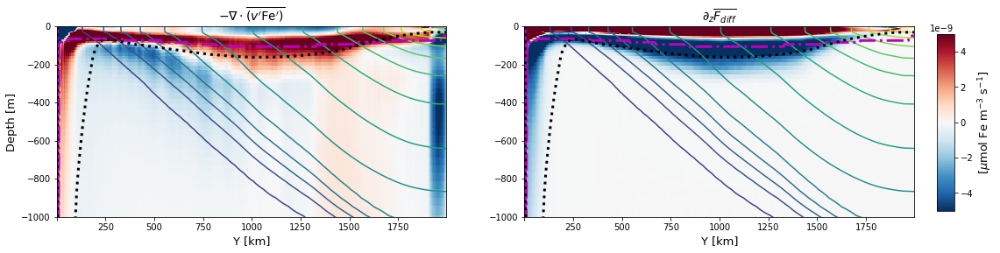

In [49]:
Tlevs = np.arange(-1.,8.5,.5) + 0.
yst = 10
dny = 20
dnz = 3
yy, zz = np.meshgrid(ds.YC.data[yst::dny], ds.Z.data[::dnz])
N = wpFep_b.data[::dnz,yst::dny].shape
T_clim = xr.open_dataset(op.join(pdir,'Climatological-theta_05km.nc')).THETA_clim

fig, (ax1,ax2) = plt.subplots(nrows=1, ncols=2, figsize=(18,4))
# fig.set_tight_layout(True)
im = ax1.pcolormesh(T_clim.YC, T_clim.Z, advpp_b*1e3, 
                   vmin=-5e-9, vmax=5e-9, cmap='RdBu_r',
                   rasterized=True)
# ax1.plot(MLDb.YC, -MLDb, 'k', lw=2)
# ax.plot(zFe_clim.YC, zFe_clim.mean('time'), 'k-.', lw=2)
ax1.plot(zFe_clim.YC, zFe_clim, ls='-.', color='m', lw=3)
ax1.plot(MXLDb.YC, -MXLDb, ls=':', color='k', lw=3)
ax1.contour(T_clim.YC, T_clim.Z, T_clim, levels=Tlevs)
#            , cmap='RdBu_r')
# ax1.quiver(yy, zz, (vpFep_b/Feb)[::dnz,yst::dny], 
#           np.ones((N[0],N[1]))*(wpFep_b/Feb)[::dnz,yst::dny], 
#           pivot='mid', angles='xy')
#           , scale_units='xy', scale=1.)
ax1.set_xticks(np.arange(0.,2e6,2.5e5))
ax1.set_xticklabels(['','250','500','750','1000','1250','1500','1750'])
ax1.set_xlabel('Y [km]', fontsize=13)
ax1.set_ylabel('Depth [m]', fontsize=13)
ax1.set_ylim([-1000,0.])
ax1.set_title(r"$-\nabla\cdot\overline{(v'{\tt Fe'})}$", fontsize=14)

ax2.pcolormesh(T_clim.YC, T_clim.Z, dff_z_clim*1e3, 
              vmin=-5e-9, vmax=5e-9, cmap='RdBu_r',
              rasterized=True)
# ax2.plot(MLDb.YC, -MLDb, 'k', lw=2)
# ax.plot(zFe_clim.YC, zFe_clim.mean('time'), 'k-.', lw=2)
ax2.plot(zFe_clim.YC, zFe_clim, ls='-.', color='m', lw=3)
ax2.plot(MXLDb.YC, -MXLDb, ls=':', color='k', lw=3)
ax2.contour(T_clim.YC, T_clim.Z, T_clim, levels=Tlevs)
ax2.set_xticks(np.arange(0.,2e6,2.5e5))
ax2.set_xticklabels(['','250','500','750','1000','1250','1500','1750'])
ax2.set_xlabel('Y [km]', fontsize=13)
# ax2.set_ylabel('Depth [m]', fontsize=13)
ax2.set_ylim([-1000,0.])
ax2.set_title(r"$\partial_z \overline{F_{diff}}$", fontsize=14)

fig.subplots_adjust(right=0.88)
cbar_ax = fig.add_axes([0.9, 0.15, 0.015, 0.7])
cbar = fig.colorbar(im, cax=cbar_ax)
cbar.set_label(r"[$\mu$mol Fe m$^{-3}$ s$^{-1}$]", fontsize=13)
plt.savefig(op.join(pdir,'Figures/eddyfluxvector_05km-top1000m.pdf'))

# Iron budget

In [7]:
month = np.tile(np.repeat(np.roll(range(12),-6),30),dy)
seas = np.tile(np.repeat(np.roll(range(4),-2),90),dy)
ds['seas'] = ('time', seas)
ds_seas = ds.groupby('seas').mean(['time','XC','XG'])
# ds_anom = ds.groupby('month') - ds_mon

In [427]:
ds_seas

<xarray.Dataset>
Dimensions:   (YC: 400, YG: 401, Z: 76, Zl: 76, Zp1: 77, Zu: 76, seas: 4)
Coordinates:
  * YC        (YC) >f4 601000.0 603000.0 605000.0 607000.0 609000.0 611000.0 ...
  * YG        (YG) >f4 600000.0 602000.0 604000.0 606000.0 608000.0 610000.0 ...
  * Z         (Z) >f4 -0.5 -1.57 -2.79 -4.185 -5.78 -7.595 -9.66 -12.01 ...
  * Zp1       (Zp1) >f4 0.0 -1.0 -2.14 -3.44 -4.93 -6.63 -8.56 -10.76 -13.26 ...
  * Zu        (Zu) >f4 -1.0 -2.14 -3.44 -4.93 -6.63 -8.56 -10.76 -13.26 ...
  * Zl        (Zl) >f4 0.0 -1.0 -2.14 -3.44 -4.93 -6.63 -8.56 -10.76 -13.26 ...
    drC       (Zp1) float64 0.5 1.07 1.22 1.395 1.595 1.815 2.065 2.35 2.67 ...
    drF       (Z) >f4 1.0 1.14 1.3 1.49 1.7 1.93 2.2 2.5 2.84 3.21 3.63 4.1 ...
    PHrefC    (Z) >f4 4.905 15.4017 27.3699 41.05485 56.7018 74.50695 ...
    PHrefF    (Zp1) >f4 0.0 9.81 20.9934 33.7464 48.3633 65.0403 83.9736 ...
  * seas      (seas) int64 0 1 2 3
Data variables:
    TRAC03    (seas, Z, YC) float32 7.7328e-06 7.760777e-06

In [8]:
with ProgressBar():
    Fes = ds_seas.TRAC03.load()
    vFes = ds_seas.VTRAC03.load()
    wFes = ds_seas.WTRAC03.load()
    advVs = ds_seas.ADVyTr03.load()
    advWs = ds_seas.ADVrTr03.load()
#     kppm = ds_mon.KPPgTr03.load()
    dfis = ds_seas.DFrITr03.load()
    bgcs = ds_seas.FeTbgc.load()

[########################################] | 100% Completed | 12min 18.5s
[########################################] | 100% Completed | 14min  0.3s
[########################################] | 100% Completed | 14min 49.9s
[########################################] | 100% Completed | 19min 18.7s
[########################################] | 100% Completed | 16min  5.6s
[########################################] | 100% Completed | 19min 28.8s
[########################################] | 100% Completed | 14min 22.8s


In [9]:
with ProgressBar():
    Fe_consump = -ds_seas.PP.load()*1e-3

[########################################] | 100% Completed | 12min 50.3s


In [12]:
advzs = grid.diff(advWs, 'Z', boundary='fill')/(ds.rA*ds.drF).mean('XC')
advys = grid.diff(advVs, 'Y', boundary='fill')/(ds.rA*ds.drF).mean('XC')
advs = -(-advzs + advys).compute()

difz = grid.diff(dfis, 'Z', boundary='fill')/(ds.rA*ds.drF).mean('XC').compute()
# kpp = grid.diff(kppm, 'Z', boundary='fill')/(ds.rA*ds.drF).mean('XC').compute()
Fe_remin = bgcs - Fe_consump

advs

<xarray.DataArray (seas: 4, Z: 76, YC: 1000)>
array([[[-0.000000e+00, -5.778243e-11, ..., -2.787949e-12, -2.249230e-12],
        [-0.000000e+00, -5.472808e-11, ..., -4.635965e-12, -4.195584e-12],
        ...,
        [-0.000000e+00, -9.102202e-15, ..., -1.275169e-13, -2.292801e-13],
        [-0.000000e+00, -1.312934e-13, ...,  5.511910e-13,  4.633039e-13]],

       [[-0.000000e+00, -3.502818e-11, ...,  3.204711e-13, -3.802850e-13],
        [-0.000000e+00, -3.836442e-11, ..., -2.903891e-13, -8.047246e-13],
        ...,
        [-0.000000e+00, -2.588283e-14, ..., -1.748458e-13, -2.838094e-13],
        [-0.000000e+00, -1.549832e-13, ...,  5.332393e-13,  3.963462e-13]],

       [[-0.000000e+00, -2.494981e-11, ..., -3.384622e-12, -2.767861e-12],
        [-0.000000e+00, -1.988248e-11, ..., -4.833598e-12, -4.707559e-12],
        ...,
        [-0.000000e+00,  2.561536e-14, ..., -1.293913e-13, -1.943261e-13],
        [-0.000000e+00, -3.371197e-14, ...,  3.353223e-13,  2.612249e-13]],

       [[

In [13]:
fe_xbar = open_mdsdataset(op.join(ddir,'Dalma_Dar02km/runs'), 
#                       grid_dir=op.join(ddir,'02km_grid'),
                         iters=range(ts,te+int(2160*15),int(2160*90)),
                         prefix=['PTRACER03'],
                         delta_t=dt
                         ).sel(YC=slice(6e5,14e5),YG=slice(6e5,14e5)).PTRACER03.mean('XC')
# print(dsS.TRAC03.attrs)
tempo = (-fe_xbar[:-1]+fe_xbar[1:].data) / (9e1*86400)
# tempo = fe_xbar.diff('time') / (3e1*864e2)
tempo.coords['seas'] = ('time',np.tile(np.roll(range(4),-2),dy))

# febar_vol = grid.cumsum(febar * ds.hFacC.mean(['XC'])*ds.rA.mean(['XC'])*ds.drF,
#                         'Z', to='outer', boundary='fill'
#                        )[:,:,nys:nyn].sum(['YC'])
# dfebardt = (-febar_vol + febar_vol.roll(month=-1).data).compute() / (3e1*24.*36e2)

dFe = tempo.groupby('seas').mean(['time']).compute()
dFe.attrs['unit'] = 'mmol Fe m-3 s-1'

dFe

<xarray.DataArray (seas: 4, Z: 76, YC: 400)>
array([[[ 1.086593e-12,  1.105294e-12, ...,  7.545777e-13,  7.615552e-13],
        [ 1.087254e-12,  1.105924e-12, ...,  7.551082e-13,  7.620451e-13],
        ...,
        [ 1.768125e-13,  1.806863e-13, ...,  2.566272e-13,  2.195288e-13],
        [ 1.913345e-13,  2.010208e-13, ...,  2.469185e-13,  2.128255e-13]],

       [[ 1.127628e-11,  1.125076e-11, ...,  5.578464e-12,  5.499043e-12],
        [ 1.127627e-11,  1.125076e-11, ...,  5.579091e-12,  5.499835e-12],
        ...,
        [-1.119315e-13, -1.043598e-13, ..., -2.511216e-13, -2.236646e-13],
        [-9.396241e-14, -9.429551e-14, ..., -9.180657e-14, -7.763267e-14]],

       [[ 7.046525e-13,  7.657814e-13, ..., -3.089189e-12, -3.099860e-12],
        [ 7.061384e-13,  7.669164e-13, ..., -3.088882e-12, -3.099531e-12],
        ...,
        [ 1.139264e-13,  1.271047e-13, ..., -3.855771e-13, -3.763773e-13],
        [ 1.743760e-13,  1.651126e-13, ..., -1.580200e-13, -1.494715e-13]],

       [[-

In [76]:
res = (dFe - (advs + difz + bgcs)).compute()
res

<xarray.DataArray (seas: 4, Z: 76, YC: 400)>
array([[[ 1.992427e-14,  1.917260e-14, ..., -3.023038e-13, -3.031066e-13],
        [ 2.710505e-18, -4.987330e-18, ..., -6.559423e-18,  2.168404e-17],
        ...,
        [ 9.608742e-18, -4.285309e-17, ...,  4.575333e-17, -1.439278e-17],
        [ 7.084841e-15,  7.808505e-15, ...,  1.487078e-14,  1.223129e-14]],

       [[-1.816963e-12, -1.810981e-12, ..., -4.914550e-13, -5.040929e-13],
        [-4.423545e-17, -2.602085e-17, ..., -2.818926e-17, -1.027824e-16],
        ...,
        [-6.207057e-18,  1.328148e-18, ..., -1.013729e-17,  1.750987e-17],
        [-1.519547e-14, -1.520194e-14, ..., -1.496414e-14, -1.354824e-14]],

       [[ 2.391203e-12,  2.373501e-12, ..., -2.919991e-12, -2.890219e-12],
        [ 1.626303e-19, -7.247892e-17, ..., -1.752071e-16, -1.366095e-17],
        ...,
        [ 5.861468e-17, -2.562783e-17, ..., -6.505213e-18,  9.297034e-18],
        [ 1.911381e-15,  1.298291e-15, ..., -2.524061e-14, -2.451279e-14]],

       [[ 

In [77]:
nys,nyn = (600,1400)
adv_mean = advs.sel(YC=slice(nys*1e3, nyn*1e3)).mean('YC').compute()
advz_mean = advzs.sel(YC=slice(nys*1e3, nyn*1e3)).mean('YC').compute()
advy_mean = advys.sel(YC=slice(nys*1e3, nyn*1e3)).mean('YC').compute()
dif_mean = difz.sel(YC=slice(nys*1e3, nyn*1e3)).mean('YC').compute()
# kpp_mean = kpp.sel(YC=slice(nys*1e3, nyn*1e3)).mean('YC').compute()
consump_mean = Fe_consump.sel(YC=slice(nys*1e3, nyn*1e3)).mean('YC').compute()
remin_mean = Fe_remin.sel(YC=slice(nys*1e3, nyn*1e3)).mean('YC').compute()
dot_mean = bgcs.sel(YC=slice(nys*1e3, nyn*1e3)).mean('YC').compute()
dFe_mean = dFe.sel(YC=slice(nys*1e3, nyn*1e3)).mean('YC').compute()
res_mean = res.sel(YC=slice(nys*1e3, nyn*1e3)).mean('YC').compute()

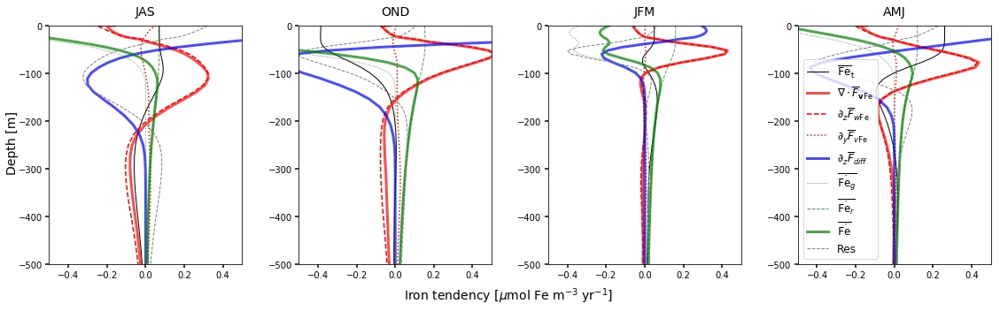

In [87]:
seas = ['JFM','AMJ','JAS','OND']
fig, axes = plt.subplots(ncols=4, nrows=1, figsize=(16,5))
i = 0
for j in np.array([2,3,0,1],dtype=int):
    axes[i].plot(dFe_mean[j]*1e3*(360*86400), dFe_mean.Z, 'k',
                 lw=1, alpha=1., label=r'$\overline{\tt Fe}_t$')
    axes[i].plot(adv_mean[j]*1e3*(360*86400), adv_mean.Z, 'r',
                lw=3, alpha=0.7, label=r'$\nabla\cdot\overline{F}_{\mathbf{v} {\tt Fe}}$')
    axes[i].plot(advz_mean[j]*1e3*(360*86400), adv_mean.Z, 'r',
                ls='--', label=r'$\partial_z \overline{F}_{w {\tt Fe}}$')
    axes[i].plot(-advy_mean[j]*1e3*(360*86400), adv_mean.Z, 'r',
                ls=':', label=r'$\partial_y \overline{F}_{v {\tt Fe}}$')
    axes[i].plot(dif_mean[j]*1e3*(360*86400), dif_mean.Z, 'b',
                lw=3, alpha=.7, label=r"$\partial_z \overline{F}_{diff}$")
    axes[i].plot(consump_mean[j]*1e3*(360*86400), consump_mean.Z, 'g:',
                lw=1, alpha=.7, label=r"$\overline{\dot{\tt Fe}_g}$")
    axes[i].plot(remin_mean[j]*1e3*(360*86400), remin_mean.Z, 'g--',
                lw=1, alpha=.7, label=r"$\overline{\dot{\tt Fe}_r}$")
    axes[i].plot(dot_mean[j]*1e3*(360*86400), remin_mean.Z, 'g',
                lw=3, alpha=.7, label=r"$\overline{\dot{\tt Fe}}$")
    axes[i].plot(res_mean[j]*1e3*(360*86400), res_mean.Z, '--', color='grey',
                lw=1, alpha=1., label=r"Res")
    tkw = dict(size=4, width=1.5)
#         ax2.tick_params(axis='x', colors=p2.get_color(), **tkw)
    axes[i].tick_params(axis='both', **tkw)
        
    axes[i].set_title(seas[j],fontsize=14,y=1.02)
    axes[i].set_xlim([-5e-1,5e-1])
    axes[i].set_ylim([-5e2,0.])
    i += 1
    
axes[-1].legend(loc='lower left', fontsize=12)
fig.subplots_adjust(left=0.12)
# cbar_ax = fig.add_axes([0.84, 0.2, 0.03, 0.6])
# cbar = fig.colorbar(cax, cax=cbar_ax)
# cbar.set_label(r'[mM N/m$^3$]',fontsize=12)

fig.text(0.01, 0.5, 'Depth [m]', 
         va='center', rotation='vertical', fontsize=14)
fig.text(0.4, 0.02, 'Iron tendency [$\mu$mol Fe m$^{-3}$ yr$^{-1}$]', 
         va='center', rotation='horizontal', fontsize=14)

plt.tight_layout(pad=2.5)
# plt.grid(True)
plt.savefig(op.join(ddir,'Dalma_Dar02km/Figures/IronBudget_seasclim_02km.pdf'))

7
8
9
10
11
0


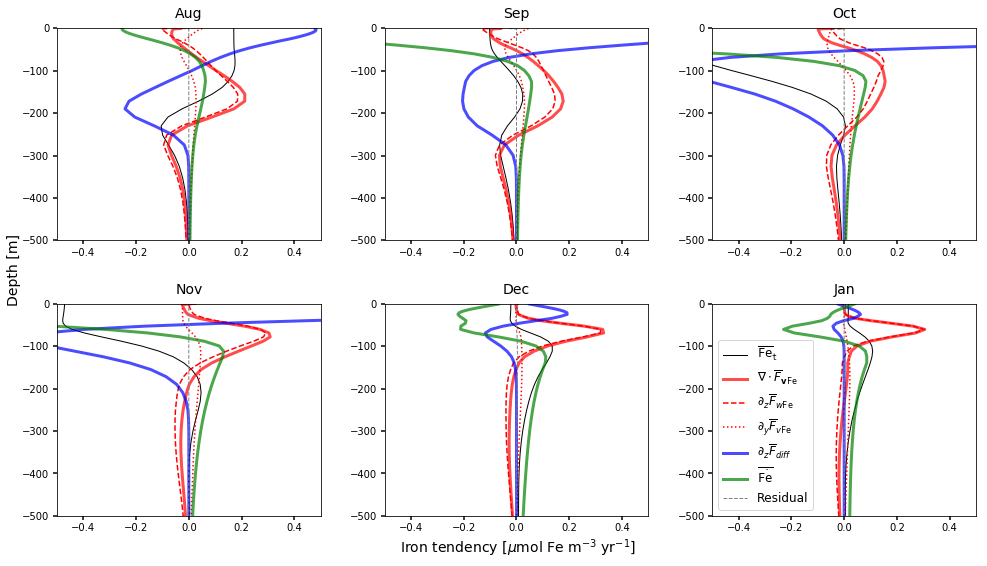

In [28]:
colors = ['pink','r','m','orange','brown','k','purple','indigo','b','c','g','y']
months = ['Jan','Feb','Mar','Apr','May','Jun','Jul','Aug','Sep','Oct','Nov','Dec']

fig, axes = plt.subplots(ncols=3, nrows=2, figsize=(14,8))
for j in range(2):
    for i in range(3):
        nn = j*3+i+7
        if nn > 11:
            nn -= 12
        print(nn)
        axes[j,i].plot(dFe_mean[nn]*1e3*(360*86400), dFe_mean.Z, 'k',
                       lw=1, alpha=1., label=r'$\overline{\tt Fe}_t$')
        axes[j,i].plot(adv_mean[nn]*1e3*(360*86400), adv_mean.Z, 'r',
                       lw=3, alpha=0.7, label=r'$\nabla\cdot\overline{F}_{\mathbf{v} {\tt Fe}}$')
        axes[j,i].plot(advz_mean[nn]*1e3*(360*86400), adv_mean.Z, 'r',
                       ls='--', label=r'$\partial_z \overline{F}_{w {\tt Fe}}$')
        axes[j,i].plot(-advy_mean[nn]*1e3*(360*86400), adv_mean.Z, 'r',
                       ls=':', label=r'$\partial_y \overline{F}_{v {\tt Fe}}$')
        axes[j,i].plot(dif_mean[nn]*1e3*(360*86400), dif_mean.Z, 'b',
                       lw=3, alpha=.7, label=r"$\partial_z \overline{F}_{diff}$")
#         axes[j,i].plot(kpp_mean[nn]*1e3*(360*86400), kpp_mean.Z, 'orange',
#                        lw=1, label=r"$\partial_z \overline{F}_{KPP}$")
        axes[j,i].plot(dot_mean[nn]*1e3*(360*86400), dot_mean.Z, 'g',
                       lw=3, alpha=.7, label=r"$\overline{\dot{\tt Fe}}$")
        axes[j,i].plot(res_mean[nn]*1e3*(360*86400), res_mean.Z, '--', color='grey',
                       lw=1, alpha=1., label=r"Residual")
#         ax2 = axes[j,i].twiny()
#         p2, = ax2.plot((np.absolute(wpfep_bar_II*Lx+diffe_II*nx)/
#                        np.absolute(vbarfebar_I-vbarfebar_III+wbarfebar_II
#                                    +vpfep_bar_I-vpfep_bar_III)*Lx)[j*3+i,:nz],
#                        diffe_II.Z[:nz], 'grey', lw=3, alpha=0.6
#                       )
# #         ax2.set_xlim([.1,1e1])
#         ax2.set_xscale('log')
#         ax2.xaxis.label.set_color(p2.get_color())

        tkw = dict(size=4, width=1.5)
#         ax2.tick_params(axis='x', colors=p2.get_color(), **tkw)
        axes[j,i].tick_params(axis='both', **tkw)
        
        axes[j,i].set_title(months[nn],fontsize=14,y=1.02)
        axes[j,i].set_xlim([-5e-1,5e-1])
        axes[j,i].set_ylim([-5e2,0.])
#         axes[j,i].grid(True)
axes[1,2].legend(loc='lower left', fontsize=12)
fig.subplots_adjust(left=0.12)
# cbar_ax = fig.add_axes([0.84, 0.2, 0.03, 0.6])
# cbar = fig.colorbar(cax, cax=cbar_ax)
# cbar.set_label(r'[mM N/m$^3$]',fontsize=12)

fig.text(0.01, 0.5, 'Depth [m]', 
         va='center', rotation='vertical', fontsize=14)
fig.text(0.4, 0.018, 'Iron tendency [$\mu$mol Fe m$^{-3}$ yr$^{-1}$]', 
         va='center', rotation='horizontal', fontsize=14)

plt.tight_layout(pad=2.5)
# plt.grid(True)
plt.savefig(op.join(pdir,'Figures/IronBudget_seasclim_02km.pdf'))

In [14]:
with ProgressBar():
    vs = ds_seas.VVEL.load()
    ws = ds_seas.WVEL.load()
fe_intrp = grid.interp(Fes, 'Y', boundary='fill')
vsfes = (vs * fe_intrp).compute()
fe_intrp = grid.interp(Fes, 'Z', boundary='fill')
wsfes = (ws * fe_intrp).compute()

[########################################] | 100% Completed | 14min 10.2s
[########################################] | 100% Completed | 11min 17.6s


In [15]:
dwfe = advWs/ds.rA.mean('XC') - grid.interp(wFes,'Z',boundary='fill')
dvfe = advVs/(ds.drF*ds.dxG).mean('XC') - vFes

dwfe_s = grid.diff(dwfe,'Z',boundary='fill') * ds.drF**-1
dvfe_s = grid.diff(dvfe*ds.dxG.mean('XC'),'Y',boundary='fill') * ds.rA.mean(['XC'])**-1
print(dwfe_s, dvfe_s)
dadv = -(-dwfe_s + dvfe_s)
dadv

<xarray.DataArray (seas: 4, Z: 76, YC: 1000)>
dask.array<shape=(4, 76, 1000), dtype=float32, chunksize=(4, 75, 1000)>
Coordinates:
  * seas     (seas) int64 0 1 2 3
  * Z        (Z) >f4 -0.5 -1.57 -2.79 -4.185 ... -2625.955 -2757.325 -2912.665
  * YC       (YC) >f4 1000.0 3000.0 5000.0 ... 1995000.0 1997000.0 1999000.0
    drF      (Z) >f4 dask.array<shape=(76,), chunksize=(76,)>
    PHrefC   (Z) >f4 dask.array<shape=(76,), chunksize=(76,)> <xarray.DataArray (seas: 4, Z: 76, YC: 1000)>
dask.array<shape=(4, 76, 1000), dtype=float32, chunksize=(4, 76, 999)>
Coordinates:
  * seas     (seas) int64 0 1 2 3
  * Z        (Z) >f4 -0.5 -1.57 -2.79 -4.185 ... -2625.955 -2757.325 -2912.665
  * YC       (YC) >f4 1000.0 3000.0 5000.0 ... 1995000.0 1997000.0 1999000.0


<xarray.DataArray (seas: 4, Z: 76, YC: 1000)>
dask.array<shape=(4, 76, 1000), dtype=float32, chunksize=(4, 75, 999)>
Coordinates:
  * seas     (seas) int64 0 1 2 3
  * Z        (Z) >f4 -0.5 -1.57 -2.79 -4.185 ... -2625.955 -2757.325 -2912.665
  * YC       (YC) >f4 1000.0 3000.0 5000.0 ... 1995000.0 1997000.0 1999000.0
    drF      (Z) >f4 dask.array<shape=(76,), chunksize=(76,)>
    PHrefC   (Z) >f4 dask.array<shape=(76,), chunksize=(76,)>

In [16]:
advsfes = grid.diff(vsfes*ds.dxG.mean('XC'),
                   'Y',boundary='fill') * ds.rA.mean(['XC'])**-1
adwsfes = grid.diff(wsfes,'Z',boundary='fill') * ds.drF**-1

print(advsfes, adwsfes)

<xarray.DataArray (seas: 4, Z: 76, YC: 1000)>
dask.array<shape=(4, 76, 1000), dtype=float32, chunksize=(4, 76, 999)>
Coordinates:
  * seas     (seas) int64 0 1 2 3
  * Z        (Z) >f4 -0.5 -1.57 -2.79 -4.185 ... -2625.955 -2757.325 -2912.665
  * YC       (YC) >f4 1000.0 3000.0 5000.0 ... 1995000.0 1997000.0 1999000.0 <xarray.DataArray (seas: 4, Z: 76, YC: 1000)>
dask.array<shape=(4, 76, 1000), dtype=float32, chunksize=(4, 76, 1000)>
Coordinates:
  * seas     (seas) int64 0 1 2 3
  * Z        (Z) >f4 -0.5 -1.57 -2.79 -4.185 ... -2625.955 -2757.325 -2912.665
  * YC       (YC) >f4 1000.0 3000.0 5000.0 ... 1995000.0 1997000.0 1999000.0
    drF      (Z) >f4 dask.array<shape=(76,), chunksize=(76,)>
    PHrefC   (Z) >f4 dask.array<shape=(76,), chunksize=(76,)>


In [17]:
vpfep_s = vFes - vsfes
advpfep_s = grid.diff(vpfep_s*ds.dxG.mean('XC'),
                     'Y',boundary='fill') * ds.rA.mean('XC')**-1
wpfep_s = grid.interp(wFes,'Z',boundary='fill') - wsfes
adwpfep_s = grid.diff(wpfep_s,'Z',boundary='fill') * ds.drF**-1

print(advpfep_s, adwpfep_s)

<xarray.DataArray (seas: 4, Z: 76, YC: 1000)>
dask.array<shape=(4, 76, 1000), dtype=float32, chunksize=(4, 76, 999)>
Coordinates:
  * seas     (seas) int64 0 1 2 3
  * Z        (Z) >f4 -0.5 -1.57 -2.79 -4.185 ... -2625.955 -2757.325 -2912.665
  * YC       (YC) >f4 1000.0 3000.0 5000.0 ... 1995000.0 1997000.0 1999000.0 <xarray.DataArray (seas: 4, Z: 76, YC: 1000)>
dask.array<shape=(4, 76, 1000), dtype=float32, chunksize=(4, 76, 1000)>
Coordinates:
  * seas     (seas) int64 0 1 2 3
  * Z        (Z) >f4 -0.5 -1.57 -2.79 -4.185 ... -2625.955 -2757.325 -2912.665
  * YC       (YC) >f4 1000.0 3000.0 5000.0 ... 1995000.0 1997000.0 1999000.0
    drF      (Z) >f4 dask.array<shape=(76,), chunksize=(76,)>
    PHrefC   (Z) >f4 dask.array<shape=(76,), chunksize=(76,)>


In [18]:
advss = -(-adwsfes + advsfes)
advpp_s = -(-adwpfep_s + advpfep_s)

In [99]:
fe_xbar = open_mdsdataset(op.join(ddir,'Dalma_Dar02km/runs'), 
#                       grid_dir=op.join(ddir,'02km_grid'),
                         iters=range(ts,te+int(2160*15),int(2160*90)),
                         prefix=['PTRACER03'],
                         delta_t=dt
                         ).sel(YC=slice(6e5,14e5),YG=slice(6e5,14e5)).PTRACER03.mean('XC')
# print(dsS.TRAC03.attrs)
tempo = (-fe_xbar[:-1]+fe_xbar[1:].data) / (9e1*86400)
# tempo = fe_xbar.diff('time') / (3e1*864e2)
tempo.coords['seas'] = ('time',np.tile(np.roll(range(4),-2),dy))

# febar_vol = grid.cumsum(febar * ds.hFacC.mean(['XC'])*ds.rA.mean(['XC'])*ds.drF,
#                         'Z', to='outer', boundary='fill'
#                        )[:,:,nys:nyn].sum(['YC'])
# dfebardt = (-febar_vol + febar_vol.roll(month=-1).data).compute() / (3e1*24.*36e2)

dFe = tempo.groupby('seas').mean(['time']).compute()
dFe.attrs['unit'] = 'mmol Fe m-3 s-1'

dFe

/home/takaya/xmitgcm/xmitgcm/utils.py:314: UserWarning: Not sure what to do with rlev = L
  warnings.warn("Not sure what to do with rlev = " + rlev)


<xarray.DataArray (seas: 4, Z: 76, YC: 400)>
array([[[ 1.086593e-12,  1.105294e-12, ...,  7.545777e-13,  7.615552e-13],
        [ 1.087254e-12,  1.105924e-12, ...,  7.551082e-13,  7.620451e-13],
        ...,
        [ 1.768125e-13,  1.806863e-13, ...,  2.566272e-13,  2.195288e-13],
        [ 1.913345e-13,  2.010208e-13, ...,  2.469185e-13,  2.128255e-13]],

       [[ 1.127628e-11,  1.125076e-11, ...,  5.578464e-12,  5.499043e-12],
        [ 1.127627e-11,  1.125076e-11, ...,  5.579091e-12,  5.499835e-12],
        ...,
        [-1.119315e-13, -1.043598e-13, ..., -2.511216e-13, -2.236646e-13],
        [-9.396241e-14, -9.429551e-14, ..., -9.180657e-14, -7.763267e-14]],

       [[ 7.046525e-13,  7.657814e-13, ..., -3.089189e-12, -3.099860e-12],
        [ 7.061384e-13,  7.669164e-13, ..., -3.088882e-12, -3.099531e-12],
        ...,
        [ 1.139264e-13,  1.271047e-13, ..., -3.855771e-13, -3.763773e-13],
        [ 1.743760e-13,  1.651126e-13, ..., -1.580200e-13, -1.494715e-13]],

       [[-

In [19]:
res = dFe - ((advs+advpp_s) + difz + bgcs + dadv)
res

<xarray.DataArray (seas: 4, Z: 76, YC: 400)>
dask.array<shape=(4, 76, 400), dtype=float32, chunksize=(4, 75, 400)>
Coordinates:
  * YC       (YC) float64 6.01e+05 6.03e+05 6.05e+05 ... 1.397e+06 1.399e+06
  * Z        (Z) >f4 -0.5 -1.57 -2.79 -4.185 ... -2625.955 -2757.325 -2912.665
    drF      (Z) >f4 1.0 1.14 1.3 1.49 1.7 ... 118.35 126.73 136.01 174.67
    PHrefC   (Z) >f4 4.905 15.4017 27.3699 ... 25760.62 27049.357 28573.244
  * seas     (seas) int64 0 1 2 3

In [20]:
nys,nyn = (600,1400)
with ProgressBar():
    advbb_mean = advss.sel(YC=slice(nys*1e3, nyn*1e3)).mean('YC').compute()
    advpp_mean = advpp_s.sel(YC=slice(nys*1e3, nyn*1e3)).mean('YC').compute()
    advpp_meanz = adwpfep_s.sel(YC=slice(nys*1e3, nyn*1e3)).mean('YC').compute()
    advpp_meany = -advpfep_s.sel(YC=slice(nys*1e3, nyn*1e3)).mean('YC').compute()
    dadv_mean = dadv.sel(YC=slice(nys*1e3, nyn*1e3)).mean('YC').compute()
    dFe_mean = dFe.sel(YC=slice(nys*1e3, nyn*1e3)).mean('YC').compute()
    dif_mean = difz.sel(YC=slice(nys*1e3, nyn*1e3)).mean('YC').compute()
#     kpp_mean = kpp.sel(YC=slice(nys*1e3, nyn*1e3)).mean('YC').compute()
    remin_mean = Fe_remin.sel(YC=slice(nys*1e3, nyn*1e3)).mean('YC').compute()
    consump_mean = Fe_consump.sel(YC=slice(nys*1e3, nyn*1e3)).mean('YC').compute()
    dot_mean = bgcs.sel(YC=slice(nys*1e3, nyn*1e3)).mean('YC').compute()
    res_mean = res.sel(YC=slice(nys*1e3, nyn*1e3)).mean('YC').compute()

[########################################] | 100% Completed |  0.6s
[########################################] | 100% Completed |  0.1s
[########################################] | 100% Completed |  0.1s
[########################################] | 100% Completed |  0.1s
[########################################] | 100% Completed |  0.6s
[########################################] | 100% Completed |  0.6s


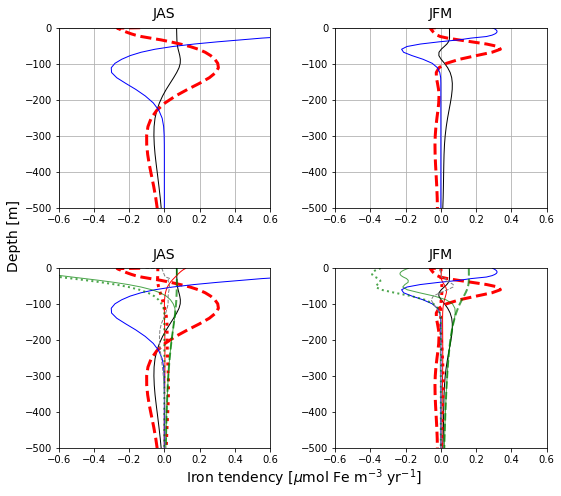

In [31]:
seas = ['JFM','AMJ','JAS','OND']
i = 0
js = np.array([2,0,2,0],dtype=int)
fig, axes = plt.subplots(ncols=2, nrows=2, figsize=(8,7))
for k in range(2):
    for l in range(2):
        if (k==0 and l==0) or (k==0 and l==1):
            axes[k,l].plot(dFe_mean[js[i]]*1e3*(360*86400), dFe_mean.Z, 'k',
                        lw=1, label=r'$\overline{\tt Fe}_t$')
    #         axes[k,l].plot(advbb_mean[js[i]]*1e3*(360*86400), advbb_mean.Z, 'r',
    #                     lw=1, label=r'$-\nabla\cdot (\overline{\mathbf{v}}$ $\overline{\tt Fe})$')
            axes[k,l].plot(advpp_meanz[js[i]]*1e3*(360*86400), advpp_mean.Z, 'r--',
                        lw=3, label=r"$-\partial_z (\overline{w' {\tt Fe}'})$")
    #         axes[k,l].plot(advpp_meany[js[i]]*1e3*(360*86400), advpp_mean.Z, 'r:',
    #                     lw=3, label=r"$-\partial_y (\overline{v' {\tt Fe}'})$")
            axes[k,l].plot(dif_mean[js[i]]*1e3*(360*86400), dif_mean.Z, 'b',
                        lw=1, label=r"$\partial_z\overline{F}_{diff}$")
        #             axes[1,i].plot(kpp_mean[nn]*1e3, kpp_mean.Z, 'c',
        #                            lw=1, label=r"$\overline{F}_{KPP}$")
    #         axes[k,l].plot(consump_mean[js[i]]*1e3*(360*86400), consump_mean.Z, 'g:',
    #                     lw=2, alpha=.7, label=r"$\overline{\dot{\tt Fe}_p}$")
    #         axes[k,l].plot(remin_mean[js[i]]*1e3*(360*86400), remin_mean.Z, 'g--',
    #                     lw=2, alpha=.7, label=r"$\overline{\dot{\tt Fe}_r}$")
    #         axes[k,l].plot(dot_mean[js[i]]*1e3*(360*86400), remin_mean.Z, 'g',
    #                     lw=1, alpha=.7, label=r"$\overline{\dot{\tt Fe}}$")
    #         axes[k,l].plot(dadv_mean[js[i]]*1e3*(360*86400), dadv_mean.Z, '--', color='grey',
    #                     lw=1, label=r"$\nabla\cdot(\overline{F}_{\mathbf{v}{\tt Fe}} - \overline{\mathbf{v}{\tt Fe}})$")
        #         axes[i].plot(res_mean[nn]*1e3, res_mean.Z, '--', color='grey',
        #                       lw=1, label=r"Residual")
            axes[k,l].tick_params(axis='both')
            axes[k,l].set_title(seas[js[i]],fontsize=14,y=1.02)
            axes[k,l].set_xlim([-6e-1, 6e-1])
            axes[k,l].set_ylim([-5e2, 0])
        else:
            axes[k,l].plot(dFe_mean[js[i]]*1e3*(360*86400), dFe_mean.Z, 'k',
                        lw=1, label=r'$\overline{\tt Fe}_t$')
            axes[k,l].plot(advbb_mean[js[i]]*1e3*(360*86400), advbb_mean.Z, 'r',
                        lw=1, label=r'$-\nabla\cdot (\overline{\mathbf{v}}$ $\overline{\tt Fe})$')
            axes[k,l].plot(advpp_meanz[js[i]]*1e3*(360*86400), advpp_mean.Z, 'r--',
                        lw=3, label=r"$-\partial_z (\overline{w' {\tt Fe}'})$")
            axes[k,l].plot(advpp_meany[js[i]]*1e3*(360*86400), advpp_mean.Z, 'r:',
                        lw=3, label=r"$-\partial_y (\overline{v' {\tt Fe}'})$")
            axes[k,l].plot(dif_mean[js[i]]*1e3*(360*86400), dif_mean.Z, 'b',
                        lw=1, label=r"$\partial_z\overline{F}_{diff}$")
        #             axes[1,i].plot(kpp_mean[nn]*1e3, kpp_mean.Z, 'c',
        #                            lw=1, label=r"$\overline{F}_{KPP}$")
            axes[k,l].plot(consump_mean[js[i]]*1e3*(360*86400), consump_mean.Z, 'g:',
                        lw=2, alpha=.7, label=r"$\overline{\dot{\tt Fe}_p}$")
            axes[k,l].plot(remin_mean[js[i]]*1e3*(360*86400), remin_mean.Z, 'g--',
                        lw=2, alpha=.7, label=r"$\overline{\dot{\tt Fe}_r}$")
            axes[k,l].plot(dot_mean[js[i]]*1e3*(360*86400), remin_mean.Z, 'g',
                        lw=1, alpha=.7, label=r"$\overline{\dot{\tt Fe}}$")
            axes[k,l].plot(dadv_mean[js[i]]*1e3*(360*86400), dadv_mean.Z, '--', color='grey',
                        lw=1, label=r"$\nabla\cdot(\overline{F}_{\mathbf{v}{\tt Fe}} - \overline{\mathbf{v}{\tt Fe}})$")
        #         axes[i].plot(res_mean[nn]*1e3, res_mean.Z, '--', color='grey',
        #                       lw=1, label=r"Residual")
            axes[k,l].tick_params(axis='both')
            axes[k,l].set_title(seas[js[i]],fontsize=14,y=1.02)
            axes[k,l].set_xlim([-6e-1, 6e-1])
            axes[k,l].set_ylim([-5e2, 0])
        i += 1
#         axes[j,i].grid(True)
# axes[1,1].legend(bbox_to_anchor=(1.18, 1.5), fontsize=12)
# axes[1,0].legend(loc='lower left', fontsize=11)
fig.subplots_adjust(left=0.2)
# cbar_ax = fig.add_axes([0.84, 0.2, 0.03, 0.6])
# cbar = fig.colorbar(cax, cax=cbar_ax)
# cbar.set_label(r'[mM N/m$^3$]',fontsize=12)

fig.text(0.01, 0.5, 'Depth [m]', 
         va='center', rotation='vertical', fontsize=14)
fig.text(0.32, 0.02, 'Iron tendency [$\mu$mol Fe m$^{-3}$ yr$^{-1}$]', 
         va='center', rotation='horizontal', fontsize=14)

plt.tight_layout(pad=2.3)
axes[0,0].grid(True)
axes[0,1].grid(True)
plt.savefig(op.join(ddir,'Dalma_Dar02km/Figures/IronBudget-dFedt-wpFep-Diff_seasclim_02km_wPPterms_woutlegend.pdf'))

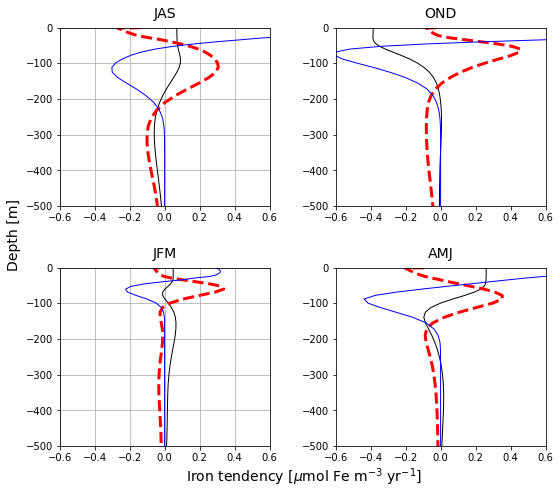

In [26]:
seas = ['JFM','AMJ','JAS','OND']
i = 0
js = np.array([2,3,0,1],dtype=int)
fig, axes = plt.subplots(ncols=2, nrows=2, figsize=(8,7))
for k in range(2):
    for l in range(2):
        axes[k,l].plot(dFe_mean[js[i]]*1e3*(360*86400), dFe_mean.Z, 'k',
                    lw=1, label=r'$\overline{\tt Fe}_t$')
#         axes[k,l].plot(advbb_mean[js[i]]*1e3*(360*86400), advbb_mean.Z, 'r',
#                     lw=1, label=r'$-\nabla\cdot (\overline{\mathbf{v}}$ $\overline{\tt Fe})$')
        axes[k,l].plot(advpp_meanz[js[i]]*1e3*(360*86400), advpp_mean.Z, 'r--',
                    lw=3, label=r"$-\partial_z (\overline{w' {\tt Fe}'})$")
#         axes[k,l].plot(advpp_meany[js[i]]*1e3*(360*86400), advpp_mean.Z, 'r:',
#                     lw=3, label=r"$-\partial_y (\overline{v' {\tt Fe}'})$")
        axes[k,l].plot(dif_mean[js[i]]*1e3*(360*86400), dif_mean.Z, 'b',
                    lw=1, label=r"$\partial_z\overline{F}_{diff}$")
    #             axes[1,i].plot(kpp_mean[nn]*1e3, kpp_mean.Z, 'c',
    #                            lw=1, label=r"$\overline{F}_{KPP}$")
#         axes[k,l].plot(consump_mean[js[i]]*1e3*(360*86400), consump_mean.Z, 'g:',
#                     lw=2, alpha=.7, label=r"$\overline{\dot{\tt Fe}_p}$")
#         axes[k,l].plot(remin_mean[js[i]]*1e3*(360*86400), remin_mean.Z, 'g--',
#                     lw=2, alpha=.7, label=r"$\overline{\dot{\tt Fe}_r}$")
#         axes[k,l].plot(dot_mean[js[i]]*1e3*(360*86400), remin_mean.Z, 'g',
#                     lw=1, alpha=.7, label=r"$\overline{\dot{\tt Fe}}$")
#         axes[k,l].plot(dadv_mean[js[i]]*1e3*(360*86400), dadv_mean.Z, '--', color='grey',
#                     lw=1, label=r"$\nabla\cdot(\overline{F}_{\mathbf{v}{\tt Fe}} - \overline{\mathbf{v}{\tt Fe}})$")
    #         axes[i].plot(res_mean[nn]*1e3, res_mean.Z, '--', color='grey',
    #                       lw=1, label=r"Residual")
        axes[k,l].tick_params(axis='both')
        axes[k,l].set_title(seas[js[i]],fontsize=14,y=1.02)
        axes[k,l].set_xlim([-6e-1, 6e-1])
        axes[k,l].set_ylim([-5e2, 0])
        i += 1
#         axes[j,i].grid(True)
# axes[1,1].legend(bbox_to_anchor=(1.18, 1.5), fontsize=12)
# axes[1,0].legend(loc='lower left', fontsize=11)
fig.subplots_adjust(left=0.2)
# cbar_ax = fig.add_axes([0.84, 0.2, 0.03, 0.6])
# cbar = fig.colorbar(cax, cax=cbar_ax)
# cbar.set_label(r'[mM N/m$^3$]',fontsize=12)

fig.text(0.01, 0.5, 'Depth [m]', 
         va='center', rotation='vertical', fontsize=14)
fig.text(0.32, 0.02, 'Iron tendency [$\mu$mol Fe m$^{-3}$ yr$^{-1}$]', 
         va='center', rotation='horizontal', fontsize=14)

plt.tight_layout(pad=2.4)
axes[0,0].grid(True)
axes[1,0].grid(True)
plt.savefig(op.join(ddir,'Dalma_Dar02km/Figures/IronBudget-dFedt-wpFep-Diff_seasclim_02km_wPPterms_woutlegend.pdf'))

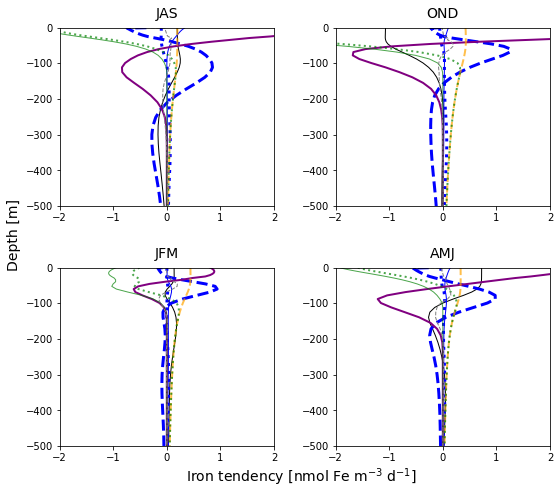

In [145]:
seas = ['JFM','AMJ','JAS','OND']
i = 0
js = np.array([2,3,0,1],dtype=int)
fig, axes = plt.subplots(ncols=2, nrows=2, figsize=(8,7))
for k in range(2):
    for l in range(2):
        axes[k,l].plot(dFe_mean[js[i]]*1e6*(86400), dFe_mean.Z, 'k',
                    lw=1, label=r'$\overline{\tt Fe}_t$')
        axes[k,l].plot(advbb_mean[js[i]]*1e6*(86400), advbb_mean.Z, 'b',
                    lw=1, label=r'$-\nabla\cdot (\overline{\mathbf{v}}$ $\overline{\tt Fe})$')
        axes[k,l].plot(advpp_meanz[js[i]]*1e6*(86400), advpp_mean.Z, 'b--',
                    lw=3, label=r"$-\partial_z (\overline{w' {\tt Fe}'})$")
        axes[k,l].plot(advpp_meany[js[i]]*1e6*(86400), advpp_mean.Z, 'b:',
                    lw=3, label=r"$-\partial_y (\overline{v' {\tt Fe}'})$")
        axes[k,l].plot(dif_mean[js[i]]*1e6*(86400), dif_mean.Z, c='purple',
                    lw=2, label=r"$\partial_z\overline{F}_{diff}$")
    #             axes[1,i].plot(kpp_mean[nn]*1e3, kpp_mean.Z, 'c',
    #                            lw=1, label=r"$\overline{F}_{KPP}$")
        axes[k,l].plot(consump_mean[js[i]]*1e6*(86400), consump_mean.Z, 'g',
                    lw=1, alpha=.7, label=r"$\overline{\dot{\tt Fe}_p}$")
        axes[k,l].plot(remin_mean[js[i]]*1e6*(86400), remin_mean.Z, ls='--', c='orange',
                    lw=2, alpha=.7, label=r"$\overline{\dot{\tt Fe}_r}$")
        axes[k,l].plot(dot_mean[js[i]]*1e6*(86400), remin_mean.Z, 'g:',
                    lw=2, alpha=.7, label=r"$\overline{\dot{\tt Fe}}$")
        axes[k,l].plot(dadv_mean[js[i]]*1e6*(86400), dadv_mean.Z, '--', color='grey',
                    lw=1, label=r"$\nabla\cdot(\overline{F}_{\mathbf{v}{\tt Fe}} - \overline{\mathbf{v}{\tt Fe}})$")
    #         axes[i].plot(res_mean[nn]*1e3, res_mean.Z, '--', color='grey',
    #                       lw=1, label=r"Residual")
        axes[k,l].tick_params(axis='both')
        axes[k,l].set_title(seas[js[i]],fontsize=14,y=1.02)
        axes[k,l].set_xlim([-20e-1, 20e-1])
        axes[k,l].set_ylim([-5e2, 0])
        i += 1
#         axes[j,i].grid(True)
# axes[1,1].legend(bbox_to_anchor=(1.18, 1.5), fontsize=12)
# axes[1,0].legend(loc='lower left', fontsize=11)
fig.subplots_adjust(left=0.2)
# cbar_ax = fig.add_axes([0.84, 0.2, 0.03, 0.6])
# cbar = fig.colorbar(cax, cax=cbar_ax)
# cbar.set_label(r'[mM N/m$^3$]',fontsize=12)

fig.text(0.01, 0.5, 'Depth [m]', 
         va='center', rotation='vertical', fontsize=14)
fig.text(0.32, 0.02, 'Iron tendency [nmol Fe m$^{-3}$ d$^{-1}$]', 
         va='center', rotation='horizontal', fontsize=14)

plt.tight_layout(pad=2.4)
# plt.grid(True)
plt.savefig(op.join(ddir,'Dalma_Dar02km/Figures/IronBudget_seasclim_02km_wPPterms_woutlegend_nmol-d.pdf'))

In [89]:
ds_ann = ds.mean(['time','XC','XG'])
with ProgressBar():
    Fea = ds_ann.TRAC03.load()
    vFea = ds_ann.VTRAC03.load()
    wFea = ds_ann.WTRAC03.load()
    advVa = ds_ann.ADVyTr03.load()
    advWa = ds_ann.ADVrTr03.load()
#     kppm = ds_mon.KPPgTr03.load()
    dfia = ds_ann.DFrITr03.load()
    bgca = ds_ann.FeTbgc.load()

[########################################] | 100% Completed |  2min 40.1s
[########################################] | 100% Completed | 45.4s
[########################################] | 100% Completed | 35.9s
[########################################] | 100% Completed | 36.8s
[########################################] | 100% Completed | 40.4s
[########################################] | 100% Completed | 37.1s
[########################################] | 100% Completed | 38.8s


In [97]:
with ProgressBar():
    Fe_consumpa = -ds_ann.PP.load()*1e-3
advza = grid.diff(advWa, 'Z', boundary='fill')/(ds.rA*ds.drF).mean('XC')
advya = grid.diff(advVa, 'Y', boundary='fill')/(ds.rA*ds.drF).mean('XC')
adva = -(-advza + advya).compute()

difza = grid.diff(dfia, 'Z', boundary='fill')/(ds.rA*ds.drF).mean('XC').compute()
# kpp = grid.diff(kppm, 'Z', boundary='fill')/(ds.rA*ds.drF).mean('XC').compute()
Fe_remina = bgca - Fe_consumpa

adva

[########################################] | 100% Completed | 35.5s


<xarray.DataArray (Z: 76, YC: 1000)>
array([[-0.000000e+00, -4.517749e-11, -6.599400e-11, ..., -5.782964e-12,
        -4.787017e-12, -3.734075e-12],
       [-0.000000e+00, -4.391745e-11, -6.385534e-11, ..., -6.020313e-12,
        -5.203931e-12, -4.247021e-12],
       [-0.000000e+00, -4.310377e-11, -6.219229e-11, ..., -6.081208e-12,
        -5.284719e-12, -4.493513e-12],
       ...,
       [-0.000000e+00, -3.724037e-14, -3.243713e-14, ...,  5.220802e-14,
        -9.082395e-16, -3.239596e-14],
       [-0.000000e+00, -2.532425e-15,  4.669659e-15, ..., -7.564273e-14,
        -1.829507e-13, -2.474236e-13],
       [-0.000000e+00, -1.103891e-13, -1.041883e-13, ...,  5.652038e-13,
         4.728810e-13,  3.741243e-13]], dtype=float32)
Coordinates:
  * Z        (Z) >f4 -0.5 -1.57 -2.79 -4.185 ... -2625.955 -2757.325 -2912.665
  * YC       (YC) >f4 1000.0 3000.0 5000.0 ... 1995000.0 1997000.0 1999000.0
    drF      (Z) >f4 1.0 1.14 1.3 1.49 1.7 ... 118.35 126.73 136.01 174.67
    PHrefC   (Z) >f

In [92]:
with ProgressBar():
    va = ds_ann.VVEL.load()
    wa = ds_ann.WVEL.load()
fe_intrp = grid.interp(Fea, 'Y', boundary='fill')
vafea = (va * fe_intrp).compute()
fe_intrp = grid.interp(Fea, 'Z', boundary='fill')
wafea = (wa * fe_intrp).compute()

[########################################] | 100% Completed | 36.7s
[########################################] | 100% Completed | 36.9s


In [93]:
dwfea = advWa/ds.rA.mean('XC') - grid.interp(wFea,'Z',boundary='fill')
dvfea = advVa/(ds.drF*ds.dxG).mean('XC') - vFea

dwfe_a = grid.diff(dwfea,'Z',boundary='fill') * ds.drF**-1
dvfe_a = grid.diff(dvfea*ds.dxG.mean('XC'),'Y',boundary='fill') * ds.rA.mean(['XC'])**-1
print(dwfe_a, dvfe_a)
dadv_a = -(-dwfe_a + dvfe_a)
dadv_a

<xarray.DataArray (Z: 76, YC: 1000)>
dask.array<shape=(76, 1000), dtype=float32, chunksize=(75, 1000)>
Coordinates:
  * Z        (Z) >f4 -0.5 -1.57 -2.79 -4.185 ... -2625.955 -2757.325 -2912.665
  * YC       (YC) >f4 1000.0 3000.0 5000.0 ... 1995000.0 1997000.0 1999000.0
    drF      (Z) >f4 1.0 1.14 1.3 1.49 1.7 ... 118.35 126.73 136.01 174.67
    PHrefC   (Z) >f4 4.905 15.4017 27.3699 ... 25760.62 27049.357 28573.244 <xarray.DataArray (Z: 76, YC: 1000)>
dask.array<shape=(76, 1000), dtype=float32, chunksize=(76, 999)>
Coordinates:
  * Z        (Z) >f4 -0.5 -1.57 -2.79 -4.185 ... -2625.955 -2757.325 -2912.665
  * YC       (YC) >f4 1000.0 3000.0 5000.0 ... 1995000.0 1997000.0 1999000.0


<xarray.DataArray (Z: 76, YC: 1000)>
dask.array<shape=(76, 1000), dtype=float32, chunksize=(75, 999)>
Coordinates:
  * Z        (Z) >f4 -0.5 -1.57 -2.79 -4.185 ... -2625.955 -2757.325 -2912.665
  * YC       (YC) >f4 1000.0 3000.0 5000.0 ... 1995000.0 1997000.0 1999000.0
    drF      (Z) >f4 1.0 1.14 1.3 1.49 1.7 ... 118.35 126.73 136.01 174.67
    PHrefC   (Z) >f4 4.905 15.4017 27.3699 ... 25760.62 27049.357 28573.244

In [94]:
advafea = grid.diff(vafea*ds.dxG.mean('XC'),
                   'Y',boundary='fill') * ds.rA.mean(['XC'])**-1
adwafea = grid.diff(wafea,'Z',boundary='fill') * ds.drF**-1

print(advafea, adwafea)

<xarray.DataArray (Z: 76, YC: 1000)>
dask.array<shape=(76, 1000), dtype=float32, chunksize=(76, 999)>
Coordinates:
  * Z        (Z) >f4 -0.5 -1.57 -2.79 -4.185 ... -2625.955 -2757.325 -2912.665
  * YC       (YC) >f4 1000.0 3000.0 5000.0 ... 1995000.0 1997000.0 1999000.0 <xarray.DataArray (Z: 76, YC: 1000)>
array([[ 0.000000e+00, -1.653322e-10,  1.029449e-10, ..., -2.189527e-12,
         2.421560e-12,  1.175896e-11],
       [ 0.000000e+00, -1.592149e-10,  1.000957e-10, ..., -1.618076e-12,
         1.831803e-12,  9.311172e-12],
       [ 0.000000e+00, -1.536633e-10,  9.742903e-11, ..., -6.954850e-13,
         9.687897e-13,  5.571466e-12],
       ...,
       [ 0.000000e+00, -2.823263e-13, -1.766146e-13, ...,  4.527378e-13,
         6.319687e-14,  2.014123e-12],
       [ 0.000000e+00, -8.840530e-13,  2.155626e-12, ..., -6.583552e-13,
        -1.774841e-12,  4.092645e-12],
       [ 0.000000e+00,  5.040124e-12, -1.831796e-12, ...,  1.402789e-14,
         1.268675e-12, -4.301320e-12]], dtype=f

In [95]:
vpfep_a = vFea - vafea
advpfep_a = grid.diff(vpfep_a*ds.dxG.mean('XC'),
                     'Y',boundary='fill') * ds.rA.mean('XC')**-1
wpfep_a = grid.interp(wFea,'Z',boundary='fill') - wafea
adwpfep_a = grid.diff(wpfep_a,'Z',boundary='fill') * ds.drF**-1

print(advpfep_a, adwpfep_a)

<xarray.DataArray (Z: 76, YC: 1000)>
dask.array<shape=(76, 1000), dtype=float32, chunksize=(76, 999)>
Coordinates:
  * Z        (Z) >f4 -0.5 -1.57 -2.79 -4.185 ... -2625.955 -2757.325 -2912.665
  * YC       (YC) >f4 1000.0 3000.0 5000.0 ... 1995000.0 1997000.0 1999000.0 <xarray.DataArray (Z: 76, YC: 1000)>
array([[ 0.000000e+00,  8.394562e-11, -8.517950e-11, ...,  2.281658e-12,
        -8.746007e-13, -6.278976e-12],
       [ 0.000000e+00,  9.177673e-12, -6.657316e-11, ...,  1.682454e-12,
         5.607278e-13, -5.020663e-13],
       [ 0.000000e+00,  7.653920e-12, -6.453012e-11, ...,  1.133524e-12,
         9.497230e-13,  5.197992e-13],
       ...,
       [ 0.000000e+00,  3.440991e-13, -8.910329e-13, ..., -5.293319e-13,
         5.323457e-13, -9.828186e-13],
       [ 0.000000e+00,  3.043155e-13, -1.169191e-12, ...,  4.856019e-13,
         8.115491e-13, -1.140697e-12],
       [ 0.000000e+00, -3.454769e-13,  8.555123e-13, ..., -2.081471e-13,
        -6.120169e-13,  1.617686e-12]], dtype=f

In [96]:
advaa = -(-adwafea + advafea)
advpp_a = -(-adwpfep_a + advpfep_a)

In [100]:
fe_xbar = open_mdsdataset(op.join(ddir,'Dalma_Dar02km/runs'), 
#                       grid_dir=op.join(ddir,'02km_grid'),
                         iters=[ts,te],
                         prefix=['PTRACER03'],
                         delta_t=dt
                         ).sel(YC=slice(6e5,14e5),YG=slice(6e5,14e5)).PTRACER03.mean('XC')
# print(dsS.TRAC03.attrs)
dFea = (-fe_xbar[:-1]+fe_xbar[1:].data) / (36e1*86400)
# tempo = fe_xbar.diff('time') / (3e1*864e2)

dFea.attrs['unit'] = 'mmol Fe m-3 s-1'
dFea

/home/takaya/xmitgcm/xmitgcm/utils.py:314: UserWarning: Not sure what to do with rlev = L
  warnings.warn("Not sure what to do with rlev = " + rlev)


<xarray.DataArray (time: 1, Z: 76, YC: 400)>
dask.array<shape=(1, 76, 400), dtype=float32, chunksize=(1, 76, 400)>
Coordinates:
  * YC       (YC) >f4 601000.0 603000.0 605000.0 ... 1397000.0 1399000.0
  * Z        (Z) >f4 -0.5 -1.57 -2.79 -4.185 ... -2625.955 -2757.325 -2912.665
    drF      (Z) >f4 dask.array<shape=(76,), chunksize=(76,)>
    PHrefC   (Z) >f4 dask.array<shape=(76,), chunksize=(76,)>
    iter     (time) int64 dask.array<shape=(1,), chunksize=(1,)>
  * time     (time) float64 1.4e+08
Attributes:
    unit:     mmol Fe m-3 s-1

In [102]:
resa = dFea - ((adva+advpp_a) + difza + bgca + dadv_a)
resa

<xarray.DataArray (time: 1, Z: 76, YC: 400)>
dask.array<shape=(1, 76, 400), dtype=float32, chunksize=(1, 75, 400)>
Coordinates:
  * YC       (YC) float64 6.01e+05 6.03e+05 6.05e+05 ... 1.397e+06 1.399e+06
  * Z        (Z) >f4 -0.5 -1.57 -2.79 -4.185 ... -2625.955 -2757.325 -2912.665
    drF      (Z) >f4 dask.array<shape=(76,), chunksize=(76,)>
    PHrefC   (Z) >f4 dask.array<shape=(76,), chunksize=(76,)>
    iter     (time) int64 dask.array<shape=(1,), chunksize=(1,)>
  * time     (time) float64 1.4e+08

In [103]:
nys,nyn = (600,1400)
with ProgressBar():
    advbb_ann = advaa.sel(YC=slice(nys*1e3, nyn*1e3)).mean('YC').compute()
    advpp_ann = advpp_a.sel(YC=slice(nys*1e3, nyn*1e3)).mean('YC').compute()
    advpp_annz = adwpfep_a.sel(YC=slice(nys*1e3, nyn*1e3)).mean('YC').compute()
    advpp_anny = -advpfep_a.sel(YC=slice(nys*1e3, nyn*1e3)).mean('YC').compute()
    dadv_ann = dadv_a.sel(YC=slice(nys*1e3, nyn*1e3)).mean('YC').compute()
    dFe_ann = dFea.sel(YC=slice(nys*1e3, nyn*1e3)).mean('YC').compute()
    dif_ann = difza.sel(YC=slice(nys*1e3, nyn*1e3)).mean('YC').compute()
#     kpp_mean = kpp.sel(YC=slice(nys*1e3, nyn*1e3)).mean('YC').compute()
    remin_ann = Fe_remina.sel(YC=slice(nys*1e3, nyn*1e3)).mean('YC').compute()
    consump_ann = Fe_consumpa.sel(YC=slice(nys*1e3, nyn*1e3)).mean('YC').compute()
    dot_ann = bgca.sel(YC=slice(nys*1e3, nyn*1e3)).mean('YC').compute()
    res_ann = resa.sel(YC=slice(nys*1e3, nyn*1e3)).mean('YC').compute()

[########################################] | 100% Completed |  0.1s
[########################################] | 100% Completed |  0.1s
[########################################] | 100% Completed |  0.1s
[########################################] | 100% Completed |  0.5s
[########################################] | 100% Completed |  0.5s
[########################################] | 100% Completed |  0.7s


/home/takaya/miniconda3/envs/uptodate/lib/python3.6/site-packages/matplotlib/figure.py:2369: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  warnings.warn("This figure includes Axes that are not compatible "


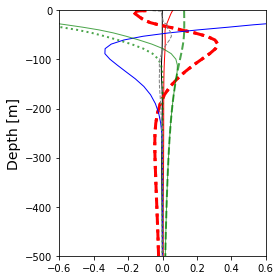

In [109]:
fig, ax = plt.subplots(figsize=(4,4))
fig.set_tight_layout(True)

ax.plot(dFe_ann[0]*1e3*(360*86400), dFe_ann.Z, 'k',
        lw=1, label=r'$\overline{\tt Fe}_t$')
ax.plot(advbb_ann*1e3*(360*86400), advbb_ann.Z, 'r',
        lw=1, label=r'$-\nabla\cdot (\overline{\mathbf{v}}$ $\overline{\tt Fe})$')
ax.plot(advpp_ann*1e3*(360*86400), advpp_ann.Z, 'r--',
        lw=3, label=r"$-\partial_z (\overline{w' {\tt Fe}'})$")
ax.plot(advpp_ann*1e3*(360*86400), advpp_ann.Z, 'r:',
        lw=3, label=r"$-\partial_y (\overline{v' {\tt Fe}'})$")
ax.plot(dif_ann*1e3*(360*86400), dif_ann.Z, 'b',
        lw=1, label=r"$\partial_z\overline{F}_{diff}$")
    #             axes[1,i].plot(kpp_mean[nn]*1e3, kpp_mean.Z, 'c',
    #                            lw=1, label=r"$\overline{F}_{KPP}$")
ax.plot(consump_ann*1e3*(360*86400), consump_ann.Z, 'g:',
        lw=2, alpha=.7, label=r"$\overline{\dot{\tt Fe}_p}$")
ax.plot(remin_ann*1e3*(360*86400), remin_ann.Z, 'g--',
        lw=2, alpha=.7, label=r"$\overline{\dot{\tt Fe}_r}$")
ax.plot(dot_ann*1e3*(360*86400), remin_ann.Z, 'g',
        lw=1, alpha=.7, label=r"$\overline{\dot{\tt Fe}}$")
ax.plot(dadv_ann*1e3*(360*86400), dadv_ann.Z, '--', color='grey',
        lw=1, label=r"$\nabla\cdot(\overline{F}_{\mathbf{v}{\tt Fe}} - \overline{\mathbf{v}{\tt Fe}})$")
    #         axes[i].plot(res_mean[nn]*1e3, res_mean.Z, '--', color='grey',
    #                       lw=1, label=r"Residual")
ax.tick_params(axis='both')
# ax.set_title(seas[js[i]],fontsize=14,y=1.02)
ax.set_xlim([-6e-1, 6e-1])
ax.set_ylim([-5e2, 0])

#         axes[j,i].grid(True)
# axes[1,1].legend(bbox_to_anchor=(1.18, 1.5), fontsize=12)
# axes[1,0].legend(loc='lower left', fontsize=11)
fig.subplots_adjust(left=0.2)
# cbar_ax = fig.add_axes([0.84, 0.2, 0.03, 0.6])
# cbar = fig.colorbar(cax, cax=cbar_ax)
# cbar.set_label(r'[mM N/m$^3$]',fontsize=12)

ax.set_ylabel('Depth [m]', fontsize=14)
# ax.set_xlabel('Depth [m]', fontsize=14)
# fig.text(0.01, 0.5, 'Depth [m]', 
#          va='center', rotation='vertical', fontsize=14)
# fig.text(0.32, 0.02, 'Iron tendency [$\mu$mol Fe m$^{-3}$ yr$^{-1}$]', 
#          va='center', rotation='horizontal', fontsize=14)

# plt.tight_layout(pad=2.4)
# plt.grid(True)
plt.savefig(op.join(ddir,'Dalma_Dar02km/Figures/IronBudget_annualclim_02km_wPPterms_woutlegend.pdf'))

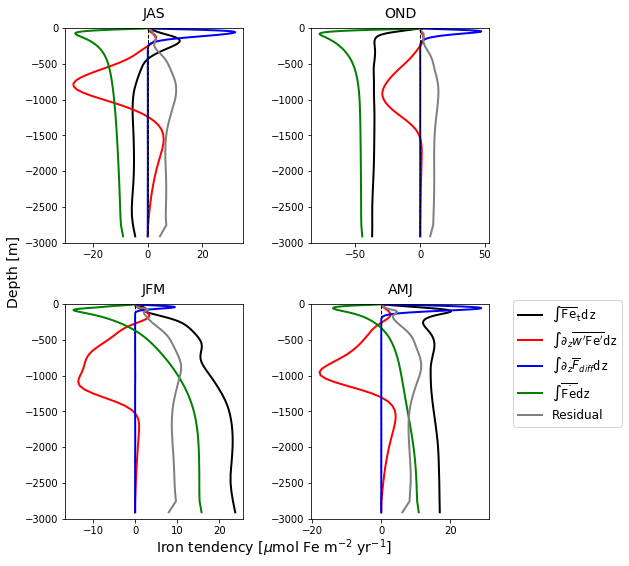

In [409]:
i = 0
js = np.array([2,3,0,1],dtype=int)
fig, axes = plt.subplots(ncols=2, nrows=2, figsize=(9,8))
for k in range(2):
    for l in range(2):
        axes[k,l].plot(np.cumsum((dFe_mean[js[i]]*1e3*(360*86400)*ds.drF.data)), dFe_mean.Z, 'k',
                    lw=2, label=r'$\int\overline{\tt Fe}_t{\tt dz}$')
    #     axes[i].plot(advbb_mean[j]*1e3*(360*86400), advbb_mean.Z, 'r',
    #                 lw=1, label=r'$\nabla\cdot (\overline{\mathbf{v}}$ $\overline{\tt Fe})$')
        axes[k,l].plot(np.cumsum((advpp_meanz[js[i]]*1e3*(360*86400)*ds.drF.data)[::-1])[::-1][::-1], advpp_mean.Z, 'r',
                    lw=2, label=r"$\int\partial_z\overline{w' {\tt Fe}'}{\tt dz}$")
    #     axes[i].plot(advpp_meany[j]*1e3*(360*86400), advpp_mean.Z, 'r:',
    #                 lw=3, label=r"$\partial_y (\overline{v' {\tt Fe}'})$")
        axes[k,l].plot(np.cumsum((dif_mean[js[i]]*1e3*(360*86400)*ds.drF.data)), dif_mean.Z, 'b',
                    lw=2, label=r"$\int\partial_z\overline{F}_{diff}{\tt dz}$")
    #             axes[1,i].plot(kpp_mean[nn]*1e3, kpp_mean.Z, 'c',
    #                            lw=1, label=r"$\overline{F}_{KPP}$")
        axes[k,l].plot(np.cumsum((dot_mean[js[i]]*1e3*(360*86400)*ds.drF.data)), dot_mean.Z, 'g',
                    lw=2, label=r"$\int\overline{\dot{\tt Fe}}{\tt dz}$")
    #     axes[i].plot(dadv_mean[j]*1e3*(360*86400), dadv_mean.Z, '--', color='grey',
    #                 lw=1, label=r"$\nabla\cdot(\overline{F}_{\mathbf{v}{\tt Fe}} - \overline{\mathbf{v}{\tt Fe}})$")
        axes[k,l].plot((np.cumsum((dFe_mean[js[i]]*1e3*(360*86400)*ds.drF.data)) - 
                     (np.cumsum((dot_mean[js[i]]*1e3*(360*86400)*ds.drF.data))
                     + np.cumsum((advpp_meanz[js[i]]*1e3*(360*86400)*ds.drF.data))
                     + np.cumsum((dif_mean[js[i]]*1e3*(360*86400)*ds.drF.data))
                     )), res_mean.Z, color='grey',
                    lw=2, label=r"Residual")
        axes[k,l].plot(np.zeros_like(ds.drF.data), ds.Z, 'k--', lw=1, label=r'')
        axes[k,l].tick_params(axis='both')
        axes[k,l].set_title(seas[js[i]],fontsize=14,y=1.02)
    #     axes[i].set_xlim([-4e1, 4e1])
        axes[k,l].set_ylim([-3e3, 0])
        i += 1
#         axes[j,i].grid(True)

axes[1,1].legend(bbox_to_anchor=(1.1, 1.05), fontsize=12)
# axes[1,0].legend(loc='lower left', fontsize=13)
fig.subplots_adjust(left=0.2)
# cbar_ax = fig.add_axes([0.84, 0.2, 0.03, 0.6])
# cbar = fig.colorbar(cax, cax=cbar_ax)
# cbar.set_label(r'[mM N/m$^3$]',fontsize=12)

fig.text(0.01, 0.5, 'Depth [m]', 
         va='center', rotation='vertical', fontsize=14)
fig.text(0.24, 0.02, 'Iron tendency [$\mu$mol Fe m$^{-2}$ yr$^{-1}$]', 
         va='center', rotation='horizontal', fontsize=14)

plt.tight_layout(pad=2.4)
# plt.grid(True)
plt.savefig(op.join(ddir,'Dalma_Dar02km/Figures/IronBudget_seasclim_02km_cumulative-wPPterms.pdf'))

7
8
9
10
11
0


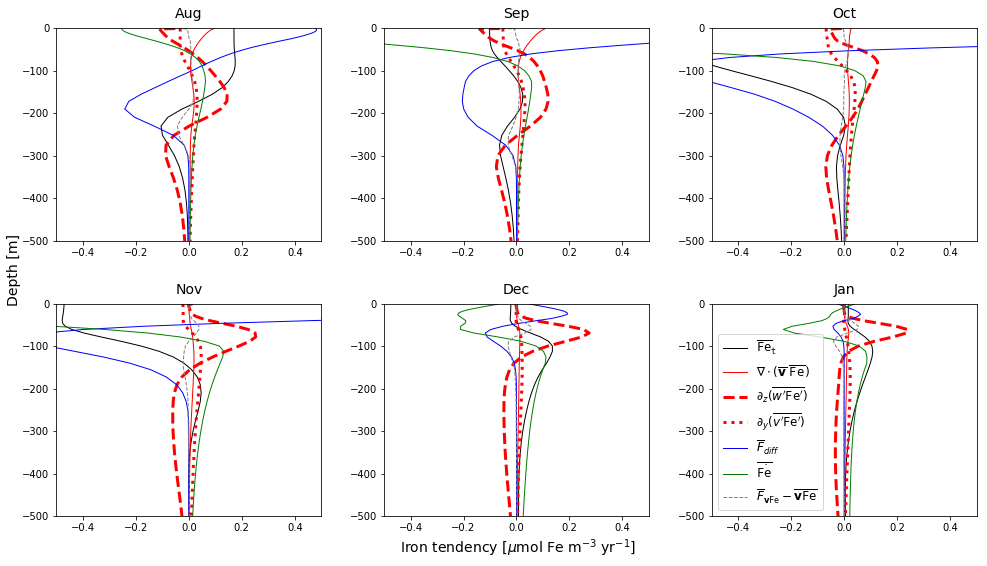

In [38]:
colors = ['pink','r','m','orange','brown','k','purple','indigo','b','c','g','y']
months = ['Jan','Feb','Mar','Apr','May','Jun','Jul','Aug','Sep','Oct','Nov','Dec']

tkw = dict(size=4, width=1.5)
fig, axes = plt.subplots(ncols=3, nrows=2, figsize=(14,8))
for j in range(2):
    for i in range(3):
        nn = j*3+i+7
        if nn > 11:
            nn -= 12
        print(nn)
        axes[j,i].plot(dFe_mean[nn]*1e3*(360*86400), dFe_mean.Z, 'k',
                      lw=1, label=r'$\overline{\tt Fe}_t$')
        axes[j,i].plot(advbb_mean[nn]*1e3*(360*86400), advbb_mean.Z, 'r',
                      lw=1, label=r'$\nabla\cdot (\overline{\mathbf{v}}$ $\overline{\tt Fe})$')
        axes[j,i].plot(advpp_meanz[nn]*1e3*(360*86400), advpp_mean.Z, 'r--',
                      lw=3, label=r"$\partial_z (\overline{w' {\tt Fe}'})$")
        axes[j,i].plot(advpp_meany[nn]*1e3*(360*86400), advpp_mean.Z, 'r:',
                      lw=3, label=r"$\partial_y (\overline{v' {\tt Fe}'})$")
        axes[j,i].plot(dif_mean[nn]*1e3*(360*86400), dif_mean.Z, 'b',
                      lw=1, label=r"$\overline{F}_{diff}$")
#             axes[1,i].plot(kpp_mean[nn]*1e3, kpp_mean.Z, 'c',
#                            lw=1, label=r"$\overline{F}_{KPP}$")
        axes[j,i].plot(dot_mean[nn]*1e3*(360*86400), dot_mean.Z, 'g',
                      lw=1, label=r"$\overline{\dot{\tt Fe}}$")
        axes[j,i].plot(dadv_mean[nn]*1e3*(360*86400), dadv_mean.Z, '--', color='grey',
                      lw=1, label=r"$\overline{F}_{\mathbf{v}{\tt Fe}} - \overline{\mathbf{v}{\tt Fe}}$")
#         axes[i].plot(res_mean[nn]*1e3, res_mean.Z, '--', color='grey',
#                       lw=1, label=r"Residual")
        axes[j,i].tick_params(axis='both')
        axes[j,i].set_title(months[nn],fontsize=14,y=1.02)
        axes[j,i].set_xlim([-5e-1, 5e-1])
        axes[j,i].set_ylim([-5e2, 0])
#         axes[j,i].grid(True)
        
axes[1,2].legend(loc='lower left', fontsize=12)
fig.subplots_adjust(left=0.12)
# cbar_ax = fig.add_axes([0.84, 0.2, 0.03, 0.6])
# cbar = fig.colorbar(cax, cax=cbar_ax)
# cbar.set_label(r'[mM N/m$^3$]',fontsize=12)

fig.text(0.01, 0.5, 'Depth [m]', 
         va='center', rotation='vertical', fontsize=14)
fig.text(0.4, 0.018, 'Iron tendency [$\mu$mol Fe m$^{-3}$ yr$^{-1}$]', 
         va='center', rotation='horizontal', fontsize=14)

plt.tight_layout(pad=2.5)
# plt.grid(True)
plt.savefig(op.join(pdir,'Figures/IronBudget_monthlyclim-Aug-Jan_05km_wPPterms.pdf'))

# Gammas

In [81]:
u1max = 1/.67  # [1/d]
u2max = 1/.92 # [1/d]
Kp1 = 0.0175
Kp2 = 0.011
Ki1 = .95e-3
Ki2 = 6.1e-3
Kn1 = 0.035
Kn2 = 0.015
r_FeP = 1e-3
r_SiP = 16
r_NP = 16
kSi1 = Kn1 * r_SiP
kN1 = Kn1 * r_NP
kN2 = Kn2 * r_NP
kFe1 = Kn1 * r_FeP
kFe2 = Kn2 * r_FeP

In [87]:
dtype = '>f8'
shape = (12,400,200)
# par_north = 3e1+2e1*np.cos(np.pi/6*np.arange(1,13))
# par_ideal = par_north[:,np.newaxis] + np.linspace(-10,0,num=100)[np.newaxis,:]
PAR = np.fromfile(op.join(bdir,'PAR_noncos_linear_005km.bin'), 
                 dtype=dtype)
PAR.shape = shape
PAR = xr.DataArray(PAR, dims=['month','YC','XC'],
                  coords={'month':range(1,13),'YC':ds.YC.data,'XC':ds.XC.data}
                  )
I = PAR*1e6/86400
Fo_s = Kp2/(Kp2+Ki2)*np.exp(Ki2/Kp2
                           * np.log(Ki2/(Kp2+Ki2))
                           )
gammaI2 = Fo_s**-1 * (1.-np.exp(-Kp2*I)) * np.exp(-Ki2*I)
Fo_b = Kp1/(Kp1+Ki1)*np.exp(Ki1/Kp1
                           * np.log(Ki1/(Kp1+Ki1))
                           )
gammaI1 = Fo_b**-1 * (1.-np.exp(-Kp1*I)) * np.exp(-Ki1*I)
gammaI1

<xarray.DataArray (month: 12, YC: 400, XC: 200)>
array([[[0.838159, 0.838159, ..., 0.838159, 0.838159],
        [0.837954, 0.837954, ..., 0.837954, 0.837954],
        ...,
        [0.759862, 0.759862, ..., 0.759862, 0.759862],
        [0.759674, 0.759674, ..., 0.759674, 0.759674]],

       [[0.916564, 0.916564, ..., 0.916564, 0.916564],
        [0.916355, 0.916355, ..., 0.916355, 0.916355],
        ...,
        [0.833363, 0.833363, ..., 0.833363, 0.833363],
        [0.833159, 0.833159, ..., 0.833159, 0.833159]],

       ...,

       [[0.861882, 0.861882, ..., 0.861882, 0.861882],
        [0.861673, 0.861673, ..., 0.861673, 0.861673],
        ...,
        [0.781713, 0.781713, ..., 0.781713, 0.781713],
        [0.78152 , 0.78152 , ..., 0.78152 , 0.78152 ]],

       [[0.815175, 0.815175, ..., 0.815175, 0.815175],
        [0.814974, 0.814974, ..., 0.814974, 0.814974],
        ...,
        [0.738834, 0.738834, ..., 0.738834, 0.738834],
        [0.738651, 0.738651, ..., 0.738651, 0.738651]]]

In [88]:
N2_Fe = ds.TRAC03/(ds.TRAC03+kFe2)
N1_Fe = ds.TRAC03/(ds.TRAC03+kFe1)
N2_Fe.coords['days'] = ('time',np.tile(range(360),dy))
N1_Fe.coords['days'] = ('time',np.tile(range(360),dy))
N1_Fe

<xarray.DataArray 'TRAC03' (time: 1440, Z: 76, YC: 400, XC: 200)>
dask.array<shape=(1440, 76, 400, 200), dtype=float32, chunksize=(1, 76, 400, 200)>
Coordinates:
  * XC       (XC) >f4 2500.0 7500.0 12500.0 17500.0 22500.0 27500.0 32500.0 ...
  * YC       (YC) >f4 2500.0 7500.0 12500.0 17500.0 22500.0 27500.0 32500.0 ...
  * Z        (Z) >f4 -0.5 -1.57 -2.79 -4.185 -5.78 -7.595 -9.66 -12.01 ...
    rA       (YC, XC) >f4 dask.array<shape=(400, 200), chunksize=(400, 200)>
    Depth    (YC, XC) >f4 dask.array<shape=(400, 200), chunksize=(400, 200)>
    drF      (Z) >f4 dask.array<shape=(76,), chunksize=(76,)>
    PHrefC   (Z) >f4 dask.array<shape=(76,), chunksize=(76,)>
    hFacC    (Z, YC, XC) >f4 dask.array<shape=(76, 400, 200), chunksize=(76, 400, 200)>
    iter     (time) int64 dask.array<shape=(1440,), chunksize=(1,)>
  * time     (time) float64 3.297e+09 3.297e+09 3.297e+09 3.297e+09 ...
    days     (time) int64 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 ...

In [89]:
with ProgressBar():
    gamFe2_day = N2_Fe.sel(Z=slice(0.,-100.),YC=slice(6e5,14e5)
                          ).groupby('days').mean(['time','Z','YC','XC']).compute()
    gamFe1_day = N1_Fe.sel(Z=slice(0.,-100.),YC=slice(6e5,14e5)
                          ).groupby('days').mean(['time','Z','YC','XC']).compute()
gamFe1_day

[########################################] | 100% Completed |  2min 51.3s
[########################################] | 100% Completed | 12.8s


<xarray.DataArray 'TRAC03' (days: 360)>
array([0.192512, 0.193777, 0.194998, ..., 0.188987, 0.190217, 0.191428],
      dtype=float32)
Coordinates:
  * days     (days) int64 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 ...

/home/takaya/miniconda3/envs/uptodate/lib/python3.6/site-packages/matplotlib/figure.py:2299: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  warnings.warn("This figure includes Axes that are not compatible "


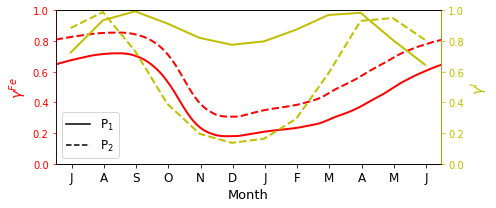

In [90]:
month = ['J','F','M','A','M','J','J','A','S','O','N','D']
colors = ['r','orange','g','b']

fig, ax = plt.subplots(figsize=(7,3))
fig.set_tight_layout(True)
ax2 = ax.twinx()

im, = ax.plot(range(0,360), gamFe1_day.roll(days=-180), 'r', lw=2)
ax.plot(range(0,360), gamFe2_day.roll(days=-180), 'r--', lw=2)
im2, = ax2.plot(np.linspace(14,344,12), gammaI1.sel(YC=slice(6e5,14e5)).mean(['YC','XC']).roll(month=-6), 'y', lw=2)
ax2.plot(np.linspace(14,344,12), gammaI2.sel(YC=slice(6e5,14e5)).mean(['YC','XC']).roll(month=-6), 'y--', lw=2)

ax.set_xticks(np.linspace(15,345,12))
ax.set_xticklabels(np.roll(np.asarray(month),-6), fontsize=12)
ax.set_xlim([0,359])
ax.set_ylim([.0,1.0])
ax2.set_ylim([.0,1.0])
ax.spines["left"].set_edgecolor(im.get_color())
ax2.spines["right"].set_edgecolor(im2.get_color())
ax.tick_params(axis='y', colors=im.get_color())
ax2.tick_params(axis='y', colors=im2.get_color())

ax.set_xlabel(r"Month", fontsize=13)
ax.set_ylabel(r'$\gamma^{Fe}$', color='r', fontsize=14)
ax2.set_ylabel(r'$\gamma^{I}$', color='y', fontsize=14)
linestyles = ['-', "--"]
dummy_lines = [ax.plot([],[], c="black", ls = linestyles[0])[0]]
dummy_lines.append(ax.plot([],[], c="black", ls = linestyles[1])[0])
legend = ax.legend([dummy_lines[i] for i in [0,1]], ["P$_1$", "P$_2$"], loc=3, fontsize=12)
plt.savefig(op.join(pdir,'Figures/Gamma_Fe-and-PAR_05km.pdf'))

# Cross spectra

In [10]:
Ttave = dsphy.Ttave
Ttave_seas = Ttave[-12:].groupby('seas').mean(['time','XC'])
Ttave_seas

<xarray.DataArray 'Ttave' (seas: 4, Z: 76, YC: 400)>
dask.array<shape=(4, 76, 400), dtype=float32, chunksize=(1, 76, 400)>
Coordinates:
  * YC       (YC) >f4 601000.0 603000.0 605000.0 607000.0 609000.0 611000.0 ...
  * Z        (Z) >f4 -0.5 -1.57 -2.79 -4.185 -5.78 -7.595 -9.66 -12.01 ...
    drF      (Z) >f4 dask.array<shape=(76,), chunksize=(76,)>
    PHrefC   (Z) >f4 dask.array<shape=(76,), chunksize=(76,)>
  * seas     (seas) int64 0 1 2 3

In [11]:
with ProgressBar():
    N2_seas = alpha*g * (Ttave_seas.diff('Z')
                        / Ttave_seas.Z.diff('Z')
                        ).compute()
N2_seas

[########################################] | 100% Completed |  0.1s
[########################################] | 100% Completed |  0.1s
[########################################] | 100% Completed |  1.3s


<xarray.DataArray (seas: 4, Z: 75, YC: 400)>
array([[[-2.004447e-06, -2.004010e-06, ..., -2.032864e-06, -2.033738e-06],
        [-7.484437e-07, -7.476768e-07, ..., -7.223709e-07, -7.208372e-07],
        ...,
        [ 7.273664e-08,  7.288931e-08, ...,  2.085723e-06,  2.091202e-06],
        [ 3.661754e-08,  3.643912e-08, ...,  6.031592e-07,  6.044408e-07]],

       [[ 1.910018e-06,  1.906957e-06, ...,  1.776679e-06,  1.777554e-06],
        [ 9.976693e-07,  9.942185e-07, ...,  9.478242e-07,  9.485910e-07],
        ...,
        [ 7.346793e-08,  7.379285e-08, ...,  2.053473e-06,  2.059224e-06],
        [ 3.648579e-08,  3.634163e-08, ...,  5.461957e-07,  5.492035e-07]],

       [[ 2.082264e-06,  2.080953e-06, ...,  2.065215e-06,  2.067838e-06],
        [ 1.090458e-06,  1.091992e-06, ...,  1.070520e-06,  1.073587e-06],
        ...,
        [ 8.734868e-08,  8.784185e-08, ...,  1.972984e-06,  1.982443e-06],
        [ 3.719006e-08,  3.815896e-08, ...,  5.043238e-07,  5.077608e-07]],

       [[-

In [54]:
print(N2_seas.mean('YC')[0,33],N2_seas.mean('YC')[2,33])

<xarray.DataArray ()>
array(7.108889e-06, dtype=float32)
Coordinates:
    Z        >f4 -352.42
    drF      float32 27.74
    PHrefC   float32 3457.2402
    seas     int64 0 <xarray.DataArray ()>
array(7.987018e-06, dtype=float32)
Coordinates:
    Z        >f4 -352.42
    drF      float32 27.74
    PHrefC   float32 3457.2402
    seas     int64 2


In [5]:
# itersnap = np.append(np.arange(ts,int(ts+90*86400/dt),90),
#                      np.arange(int(ts+180*86400/dt),int(ts+270*86400/dt),90))
ds1H = open_mdsdataset(op.join(ddir,'Dalma_Dar02km/runs'), 
#                       grid_dir=op.join(ddir,'takaya/01km_grid'),
#                       iters=itersnap,
                      prefix=['Snap1H'], delta_t=dt
                      )
ds1H

<xarray.Dataset>
Dimensions:  (XC: 500, XG: 500, YC: 1000, YG: 1000, Z: 76, Zl: 76, Zp1: 77, Zu: 76, time: 4320)
Coordinates:
  * XC       (XC) >f4 1000.0 3000.0 5000.0 7000.0 ... 995000.0 997000.0 999000.0
  * YC       (YC) >f4 1000.0 3000.0 5000.0 ... 1995000.0 1997000.0 1999000.0
  * XG       (XG) >f4 0.0 2000.0 4000.0 6000.0 ... 994000.0 996000.0 998000.0
  * YG       (YG) >f4 0.0 2000.0 4000.0 6000.0 ... 1994000.0 1996000.0 1998000.0
  * Z        (Z) >f4 -0.5 -1.57 -2.79 -4.185 ... -2625.955 -2757.325 -2912.665
  * Zp1      (Zp1) >f4 0.0 -1.0 -2.14 -3.44 ... -2689.32 -2825.33 -3000.0
  * Zu       (Zu) >f4 -1.0 -2.14 -3.44 -4.93 ... -2689.32 -2825.33 -3000.0
  * Zl       (Zl) >f4 0.0 -1.0 -2.14 -3.44 ... -2562.59 -2689.32 -2825.33
    rA       (YC, XC) >f4 dask.array<shape=(1000, 500), chunksize=(1000, 500)>
    dxG      (YG, XC) >f4 dask.array<shape=(1000, 500), chunksize=(1000, 500)>
    dyG      (YC, XG) >f4 dask.array<shape=(1000, 500), chunksize=(1000, 500)>
    Depth    (YC, 

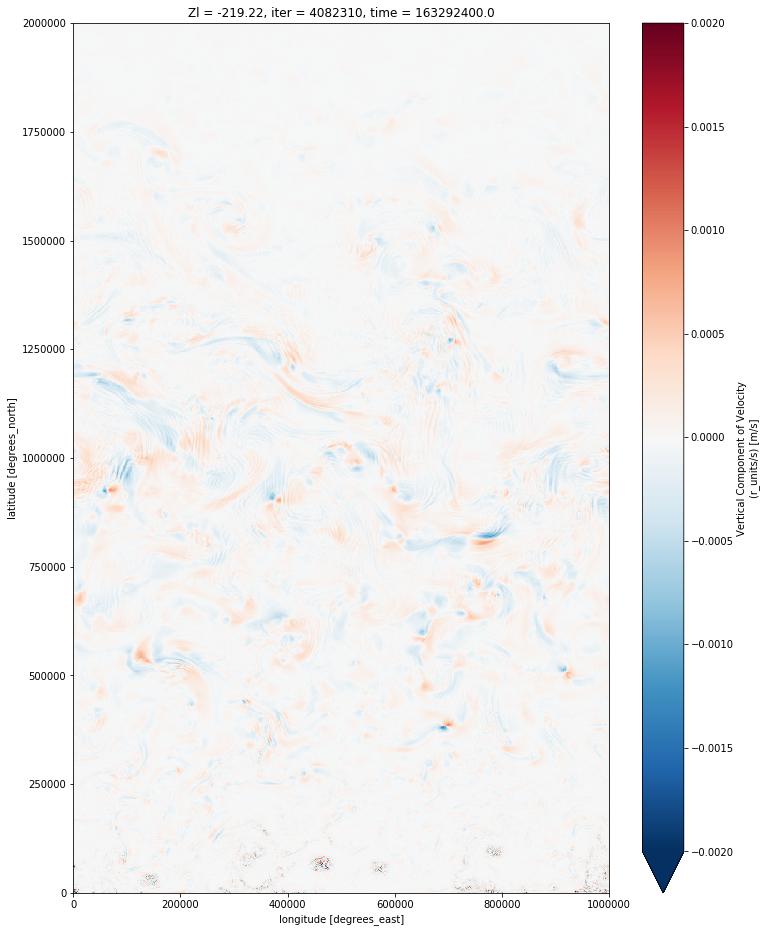

In [223]:
ds1H.WVEL[-1,29].plot(figsize=(12,16), vmax=0.002)

In [8]:
with ProgressBar():
    wc300JAS = ds1H.WVEL.sel(Zl=-300,method='nearest'
                            ).sel(XC=5e5,method='nearest'
                                 ).sel(YC=10e5,method='nearest').load()
wc300JAS

[########################################] | 100% Completed | 34min 32.3s


<xarray.DataArray 'WVEL' (time: 2160)>
array([ 0.00694 , -0.007038,  0.004511, ...,  0.000164, -0.000121,  0.000467],
      dtype=float32)
Coordinates:
    XC       float32 501000.0
    YC       >f4 1001000.0
    Zl       float32 -312.09
    rA       float32 4000000.0
    Depth    float32 2985.0
    iter     (time) int64 1555200 1555260 1555320 1555380 1555440 1555500 ...
  * time     (time) float64 9.331e+07 9.332e+07 9.332e+07 9.332e+07 ...
Attributes:
    standard_name:  WVEL
    long_name:      Vertical Component of Velocity (r_units/s)
    units:          m/s

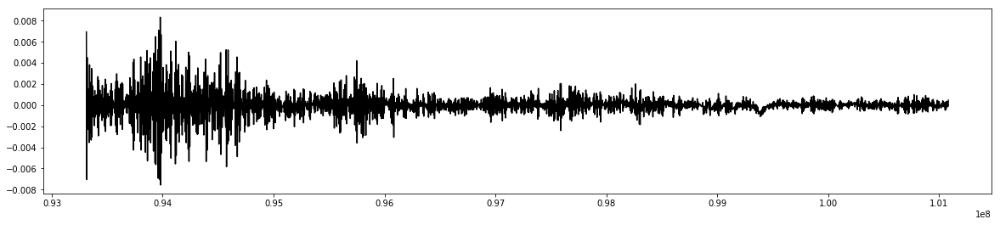

In [9]:
fig, ax = plt.subplots(figsize=(20,4))
ax.plot(wc300JAS.time, wc300JAS, 'k')

In [26]:
nz100 = 22
nz180 = 27
ds1H.WVEL.Zl[nz180]

<xarray.DataArray 'Zl' ()>
array(-180.55, dtype=float32)
Coordinates:
    Zl       >f4 -180.55
Attributes:
    standard_name:      depth_at_upper_w_location
    long_name:          vertical coordinate of upper cell interface
    units:              m
    positive:           down
    axis:               Z
    c_grid_axis_shift:  -0.5

In [9]:
grid1H = Grid(ds1H,periodic=['X'])
w100JAS = ds1H.WVEL.sel(YC=slice(6e5,14e5))[:int(90*24),nz100]
Fe100JAS = grid1H.interp(ds1H.TRAC03.sel(YC=slice(6e5,14e5)),'Z',boundary='fill')[:int(90*24),nz100]
w100JASkf = xrft.dft(w100JAS, dim=['XC'], detrend='constant')
Fe100JASkf = xrft.dft(Fe100JAS, dim=['XC'], detrend='constant')
w100JASkf = xrft.dft(w100JASkf.chunk({'time':int(90*24),'YC':100}), dim=['time'], detrend='linear', window=True)
Fe100JASkf = xrft.dft(Fe100JASkf.chunk({'time':int(90*24),'YC':100}), dim=['time'], detrend='linear', window=True)

with ProgressBar():
    wFe100JASkf = (w100JASkf * np.conj(Fe100JASkf)).real.mean('YC').compute()
    w1002JASkf = (w100JASkf * np.conj(w100JASkf)).real.mean('YC').compute()

[########################################] | 100% Completed |  1hr 37min  4.0s
[########################################] | 100% Completed | 22min 38.1s


In [10]:
wFe100JASkf

<xarray.DataArray (freq_time: 2160, freq_XC: 500)>
array([[-6.388295e-08, -3.374566e-09,  3.613535e-10, ..., -3.553009e-08,
         3.613535e-10, -3.374566e-09],
       [-3.319065e-08,  6.530734e-09,  4.738643e-09, ..., -4.941267e-08,
        -8.560468e-09, -1.402563e-10],
       [-2.754002e-09, -4.568515e-09,  1.094731e-09, ..., -1.525909e-08,
        -6.245976e-09,  2.519459e-09],
       ...,
       [-2.264789e-08,  1.386498e-08,  3.369681e-09, ..., -3.232562e-09,
        -2.156353e-09,  2.175933e-09],
       [-2.754002e-09,  2.519459e-09, -6.245976e-09, ...,  6.225319e-09,
         1.094731e-09, -4.568515e-09],
       [-3.319065e-08, -1.402563e-10, -8.560468e-09, ..., -6.330501e-09,
         4.738643e-09,  6.530734e-09]])
Coordinates:
  * freq_time          (freq_time) float64 -0.0001389 -0.0001388 ... 0.0001388
  * freq_XC            (freq_XC) float64 -0.00025 -0.000249 ... 0.000249
    freq_time_spacing  float64 1.286e-07

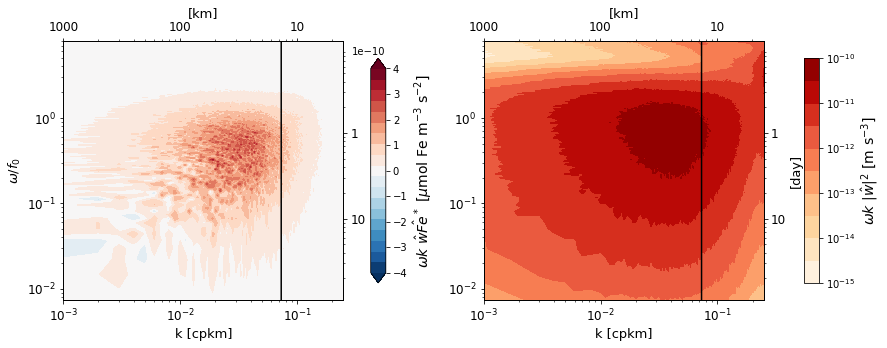

In [23]:
import matplotlib.colors as clr
fig, (ax1,ax2) = plt.subplots(nrows=1, ncols=2, figsize=(14,6))
ax3 = ax1.twiny()
ax5 = ax1.twinx()
ax4 = ax2.twiny()
ax6 = ax2.twinx()
# fig.set_tight_layout(True)
im1 = ax1.contourf(wFe100JASkf.freq_XC[251:]*1e3, wFe100JASkf.freq_time[1081:]*np.abs(f0/(2*np.pi))**-1, 
                 wFe100JASkf[1081:,251:]*wFe100JASkf.freq_time[1081:]*wFe100JASkf.freq_XC[251:]*1e3, 
                 cmap='RdBu_r', levels=np.linspace(-.4e-9,.4e-9,20), extend='both')
ax1.plot(np.ones_like(wFe100JASkf.freq_time[1081:])*Rd**-1, 
         wFe100JASkf.freq_time[1081:]*np.abs(f0/(2*np.pi))**-1, 'k')
ax3.set_xscale('log')
ax5.set_yscale('log')
ax3.set_xlim([1e-3,2.5e-1])
ax3.set_xticks([1e-3,1e-2,1e-1])
ax3.set_xticklabels(np.asarray([1e3,1e2,1e1],dtype=int))
ax5.set_ylim([wFe100JASkf.freq_time[1081:].min()*86400,wFe100JASkf.freq_time[1081:].max()*86400])
ax5.set_yticks([.1,1])
ax5.set_yticklabels(np.asarray([1e1,1],dtype=int))
ax1.set_xscale('log')
ax1.set_yscale('log')
ax1.set_ylabel(r"$\omega/f_0$", fontsize=13)
ax3.set_xlabel(r"[km]", fontsize=13)
ax1.set_xlabel(r"k [cpkm]", fontsize=13)
cbar_ax1 = fig.add_axes([0.43, 0.24, 0.015, 0.52])
cbar1 = fig.colorbar(im1, cax=cbar_ax1, ticks=[-.4e-9,-.3e-9,-.2e-9,-.1e-9,0.,.1e-9,.2e-9,.3e-9,0.4e-9])
cbar1.set_label(r"$\omega k\ \hat{w}\hat{Fe}^*$ [$\mu$mol Fe m$^{-3}$ s$^{-2}$]", fontsize=14)

im2 = ax2.contourf(w1002JASkf.freq_XC[251:]*1e3, w1002JASkf.freq_time[1081:]*np.abs(f0/(2*np.pi))**-1, 
                w1002JASkf[1081:,251:]*w1002JASkf.freq_time[1081:]*w1002JASkf.freq_XC[251:], 
                cmap='OrRd', levels=np.logspace(-15,-10,11),norm=clr.LogNorm())
ax2.plot(np.ones_like(w1002JASkf.freq_time[1081:])*Rd**-1, w1002JASkf.freq_time[1081:]*np.abs(f0/(2*np.pi))**-1, 'k')
ax4.set_xscale('log')
ax6.set_yscale('log')
ax4.set_xlim([1e-3,2.5e-1])
ax4.set_xticks([1e-3,1e-2,1e-1])
ax4.set_xticklabels(np.asarray([1e3,1e2,1e1],dtype=int))
ax6.set_ylim([wFe100JASkf.freq_time[1081:].min()*86400,wFe100JASkf.freq_time[1081:].max()*86400])
ax6.set_yticks([.1,1])
ax6.set_yticklabels(np.asarray([1e1,1],dtype=int))
ax2.set_xscale('log')
ax2.set_yscale('log')
ax2.set_xlabel(r"k [cpkm]", fontsize=13)
ax4.set_xlabel(r"[km]", fontsize=13)
ax6.set_ylabel(r"[day]", fontsize=13)
# ax2.set_title(r"JFM", fontsize=15, y=1.09)
fig.subplots_adjust(right=0.82, wspace=.5, top=.8, bottom=.2)
cbar_ax2 = fig.add_axes([0.87, 0.24, 0.015, 0.52])
cbar2 = fig.colorbar(im2, cax=cbar_ax2, ticks=[1e-15,1e-14,1e-13,1e-12,1e-11,1e-10])
cbar2.set_label(r"$\omega k\ |\hat{w}|^2$ [m s$^{-3}$]", fontsize=14)

ax1.tick_params(axis='both', which='major', labelsize=12)
ax2.tick_params(axis='both', which='major', labelsize=12)
ax3.tick_params(axis='both', which='major', labelsize=12)
ax4.tick_params(axis='both', which='major', labelsize=12)
ax5.tick_params(axis='both', which='major', labelsize=12)
ax6.tick_params(axis='both', which='major', labelsize=12)

In [27]:
grid1H = Grid(ds1H,periodic=['X'])
w180JAS = ds1H.WVEL.sel(YC=slice(6e5,14e5))[:int(90*24),nz180]
Fe180JAS = grid1H.interp(ds1H.TRAC03.sel(YC=slice(6e5,14e5)),'Z',boundary='fill')[:int(90*24),nz180]
w180JASkf = xrft.dft(w180JAS, dim=['XC'], detrend='constant')
Fe180JASkf = xrft.dft(Fe180JAS, dim=['XC'], detrend='constant')
w180JASkf = xrft.dft(w180JASkf.chunk({'time':int(90*24),'YC':100}), 
                     dim=['time'], detrend='linear', window=True)
Fe180JASkf = xrft.dft(Fe180JASkf.chunk({'time':int(90*24),'YC':100}), 
                      dim=['time'], detrend='linear', window=True)

with ProgressBar():
    wFe180JASkf = (w180JASkf * np.conj(Fe180JASkf)).real.mean('YC').compute()
    w1802JASkf = (w180JASkf * np.conj(w180JASkf)).real.mean('YC').compute()

[########################################] | 100% Completed | 43min 49.9s
[########################################] | 100% Completed | 22min 37.2s


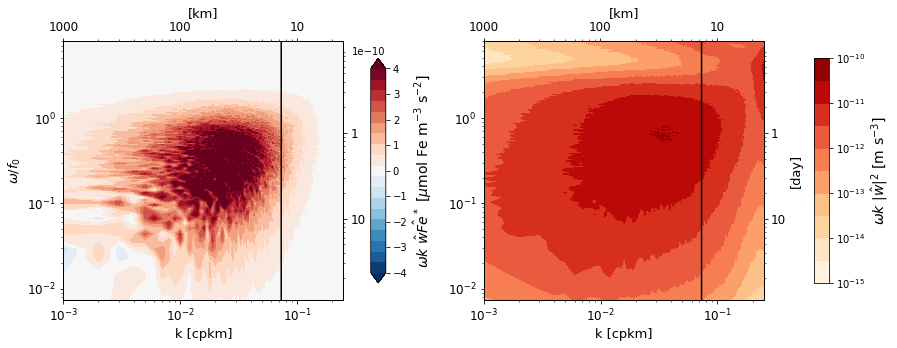

In [28]:
import matplotlib.colors as clr
fig, (ax1,ax2) = plt.subplots(nrows=1, ncols=2, figsize=(14,6))
ax3 = ax1.twiny()
ax5 = ax1.twinx()
ax4 = ax2.twiny()
ax6 = ax2.twinx()
# fig.set_tight_layout(True)
im1 = ax1.contourf(wFe180JASkf.freq_XC[251:]*1e3, wFe180JASkf.freq_time[1081:]*np.abs(f0/(2*np.pi))**-1, 
                 wFe180JASkf[1081:,251:]*wFe180JASkf.freq_time[1081:]*wFe180JASkf.freq_XC[251:]*1e3, 
                 cmap='RdBu_r', levels=np.linspace(-.4e-9,.4e-9,20), extend='both')
ax1.plot(np.ones_like(wFe180JASkf.freq_time[1081:])*Rd**-1, 
         wFe180JASkf.freq_time[1081:]*np.abs(f0/(2*np.pi))**-1, 'k')
ax3.set_xscale('log')
ax5.set_yscale('log')
ax3.set_xlim([1e-3,2.5e-1])
ax3.set_xticks([1e-3,1e-2,1e-1])
ax3.set_xticklabels(np.asarray([1e3,1e2,1e1],dtype=int))
ax5.set_ylim([wFe100JASkf.freq_time[1081:].min()*86400,wFe100JASkf.freq_time[1081:].max()*86400])
ax5.set_yticks([.1,1])
ax5.set_yticklabels(np.asarray([1e1,1],dtype=int))
ax1.set_xscale('log')
ax1.set_yscale('log')
ax1.set_ylabel(r"$\omega/f_0$", fontsize=13)
ax3.set_xlabel(r"[km]", fontsize=13)
ax1.set_xlabel(r"k [cpkm]", fontsize=13)
cbar_ax1 = fig.add_axes([0.43, 0.24, 0.015, 0.52])
cbar1 = fig.colorbar(im1, cax=cbar_ax1, ticks=[-.4e-9,-.3e-9,-.2e-9,-.1e-9,0.,.1e-9,.2e-9,.3e-9,0.4e-9])
cbar1.set_label(r"$\omega k\ \hat{w}\hat{Fe}^*$ [$\mu$mol Fe m$^{-3}$ s$^{-2}$]", fontsize=14)

im2 = ax2.contourf(w1802JASkf.freq_XC[251:]*1e3, w1802JASkf.freq_time[1081:]*np.abs(f0/(2*np.pi))**-1, 
                w1802JASkf[1081:,251:]*w1802JASkf.freq_time[1081:]*w1802JASkf.freq_XC[251:], 
                cmap='OrRd', levels=np.logspace(-15,-10,11),norm=clr.LogNorm())
for c in im1.collections:
    c.set_rasterized(True)
for c in im2.collections:
    c.set_rasterized(True)
ax2.plot(np.ones_like(w1802JASkf.freq_time[1081:])*Rd**-1, w1802JASkf.freq_time[1081:]*np.abs(f0/(2*np.pi))**-1, 'k')
ax4.set_xscale('log')
ax6.set_yscale('log')
ax4.set_xlim([1e-3,2.5e-1])
ax4.set_xticks([1e-3,1e-2,1e-1])
ax4.set_xticklabels(np.asarray([1e3,1e2,1e1],dtype=int))
ax6.set_ylim([wFe180JASkf.freq_time[1081:].min()*86400,wFe180JASkf.freq_time[1081:].max()*86400])
ax6.set_yticks([.1,1])
ax6.set_yticklabels(np.asarray([1e1,1],dtype=int))
ax2.set_xscale('log')
ax2.set_yscale('log')
ax2.set_xlabel(r"k [cpkm]", fontsize=13)
ax4.set_xlabel(r"[km]", fontsize=13)
ax6.set_ylabel(r"[day]", fontsize=13)
# ax2.set_title(r"JFM", fontsize=15, y=1.09)
fig.subplots_adjust(right=0.82, wspace=.5, top=.8, bottom=.2)
cbar_ax2 = fig.add_axes([0.87, 0.24, 0.015, 0.52])
cbar2 = fig.colorbar(im2, cax=cbar_ax2, ticks=[1e-15,1e-14,1e-13,1e-12,1e-11,1e-10])
cbar2.set_label(r"$\omega k\ |\hat{w}|^2$ [m s$^{-3}$]", fontsize=14)

ax1.tick_params(axis='both', which='major', labelsize=12)
ax2.tick_params(axis='both', which='major', labelsize=12)
ax3.tick_params(axis='both', which='major', labelsize=12)
ax4.tick_params(axis='both', which='major', labelsize=12)
ax5.tick_params(axis='both', which='major', labelsize=12)
ax6.tick_params(axis='both', which='major', labelsize=12)

In [6]:
nz200 = 29
nz300 = 33
grid1H = Grid(ds1H,periodic=['X'])
wJAS = ds1H.WVEL.sel(YC=slice(6e5,14e5))[:int(90*24),nz200]
FeJAS = grid1H.interp(ds1H.TRAC03.sel(YC=slice(6e5,14e5)),'Z',boundary='fill')[:int(90*24),nz200]
wJASkf = xrft.dft(wJAS, dim=['XC'], detrend='constant')
FeJASkf = xrft.dft(FeJAS, dim=['XC'], detrend='constant')
wJASkf = xrft.dft(wJASkf.chunk({'time':int(90*24),'YC':100}), dim=['time'], detrend='linear', window=True)
FeJASkf = xrft.dft(FeJASkf.chunk({'time':int(90*24),'YC':100}), dim=['time'], detrend='linear', window=True)

with ProgressBar():
    wFeJASkf = (wJASkf * np.conj(FeJASkf)).real.mean('YC').compute()
    w2JASkf = (wJASkf * np.conj(wJASkf)).real.mean('YC').compute()
wFeJASkf

[########################################] | 100% Completed |  2hr  7min 51.8s
[########################################] | 100% Completed | 26min 30.2s


<xarray.DataArray (freq_time: 2160, freq_XC: 500)>
array([[-1.158497e-08,  4.862950e-08,  2.652095e-08, ..., -5.091179e-08,
         2.652095e-08,  4.862950e-08],
       [-6.788494e-09,  4.197219e-08, -4.860594e-08, ...,  3.623413e-08,
         4.755855e-08,  5.948896e-08],
       [-1.326149e-08,  5.396568e-08, -8.306731e-08, ..., -5.079994e-09,
         4.003961e-08,  5.844023e-08],
       ...,
       [-1.946980e-08,  4.572183e-08,  1.877534e-08, ..., -5.267590e-08,
        -2.892113e-08,  4.702855e-08],
       [-1.326149e-08,  5.844023e-08,  4.003961e-08, ..., -1.496331e-08,
        -8.306731e-08,  5.396568e-08],
       [-6.788494e-09,  5.948896e-08,  4.755855e-08, ..., -3.222253e-08,
        -4.860594e-08,  4.197219e-08]])
Coordinates:
  * freq_time          (freq_time) float64 -0.0001389 -0.0001388 ... 0.0001388
  * freq_XC            (freq_XC) float64 -0.00025 -0.000249 ... 0.000249
    freq_time_spacing  float64 1.286e-07

In [7]:
grid1H = Grid(ds1H,periodic=['X'])
wJFM = ds1H.WVEL.sel(YC=slice(6e5,14e5))[int(90*24):,nz200]
FeJFM = grid1H.interp(ds1H.TRAC03.sel(YC=slice(6e5,14e5)),'Z',boundary='fill')[int(90*24):,nz200]
wJFMkf = xrft.dft(wJFM, dim=['XC'], detrend='constant')
FeJFMkf = xrft.dft(FeJFM, dim=['XC'], detrend='constant')
wJFMkf = xrft.dft(wJFMkf.chunk({'time':int(90*24),'YC':100}), dim=['time'], detrend='linear', window=True)
FeJFMkf = xrft.dft(FeJFMkf.chunk({'time':int(90*24),'YC':100}), dim=['time'], detrend='linear', window=True)

with ProgressBar():
    wFeJFMkf = (wJFMkf * np.conj(FeJFMkf)).real.mean('YC').compute()
    w2JFMkf = (wJFMkf * np.conj(wJFMkf)).real.mean('YC').compute()
wFeJFMkf

[                                        ] | 0% Completed | 11min 13.4s

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[                                        ] | 0% Completed | 33min 29.4s

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[########################################] | 100% Completed |  2hr 49min 27.0s
[########################################] | 100% Completed | 37min 32.0s


<xarray.DataArray (freq_time: 2160, freq_XC: 500)>
array([[ 2.281203e-09, -3.616246e-09, -4.371409e-09, ..., -2.875646e-09,
        -4.371409e-09, -3.616246e-09],
       [ 1.701593e-09, -1.068920e-09, -8.007802e-10, ..., -2.479347e-09,
        -7.185072e-09,  1.576940e-09],
       [-3.274336e-10, -4.175832e-09,  2.631702e-09, ...,  3.058361e-09,
        -4.090232e-09,  7.772838e-10],
       ...,
       [-1.253027e-09,  1.571662e-09, -4.387824e-09, ...,  5.204501e-09,
         3.279956e-09, -3.346766e-09],
       [-3.274336e-10,  7.772838e-10, -4.090232e-09, ..., -7.188967e-10,
         2.631702e-09, -4.175832e-09],
       [ 1.701593e-09,  1.576940e-09, -7.185072e-09, ..., -1.470250e-09,
        -8.007802e-10, -1.068920e-09]])
Coordinates:
  * freq_time          (freq_time) float64 -0.0001389 -0.0001388 ... 0.0001388
  * freq_XC            (freq_XC) float64 -0.00025 -0.000249 ... 0.000249
    freq_time_spacing  float64 1.286e-07

In [8]:
Rd = 13.68163052

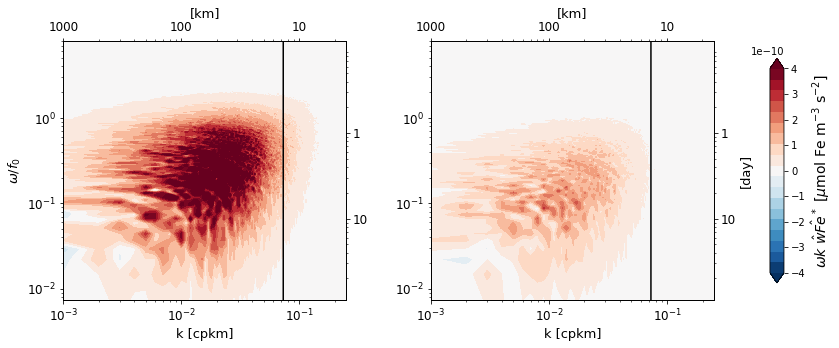

In [9]:
import matplotlib.colors as clr

fig, (ax1,ax2) = plt.subplots(nrows=1, ncols=2, figsize=(13,6))
ax3 = ax1.twiny()
ax5 = ax1.twinx()
ax4 = ax2.twiny()
ax6 = ax2.twinx()
# fig.set_tight_layout(True)
im1 = ax1.contourf(wFeJASkf.freq_XC[251:]*1e3, wFeJASkf.freq_time[1081:]*np.abs(f0/(2*np.pi))**-1, 
                 wFeJASkf[1081:,251:]*wFeJASkf.freq_time[1081:]*wFeJASkf.freq_XC[251:]*1e3, 
                 cmap='RdBu_r', levels=np.linspace(-.4e-9,.4e-9,20), extend='both')
ax1.plot(np.ones_like(wFeJASkf.freq_time[1081:])*Rd**-1, wFeJASkf.freq_time[1081:]*np.abs(f0/(2*np.pi))**-1, 'k')
ax3.set_xscale('log')
ax5.set_yscale('log')
ax3.set_xlim([1e-3,2.5e-1])
ax3.set_xticks([1e-3,1e-2,1e-1])
ax3.set_xticklabels(np.asarray([1e3,1e2,1e1],dtype=int))
ax5.set_ylim([wFeJASkf.freq_time[1081:].min()*86400,wFeJASkf.freq_time[1081:].max()*86400])
ax5.set_yticks([.1,1])
ax5.set_yticklabels(np.asarray([1e1,1],dtype=int))
ax1.set_xscale('log')
ax1.set_yscale('log')
ax1.set_ylabel(r"$\omega/f_0$", fontsize=13)
ax3.set_xlabel(r"[km]", fontsize=13)
ax1.set_xlabel(r"k [cpkm]", fontsize=13)
# ax3.set_ylabel(r"[days]", fontsize=12)
# ax1.set_title(r"JAS", fontsize=15, y=1.09)

im2 = ax2.contourf(wFeJFMkf.freq_XC[251:]*1e3, wFeJFMkf.freq_time[1081:]*np.abs(f0/(2*np.pi))**-1, 
                wFeJFMkf[1081:,251:]*wFeJFMkf.freq_time[1081:]*wFeJFMkf.freq_XC[251:]*1e3, 
                cmap='RdBu_r', levels=np.linspace(-.4e-9,.4e-9,20), extend='both')
for c in im1.collections:
    c.set_rasterized(True)
for c in im2.collections:
    c.set_rasterized(True)
ax2.plot(np.ones_like(wFeJFMkf.freq_time[1081:])*Rd**-1, wFeJFMkf.freq_time[1081:]*np.abs(f0/(2*np.pi))**-1, 'k')
ax4.set_xscale('log')
ax6.set_yscale('log')
ax4.set_xlim([1e-3,2.5e-1])
ax4.set_xticks([1e-3,1e-2,1e-1])
ax4.set_xticklabels(np.asarray([1e3,1e2,1e1],dtype=int))
ax6.set_ylim([wFeJFMkf.freq_time[1081:].min()*86400,wFeJFMkf.freq_time[1081:].max()*86400])
ax6.set_yticks([.1,1])
ax6.set_yticklabels(np.asarray([1e1,1],dtype=int))
ax2.set_xscale('log')
ax2.set_yscale('log')
ax2.set_xlabel(r"k [cpkm]", fontsize=13)
ax4.set_xlabel(r"[km]", fontsize=13)
ax6.set_ylabel(r"[day]", fontsize=13)
# ax2.set_title(r"JFM", fontsize=15, y=1.09)
fig.subplots_adjust(right=0.82, wspace=.3, top=.8, bottom=.2)
cbar_ax = fig.add_axes([0.88, 0.24, 0.015, 0.52])
cbar = fig.colorbar(im1, cax=cbar_ax, ticks=[-.4e-9,-.3e-9,-.2e-9,-.1e-9,0.,.1e-9,.2e-9,.3e-9,0.4e-9])
cbar.set_label(r"$\omega k\ \hat{w}\hat{Fe}^*$ [$\mu$mol Fe m$^{-3}$ s$^{-2}$]", fontsize=14)
ax1.tick_params(axis='both', which='major', labelsize=12)
ax2.tick_params(axis='both', which='major', labelsize=12)
ax3.tick_params(axis='both', which='major', labelsize=12)
ax4.tick_params(axis='both', which='major', labelsize=12)
ax5.tick_params(axis='both', which='major', labelsize=12)
ax6.tick_params(axis='both', which='major', labelsize=12)
plt.savefig(op.join(ddir,'Dalma_Dar02km/Figures/wFe_k-omega_02km_200m.pdf'))

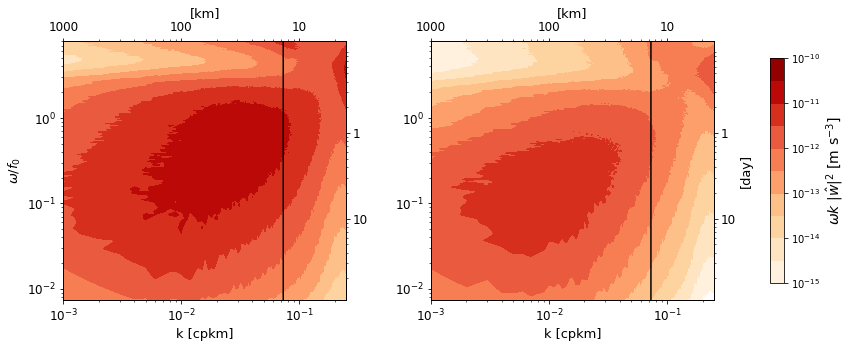

In [10]:
import matplotlib.colors as clr

fig, (ax1,ax2) = plt.subplots(nrows=1, ncols=2, figsize=(13,6))
ax3 = ax1.twiny()
ax5 = ax1.twinx()
ax4 = ax2.twiny()
ax6 = ax2.twinx()
# fig.set_tight_layout(True)
im1 = ax1.contourf(w2JASkf.freq_XC[251:]*1e3, w2JASkf.freq_time[1081:]*np.abs(f0/(2*np.pi))**-1, 
                 w2JASkf[1081:,251:]*w2JASkf.freq_time[1081:]*w2JASkf.freq_XC[251:], 
                 cmap='OrRd', levels=np.logspace(-15,-10,11),norm=clr.LogNorm())
ax1.plot(np.ones_like(w2JASkf.freq_time[1081:])*Rd**-1, w2JASkf.freq_time[1081:]*np.abs(f0/(2*np.pi))**-1, 'k')
ax3.set_xscale('log')
ax5.set_yscale('log')
ax3.set_xlim([1e-3,2.5e-1])
ax3.set_xticks([1e-3,1e-2,1e-1])
ax3.set_xticklabels(np.asarray([1e3,1e2,1e1],dtype=int))
ax5.set_ylim([wFeJASkf.freq_time[1081:].min()*86400,wFeJASkf.freq_time[1081:].max()*86400])
ax5.set_yticks([.1,1])
ax5.set_yticklabels(np.asarray([1e1,1],dtype=int))
ax1.set_xscale('log')
ax1.set_yscale('log')
ax1.set_xlabel(r"k [cpkm]", fontsize=13)
ax1.set_ylabel(r"$\omega/f_0$", fontsize=13)
ax3.set_xlabel(r"[km]", fontsize=13)
# ax5.set_ylabel(r"[day]", fontsize=13)
# ax2.set_title(r"JFM", fontsize=15, y=1.09)

im2 = ax2.contourf(w2JFMkf.freq_XC[251:]*1e3, w2JFMkf.freq_time[1081:]*np.abs(f0/(2*np.pi))**-1, 
                w2JFMkf[1081:,251:]*w2JFMkf.freq_time[1081:]*w2JFMkf.freq_XC[251:], 
                cmap='OrRd', levels=np.logspace(-15,-10,11),norm=clr.LogNorm())
for c in im1.collections:
    c.set_rasterized(True)
for c in im2.collections:
    c.set_rasterized(True)
ax2.plot(np.ones_like(w2JFMkf.freq_time[1081:])*Rd**-1, w2JFMkf.freq_time[1081:]*np.abs(f0/(2*np.pi))**-1, 'k')
ax4.set_xscale('log')
ax6.set_yscale('log')
ax4.set_xlim([1e-3,2.5e-1])
ax4.set_xticks([1e-3,1e-2,1e-1])
ax4.set_xticklabels(np.asarray([1e3,1e2,1e1],dtype=int))
ax6.set_ylim([wFeJFMkf.freq_time[1081:].min()*86400,wFeJFMkf.freq_time[1081:].max()*86400])
ax6.set_yticks([.1,1])
ax6.set_yticklabels(np.asarray([1e1,1],dtype=int))
ax2.set_xscale('log')
ax2.set_yscale('log')
ax2.set_xlabel(r"k [cpkm]", fontsize=13)
ax4.set_xlabel(r"[km]", fontsize=13)
ax6.set_ylabel(r"[day]", fontsize=13)
# ax2.set_title(r"JFM", fontsize=15, y=1.09)
fig.subplots_adjust(right=0.82, wspace=.3, top=.8, bottom=.2)
cbar_ax = fig.add_axes([0.88, 0.24, 0.015, 0.52])
cbar = fig.colorbar(im1, cax=cbar_ax, ticks=[1e-15,1e-14,1e-13,1e-12,1e-11,1e-10])
cbar.set_label(r"$\omega k\ |\hat{w}|^2$ [m s$^{-3}$]", fontsize=14)

ax1.tick_params(axis='both', which='major', labelsize=12)
ax2.tick_params(axis='both', which='major', labelsize=12)
ax3.tick_params(axis='both', which='major', labelsize=12)
ax4.tick_params(axis='both', which='major', labelsize=12)
ax5.tick_params(axis='both', which='major', labelsize=12)
ax6.tick_params(axis='both', which='major', labelsize=12)

plt.savefig(op.join(ddir,'Dalma_Dar02km/Figures/w2_k-omega_02km_200m.pdf'))

In [10]:
with ProgressBar():
    wkFekJAS = xrft.cross_spectrum(wsp[:int(90*24)],
                                  grid.interp(Fesp,'Z',boundary='fill')[:int(90*24)],
                                  dim=['XC'], density=False
                                  ).mean(['time','YC']).compute()
wkFekJAS

[                                        ] | 0% Completed |  0.1s

/home/takaya/xrft/xrft/xrft.py:272: FutureWarning: xarray.DataArray.__contains__ currently checks membership in DataArray.coords, but in xarray v0.11 will change to check membership in array values.
  elif d in da:


[########################################] | 100% Completed | 21.6s


<xarray.DataArray (Zl: 76, freq_XC: 500)>
array([[ 4.612740e-15,  6.227121e-15,  8.896851e-15, ...,  8.273582e-15,
         8.896851e-15,  6.227121e-15],
       [-4.680585e-12, -4.286451e-12, -4.464218e-12, ..., -4.288593e-12,
        -4.464218e-12, -4.286451e-12],
       [-1.003368e-11, -9.182436e-12, -9.576927e-12, ..., -9.199135e-12,
        -9.576927e-12, -9.182436e-12],
       ...,
       [ 6.907560e-12,  6.408055e-12,  7.171970e-12, ...,  6.274220e-12,
         7.171970e-12,  6.408055e-12],
       [ 1.687064e-12,  3.047608e-12,  3.684022e-12, ...,  4.545342e-12,
         3.684022e-12,  3.047608e-12],
       [ 2.532010e-13,  1.173778e-12,  1.878948e-12, ...,  2.745494e-12,
         1.878948e-12,  1.173778e-12]])
Coordinates:
  * Zl               (Zl) >f4 0.0 -1.0 -2.14 -3.44 -4.93 -6.63 -8.56 -10.76 ...
  * freq_XC          (freq_XC) float64 -0.00025 -0.000249 -0.000248 ...
    freq_XC_spacing  float64 1e-06

In [11]:
dsw = xr.open_mfdataset('/swot/SUM01/takaya/omega/womega_ho-qg_02km*.nc',
                       concat_dim='time')
dsw

<xarray.Dataset>
Dimensions:  (XC: 500, YC: 450, Zp1: 200, time: 24)
Coordinates:
  * Zp1      (Zp1) float64 0.0 -15.08 -30.15 -45.23 -60.3 -75.38 -90.45 ...
  * YC       (YC) float32 551000.0 553000.0 555000.0 557000.0 559000.0 ...
  * XC       (XC) float32 1000.0 3000.0 5000.0 7000.0 9000.0 11000.0 13000.0 ...
Dimensions without coordinates: time
Data variables:
    wa_ho    (time, Zp1, YC, XC) float64 dask.array<shape=(24, 200, 450, 500), chunksize=(1, 200, 450, 500)>
    wa_qg    (time, Zp1, YC, XC) float64 dask.array<shape=(24, 200, 450, 500), chunksize=(1, 200, 450, 500)>

In [65]:
dsw.Zp1[:50]

<xarray.DataArray 'Zp1' (Zp1: 50)>
array([   0.      ,  -15.075377,  -30.150754,  -45.226131,  -60.301508,
        -75.376884,  -90.452261, -105.527638, -120.603015, -135.678392,
       -150.753769, -165.829146, -180.904523, -195.979899, -211.055276,
       -226.130653, -241.20603 , -256.281407, -271.356784, -286.432161,
       -301.507538, -316.582915, -331.658291, -346.733668, -361.809045,
       -376.884422, -391.959799, -407.035176, -422.110553, -437.18593 ,
       -452.261307, -467.336683, -482.41206 , -497.487437, -512.562814,
       -527.638191, -542.713568, -557.788945, -572.864322, -587.939698,
       -603.015075, -618.090452, -633.165829, -648.241206, -663.316583,
       -678.39196 , -693.467337, -708.542714, -723.61809 , -738.693467])
Coordinates:
  * Zp1      (Zp1) float64 0.0 -15.08 -30.15 -45.23 -60.3 -75.38 -90.45 ...

In [72]:
ds.Zl[:50]

<xarray.DataArray 'Zl' (Zl: 50)>
array([   0.  ,   -1.  ,   -2.14,   -3.44,   -4.93,   -6.63,   -8.56,  -10.76,
        -13.26,  -16.1 ,  -19.31,  -22.94,  -27.04,  -31.65,  -36.83,  -42.62,
        -49.09,  -56.29,  -64.27,  -73.1 ,  -82.83,  -93.52, -105.22, -117.98,
       -131.85, -146.88, -163.1 , -180.55, -199.25, -219.22, -240.49, -263.05,
       -286.92, -312.09, -338.55, -366.29, -395.29, -425.53, -456.98, -489.63,
       -523.45, -558.42, -594.51, -631.71, -670.  , -709.37, -749.82, -791.35,
       -833.97, -877.7 ], dtype=float32)
Coordinates:
  * Zl       (Zl) >f4 0.0 -1.0 -2.14 -3.44 -4.93 -6.63 -8.56 -10.76 -13.26 ...
Attributes:
    standard_name:      depth_at_upper_w_location
    long_name:          vertical coordinate of upper cell interface
    units:              m
    positive:           down
    axis:               Z
    c_grid_axis_shift:  -0.5

In [126]:
zPew = np.linspace(ds.Zp1[0], ds.Zp1[-1], 200)
w_sub = open_mdsdataset(op.join(ddir,'Dalma_Dar02km/runs'), 
#                      grid_dir=op.join(ddir,'02km_grid'),
                       iters=range(ts+2160,te+2160,int(2160*15)),
                       prefix=['MOMtave'],
                       delta_t=dt
                       ).WVEL.sel(YC=slice(5.5e5,14.5e5))
func = pchip(np.abs(ds.Zp1), np.append(w_sub.data,np.zeros_like(w_sub[:,0])[:,np.newaxis,:,:],axis=1), axis=1)
# func = pchip(np.abs(w_sub.Zl), w_sub.data, axis=1)
wintp = xr.DataArray(func(np.abs(zPew)), dims=['time','Zp1','YC','XC'], 
                    coords={'time':w_sub.time.data,'Zp1':zPew,
                           'YC':w_sub.YC.data,'XC':w_sub.XC.data}
                    )
windowy = np.hanning(len(w_sub.YC))
wintp *= windowy[np.newaxis,np.newaxis,:,np.newaxis]
del func

/home/takaya/xmitgcm/xmitgcm/utils.py:314: UserWarning: Not sure what to do with rlev = L
  warnings.warn("Not sure what to do with rlev = " + rlev)
/home/takaya/xmitgcm/xmitgcm/mds_store.py:235: FutureWarning: iteration over an xarray.Dataset will change in xarray v0.11 to only include data variables, not coordinates. Iterate over the Dataset.variables property instead to preserve existing behavior in a forwards compatible manner.
  for vname in ds:


In [147]:
wintp[:,27]

<xarray.DataArray (time: 24, YC: 450, XC: 500)>
array([[[ 0.000000e+00,  0.000000e+00, ...,  0.000000e+00,  0.000000e+00],
        [ 3.932333e-10,  1.325837e-10, ...,  2.869881e-10,  3.732923e-11],
        ...,
        [ 4.784016e-09,  4.232822e-09, ...,  5.626566e-09,  5.237322e-09],
        [ 0.000000e+00,  0.000000e+00, ...,  0.000000e+00,  0.000000e+00]],

       [[ 0.000000e+00,  0.000000e+00, ...,  0.000000e+00,  0.000000e+00],
        [ 2.291779e-09,  2.573117e-09, ...,  2.691178e-09,  2.249324e-09],
        ...,
        [-9.368619e-10, -9.171512e-10, ..., -1.382576e-09, -1.070961e-09],
        [-0.000000e+00, -0.000000e+00, ..., -0.000000e+00, -0.000000e+00]],

       ...,

       [[ 0.000000e+00,  0.000000e+00, ...,  0.000000e+00,  0.000000e+00],
        [ 3.694876e-09,  3.512179e-09, ...,  3.217864e-09,  3.444304e-09],
        ...,
        [ 9.899960e-10,  4.022364e-10, ...,  1.738949e-09,  1.385391e-09],
        [ 0.000000e+00, -0.000000e+00, ...,  0.000000e+00,  0.000000e+0

In [148]:
w_meso = xr.DataArray(dsw.wa_qg.data[:,:50], dims=['time','Zp1','YC','XC'],
                     coords={'time':w_sub.time.data,'Zp1':dsw.Zp1.data[:50],
                            'YC':dsw.YC.data,'XC':dsw.XC.data})
w_masm = xr.DataArray(dsw.wa_ho.data[:,:50], dims=['time','Zp1','YC','XC'],
                     coords={'time':w_sub.time.data,'Zp1':dsw.Zp1.data[:50],
                            'YC':dsw.YC.data,'XC':dsw.XC.data})
w_sbms = w_masm - w_meso
w_sbms

<xarray.DataArray (time: 24, Zp1: 50, YC: 450, XC: 500)>
dask.array<shape=(24, 50, 450, 500), dtype=float64, chunksize=(1, 50, 450, 500)>
Coordinates:
  * time     (time) float64 1.401e+08 1.414e+08 1.426e+08 1.439e+08 ...
  * Zp1      (Zp1) float64 0.0 -15.08 -30.15 -45.23 -60.3 -75.38 -90.45 ...
  * YC       (YC) float32 551000.0 553000.0 555000.0 557000.0 559000.0 ...
  * XC       (XC) float32 1000.0 3000.0 5000.0 7000.0 9000.0 11000.0 13000.0 ...

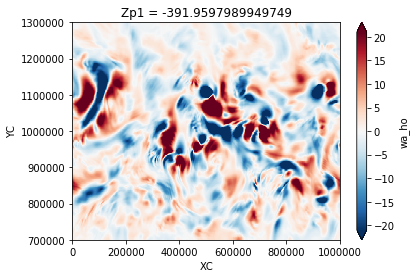

In [95]:
(dsw.wa_ho.sel(YC=slice(7e5,13e5))[3,26]*86400).plot(vmin=-21,vmax=21, cmap='RdBu_r')

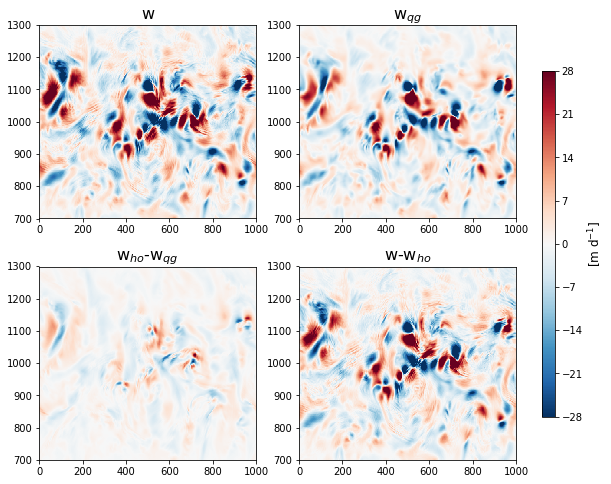

In [164]:
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(9,8))
# fig.set_tight_layout(True)
im = axes[0,0].pcolormesh(wintp.XC*1e-3, wintp.YC.sel(YC=slice(7e5,13e5))*1e-3, 
                         wintp.sel(YC=slice(7e5,13e5))[3,27]*86400, 
                         vmin=-28, vmax=28, cmap='RdBu_r', rasterized=True)
axes[0,1].pcolormesh(w_meso.XC*1e-3, w_meso.YC.sel(YC=slice(7e5,13e5))*1e-3, 
                    w_meso.sel(YC=slice(7e5,13e5))[3,27]*86400, 
                    vmin=-28, vmax=28, cmap='RdBu_r', rasterized=True)
# axes[0,1].pcolormesh(w_ho.XC*1e-3, w_ho.YC.sel(YC=slice(7e5,13e5))*1e-3, 
#                     w_ho.sel(YC=slice(7e5,13e5))[3,27]*86400, 
#                     vmin=-21, vmax=21, cmap='RdBu_r', rasterized=True)
axes[1,0].pcolormesh(w_meso.XC*1e-3, w_meso.YC.sel(YC=slice(7e5,13e5))*1e-3, 
                    (w_masm[3,27]-w_meso[3,27]).sel(YC=slice(7e5,13e5))*86400, 
                    vmin=-28, vmax=28, cmap='RdBu_r', rasterized=True)
axes[1,1].pcolormesh(wintp.XC*1e-3, wintp.YC.sel(YC=slice(7e5,13e5))*1e-3, 
                    (wintp[3,27] - w_sbms[3,27]).sel(YC=slice(7e5,13e5))*86400, 
                    vmin=-28, vmax=28, cmap='RdBu_r', rasterized=True)
# axes[0,0].set_ylabel(r"Y [km]", fontsize=13)
axes[0,0].set_title('w', fontsize=16)
# axes[0,1].set_title('w$_{qg}$', fontsize=16)
axes[0,1].set_title('w$_{qg}$', fontsize=16)
axes[1,0].set_title('w$_{ho}$-w$_{qg}$', fontsize=16)
axes[1,1].set_title('w-w$_{ho}$', fontsize=16)
fig.subplots_adjust(right=0.86, hspace=0.25)
cbar_ax = fig.add_axes([0.9, 0.2, 0.02, 0.6])
cbar = fig.colorbar(im, cax=cbar_ax, ticks=[-28,-21,-14,-7,0,7,14,21,28])
cbar.set_label(r'[m d$^{-1}$]', fontsize=12)
plt.savefig(op.join(ddir,'Dalma_Dar02km/Figures/womega1Dave_02km_Aug15_407m.pdf'))

/home/takaya/miniconda3/envs/uptodate/lib/python3.6/site-packages/matplotlib/figure.py:2299: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  warnings.warn("This figure includes Axes that are not compatible "


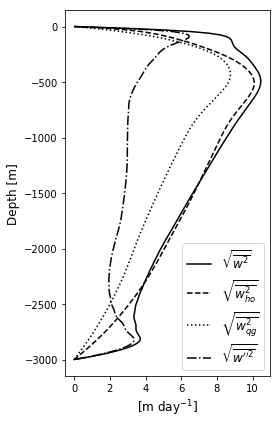

In [162]:
fig, ax = plt.subplots(figsize=(4,6))
fig.set_tight_layout(True)
ax.plot(np.sqrt((wintp.sel(YC=slice(7e5,13e5))[3]**2).mean(['YC','XC']))*86400, wintp.Zp1, 
        'k', label=r"$\sqrt{\overline{w^2}}$")
ax.plot(np.sqrt((dsw.wa_ho.sel(YC=slice(7e5,13e5))[3]**2).mean(['YC','XC']))*86400, dsw.Zp1, 
        'k--', label=r"$\sqrt{\overline{w_{ho}^2}}$")
ax.plot(np.sqrt((dsw.wa_qg.sel(YC=slice(7e5,13e5))[3]**2).mean(['YC','XC']))*86400, dsw.Zp1, 
        'k:', label=r"$\sqrt{\overline{w_{qg}^2}}$")
ax.plot(np.sqrt(((wintp-dsw.wa_ho).sel(YC=slice(7e5,13e5))[3]**2).mean(['YC','XC']))*86400, wintp.Zp1, 
        'k-.', label=r"$\sqrt{\overline{w''^2}}$")
ax.legend(loc='lower right', fontsize=12)
ax.set_xlabel(r"[m day$^{-1}$]", fontsize=12)
ax.set_ylabel(r"Depth [m]", fontsize=12)
plt.savefig(op.join(ddir,'Dalma_Dar02km/Figures/womega1Dave_02km_Aug15_profile.pdf'))

In [140]:
fe_sub = open_mdsdataset(op.join(ddir,'Dalma_Dar02km/runs'), 
#                      grid_dir=op.join(ddir,'02km_grid'),
                       iters=range(ts+2160,te+2160,int(2160*15)),
                       prefix=['PTRtave'],
                       delta_t=dt
                       ).TRAC03.sel(YC=slice(5.5e5,14.5e5))
func = pchip(np.abs(fe_sub.Z)[:50], fe_sub[:,:50], axis=1)
Feintp = xr.DataArray(func(np.abs(zPew)[:50]), dims=['time','Zp1','YC','XC'], 
                     coords={'time':fe_sub.time.data,'Zp1':zPew[:50],
                            'YC':fe_sub.YC.data,'XC':fe_sub.XC.data}
                     )
del func

/home/takaya/xmitgcm/xmitgcm/utils.py:314: UserWarning: Not sure what to do with rlev = L
  warnings.warn("Not sure what to do with rlev = " + rlev)
/home/takaya/xmitgcm/xmitgcm/mds_store.py:235: FutureWarning: iteration over an xarray.Dataset will change in xarray v0.11 to only include data variables, not coordinates. Iterate over the Dataset.variables property instead to preserve existing behavior in a forwards compatible manner.
  for vname in ds:


In [150]:
windowy = np.hanning(len(w_sub.YC))
with ProgressBar():
    w2JAS = xrft.power_spectrum((w_sub[:int(90*24),:50]*windowy[np.newaxis,np.newaxis,:,np.newaxis]
                                ).sel(YC=slice(8e5,12e5)),
                               dim=['XC'], density=False, detrend='constant'
                               ).mean(['time','YC']).compute()
    wm2JAS = xrft.power_spectrum(w_meso[:int(90*24)].sel(YC=slice(8e5,12e5)),
                                dim=['XC'], density=False, detrend='constant'
                                ).mean(['time','YC']).compute()
    ws2JAS = xrft.power_spectrum(w_sbms[:int(90*24)].sel(YC=slice(8e5,12e5)),
                                dim=['XC'], density=False, detrend='constant'
                                ).mean(['time','YC']).compute()
    wp2JAS = xrft.power_spectrum((wintp[:int(90*24),:50] - w_masm[:int(90*24)]).sel(YC=slice(8e5,12e5)),
                                dim=['XC'], density=False, detrend='constant'
                                ).mean(['time','YC']).compute()

[                                        ] | 0% Completed |  0.1s

/home/takaya/xrft/xrft/xrft.py:272: FutureWarning: xarray.DataArray.__contains__ currently checks membership in DataArray.coords, but in xarray v0.11 will change to check membership in array values.
  elif d in da:


[########################################] | 100% Completed |  6.4s
[                                        ] | 0% Completed |  0.1s

/home/takaya/xrft/xrft/xrft.py:272: FutureWarning: xarray.DataArray.__contains__ currently checks membership in DataArray.coords, but in xarray v0.11 will change to check membership in array values.
  elif d in da:


[########################################] | 100% Completed | 14.3s
[                                        ] | 0% Completed |  0.1s

/home/takaya/xrft/xrft/xrft.py:272: FutureWarning: xarray.DataArray.__contains__ currently checks membership in DataArray.coords, but in xarray v0.11 will change to check membership in array values.
  elif d in da:


[########################################] | 100% Completed | 25.7s
[####                                    ] | 12% Completed |  0.1s

/home/takaya/xrft/xrft/xrft.py:272: FutureWarning: xarray.DataArray.__contains__ currently checks membership in DataArray.coords, but in xarray v0.11 will change to check membership in array values.
  elif d in da:


[########################################] | 100% Completed | 16.0s


In [151]:
wp2JAS

<xarray.DataArray 'rechunk-merge-d870c8905ed48bc8eeccd538a5a2b403' (Zp1: 50, freq_XC: 500)>
array([[1.506664e-17, 1.438136e-17, 1.472925e-17, ..., 1.451778e-17,
        1.472925e-17, 1.438136e-17],
       [2.946640e-09, 3.423417e-09, 3.397603e-09, ..., 3.412829e-09,
        3.397603e-09, 3.423417e-09],
       [9.079179e-09, 9.940886e-09, 9.938426e-09, ..., 1.014207e-08,
        9.938426e-09, 9.940886e-09],
       ...,
       [7.783596e-10, 7.664155e-10, 7.488542e-10, ..., 7.696943e-10,
        7.488542e-10, 7.664155e-10],
       [7.801706e-10, 7.628749e-10, 7.517154e-10, ..., 7.602206e-10,
        7.517154e-10, 7.628749e-10],
       [8.154960e-10, 8.023649e-10, 7.988519e-10, ..., 7.853749e-10,
        7.988519e-10, 8.023649e-10]])
Coordinates:
  * Zp1              (Zp1) float64 0.0 -15.08 -30.15 -45.23 -60.3 -75.38 ...
  * freq_XC          (freq_XC) float64 -0.00025 -0.000249 -0.000248 ...
    freq_XC_spacing  float64 1e-06

/home/takaya/miniconda3/envs/uptodate/lib/python3.6/site-packages/matplotlib/contour.py:1544: UserWarning: Log scale: values of z <= 0 have been masked
  warnings.warn('Log scale: values of z <= 0 have been masked')
/home/takaya/miniconda3/envs/uptodate/lib/python3.6/site-packages/matplotlib/contour.py:1544: UserWarning: Log scale: values of z <= 0 have been masked
  warnings.warn('Log scale: values of z <= 0 have been masked')


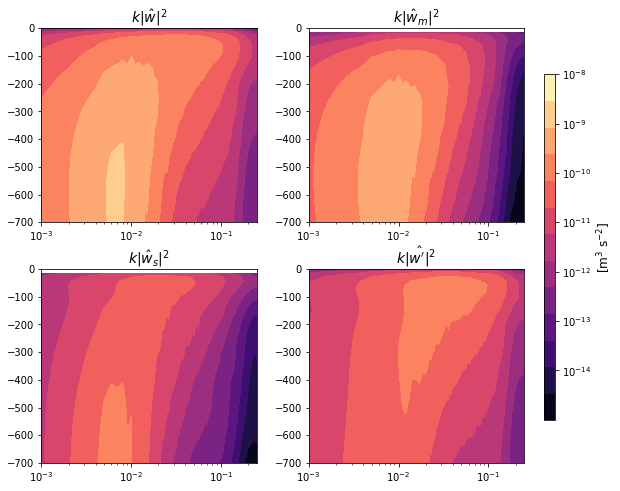

In [159]:
nk = 251
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(9,8))
im = axes[0,0].contourf(w2JAS.freq_XC[nk:]*1e3, w2JAS.Zl, w2JAS[:,nk:]*w2JAS.freq_XC[nk:],
                       cmap='magma', levels=np.logspace(-15,-8,14), norm=LogNorm())
axes[0,1].contourf(wm2JAS.freq_XC[nk:]*1e3, wm2JAS.Zp1, wm2JAS[:,nk:]*wm2JAS.freq_XC[nk:],
                  cmap='magma', levels=np.logspace(-15,-8,14), norm=LogNorm())
axes[1,0].contourf(ws2JAS.freq_XC[nk:]*1e3, ws2JAS.Zp1, ws2JAS[:,nk:]*ws2JAS.freq_XC[nk:],
                  cmap='magma', levels=np.logspace(-15,-8,14), norm=LogNorm())
axes[1,1].contourf(wp2JAS.freq_XC[nk:]*1e3, wp2JAS.Zp1, wp2JAS[:,nk:]*wp2JAS.freq_XC[nk:],
                  cmap='magma', levels=np.logspace(-15,-8,14), norm=LogNorm())
axes[0,0].set_xscale('log')
axes[0,1].set_xscale('log')
axes[1,0].set_xscale('log')
axes[1,1].set_xscale('log')
axes[0,0].set_ylim([-7e2,0])
axes[0,1].set_ylim([-7e2,0])
axes[1,0].set_ylim([-7e2,0])
axes[1,1].set_ylim([-7e2,0])
axes[0,1].set_xlim([1e-3,2.5e-1])
axes[1,0].set_xlim([1e-3,2.5e-1])
axes[1,0].set_xlim([1e-3,2.5e-1])
axes[1,1].set_xlim([1e-3,2.5e-1])
axes[0,0].set_title(r"$k|\hat{w}|^2$", fontsize=14)
axes[0,1].set_title(r"$k|\hat{w}_m|^2$", fontsize=14)
axes[1,0].set_title(r"$k|\hat{w}_s|^2$", fontsize=14)
axes[1,1].set_title(r"$k|\hat{w'}|^2$", fontsize=14)
# ax1.set_ylabel(r"Depth [m]", fontsize=12)
# ax2.set_xlabel(r"k [cpkm]", fontsize=12)
fig.subplots_adjust(right=0.87, hspace=0.24, wspace=0.24)
cbar_ax = fig.add_axes([0.9, 0.2, 0.018, 0.6])
cbar = fig.colorbar(im, cax=cbar_ax, ticks=[1e-14,1e-13,1e-12,1e-11,1e-10,1e-9,1e-8])
cbar.set_label(r"[m$^{3}$ s$^{-2}$]", fontsize=12)
plt.savefig(op.join(ddir,'Dalma_Dar02km/Figures/wk2-decomp_JAS_02km.pdf'))

In [154]:
windowy = np.hanning(len(w_sub.YC))
with ProgressBar():
    wFeJAS = xrft.cross_spectrum((w_sub[:int(90*24)]*windowy[np.newaxis,np.newaxis,:,np.newaxis]
                                 ).sel(YC=slice(8e5,12e5)), 
                                (grid.interp(fe_sub,'Z',boundary='fill').sel(YC=slice(5.5e5,14.5e5))[:int(90*24),:]
                                * windowy[np.newaxis,np.newaxis,:,np.newaxis]).sel(YC=slice(8e5,12e5)),
                                dim=['XC'], density=False, detrend='constant'
                                ).mean(['time','YC']).compute()
    wmFeJAS = xrft.cross_spectrum(w_meso[:int(90*24)].sel(YC=slice(8e5,12e5)),
                                 (Feintp[:int(90*24)]
                                 * windowy[np.newaxis,np.newaxis,:,np.newaxis]).sel(YC=slice(8e5,12e5)),
                                 dim=['XC'], density=False, detrend='constant'
                                 ).mean(['time','YC']).compute()
    wsFeJAS = xrft.cross_spectrum(w_sbms[:int(90*24)].sel(YC=slice(8e5,12e5)),
                                 (Feintp[:int(90*24)]
                                 * windowy[np.newaxis,np.newaxis,:,np.newaxis]).sel(YC=slice(8e5,12e5)),
                                 dim=['XC'], density=False, detrend='constant'
                                 ).mean(['time','YC']).compute()
    wpFeJAS = xrft.cross_spectrum((wintp[:int(90*24)]*windowy[np.newaxis,np.newaxis,:,np.newaxis]
                                  - w_masm[:int(90*24)]).sel(YC=slice(8e5,12e5)),
                                 (Feintp[:int(90*24)]
                                 * windowy[np.newaxis,np.newaxis,:,np.newaxis]).sel(YC=slice(8e5,12e5)),
                                 dim=['XC'], density=False, detrend='constant'
                                 ).mean(['time','YC']).compute()

[                                        ] | 0% Completed |  0.1s

/home/takaya/xrft/xrft/xrft.py:272: FutureWarning: xarray.DataArray.__contains__ currently checks membership in DataArray.coords, but in xarray v0.11 will change to check membership in array values.
  elif d in da:
/home/takaya/xrft/xrft/xrft.py:272: FutureWarning: xarray.DataArray.__contains__ currently checks membership in DataArray.coords, but in xarray v0.11 will change to check membership in array values.
  elif d in da:


[########################################] | 100% Completed | 15.7s


/home/takaya/xrft/xrft/xrft.py:272: FutureWarning: xarray.DataArray.__contains__ currently checks membership in DataArray.coords, but in xarray v0.11 will change to check membership in array values.
  elif d in da:
/home/takaya/xrft/xrft/xrft.py:272: FutureWarning: xarray.DataArray.__contains__ currently checks membership in DataArray.coords, but in xarray v0.11 will change to check membership in array values.
  elif d in da:


[########################################] | 100% Completed | 14.1s


/home/takaya/xrft/xrft/xrft.py:272: FutureWarning: xarray.DataArray.__contains__ currently checks membership in DataArray.coords, but in xarray v0.11 will change to check membership in array values.
  elif d in da:
/home/takaya/xrft/xrft/xrft.py:272: FutureWarning: xarray.DataArray.__contains__ currently checks membership in DataArray.coords, but in xarray v0.11 will change to check membership in array values.
  elif d in da:


[########################################] | 100% Completed | 25.5s


/home/takaya/xrft/xrft/xrft.py:272: FutureWarning: xarray.DataArray.__contains__ currently checks membership in DataArray.coords, but in xarray v0.11 will change to check membership in array values.
  elif d in da:
/home/takaya/xrft/xrft/xrft.py:272: FutureWarning: xarray.DataArray.__contains__ currently checks membership in DataArray.coords, but in xarray v0.11 will change to check membership in array values.
  elif d in da:


[########################################] | 100% Completed | 16.3s


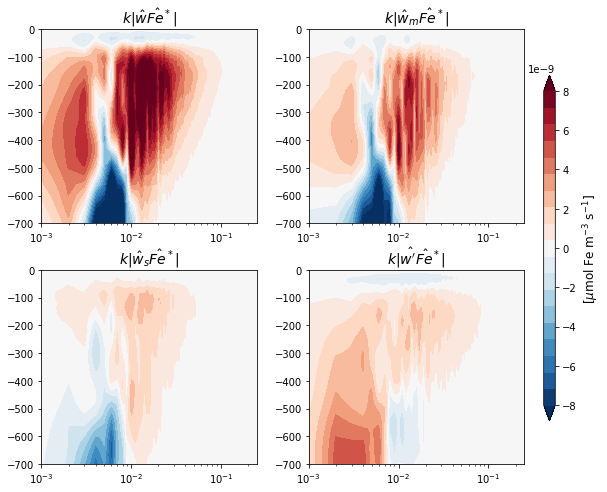

In [158]:
nk = 251
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(9,8))
im = axes[0,0].contourf(wFeJAS.freq_XC[nk:]*1e3, wFeJAS.Zl, wFeJAS[:,nk:]*wFeJAS.freq_XC[nk:]*1e3,
                       cmap='RdBu_r', levels=1e3*np.linspace(-8e-12,8e-12,20), extend='both')
axes[0,1].contourf(wmFeJAS.freq_XC[nk:]*1e3, wmFeJAS.Zp1, wmFeJAS[:,nk:]*wmFeJAS.freq_XC[nk:]*1e3,
                  cmap='RdBu_r', levels=1e3*np.linspace(-8e-12,8e-12,20), extend='both')
axes[1,0].contourf(wsFeJAS.freq_XC[nk:]*1e3, wsFeJAS.Zp1, wsFeJAS[:,nk:]*wsFeJAS.freq_XC[nk:]*1e3,
                  cmap='RdBu_r', levels=1e3*np.linspace(-8e-12,8e-12,20), extend='both')
axes[1,1].contourf(wpFeJAS.freq_XC[nk:]*1e3, wpFeJAS.Zp1, wpFeJAS[:,nk:]*wpFeJAS.freq_XC[nk:]*1e3,
                  cmap='RdBu_r', levels=1e3*np.linspace(-8e-12,8e-12,20), extend='both')
axes[0,0].set_xscale('log')
axes[0,1].set_xscale('log')
axes[1,0].set_xscale('log')
axes[1,1].set_xscale('log')
axes[0,0].set_ylim([-7e2,0])
axes[0,1].set_ylim([-7e2,0])
axes[1,0].set_ylim([-7e2,0])
axes[1,1].set_ylim([-7e2,0])
axes[0,1].set_xlim([1e-3,2.5e-1])
axes[1,0].set_xlim([1e-3,2.5e-1])
axes[1,0].set_xlim([1e-3,2.5e-1])
axes[1,1].set_xlim([1e-3,2.5e-1])
axes[0,0].set_title(r"$k|\hat{w} \hat{Fe}^*$|", fontsize=14)
axes[0,1].set_title(r"$k|\hat{w}_m \hat{Fe}^*|$", fontsize=14)
axes[1,0].set_title(r"$k|\hat{w}_s \hat{Fe}^*|$", fontsize=14)
axes[1,1].set_title(r"$k|\hat{w'}\hat{Fe}^*|$", fontsize=14)
# ax1.set_ylabel(r"Depth [m]", fontsize=12)
# ax2.set_xlabel(r"k [cpkm]", fontsize=12)
fig.subplots_adjust(right=0.87, hspace=0.24, wspace=.24)
cbar_ax = fig.add_axes([0.9, 0.2, 0.018, 0.6])
cbar = fig.colorbar(im, cax=cbar_ax, 
                   ticks=1e3*np.array([-8e-12,-6e-12,-4e-12,-2e-12,0,2e-12,4e-12,6e-12,8e-12]))
cbar.set_label(r"[$\mu$mol Fe m$^{-3}$ s$^{-1}$]", fontsize=12)
plt.savefig(op.join(ddir,'Dalma_Dar02km/Figures/wkFek-decomp_JAS_02km.pdf'))

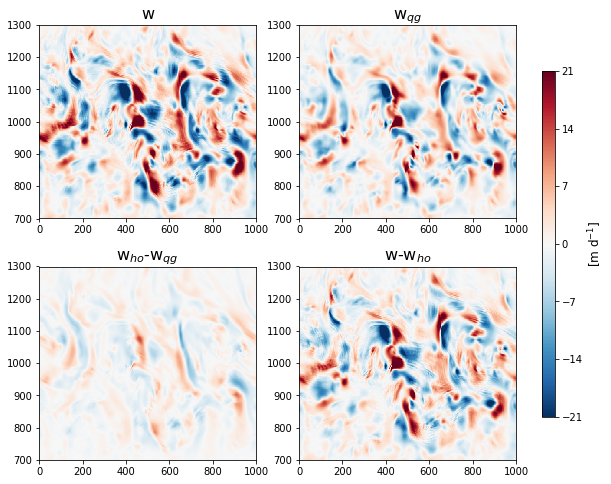

In [133]:
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(9,8))
# fig.set_tight_layout(True)
im = axes[0,0].pcolormesh(wintp.XC*1e-3, wintp.YC.sel(YC=slice(7e5,13e5))*1e-3, 
                         wintp.sel(YC=slice(7e5,13e5))[15,27]*86400, 
                         vmin=-21, vmax=21, cmap='RdBu_r', rasterized=True)
axes[0,1].pcolormesh(w_meso.XC*1e-3, w_meso.YC.sel(YC=slice(7e5,13e5))*1e-3, 
                    w_meso.sel(YC=slice(7e5,13e5))[15,27]*86400, 
                    vmin=-21, vmax=21, cmap='RdBu_r', rasterized=True)
# axes[0,1].pcolormesh(w_ho.XC*1e-3, w_ho.YC.sel(YC=slice(7e5,13e5))*1e-3, 
#                     w_ho.sel(YC=slice(7e5,13e5))[3,27]*86400, 
#                     vmin=-21, vmax=21, cmap='RdBu_r', rasterized=True)
axes[1,0].pcolormesh(w_meso.XC*1e-3, w_meso.YC.sel(YC=slice(7e5,13e5))*1e-3, 
                    (w_masm[15,27]-w_meso[15,27]).sel(YC=slice(7e5,13e5))*86400, 
                    vmin=-21, vmax=21, cmap='RdBu_r', rasterized=True)
axes[1,1].pcolormesh(wintp.XC*1e-3, wintp.YC.sel(YC=slice(7e5,13e5))*1e-3, 
                    (wintp[15,27] - w_sbms[15,27]).sel(YC=slice(7e5,13e5))*86400, 
                    vmin=-21, vmax=21, cmap='RdBu_r', rasterized=True)
# axes[0,0].set_ylabel(r"Y [km]", fontsize=13)
axes[0,0].set_title('w', fontsize=16)
# axes[0,1].set_title('w$_{qg}$', fontsize=16)
axes[0,1].set_title('w$_{qg}$', fontsize=16)
axes[1,0].set_title('w$_{ho}$-w$_{qg}$', fontsize=16)
axes[1,1].set_title('w-w$_{ho}$', fontsize=16)
fig.subplots_adjust(right=0.86, hspace=0.25)
cbar_ax = fig.add_axes([0.9, 0.2, 0.02, 0.6])
cbar = fig.colorbar(im, cax=cbar_ax, ticks=[-21,-14,-7,0,7,14,21])
cbar.set_label(r'[m d$^{-1}$]', fontsize=12)
plt.savefig(op.join(ddir,'Dalma_Dar02km/Figures/womega1Dave_02km_Feb15_407m.pdf'))

/home/takaya/miniconda3/envs/uptodate/lib/python3.6/site-packages/matplotlib/figure.py:2299: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  warnings.warn("This figure includes Axes that are not compatible "


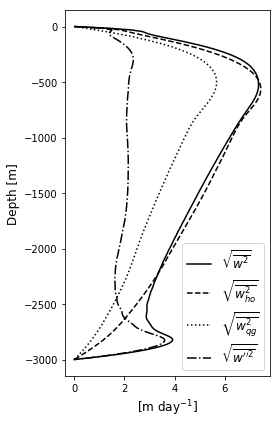

In [134]:
fig, ax = plt.subplots(figsize=(4,6))
fig.set_tight_layout(True)
ax.plot(np.sqrt((wintp.sel(YC=slice(7e5,13e5))[15]**2).mean(['YC','XC']))*86400, wintp.Zp1, 
        'k', label=r"$\sqrt{\overline{w^2}}$")
ax.plot(np.sqrt((dsw.wa_ho.sel(YC=slice(7e5,13e5))[15]**2).mean(['YC','XC']))*86400, dsw.Zp1, 
        'k--', label=r"$\sqrt{\overline{w_{ho}^2}}$")
ax.plot(np.sqrt((dsw.wa_qg.sel(YC=slice(7e5,13e5))[15]**2).mean(['YC','XC']))*86400, dsw.Zp1, 
        'k:', label=r"$\sqrt{\overline{w_{qg}^2}}$")
ax.plot(np.sqrt(((wintp-dsw.wa_ho).sel(YC=slice(7e5,13e5))[15]**2).mean(['YC','XC']))*86400, wintp.Zp1, 
        'k-.', label=r"$\sqrt{\overline{w''^2}}$")
ax.legend(loc='lower right', fontsize=12)
ax.set_xlabel(r"[m day$^{-1}$]", fontsize=12)
ax.set_ylabel(r"Depth [m]", fontsize=12)
plt.savefig('/swot/SUM01/takaya/Figures/womega1Dave_02km_Feb15_profile.pdf')

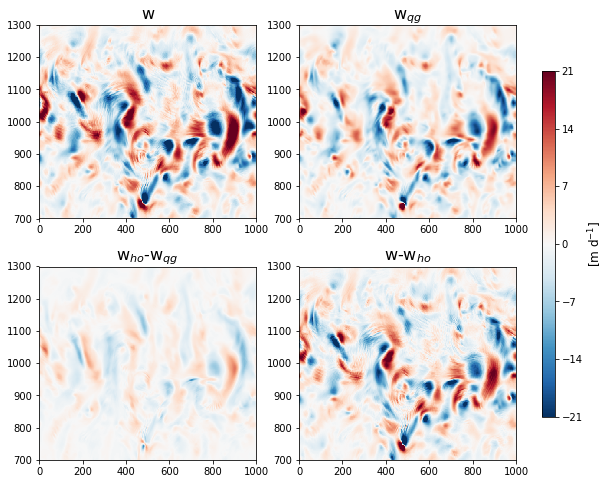

In [135]:
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(9,8))
# fig.set_tight_layout(True)
im = axes[0,0].pcolormesh(wintp.XC*1e-3, wintp.YC.sel(YC=slice(7e5,13e5))*1e-3, 
                         wintp.sel(YC=slice(7e5,13e5))[-1,27]*86400, 
                         vmin=-21, vmax=21, cmap='RdBu_r', rasterized=True)
axes[0,1].pcolormesh(w_meso.XC*1e-3, w_meso.YC.sel(YC=slice(7e5,13e5))*1e-3, 
                    w_meso.sel(YC=slice(7e5,13e5))[-1,27]*86400, 
                    vmin=-21, vmax=21, cmap='RdBu_r', rasterized=True)
# axes[0,1].pcolormesh(w_ho.XC*1e-3, w_ho.YC.sel(YC=slice(7e5,13e5))*1e-3, 
#                     w_ho.sel(YC=slice(7e5,13e5))[3,27]*86400, 
#                     vmin=-21, vmax=21, cmap='RdBu_r', rasterized=True)
axes[1,0].pcolormesh(w_meso.XC*1e-3, w_meso.YC.sel(YC=slice(7e5,13e5))*1e-3, 
                    (w_masm[-1,27]-w_meso[-1,27]).sel(YC=slice(7e5,13e5))*86400, 
                    vmin=-21, vmax=21, cmap='RdBu_r', rasterized=True)
axes[1,1].pcolormesh(wintp.XC*1e-3, wintp.YC.sel(YC=slice(7e5,13e5))*1e-3, 
                    (wintp[-1,27] - w_sbms[-1,27]).sel(YC=slice(7e5,13e5))*86400, 
                    vmin=-21, vmax=21, cmap='RdBu_r', rasterized=True)
# axes[0,0].set_ylabel(r"Y [km]", fontsize=13)
axes[0,0].set_title('w', fontsize=16)
# axes[0,1].set_title('w$_{qg}$', fontsize=16)
axes[0,1].set_title('w$_{qg}$', fontsize=16)
axes[1,0].set_title('w$_{ho}$-w$_{qg}$', fontsize=16)
axes[1,1].set_title('w-w$_{ho}$', fontsize=16)
fig.subplots_adjust(right=0.86, hspace=0.25)
cbar_ax = fig.add_axes([0.9, 0.2, 0.02, 0.6])
cbar = fig.colorbar(im, cax=cbar_ax, ticks=[-21,-14,-7,0,7,14,21])
cbar.set_label(r'[m d$^{-1}$]', fontsize=12)
# plt.savefig(op.join(ddir,'Dalma_Dar02km/Figures/womega1Dave_02km_Feb15_407m.pdf'))

Text(0,0.5,'Depth [m]')

/home/takaya/miniconda3/envs/uptodate/lib/python3.6/site-packages/matplotlib/figure.py:2299: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  warnings.warn("This figure includes Axes that are not compatible "


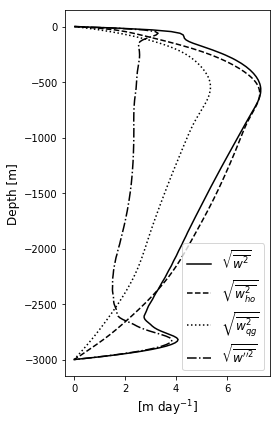

In [136]:
fig, ax = plt.subplots(figsize=(4,6))
fig.set_tight_layout(True)
ax.plot(np.sqrt((wintp.sel(YC=slice(7e5,13e5))[-1]**2).mean(['YC','XC']))*86400, wintp.Zp1, 
        'k', label=r"$\sqrt{\overline{w^2}}$")
ax.plot(np.sqrt((dsw.wa_ho.sel(YC=slice(7e5,13e5))[-1]**2).mean(['YC','XC']))*86400, dsw.Zp1, 
        'k--', label=r"$\sqrt{\overline{w_{ho}^2}}$")
ax.plot(np.sqrt((dsw.wa_qg.sel(YC=slice(7e5,13e5))[-1]**2).mean(['YC','XC']))*86400, dsw.Zp1, 
        'k:', label=r"$\sqrt{\overline{w_{qg}^2}}$")
ax.plot(np.sqrt(((wintp-dsw.wa_ho).sel(YC=slice(7e5,13e5))[-1]**2).mean(['YC','XC']))*86400, wintp.Zp1, 
        'k-.', label=r"$\sqrt{\overline{w''^2}}$")
ax.legend(loc='lower right', fontsize=12)
ax.set_xlabel(r"[m day$^{-1}$]", fontsize=12)
ax.set_ylabel(r"Depth [m]", fontsize=12)
# plt.savefig('/swot/SUM01/takaya/Figures/womega1Dave_02km_Feb15_profile.pdf')

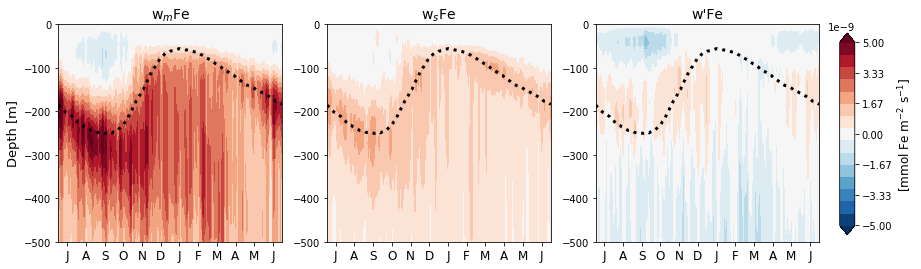

In [128]:
nys, nyn = (11e5,14e5)
dx = 5e3
month = ['J','F','M','A','M','J','J','A','S','O','N','D']
fig, (ax1,ax2,ax3) = plt.subplots(nrows=1, ncols=3, figsize=(14,4))
# fig.set_tight_layout(True)
im = ax1.contourf(range(0,360), wmFe_100_days.Zp1, wmFe_100_days.T.roll(days=-180)/dx, 
                 levels=np.linspace(-5e-9,5e-9,16), extend='both', cmap='RdBu_r')
# ax1.contour(range(0,360,15), wpbp_d.Zl, wpbp_d.T.roll(days=-12), colors='k', levels=np.linspace(2e-9,2e-8,8))
ax2.contourf(range(0,360), wsFe_100_days.Zp1, wsFe_100_days.T.roll(days=-180)/dx, 
            levels=np.linspace(-5e-9,5e-9,16), extend='both', cmap='RdBu_r')
# ax2.contour(range(0,360,15), wpbp_d.Zl, wpbp_d.T.roll(days=-12), colors='k', levels=np.linspace(2e-9,2e-8,8))
# ax3.pcolormesh(range(360), dfz_c.Zl, ((dfz_c-adz_c)/diff_M).T.roll(days=-180), 
#                vmax=1, vmin=-1., cmap='RdBu_r', norm=SymLogNorm(0.01), rasterized=True)
ax3.contourf(range(0,360), wpFe_100_days.Zp1, wpFe_100_days.T.roll(days=-180)/dx, 
            levels=np.linspace(-5e-9,5e-9,16), extend='both', cmap='RdBu_r')
ax1.plot(range(360), -MXLD.sel(YC=slice(nys,nyn)).mean(['YC']).roll(day=-180), 
        ls=':', lw=3, color='k')
ax2.plot(range(360), -MXLD.sel(YC=slice(nys,nyn)).mean(['YC']).roll(day=-180), 
        ls=':', lw=3, color='k')
ax3.plot(range(360), -MXLD.sel(YC=slice(nys,nyn)).mean(['YC']).roll(day=-180), 
        ls=':', lw=3, color='k')
ax1.set_ylim([-5e2,0])
ax2.set_ylim([-5e2,0])
ax3.set_ylim([-5e2,0])
ax1.set_xlim([0,359])
ax2.set_xlim([0,359])
ax3.set_xlim([0,359])
ax1.set_title(r"w$_m$Fe", fontsize=14)
ax2.set_title(r"w$_s$Fe", fontsize=14)
ax3.set_title(r"w'Fe", fontsize=14)
ax1.set_xticks(np.linspace(14,344,12))
ax1.set_xticklabels(np.roll(np.array(month),-6), fontsize=12)
ax2.set_xticks(np.linspace(14,344,12))
ax2.set_xticklabels(np.roll(np.array(month),-6), fontsize=12)
ax3.set_xticks(np.linspace(14,344,12))
ax3.set_xticklabels(np.roll(np.array(month),-6), fontsize=12)
ax1.set_ylabel(r"Depth [m]", fontsize=13)
# ax2.set_xlabel(r"Month", fontsize=13)
fig.subplots_adjust(right=0.88)
cbar_ax = fig.add_axes([0.9, 0.15, 0.015, 0.7])
cbar = fig.colorbar(im, cax=cbar_ax, ticks=[-5e-9,-3.33e-9,-1.67e-9,0,1.67e-9,3.33e-9,5e-9])
cbar.set_label(r"[mmol Fe m$^{-2}$ s$^{-1}$]", fontsize=12)
plt.savefig(op.join(bdir,'Figures/wFe_below100km_dailyclimatology_05km.pdf'))

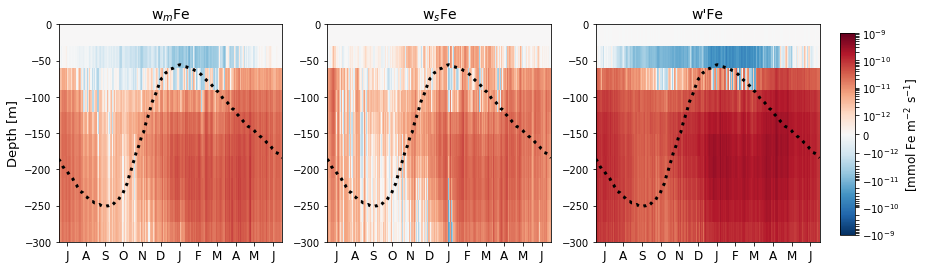

In [31]:
fig, (ax1,ax2,ax3) = plt.subplots(nrows=1, ncols=3, figsize=(14,4))
# fig.set_tight_layout(True)
im = ax1.pcolormesh(range(0,360), wmFe_25_days.Zp1, wmFe_25_days.T.roll(days=-12), 
                  norm=SymLogNorm(linthresh=1e-12, vmax=1e-9, vmin=-1e-9), cmap='RdBu_r')
# ax1.contour(range(0,360,15), wpbp_d.Zl, wpbp_d.T.roll(days=-12), colors='k', levels=np.linspace(2e-9,2e-8,8))
ax2.pcolormesh(range(0,360), wsFe_25_days.Zp1, wsFe_25_days.T.roll(days=-12), 
              norm=SymLogNorm(linthresh=1e-12, vmax=1e-9, vmin=-1e-9), cmap='RdBu_r')
# ax2.contour(range(0,360,15), wpbp_d.Zl, wpbp_d.T.roll(days=-12), colors='k', levels=np.linspace(2e-9,2e-8,8))
# ax3.pcolormesh(range(360), dfz_c.Zl, ((dfz_c-adz_c)/diff_M).T.roll(days=-180), 
#                vmax=1, vmin=-1., cmap='RdBu_r', norm=SymLogNorm(0.01), rasterized=True)
ax3.pcolormesh(range(0,360), wpFe_25_days.Zp1, wpFe_25_days.T.roll(days=-12), 
              norm=SymLogNorm(linthresh=1e-12, vmax=1e-9, vmin=-1e-9), cmap='RdBu_r')
ax1.plot(range(360), -MXLD.sel(YC=slice(nys,nyn)).mean(['YC']).roll(day=-180), 
        ls=':', lw=3, color='k')
ax2.plot(range(360), -MXLD.sel(YC=slice(nys,nyn)).mean(['YC']).roll(day=-180), 
        ls=':', lw=3, color='k')
ax3.plot(range(360), -MXLD.sel(YC=slice(nys,nyn)).mean(['YC']).roll(day=-180), 
        ls=':', lw=3, color='k')
ax1.set_ylim([-3e2,0])
ax2.set_ylim([-3e2,0])
ax3.set_ylim([-3e2,0])
ax1.set_xlim([0,359])
ax2.set_xlim([0,359])
ax3.set_xlim([0,359])
ax1.set_title(r"w$_m$Fe", fontsize=14)
ax2.set_title(r"w$_s$Fe", fontsize=14)
ax3.set_title(r"w'Fe", fontsize=14)
ax1.set_xticks(np.linspace(14,344,12))
ax1.set_xticklabels(np.roll(np.array(month),-6), fontsize=12)
ax2.set_xticks(np.linspace(14,344,12))
ax2.set_xticklabels(np.roll(np.array(month),-6), fontsize=12)
ax3.set_xticks(np.linspace(14,344,12))
ax3.set_xticklabels(np.roll(np.array(month),-6), fontsize=12)
ax1.set_ylabel(r"Depth [m]", fontsize=13)
# ax2.set_xlabel(r"Month", fontsize=13)
fig.subplots_adjust(right=0.88)
cbar_ax = fig.add_axes([0.9, 0.15, 0.015, 0.7])
cbar = fig.colorbar(im, cax=cbar_ax)
cbar.set_label(r"[mmol Fe m$^{-2}$ s$^{-1}$]", fontsize=12)
plt.savefig(op.join(pdir,'Figures/wFe_below025km_dailyclimatology_05km.pdf'))

In [25]:
5000-36*138

32

In [26]:
79*36+28

2872